<a href="https://colab.research.google.com/github/KarnikaSingh/BME/blob/master/PD_Analysis_ogtt.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')


Mounted at /content/gdrive


In [2]:
#Make a model for PPGR prediction using wearable, CGM and clinical features as in mendes-soares et. al

In [3]:
#comment
# We employed several metrics to assess the performance of our models: root-mean-square error (RMSE),
# proportion of predicted values within 5% or 10% of actual glucose values, and Spearman’s rank correlation coefficient (rho) (S2 File).
# Bootstrapping was performed to obtain 95% confidence intervals for each of these metrics [26].
# In addition, we used error grids that are classically used for assessment of blood glucose monitor safety
#  (i.e., surveillance error grid, Parkes error grid) to evaluate the safety of our glucose prediction models [27, 28].
#  Last, we performed several sensitivity analysis in our main study population by stratifying model performance for:
# (1) GMS (i.e., separate results for NGM and prediabetes); (2) day (06.00 to 24.00h) and night (24.00 to 06.00h);
# and (3) low or high glucose variability, defined as the 97.5th percentile of CGM-assessed SD in individuals with NGM (SD > 1.37 mmol/L) [14].

In [4]:
import pandas as pd
import numpy as np
import datetime as dt
import warnings
import matplotlib
from scipy.integrate import trapz
warnings.filterwarnings("ignore")

In [5]:
# ref:
# https://cdn.jamanetwork.com/ama/content_public/journal/jamanetworkopen/937802/zoi180337supp1_prod.pdf?Expires=1707339734&Signature=sgqwTWm9EZzOiYtWMwl0~o9SjRTwPeIF56dBa1X6CsSNPKL0u85bJtbd5XpTyrGCFUlvwfDcRv1gevyiMak5ljPmUMaElssQiqrQoS1n~POeT8yCBrbuQFDS86WlKhu6j8ovljLVCpsqhR8rqNhHgbDVPy8hsDwHTv~sjO66YdOKoEG3bWeZiHdPvfQ416y8QM2g9oy6rsj0UTHtdfqqPZwrmIsW16vIceZ6oy1odruMt0U5AAUn2a3d-cxb9baZgWGo~vXqG7Oq0-MW7mHfMdPpl7jHx~mbjG3H92KuicltMcEE3gGJOCsT9NV75Lb9kYKXdx3woYeXduscGOpUAQ__&Key-Pair-Id=APKAIE5G5CRDK6RD3PGA

In [6]:
#  !unzip "/content/gdrive/My Drive/MyFitbitData.zip"

In [7]:

# mind_one=pd.read_csv('ParticipantaaaeDiabeteswatch/Stress/Mindfulness Eda Data Sessions.csv')
# mind_one.head(40)

In [8]:


# stress_one=pd.read_csv('ParticipantaaaeDiabeteswatch/Stress/Stress Score.csv')
# stress_one.head(40)

In [9]:

# eda_one=pd.read_csv('ParticipantaaaeDiabeteswatch/Stress/CEDA Data 2024-02-14.csv')
# eda_one.tail(40)

In [10]:
 !unzip "/content/gdrive/My Drive/PD Project/Wearables + CGM data.zip"

Archive:  /content/gdrive/My Drive/PD Project/Wearables + CGM data.zip
  inflating: Wearables + CGM data/Meta_data.xlsx  
  inflating: Wearables + CGM data/001/ACC.csv  
  inflating: Wearables + CGM data/001/BVP.csv  
  inflating: Wearables + CGM data/001/Dexcom.csv  
  inflating: Wearables + CGM data/001/EDA.csv  
  inflating: Wearables + CGM data/001/HR.csv  
  inflating: Wearables + CGM data/001/IBI.csv  
  inflating: Wearables + CGM data/001/TEMP.csv  
  inflating: Wearables + CGM data/002/ACC.csv  
  inflating: Wearables + CGM data/002/BVP.csv  
  inflating: Wearables + CGM data/002/Dexcom.csv  
  inflating: Wearables + CGM data/002/EDA.csv  
  inflating: Wearables + CGM data/002/HR.csv  
  inflating: Wearables + CGM data/002/IBI.csv  
  inflating: Wearables + CGM data/002/TEMP.csv  
  inflating: Wearables + CGM data/003/ACC.csv  
  inflating: Wearables + CGM data/003/BVP.csv  
  inflating: Wearables + CGM data/003/Dexcom.csv  
  inflating: Wearables + CGM data/003/EDA.csv  
  inf

In [11]:
 !unzip "/content/gdrive/My Drive/PD Project/Food Logs.zip"

Archive:  /content/gdrive/My Drive/PD Project/Food Logs.zip
  inflating: Food Logs/19-003.xlsx   
  inflating: Food Logs/19-005.xlsx   
  inflating: Food Logs/19-001.xlsx   
  inflating: Food Logs/19-006.xlsx   
  inflating: Food Logs/19-008.xlsx   
  inflating: Food Logs/19-007.xlsx   
  inflating: Food Logs/19-004.xlsx   
  inflating: Food Logs/19-002.xlsx   
  inflating: Food Logs/19-009.xlsx   
  inflating: Food Logs/19-010.xlsx   
  inflating: Food Logs/19-011.xlsx   
  inflating: Food Logs/19-012.xlsx   
  inflating: Food Logs/19-013.xlsx   
  inflating: Food Logs/19-014.xlsx   
  inflating: Food Logs/19-015.xlsx   
  inflating: Food Logs/19-016.xlsx   
  inflating: Food Logs/Food Log/006_foodlog.docx  
  inflating: Food Logs/Food Log/Food log  for 0020 and 0022.pdf  
  inflating: Food Logs/Food Log/FoodDiary_023.docx  
  inflating: Food Logs/Food Log/Food_Log_001.xlsx  
  inflating: Food Logs/Food Log/Food_Log_002.xlsx  
  inflating: Food Logs/Food Log/Food_Log_003.xlsx  
  infl

In [12]:
!unzip "/content/gdrive/My Drive/PD Project/big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0 (2).zip"

Archive:  /content/gdrive/My Drive/PD Project/big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0 (2).zip
  inflating: big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/001/ACC_001.csv  
  inflating: big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/001/BVP_001.csv  
  inflating: big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/001/Dexcom_001.csv  
  inflating: big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/001/EDA_001.csv  
  inflating: big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/001/Food_Log_001.csv  
  inflating: big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/001/HR_001.csv  
  inflating: big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/001/IBI_001.csv  
  inflating: big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/001/TEMP_001.csv  
  inflating: big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/002/ACC_002.csv  

In [13]:
import pandas as pd
import datetime as datetime
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.nonparametric.smoothers_lowess import lowess

def importdexcom(filename):
    """
        Imports data from Dexcom continuous glucose monitor devices
        Args:
            filename (String): path to file
        Returns:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
    """
    data = pd.read_csv(filename)
    df = pd.DataFrame()
    df['Time'] = data['Timestamp (YYYY-MM-DDThh:mm:ss)']
    df['Glucose'] = pd.to_numeric(data['Glucose Value (mg/dL)'])
    df.drop(df.index[:12], inplace=True)
    df['Time'] =  pd.to_datetime(df['Time'], format='%Y-%m-%dT%H:%M:%S')
    df['Day'] = df['Time'].dt.date
    df = df.reset_index()
    return df


def interdaycv(df):
    """
        Computes and returns the interday coefficient of variation of glucose
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
        Returns:
            cvx (float): interday coefficient of variation averaged over all days

    """
    cvx = (np.std(df['Glucose']) / (np.mean(df['Glucose'])))*100
    return cvx

def interdaysd(df):
    """
        Computes and returns the interday standard deviation of glucose
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
        Returns:
            interdaysd (float): interday standard deviation averaged over all days

    """
    interdaysd = np.std(df['Glucose'])
    return interdaysd

def intradaycv(df):
    """
        Computes and returns the intraday coefficient of variation of glucose
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
        Returns:
            intradaycv_mean (float): intraday coefficient of variation averaged over all days
            intradaycv_medan (float): intraday coefficient of variation median over all days
            intradaycv_sd (float): intraday coefficient of variation standard deviation over all days

    """
    intradaycv = []
    for i in pd.unique(df['Day']):
        intradaycv.append(interdaycv(df[df['Day']==i]))

    intradaycv_mean = np.mean(intradaycv)
    intradaycv_median = np.median(intradaycv)
    intradaycv_sd = np.std(intradaycv)

    return intradaycv_mean, intradaycv_median, intradaycv_sd


def intradaysd(df):
    """
        Computes and returns the intraday standard deviation of glucose
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
        Returns:
            intradaysd_mean (float): intraday standard deviation averaged over all days
            intradaysd_medan (float): intraday standard deviation median over all days
            intradaysd_sd (float): intraday standard deviation standard deviation over all days

    """
    intradaysd =[]

    for i in pd.unique(df['Day']):
        intradaysd.append(np.std(df[df['Day']==i]))

    intradaysd_mean = np.mean(intradaysd)
    intradaysd_median = np.median(intradaysd)
    intradaysd_sd = np.std(intradaysd)
    return intradaysd_mean, intradaysd_median, intradaysd_sd

def TIR(df, sd=1, sr=5):
    """
        Computes and returns the time in range
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
            sd (integer): standard deviation for computing range (default=1)
            sr (integer): sampling rate (default=5[minutes, once every 5 minutes glucose is recorded])
        Returns:
            TIR (float): time in range, units=minutes

    """
    up = np.mean(df['Glucose']) + sd*np.std(df['Glucose'])
    dw = np.mean(df['Glucose']) - sd*np.std(df['Glucose'])
    TIR = len(df[(df['Glucose']<= up) & (df['Glucose']>= dw)])*sr
    return TIR

def TOR(df, sd=1, sr=5):
    """
        Computes and returns the time outside range
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
            sd (integer): standard deviation for computing  range (default=1)
            sr (integer): sampling rate (default=5[minutes, once every 5 minutes glucose is recorded])
        Returns:
            TOR (float): time outside range, units=minutes

    """
    up = np.mean(df['Glucose']) + sd*np.std(df['Glucose'])
    dw = np.mean(df['Glucose']) - sd*np.std(df['Glucose'])
    TOR = len(df[(df['Glucose']>= up) | (df['Glucose']<= dw)])*sr
    return TOR

def POR(df, sd=1, sr=5):
    """
        Computes and returns the percent time outside range
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
            sd (integer): standard deviation for computing range (default=1)
            sr (integer): sampling rate (default=5[minutes, once every 5 minutes glucose is recorded])
        Returns:
            POR (float): percent time outside range, units=%

    """
    up = np.mean(df['Glucose']) + sd*np.std(df['Glucose'])
    dw = np.mean(df['Glucose']) - sd*np.std(df['Glucose'])
    TOR = len(df[(df['Glucose']>= up) | (df['Glucose']<= dw)])*sr
    POR = (TOR/(len(df)*sr))*100
    return POR

def PIR(df, sd=1, sr=5):
    """
        Computes and returns the percent time inside range
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
            sd (integer): standard deviation for computing range (default=1)
            sr (integer): sampling rate (default=5[minutes, once every 5 minutes glucose is recorded])
        Returns:
            PIR (float): percent time inside range, units=%

    """
    up = np.mean(df['Glucose']) + sd*np.std(df['Glucose'])
    dw = np.mean(df['Glucose']) - sd*np.std(df['Glucose'])
    TIR = len(df[(df['Glucose']<= up) | (df['Glucose']>= dw)])*sr
    PIR = (TIR/(len(df)*sr))*100
    return PIR

def MGE(df, sd=1):
    """
        Computes and returns the mean of glucose outside specified range
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
            sd (integer): standard deviation for computing range (default=1)
        Returns:
            MGE (float): the mean of glucose excursions (outside specified range)

    """
    up = np.mean(df['Glucose']) + sd*np.std(df['Glucose'])
    dw = np.mean(df['Glucose']) - sd*np.std(df['Glucose'])
    MGE = np.mean(df[(df['Glucose']>= up) | (df['Glucose']<= dw)])
    return MGE

def MGN(df, sd=1):
    """
        Computes and returns the mean of glucose inside specified range
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
            sd (integer): standard deviation for computing range (default=1)
        Returns:
            MGN (float): the mean of glucose excursions (inside specified range)

    """
    up = np.mean(df['Glucose']) + sd*np.std(df['Glucose'])
    dw = np.mean(df['Glucose']) - sd*np.std(df['Glucose'])
    MGN = np.mean(df[(df['Glucose']<= up) & (df['Glucose']>= dw)])
    return MGN

def MAGE(df, std=1):
    """
        Computes and returns the mean amplitude of glucose excursions
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
            sd (integer): standard deviation for computing range (default=1)
        Returns:
            MAGE (float): the mean amplitude of glucose excursions
        Refs:
            Sneh Gajiwala: https://github.com/snehG0205/NCSA_genomics/tree/2bfbb87c9c872b1458ef3597d9fb2e56ac13ad64

    """

        #extracting glucose values and incdices
    glucose = df['Glucose'].tolist()
    ix = [1*i for i in range(len(glucose))]
    stdev = std

    # local minima & maxima
    a = np.diff(np.sign(np.diff(glucose))).nonzero()[0] + 1
    # local min
    valleys = (np.diff(np.sign(np.diff(glucose))) > 0).nonzero()[0] + 1
    # local max
    peaks = (np.diff(np.sign(np.diff(glucose))) < 0).nonzero()[0] + 1
    # +1 -- diff reduces original index number

    #store local minima and maxima -> identify + remove turning points
    excursion_points = pd.DataFrame(columns=['Index', 'Time', 'Glucose', 'Type'])
    k=0
    for i in range(len(peaks)):
        excursion_points.loc[k] = [peaks[i]] + [df['Time'][k]] + [df['Glucose'][k]] + ["P"]
        k+=1

    for i in range(len(valleys)):
        excursion_points.loc[k] = [valleys[i]] + [df['Time'][k]] + [df['Glucose'][k]] + ["V"]
        k+=1

    excursion_points = excursion_points.sort_values(by=['Index'])
    excursion_points = excursion_points.reset_index(drop=True)


    # selecting turning points
    turning_points = pd.DataFrame(columns=['Index', 'Time', 'Glucose', 'Type'])
    k=0
    for i in range(stdev,len(excursion_points.Index)-stdev):
        positions = [i-stdev,i,i+stdev]
        for j in range(0,len(positions)-1):
            if(excursion_points.Type[positions[j]] == excursion_points.Type[positions[j+1]]):
                if(excursion_points.Type[positions[j]]=='P'):
                    if excursion_points.Glucose[positions[j]]>=excursion_points.Glucose[positions[j+1]]:
                        turning_points.loc[k] = excursion_points.loc[positions[j+1]]
                        k+=1
                    else:
                        turning_points.loc[k] = excursion_points.loc[positions[j+1]]
                        k+=1
                else:
                    if excursion_points.Glucose[positions[j]]<=excursion_points.Glucose[positions[j+1]]:
                        turning_points.loc[k] = excursion_points.loc[positions[j]]
                        k+=1
                    else:
                        turning_points.loc[k] = excursion_points.loc[positions[j+1]]
                        k+=1

    if len(turning_points.index)<10:
        turning_points = excursion_points.copy()
        excursion_count = len(excursion_points.index)
    else:
        excursion_count = len(excursion_points.index)/2


    turning_points = turning_points.drop_duplicates(subset= "Index", keep= "first")
    turning_points=turning_points.reset_index(drop=True)
    excursion_points = excursion_points[excursion_points.Index.isin(turning_points.Index) == False]
    excursion_points = excursion_points.reset_index(drop=True)

    # calculating MAGE
    mage = turning_points.Glucose.sum()/excursion_count

    return round(mage,3)


def J_index(df):
    """
        Computes and returns the J-index
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
        Returns:
            J (float): J-index of glucose

    """
    J = 0.001*((np.mean(df['Glucose'])+np.std(df['Glucose']))**2)
    return J

def LBGI_HBGI(df):
    """
        Connecter function to calculate rh and rl, used for ADRR function
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
        Returns:
            LBGI (float): Low blood glucose index
            HBGI (float): High blood glucose index
            rl (float): See calculation of LBGI
            rh (float): See calculation of HBGI

    """
    f = ((np.log(df['Glucose'])**1.084) - 5.381)
    rl = []
    for i in f:
        if (i <= 0):
            rl.append(22.77*(i**2))
        else:
            rl.append(0)

    LBGI = np.mean(rl)

    rh = []
    for i in f:
        if (i > 0):
            rh.append(22.77*(i**2))
        else:
            rh.append(0)

    HBGI = np.mean(rh)

    return LBGI, HBGI, rh, rl



def LBGI(df):
    """
        Computes and returns the low blood glucose index
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
        Returns:
            LBGI (float): Low blood glucose index

    """
    f = ((np.log(df['Glucose'])**1.084) - 5.381)
    rl = []
    for i in f:
        if (i <= 0):
            rl.append(22.77*(i**2))
        else:
            rl.append(0)

    LBGI = np.mean(rl)
    return LBGI

def HBGI(df):
    """
        Computes and returns the high blood glucose index
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
        Returns:
            HBGI (float): High blood glucose index

    """
    f = ((np.log(df['Glucose'])**1.084) - 5.381)
    rh = []
    for i in f:
        if (i > 0):
            rh.append(22.77*(i**2))
        else:
            rh.append(0)

    HBGI = np.mean(rh)
    return HBGI

def ADRR(df):
    """
        Computes and returns the average daily risk range, an assessment of total daily glucose variations within risk space
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
        Returns:
            ADRRx (float): average daily risk range

    """
    ADRRl = []
    for i in pd.unique(df['Day']):
        LBGI, HBGI, rh, rl = LBGI_HBGI(df[df['Day']==i])
        LR = np.max(rl)
        HR = np.max(rh)
        ADRRl.append(LR+HR)

    ADRRx = np.mean(ADRRl)
    return ADRRx

def uniquevalfilter(df, value):
    """
        Supporting function for MODD and CONGA24 functions
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
            value (datetime): time to match up with previous 24 hours
        Returns:
            MODD_n (float): Best matched with unique value, value

    """
    xdf = df[df['Minfrommid'] == value]
    n = len(xdf)
    diff = abs(xdf['Glucose'].diff())
    MODD_n = np.nanmean(diff)
    return MODD_n

def MODD(df):
    """
        Computes and returns the mean of daily differences. Examines mean of value + value 24 hours before
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
        Requires:
            uniquevalfilter (function)
        Returns:
            MODD (float): Mean of daily differences

    """
    df['Timefrommidnight'] =  df['Time'].dt.time
    lists=[]
    for i in range(0, len(df['Timefrommidnight'])):
        lists.append(int(df['Timefrommidnight'][i].strftime('%H:%M:%S')[0:2])*60 + int(df['Timefrommidnight'][i].strftime('%H:%M:%S')[3:5]) + round(int(df['Timefrommidnight'][i].strftime('%H:%M:%S')[6:9])/60))
    df['Minfrommid'] = lists
    df = df.drop(columns=['Timefrommidnight'])

    #Calculation of MODD and CONGA:
    MODD_n = []
    uniquetimes = df['Minfrommid'].unique()

    for i in uniquetimes:
        MODD_n.append(uniquevalfilter(df, i))

    #Remove zeros from dataframe for calculation (in case there are random unique values that result in a mean of 0)
    MODD_n[MODD_n == 0] = np.nan

    MODD = np.nanmean(MODD_n)
    return MODD

def CONGA24(df):
    """
        Computes and returns the continuous overall net glycemic action over 24 hours
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
        Requires:
            uniquevalfilter (function)
        Returns:
            CONGA24 (float): continuous overall net glycemic action over 24 hours

    """
    df['Timefrommidnight'] =  df['Time'].dt.time
    lists=[]
    for i in range(0, len(df['Timefrommidnight'])):
        lists.append(int(df['Timefrommidnight'][i].strftime('%H:%M:%S')[0:2])*60 + int(df['Timefrommidnight'][i].strftime('%H:%M:%S')[3:5]) + round(int(df['Timefrommidnight'][i].strftime('%H:%M:%S')[6:9])/60))
    df['Minfrommid'] = lists
    df = df.drop(columns=['Timefrommidnight'])

    #Calculation of MODD and CONGA:
    MODD_n = []
    uniquetimes = df['Minfrommid'].unique()

    for i in uniquetimes:
        MODD_n.append(uniquevalfilter(df, i))

    #Remove zeros from dataframe for calculation (in case there are random unique values that result in a mean of 0)
    MODD_n[MODD_n == 0] = np.nan

    CONGA24 = np.nanstd(MODD_n)
    return CONGA24

def GMI(df):
    """
        Computes and returns the glucose management index
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
        Returns:
            GMI (float): glucose management index (an estimate of HbA1c)

    """
    GMI = 3.31 + (0.02392*np.mean(df['Glucose']))
    return GMI

def eA1c(df):
    """
        Computes and returns the American Diabetes Association estimated HbA1c
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
        Returns:
            eA1c (float): an estimate of HbA1c from the American Diabetes Association

    """
    eA1c = (46.7 + np.mean(df['Glucose']))/ 28.7
    return eA1c

def summary(df):
    """
        Computes and returns glucose summary metrics
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
        Returns:
            meanG (float): interday mean of glucose
            medianG (float): interday median of glucose
            minG (float): interday minimum of glucose
            maxG (float): interday maximum of glucose
            Q1G (float): interday first quartile of glucose
            Q3G (float): interday third quartile of glucose

    """
    meanG = np.nanmean(df['Glucose'])
    medianG = np.nanmedian(df['Glucose'])
    minG = np.nanmin(df['Glucose'])
    maxG = np.nanmax(df['Glucose'])
    Q1G = np.nanpercentile(df['Glucose'], 25)
    Q3G = np.nanpercentile(df['Glucose'], 75)

    return meanG, medianG, minG, maxG, Q1G, Q3G

def plotglucosesd(df, sd=1, size=15):
    """
        Plots glucose with specified standard deviation lines
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
            sd (integer): standard deviation lines to plot (default=1)
            size (integer): font size for plot (default=15)
        Returns:
            plot of glucose with standard deviation lines

    """
    glucose_mean = np.mean(df['Glucose'])
    up = np.mean(df['Glucose']) + sd*np.std(df['Glucose'])
    dw = np.mean(df['Glucose']) - sd*np.std(df['Glucose'])

    plt.figure(figsize=(20,5))
    plt.rcParams.update({'font.size': size})
    plt.plot(df['Time'], df['Glucose'], '.', color = '#1f77b4')
    plt.axhline(y=glucose_mean, color='red', linestyle='-')
    plt.axhline(y=up, color='pink', linestyle='-')
    plt.axhline(y=dw, color='pink', linestyle='-')
    plt.ylabel('Glucose')
    plt.show()

def plotglucosebounds(df, upperbound = 180, lowerbound = 70, size=15):
    """
        Plots glucose with user-defined boundaries
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
            upperbound (integer): user defined upper bound for glucose line to plot (default=180)
            lowerbound (integer): user defined lower bound for glucose line to plot (default=70)
            size (integer): font size for plot (default=15)
        Returns:
            plot of glucose with user defined boundary lines

    """
    plt.figure(figsize=(20,5))
    plt.rcParams.update({'font.size': size})
    plt.plot(df['Time'], df['Glucose'], '.', color = '#1f77b4')
    plt.axhline(y=upperbound, color='red', linestyle='-')
    plt.axhline(y=lowerbound, color='orange', linestyle='-')
    plt.ylabel('Glucose')
    plt.show()

def plotglucosesmooth(df, size=15):
    """
        Plots smoothed glucose plot (with LOWESS smoothing)
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
            size (integer): font size for plot (default=15)
        Returns:
            LOWESS-smoothed plot of glucose

    """
    filteres = lowess(df['Glucose'], df['Time'], is_sorted=True, frac=0.025, it=0)
    filtered = pd.to_datetime(filteres[:,0], format='%Y-%m-%dT%H:%M:%S')

    plt.figure(figsize=(20,5))
    plt.rcParams.update({'font.size': size})
    plt.plot(df['Time'], df['Glucose'], '.')
    plt.plot(filtered, filteres[:,1], 'r')
    plt.ylabel('Glucose')
    plt.show()

In [14]:
#distribution of Glu before and after OGTT

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.integrate import trapz

def calculate_area_under_curve(dataframe):
    """
    Calculate the area under the curve of a time series.

    Parameters:
    - dataframe: pandas DataFrame with 'time' and 'value' columns

    Returns:
    - area_under_curve_minutes: int, the calculated area under the curve in minutes
    """

    # Convert 'time' column to numerical format
    dataframe['Time'] = pd.to_numeric(dataframe['Time'], errors='coerce')

    # Sort the DataFrame based on the 'time' column
    dataframe = dataframe.sort_values(by='Time')


    # Calculate the area under the curve using trapz
    area_under_curve = trapz(dataframe['Glucose'], x=dataframe['Time'])

    # Convert the result to minutes (as an integer)
    area_under_curve_minutes = int(area_under_curve / (60 * 1e9))


    return area_under_curve_minutes


In [16]:
import pandas as pd
import numpy as np

# # Example DataFrames
# df_a = pd.DataFrame({'a': [1, 3, 5, 7, 9]})
# df_b = pd.DataFrame({'b': [2, 4, 6, 8, 10]})

# Function to find nearest value in df_b's column 'b' for each value in df_a's column 'a'
def find_nearest_value(df_a, df_b, col_a, col_b):
    def nearest_value(a):
        return df_b.iloc[(df_b[col_b] - a).abs().argsort()[:1]][col_b].values[0]

    df_a['nearest_' + col_b] = df_a.apply(lambda row: nearest_value(row[col_a]), axis=1)
    return df_a


In [17]:
#calculate glu metrics including mean for previous day instead

In [392]:
food_one[food_one['logged_food'].isin(['Hot Chocolate','Berry Smoothie','Acai Smoothie','Muffin','Kale and Fruit Smoothie','Green Smoothie','Lemon Loaf','Oreo Cookies'])]
food_two[food_two['logged_food'].isin(['Mello Yello','Gatorade','Ice Cream','(Powerade) Grape','Chocolate Milk','Sweet Tea','Tootsie Roll','Powerade','Moutain Dew','Cake','Rice Krispies','(Gatorade) Fierce Grape','Frozen Pop','Chocolate Cake'])]
food_three[food_three['logged_food'].isin(['Vanilla Ice Cream','French Toast with Syrup','Hershey Kiss','Chocolate Lava Cake','Smartie Candy Roll','Greek Yogurt Power Smoothie','Power Smoothie','Reese Cup'])]
food_four[food_four['logged_food'].isin(['Waffle with Syrup','Cookies','Soda','Biscott Cookie','Spoon Biscotti','Turkey Wings'])]
food_five[food_five['logged_food'].isin(['Granola Bar','(Outback Steakhouse) Mixed Drink','90% Dark Chocolate','90% Cocoa Dark Chocolate','Dark Chocolate Toffee'])]
food_six[food_six['logged_food'].isin(['Fruit smoothie','Premier protein choc shake','Blue Bunny fudge bar','1 snack size baby ruth','Chocolate chip cookies','Quest Bar cookie dough'])]

food_seven.Food_Item.replace('\'','', regex=True, inplace=True)
food_seven[food_seven['Food_Item'].isin(['Virgils Zero Sugar Black Cherry Soda','Hersheys Milk Chocolate Bar','(Alexs) Lemonade'])]
food_eight[food_eight['logged_food'].isin(['Low Sugar Apple Juice','Pineapple and Ginger Juice','Brownie','Mini Croissants'])]
food_nine[food_nine['logged_food'].isin(['smoothie (spinach, celery stick, banana)','Smoothie (spinach, celery, banana, and strawberry)','Cream of Wheat Instant Hot Cereal'])]
food_ten[food_ten['logged_food'].isin(['Diet Coke','(Kashi) Go Rise Cereal','Diet Pepsi','(Dove) Promises Dark Chocolate'])]
food_eleven[food_eleven['logged_food'].isin(['Mountain Dew','Diet Mountain Dew','Oreo Cookie','Nutty Bar','Honey Nut Cheerios','Breakfast Essential Drink','(Pillsbury) Cinammon Rolls','Chocolate Pudding'])]
food_twelve[food_twelve['logged_food'].isin(['Diet Coke','Black Raspberry Chocolate Ice Cream','Angle Food Candy from Mother','Angle Food Candy '])]
food_thirteen[food_thirteen['Food_Item'].isin(['ice cream','ice cream sandwich','maple syrup'])]

food_fourteen.logged_food.replace('\'','', regex=True, inplace=True)
food_fourteen[food_fourteen['logged_food'].isin(['Uncle Als Strawberry Cremes Cookies','Pepsi','Coca Cola','Quest Protein Bar Caramel Chocolate Chunk','Lu Petit Ecolier Milk Chocolate Biscuit Cookie','Goetzes Caramel Cremes','Quest Protein Bar Birthday Cake','Special K with strawberries','Pepsi (Real Sugar)','Milkyway "Fun Size" Candy Bar','Apple Pie '])]

,date,time,time_begin,time_end,logged_food,amount,unit,searched_food,calorie,total_carb,dietary_fiber,sugar,protein,total_fat,time_begin_win
0,2020-06-05,16:00:00,2020-06-05 16:00:00,16:30:00,Pepsi (Real Sugar),7.5,ounce,NaN,150,41.0,0.0,41.0,0.0,0.0,2020-06-05 19:30:00
24,2020-06-07,17:30:00,2020-06-07 17:30:00,17:30:00,Lu Petit Ecolier Milk Chocolate Biscuit Cookie,2.0,biscuits,NaN,123,18.2,0.2,5.3,1.6,4.9,2020-06-07 21:00:00
27,2020-06-07,19:21:00,2020-06-07 19:21:00,NaN,Lu Petit Ecolier Milk Chocolate Biscuit Cookie,3.0,biscuits,NaN,123,18.2,0.2,5.3,1.6,4.9,2020-06-07 22:51:00
29,2020-06-08,09:10:00,2020-06-08 09:10:00,09:25:00,Pepsi,8.0,ounce,NaN,150,41.0,0.0,41.0,0.0,0.0,2020-06-08 12:40:00
31,2020-06-08,09:10:00,2020-06-08 09:10:00,NaN,Uncle Als Strawberry Cremes Cookies,5.0,cookie,NaN,120,19.0,0.0,9.0,1.0,4.5,2020-06-08 12:40:00
42,2020-06-09,07:50:00,2020-06-09 07:50:00,08:00:00,Special K with strawberries,2.0,cup,NaN,220,54.0,6.0,18.0,4.0,0.0,2020-06-09 11:20:00
44,2020-06-09,10:20:00,2020-06-09 10:20:00,10:25:00,Uncle Als Strawberry Cremes Cookies,4.0,cookie,NaN,120,19.0,0.0,9.0,1.0,4.5,2020-06-09 13:50:00
45,2020-06-09,10:20:00,2020-06-09 10:20:00,NaN,Pepsi,8.0,ounce,NaN,150,41.0,0.0,41.0,0.0,0.0,2020-06-09 13:50:00
46,2020-06-09,14:45:00,2020-06-09 14:45:00,14:46:00,Goetzes Caramel Cremes,2.0,NaN,NaN,94,17.0,0.0,9.0,0.7,2.3,2020-06-09 18:15:00
47,2020-06-09,15:58:00,2020-06-09 15:58:00,16:00:00,Quest Protein Bar Caramel Chocolate Chunk,0.5,bar,NaN,160,25.0,16.0,1.0,20.0,6.0,2020-06-09 19:28:00


In [18]:
s = '19-001'
GTT = [77,100,105,121]
GTT_times = ['2019-09-25 15:40:00', '2019-09-25 16:16:00', '2019-09-25 16:46:00', '2019-09-25 17:46:00']
GTT_times = pd.to_datetime(GTT_times, format='%Y-%m-%dT%H:%M:%S')
df_gtt_one = pd.DataFrame({'Glucose': GTT, 'Time': GTT_times})
auc_ogtt_one=calculate_area_under_curve(df_gtt_one)
auc_ogtt_one

13041

In [344]:
food_five['calorie'].sort_values()

50       3.0
60       3.0
80       3.6
14       3.6
55       7.5
       ...  
53     503.0
1      575.0
70     601.0
79     711.0
67    1210.0
Name: calorie, Length: 92, dtype: float64

In [391]:
food_fourteen['logged_food'].unique()

array(['Pepsi (Real Sugar)', 'Simply Naked Pita Chips',
       'Roasted Red Pepper Hummus',
       'Milk Chocolate Petit Beurre Biscuits',
       'On Gold Standard 100% Whey Protein', '2% Milk',
       'Frozen Strawberries', 'Pork Loin Tenderloin (Hornet)',
       'Standard Breakfast', 'Quest Protein Bar Double Chocolate Chunk',
       'Chicken Parmesan with Tomato Sauce',
       'Mashed Potatoes with Brown Gravy',
       'Mixed Vegetables (corn, peas, carrots)',
       'Lifesavers Breath Mints', 'Thomas Blueberry English Muffins',
       'Jimmy Dean Hot Premium Pork Sausage', 'Large Egg',
       'Kerry Gold Butter', 'Lanad o Lakes Cinnamon Sugar',
       'Asndes Cremede Menth Thin Mints',
       'Quest Protein Bar White Chocolate Raspberry Bar', 'V8 Low Sodium',
       'Club Sandwich with turkey, bacon, and cheddar cheese',
       'Lifesaver Peppermint Breath Mint',
       'Lu Petit Ecolier Milk Chocolate Biscuit Cookie',
       'Chicken Breast Air Fried',
       'Green Smoothie (with

In [385]:
# food_seven.columns
# # food_seven['Food_Item'].str.replace(''',' ', regex=False)
# food_seven.Food_Item.replace('\'','', regex=True, inplace=True)
food_fourteen.logged_food.replace('\'','', regex=True, inplace=True)

In [386]:
food_fourteen['logged_food'].value_counts().head(40)

2% Milk                                            5
Uncle Als Strawberry Cremes Cookies                4
Pepsi                                              4
Standard Breakfast                                 4
Kerry Gold Butter                                  3
On Gold Standard 100% Whey Protein                 3
Lifesaver Gummies (wild berries)                   2
Frozen Strawberries                                2
Oreos Peppermint Bark                              2
Coca Cola                                          2
Thomas English Muffin Cinnamon                     2
Jimmy Dean Hot Premium Pork Sausage                2
Lifesavers Breath Mints                            2
M&Ms                                               2
Pizza Slice of NY Pepperoni                        2
Quest Protein Bar Caramel Chocolate Chunk          2
Sathers Caramel Creams                             2
Lu Petit Ecolier Milk Chocolate Biscuit Cookie     2
Strawberry Scone                              

In [427]:
cgm_one=pd.read_csv('Wearables + CGM data/001/Dexcom.csv')
cgm_one['timestamp_dt']=pd.to_datetime(cgm_one['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_one['Glucose']=cgm_one['Glucose Value (mg/dL)']
cgm_one['Time']=pd.to_datetime(cgm_one['Timestamp (YYYY-MM-DDThh:mm:ss)'])

cgm_one=cgm_one.dropna(subset = ['timestamp_dt'])
cgm_one['date']=cgm_one['timestamp_dt'].dt.date
cgm_one

food_one=pd.read_excel('Food Logs/Food Log/Food_Log_001.xlsx')

food_one.rename(columns={"date": "date_old"},inplace=True)

food_one['date']=pd.to_datetime(food_one['Date']).dt.date

food_one['time_begin']=pd.to_datetime(food_one['time_begin'])
# window_dt = pd.Timedelta(minutes=120)
window_dt = pd.Timedelta(minutes=210)

food_one["time_begin_win"] = food_one["time_begin"]  + window_dt

merge_food_cgm_one=pd.merge(cgm_one,food_one,left_on=['date'],right_on=['date'])

# cf_one=food_one[(food_one['logged_food']=='Standard Breakfast')|(food_one['logged_food'].isin(['Hot Chocolate','Berry Smoothie','Acai Smoothie','Muffin','Kale and Fruit Smoothie','Green Smoothie','Lemon Loaf','Oreo Cookies']))]

cf_one=food_one[(food_one['logged_food']=='Standard Breakfast')|(food_one['logged_food'].isin(['Hot Chocolate','Berry Smoothie','Acai Smoothie','Muffin','Kale and Fruit Smoothie','Green Smoothie']))]


merge_food_cgm_one=pd.merge(cgm_one,cf_one,left_on=['date'],right_on=['date'])

# window_dt_brkfst = pd.Timedelta(minutes=-30)
# change to -90
window_dt_brkfst = pd.Timedelta(minutes=-90)

food_cgm_one_cf=merge_food_cgm_one[(merge_food_cgm_one['timestamp_dt']<=merge_food_cgm_one['time_begin_win'])&(merge_food_cgm_one['timestamp_dt']>=(merge_food_cgm_one['time_begin']+window_dt_brkfst))]

food_cgm_one_cf['pre_glu_time']=food_cgm_one_cf.groupby('date')['timestamp_dt'].transform('min')

column_names=food_cgm_one_cf.columns.values
food_cgm_one_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_one_cf['date'].unique():
  date_sub=food_cgm_one_cf[food_cgm_one_cf['date']==i]

  date_sub = date_sub.sort_values(by='timestamp_dt')
  min_glu=date_sub['Glucose Value (mg/dL)'].iloc[0]
  date_sub['min_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

  final_glu=date_sub['Glucose Value (mg/dL)'].iloc[-1]
  date_sub['final_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

  max_glu=date_sub['Glucose Value (mg/dL)'].max()
  date_sub['max_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

  # date_sub['meal_auc'] = calculate_area_under_curve(date_sub)
  # date_sub['auc_ogtt_one']=auc_ogtt_one
  # j= i - dt.timedelta(days=1)
  # cgm_one_ld=cgm_one[cgm_one['date']==j]

  # date_sub['mean_glu_ld']=cgm_one_ld.groupby('date')['Glucose'].transform('mean').iloc[0]
  # date_sub['interdaycv']=interdaycv(cgm_one_ld)
  # date_sub['interdaysd']=interdaysd(cgm_one_ld)
  # date_sub['TIR']=TIR(cgm_one_ld, sd=1, sr=5)
  # date_sub['TOR']=TOR(cgm_one_ld, sd=1, sr=5)
  # date_sub['POR']=POR(cgm_one_ld, sd=1, sr=5)
  # date_sub['PIR']=PIR(cgm_one_ld, sd=1, sr=5)
  # date_sub['MGE']=MGE(cgm_one_ld, sd=1)
  # date_sub['MGN']=MGN(cgm_one_ld, sd=1)
  # #MAGE(cgm_one, std=1)
  # date_sub['J_index']=J_index(cgm_one_ld)
  # date_sub['LBGI']=LBGI(cgm_one_ld)
  # date_sub['HBGI']=HBGI(cgm_one_ld)
  # #MODD(cgm_one)
  # #CONGA24(cgm_one)
  # date_sub['']=GMI(date_sub)

  food_cgm_one_cf_all_dates=food_cgm_one_cf_all_dates.append(date_sub)

one_ogtt=food_cgm_one_cf_all_dates

one_ogtt_dup=one_ogtt.drop_duplicates(subset=['date'], keep='first')
one_ogtt_dup['id']=1
one_ogtt_dup['a1c']="norm"



# #load acc
# acc_one=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/001/ACC_001.csv')
# acc_one['datetime']=pd.to_datetime(acc_one['datetime'])
# acc_one['date_only']=acc_one['datetime'].dt.date
# acc_one['acc']=(((acc_one[' acc_x'])**2 + (acc_one[' acc_y'])**2 + (acc_one[' acc_z'])**2)**0.5)
# acc_one['sum_acc_per_day']=acc_one.groupby('date_only')['acc'].transform('sum')

# column_names_acc=acc_one.columns.values
# acc_one_dates = pd.DataFrame(columns=column_names_acc)

# #load eda
# eda_one=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/001/EDA_001.csv')
# eda_one['datetime']=pd.to_datetime(eda_one['datetime'])
# eda_one['date_only']=eda_one['datetime'].dt.date
# eda_one['max_eda_per_day']=eda_one.groupby('date_only')[' eda'].transform('max')

# column_names_eda=eda_one.columns.values
# eda_one_dates = pd.DataFrame(columns=column_names_eda)

# #load hr
# hr_one=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/001/HR_001.csv')
# hr_one['datetime']=pd.to_datetime(hr_one['datetime'])
# hr_one['date_only']=hr_one['datetime'].dt.date
# hr_one['mean_hr_per_day']=hr_one.groupby('datetime')[' hr'].transform('mean')

# column_names_hr=hr_one.columns.values
# hr_one_dates = pd.DataFrame(columns=column_names_hr)

# #load temp
# temp_one=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/001/TEMP_001.csv')
# temp_one['datetime']=pd.to_datetime(temp_one['datetime'])
# temp_one['date_only']=temp_one['datetime'].dt.date
# temp_one['mean_temp_per_day']=temp_one.groupby('datetime')[' temp'].transform('mean')

# column_names_temp=temp_one.columns.values
# temp_one_dates = pd.DataFrame(columns=column_names_temp)

# def replace_month_with_number(timestamp):
#     # Replace the month with 99
#     new_timestamp = timestamp.replace(month=2)
#     return new_timestamp

# # Apply the function to the 'timestamp' column
# hr_one['date_only'] = hr_one['date_only'].apply(replace_month_with_number)
# hr_one['datetime'] = hr_one['datetime'].apply(replace_month_with_number)

# for i in one_ogtt_dup['date'].unique():
#   date_sub=acc_one[acc_one['date_only']==i]
#   #sum_acc_prev_day=date_sub['sum_acc_per_day']
#   j= i - dt.timedelta(days=1)
#   date_sub_ld=acc_one[acc_one['date_only']==j]
#   date_sub_ld['date_ogtt']=i
#   date_sub_ld['sum_acc_before_food']=0
#   date_sub_ld['sum_acc_ogtt_day']=0
#   date_sub_ld_dup=date_sub_ld.drop_duplicates(subset=['date_only'], keep='first')

#   ogtt_acc=acc_one[acc_one['date_only']==i]
#   ogtt_day=one_ogtt_dup[one_ogtt_dup['date']==i]
#   time_values = ogtt_day['time_begin_win'].values
#   acc_time=ogtt_acc[ogtt_acc['datetime'].lt(time_values.max())]

#   if len(acc_time)>0:
#     sum_acc_ogtt_day=ogtt_acc.groupby('date_only')['acc'].transform('sum').iloc[0]
#     time_start = ogtt_day['pre_glu_time'].values
#     acc_time_start=ogtt_acc[ogtt_acc['datetime'].lt(time_start.max())]
#     sum_acc_before_food=acc_time_start.groupby('date_only')['acc'].transform('sum').iloc[0]
#     date_sub_ld_dup['sum_acc_before_food']=sum_acc_before_food
#     date_sub_ld_dup['sum_acc_ogtt_day']=sum_acc_ogtt_day
#     #date_sub_ld_dup['sum_acc_prev_day']=sum_acc_prev_day

#   acc_one_dates=acc_one_dates.append(date_sub_ld_dup)
#   #acc end

# #eda start
#   date_eda=eda_one[eda_one['date_only']==i]
#   date_eda_ld=eda_one[eda_one['date_only']==j]
#   date_eda_ld['date_ogtt']=i

#   date_eda_ld['mean_eda_before_food']=0
#   date_eda_ld['mean_eda_ogtt_day']=0
#   date_eda_ld_dup=date_eda_ld.drop_duplicates(subset=['date_only'], keep='first')

#   ogtt_eda=eda_one[eda_one['date_only']==i]
#   ogtt_day=one_ogtt_dup[one_ogtt_dup['date']==i]
#   time_values = ogtt_day['time_begin_win'].values
#   eda_time=ogtt_eda[ogtt_eda['datetime'].lt(time_values.max())]

#   if len(eda_time)>0:
#     mean_eda_ogtt_day=eda_time.groupby('date_only')[' eda'].transform('mean').iloc[0]
#     time_start = ogtt_day['pre_glu_time'].values
#     eda_time_start=ogtt_eda[ogtt_eda['datetime'].lt(time_start.max())]
#     mean_eda_before_food=eda_time_start.groupby('date_only')[' eda'].transform('mean').iloc[0]
#     date_eda_ld_dup['mean_eda_before_food']=mean_eda_before_food
#     date_eda_ld_dup['mean_eda_ogtt_day']=mean_eda_ogtt_day

#   eda_one_dates=eda_one_dates.append(date_eda_ld_dup)
# #eda end

# #hr start
#   date_hr=hr_one[hr_one['date_only']==i]
#   date_hr_ld=hr_one[hr_one['date_only']==j]
#   date_hr_ld['date_ogtt']=i
#   date_hr_ld['mean_hr_before_food']=0
#   date_hr_ld['mean_hr_ogtt_day']=0
#   date_hr_ld_dup=date_hr_ld.drop_duplicates(subset=['date_only'], keep='first')

#   ogtt_hr=hr_one[hr_one['date_only']==i]
#   ogtt_day=one_ogtt_dup[one_ogtt_dup['date']==i]
#   time_values = ogtt_day['time_begin_win'].values
#   hr_time=ogtt_hr[ogtt_hr['datetime'].lt(time_values.max())]

#   if len(hr_time)>0:
#     mean_hr_ogtt_day=hr_time.groupby('date_only')[' hr'].transform('mean').iloc[0]
#     time_start = ogtt_day['pre_glu_time'].values
#     hr_time_start=ogtt_hr[ogtt_hr['datetime'].lt(time_start.max())]
#     mean_hr_before_food=hr_time_start.groupby('date_only')[' hr'].transform('mean').iloc[0]
#     date_hr_ld_dup['mean_hr_before_food']=mean_hr_before_food
#     date_hr_ld_dup['mean_hr_ogtt_day']=mean_hr_ogtt_day

#   hr_one_dates=hr_one_dates.append(date_hr_ld_dup)
#   #hr end

#   #temp start
#   date_temp=temp_one[temp_one['date_only']==i]
#   date_temp_ld=temp_one[temp_one['date_only']==j]
#   date_temp_ld['date_ogtt']=i

#   date_temp_ld['mean_temp_before_food']=0
#   date_temp_ld['mean_temp_ogtt_day']=0
#   date_temp_ld_dup=date_temp_ld.drop_duplicates(subset=['date_only'], keep='first')

#   ogtt_temp=temp_one[temp_one['date_only']==i]
#   ogtt_day=one_ogtt_dup[one_ogtt_dup['date']==i]
#   time_values = ogtt_day['time_begin_win'].values
#   temp_time=ogtt_temp[ogtt_temp['datetime'].lt(time_values.max())]

#   if len(temp_time)>0:
#     mean_temp_ogtt_day=temp_time.groupby('date_only')[' temp'].transform('mean').iloc[0]
#     time_start = ogtt_day['pre_glu_time'].values
#     temp_time_start=ogtt_temp[ogtt_temp['datetime'].lt(time_start.max())]
#     mean_temp_before_food=temp_time_start.groupby('date_only')[' temp'].transform('mean').iloc[0]
#     date_temp_ld_dup['mean_temp_before_food']=mean_temp_before_food
#     date_temp_ld_dup['mean_temp_ogtt_day']=mean_temp_ogtt_day

#   temp_one_dates=temp_one_dates.append(date_temp_ld_dup)

# acc_one_dates_dup=acc_one_dates.drop_duplicates(subset=['date_only'], keep='first')
# eda_one_dates_dup=eda_one_dates.drop_duplicates(subset=['date_only'], keep='first')

# temp_one_dates=temp_one_dates.drop_duplicates(subset=['date_only'], keep='first')
# hr_one_dates=hr_one_dates.drop_duplicates(subset=['date_only'], keep='first')

# merge_cgm_acc_one=pd.merge(one_ogtt_dup,acc_one_dates_dup,left_on=['date'],right_on=['date_ogtt'])

# merge_hr_one=pd.merge(merge_cgm_acc_one,hr_one_dates,left_on=['date_ogtt'],right_on=['date_ogtt'])
# merge_temp_one=pd.merge(merge_hr_one,temp_one_dates,left_on=['date_ogtt'],right_on=['date_ogtt'])
# merge_one=pd.merge(merge_temp_one,eda_one_dates_dup,left_on=['date_ogtt'],right_on=['date_ogtt'])


# merge_sub_one=merge_one[['date_ogtt','sum_acc_per_day','sum_acc_before_food','sum_acc_ogtt_day','max_eda_per_day','mean_hr_per_day','mean_hr_before_food','mean_hr_ogtt_day','mean_temp_per_day','mean_temp_before_food','mean_temp_ogtt_day','TIR','TOR','a1c','max_glu','min_glu','meal_auc','auc_ogtt_one','mean_glu_ld']]
# merge_sub_one


In [20]:
#merge_sub_one.rename(columns={'auc_ogtt_one': 'auc_ogtt'}, inplace=True)

In [21]:
# print(food_one[food_one['logged_food']=='Standard Breakfast'])
# food_one[food_one['logged_food']=='Boost']

In [22]:
# food_one.logged_food.unique()

In [396]:
window_dt = pd.Timedelta(minutes=150)
# boost_time=dt.datetime(2019,9,25,15,10,0)
# change to -90
boost_time=dt.datetime(2019,9,25,14,10,0)
#'2019-09-25 15:40:00'
#2019-09-25 15:40:00

# boost_cgm_one=cgm_one[(cgm_one['timestamp_dt']>=boost_time)&(cgm_one['timestamp_dt']<=boost_time + window_dt)]
boost_cgm_one=cgm_one[(cgm_one['timestamp_dt']>=boost_time)]
boost_cgm_one.head(4)
#food_thirteen["time_begin_win"] = food_thirteen["time_begin"] + window_dt

#cgm_thirteen[cgm_thirteen['timestamp_dt']>=dt.datetime(2020,6,4,9,30,0)]

,Index,Timestamp (YYYY-MM-DDThh:mm:ss),Event Type,Event Subtype,Patient Info,Device Info,Source Device ID,Glucose Value (mg/dL),Insulin Value (u),Carb Value (grams),Duration (hh:mm:ss),Glucose Rate of Change (mg/dL/min),Transmitter Time (Long Integer),Transmitter ID,timestamp_dt,Glucose,Time,date
2528,2529,2019-09-25T14:13:23,EGV,NaN,NaN,NaN,iPhone G6,91.0,NaN,NaN,NaN,NaN,777294.0,81B9XE,2019-09-25 14:13:23,91.0,2019-09-25 14:13:23,2019-09-25
2529,2530,2019-09-25T14:18:23,EGV,NaN,NaN,NaN,iPhone G6,92.0,NaN,NaN,NaN,NaN,777594.0,81B9XE,2019-09-25 14:18:23,92.0,2019-09-25 14:18:23,2019-09-25
2530,2531,2019-09-25T14:23:22,EGV,NaN,NaN,NaN,iPhone G6,92.0,NaN,NaN,NaN,NaN,777894.0,81B9XE,2019-09-25 14:23:22,92.0,2019-09-25 14:23:22,2019-09-25
2531,2532,2019-09-25T14:28:23,EGV,NaN,NaN,NaN,iPhone G6,93.0,NaN,NaN,NaN,NaN,778194.0,81B9XE,2019-09-25 14:28:23,93.0,2019-09-25 14:28:23,2019-09-25


In [24]:
def replace_month_with_number(timestamp):
    new_timestamp = timestamp.replace(month=2)
    return new_timestamp

In [428]:
window_dt_brkfst = pd.Timedelta(minutes=-90)
one_ogtt['TimeDiff'] = (one_ogtt['timestamp_dt'] - (one_ogtt['time_begin']+window_dt_brkfst)).dt.total_seconds()/ 60


# Group by and use cumcount
one_ogtt['SequentialTimeValues'] = one_ogtt.groupby('date').cumcount() + 1

df_gtt_one['Time']=pd.to_datetime(df_gtt_one['Time'])

#df_gtt_one['TimeDiff'] = (df_gtt_one['Time'] - df_gtt_one['Time'].min()).dt.total_seconds()/ 60
df_gtt_one['TimeDiff'] = (df_gtt_one['Time'] - boost_time).dt.total_seconds()/ 60

boost_cgm_one['TimeDiff'] = (boost_cgm_one['timestamp_dt'] - boost_time).dt.total_seconds()/ 60


In [429]:
one_ogtt['TimeDiff_Round']=one_ogtt['TimeDiff'].round()
df_gtt_one['TimeDiff_Round']=df_gtt_one['TimeDiff'].round()
boost_cgm_one['TimeDiff_Round']=boost_cgm_one['TimeDiff'].round()

In [430]:
one_ogtt['timestamp_dt'] - (one_ogtt['time_begin']+window_dt_brkfst)

0      0 days 00:53:32
1      0 days 00:58:32
2      0 days 01:03:32
3      0 days 01:08:32
4      0 days 01:13:31
             ...      
3272   0 days 04:38:24
3273   0 days 04:43:24
3274   0 days 04:48:24
3275   0 days 04:53:24
3276   0 days 04:58:24
Length: 770, dtype: timedelta64[ns]

In [406]:
one_ogtt.columns

Index(['Index', 'Timestamp (YYYY-MM-DDThh:mm:ss)', 'Event Type',
       'Event Subtype', 'Patient Info', 'Device Info', 'Source Device ID',
       'Glucose Value (mg/dL)', 'Insulin Value (u)', 'Carb Value (grams)',
       'Duration (hh:mm:ss)', 'Glucose Rate of Change (mg/dL/min)',
       'Transmitter Time (Long Integer)', 'Transmitter ID', 'timestamp_dt',
       'Glucose', 'Time', 'date', 'Date', 'date_old', 'time_begin', 'time_end',
       'logged_food', 'amount', 'unit', 'searched_food', 'calorie',
       'total_carb', 'dietary_fiber', 'sugar', 'protein', 'total_fat',
       'time_begin_win', 'pre_glu_time', 'min_glu', 'final_glu', 'max_glu',
       'TimeDiff', 'SequentialTimeValues', 'TimeDiff_Round'],
      dtype='object')

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

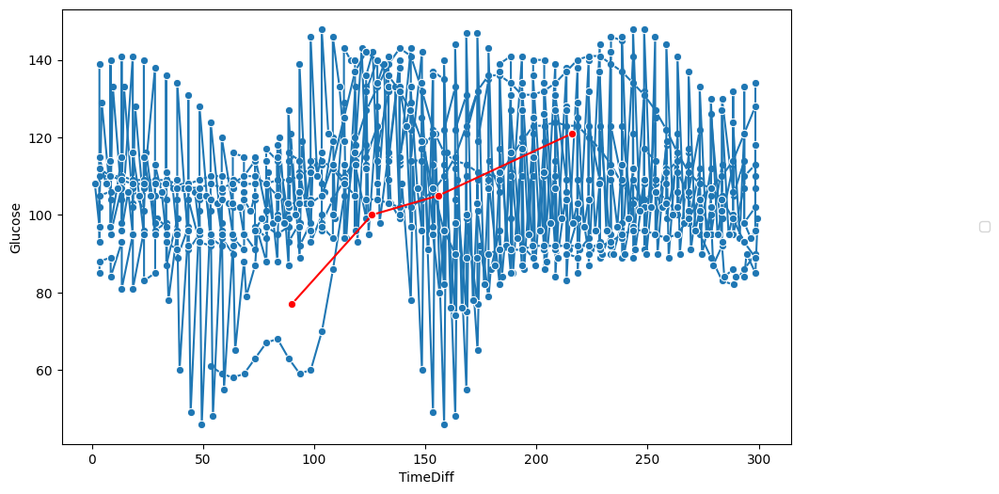

In [431]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=one_ogtt, y="Glucose", x="TimeDiff",palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_one, y="Glucose", x="TimeDiff", marker='o',color='red')

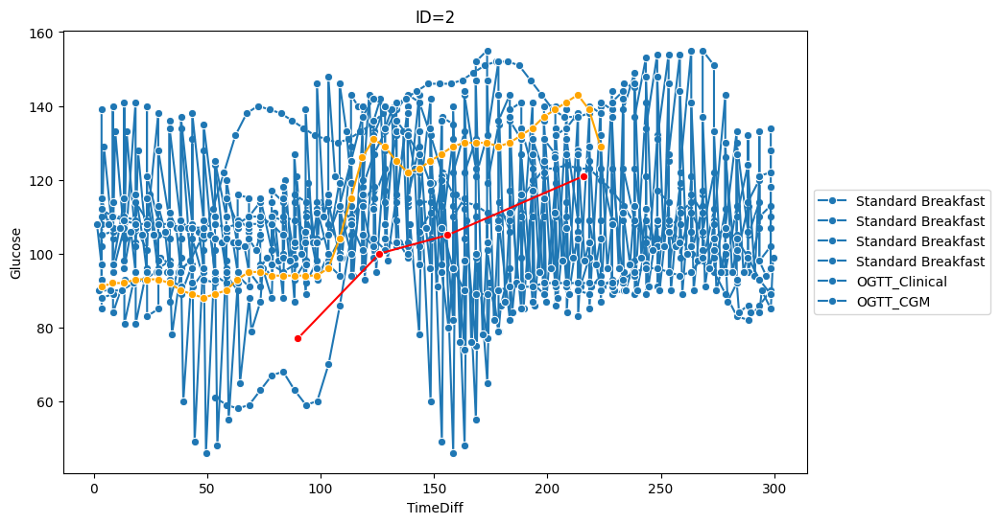

In [400]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=one_ogtt, y="Glucose", x="TimeDiff",palette='bright',units='date',estimator=None, marker='o').set(title='ID=2')
sns.lineplot(data=df_gtt_one, y="Glucose", x="TimeDiff", marker='o',color='red',estimator=None)
sns.lineplot(data=boost_cgm_one, y="Glucose", x="TimeDiff", marker='o',color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

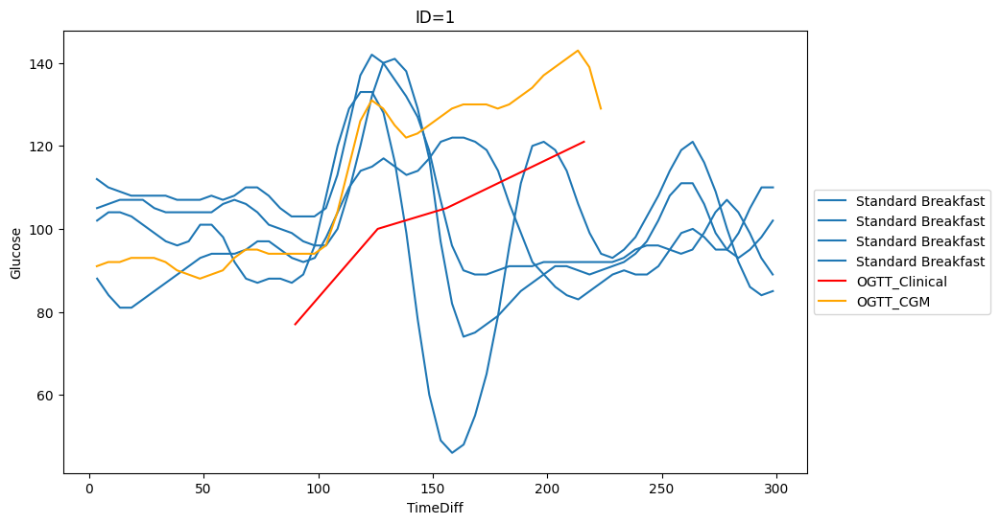

In [30]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=one_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=1')
sns.lineplot(data=df_gtt_one, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_one, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

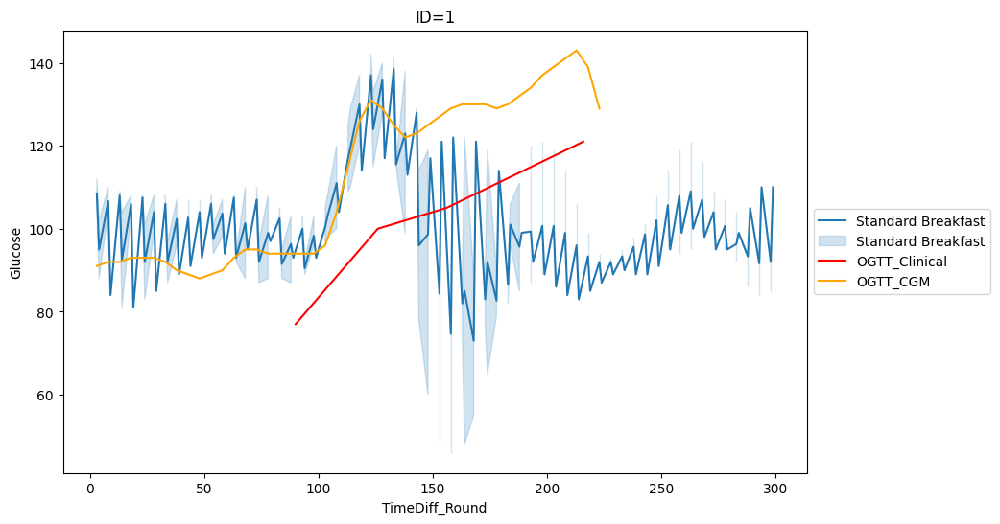

In [31]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=one_ogtt, y="Glucose", x="TimeDiff_Round")
sns.lineplot(data=df_gtt_one, y="Glucose", x="TimeDiff_Round", color='red',estimator=None).set(title='ID=1')
sns.lineplot(data=boost_cgm_one, y="Glucose", x="TimeDiff_Round", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

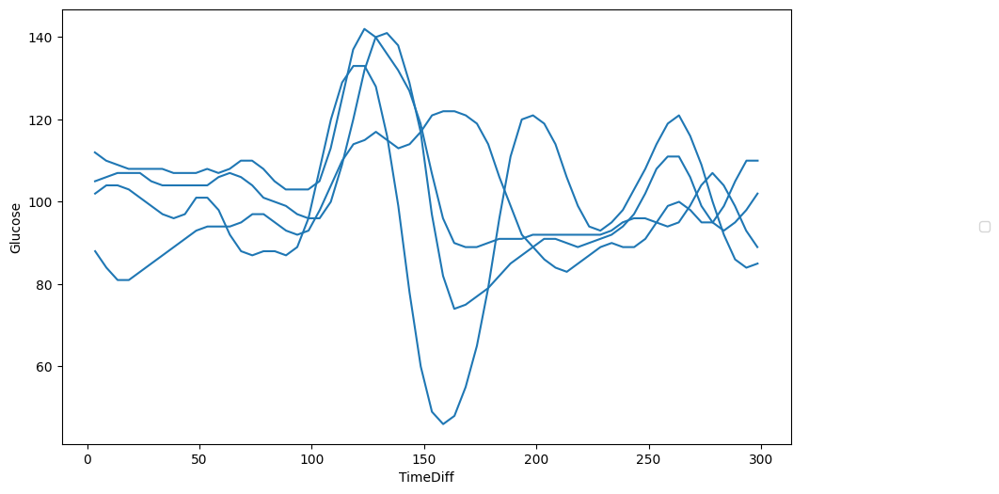

In [32]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=one_ogtt, y="Glucose", x="TimeDiff",units='date')

In [33]:
# Append dataframes
boost_cgm_one.head()
boost_cgm_one[['TimeDiff','Glucose','timestamp_dt']]
df_gtt_one.head()
df_gtt_one[['TimeDiff','Glucose','Time']]
one_ogtt.head(3)
one_ogtt[['TimeDiff','Glucose','timestamp_dt']]

,TimeDiff,Glucose,timestamp_dt
68,3.516667,88.0,2019-09-17 05:43:31
69,8.533333,84.0,2019-09-17 05:48:32
70,13.516667,81.0,2019-09-17 05:53:31
71,18.516667,81.0,2019-09-17 05:58:31
72,23.533333,83.0,2019-09-17 06:03:32
...,...,...,...
991,278.400000,107.0,2019-09-24 10:38:24
992,283.400000,104.0,2019-09-24 10:43:24
993,288.400000,99.0,2019-09-24 10:48:24
994,293.400000,93.0,2019-09-24 10:53:24


In [407]:
df_gtt_one['logged_food']='boost_clinical'
boost_cgm_one['logged_food']='boost_cgm'

In [414]:
boost_sub=boost_cgm_one[['TimeDiff','Glucose','timestamp_dt','date','logged_food']]
gtt_sub=df_gtt_one[['TimeDiff','Glucose','Time','logged_food']]
gtt_sub['date']=gtt_sub.Time.dt.date
ogtt_sub=one_ogtt[['TimeDiff','Glucose','timestamp_dt','date','logged_food']]
boost_sub['id']=1
gtt_sub['id']=1
ogtt_sub['id']=1

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

food_responses=ogtt_sub.append(gtt_sub)
food_responses=food_responses.append(boost_sub)
food_responses

,TimeDiff,Glucose,Time,date,logged_food,id,type
0,53.533333,61.0,2019-09-16 17:23:32,2019-09-16,Berry Smoothie,1,standard_meal
1,58.533333,59.0,2019-09-16 17:28:32,2019-09-16,Berry Smoothie,1,standard_meal
2,63.533333,58.0,2019-09-16 17:33:32,2019-09-16,Berry Smoothie,1,standard_meal
3,68.533333,59.0,2019-09-16 17:38:32,2019-09-16,Berry Smoothie,1,standard_meal
4,73.516667,63.0,2019-09-16 17:43:31,2019-09-16,Berry Smoothie,1,standard_meal
...,...,...,...,...,...,...,...
2568,203.383333,139.0,2019-09-25 17:33:23,2019-09-25,boost_cgm,1,boost_cgm
2569,208.383333,141.0,2019-09-25 17:38:23,2019-09-25,boost_cgm,1,boost_cgm
2570,213.383333,143.0,2019-09-25 17:43:23,2019-09-25,boost_cgm,1,boost_cgm
2571,218.366667,139.0,2019-09-25 17:48:22,2019-09-25,boost_cgm,1,boost_cgm


[Text(0.5, 1.0, 'ID=1')]

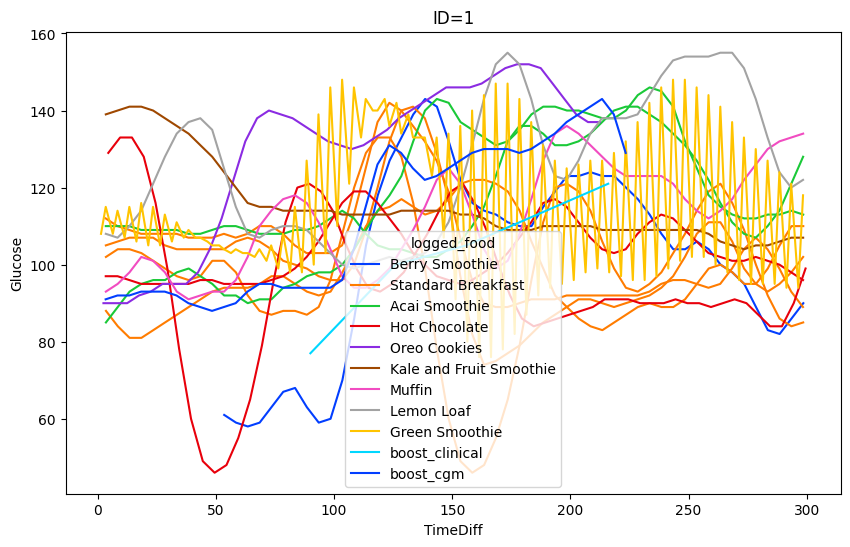

In [415]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=food_responses, y="Glucose", x="TimeDiff", hue='logged_food',palette='bright',units='date',estimator=None).set(title='ID=1')
# sns.lineplot(data=df_gtt_one, y="Glucose", x="TimeDiff", color='red',estimator=None)
# sns.lineplot(data=boost_cgm_one, y="Glucose", x="TimeDiff", color='orange')
# plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

[Text(0.5, 1.0, 'ID=1')]

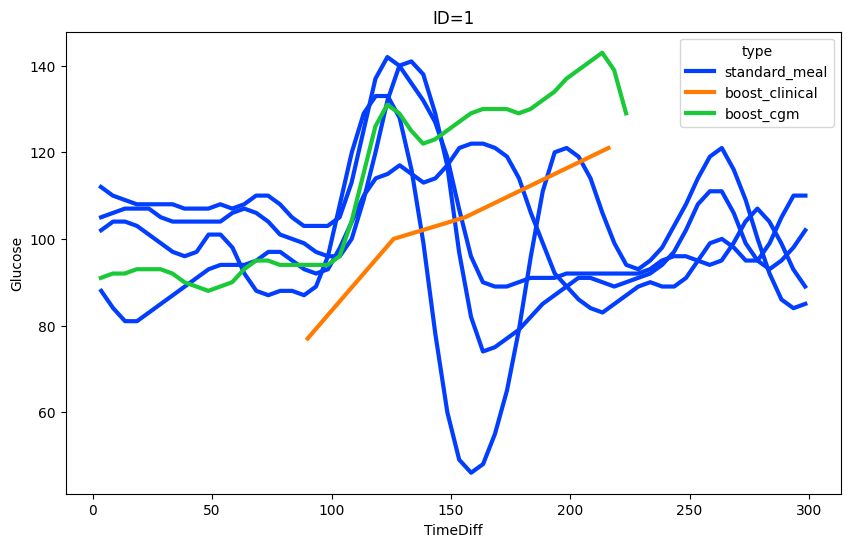

In [36]:
frng_1=food_responses[food_responses['id']==1]
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frng_1, y="Glucose", x="TimeDiff", palette='bright',hue='type',linewidth=3,units='date',estimator=None).set(title='ID=1')

Text(0.5, 1.0, 'ID=1')

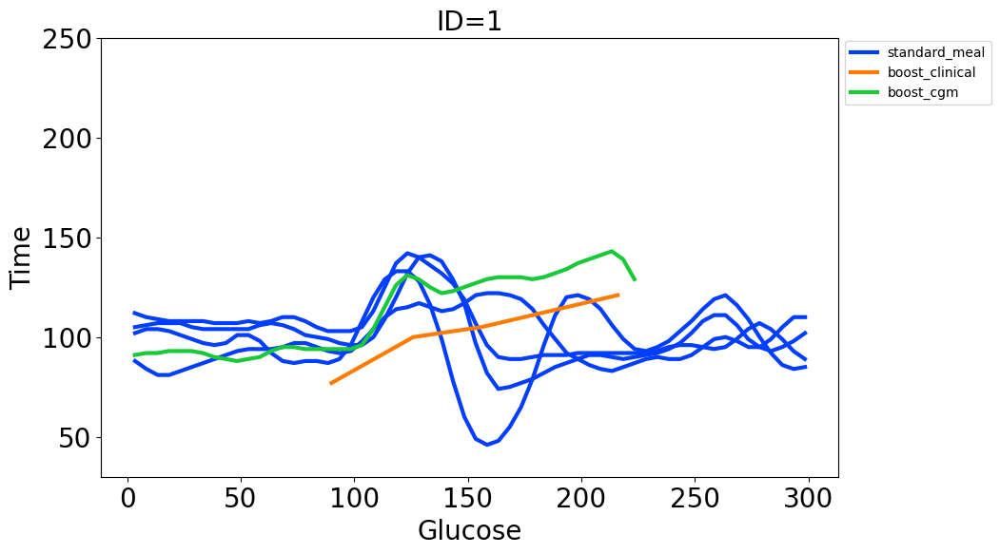

In [37]:
frng_1=food_responses[food_responses['id']==1]
plt.figure(figsize=(10,6))
sns.lineplot(data=frng_1, y="Glucose", x="TimeDiff", palette='bright',hue='type',linewidth=3,units='date',estimator=None).set(title='ID=1')
plt.ylim(30,250)
plt.legend(loc='center left', bbox_to_anchor=(1, .92), ncol=1)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel('Glucose', fontsize=20);
plt.ylabel('Time', fontsize=20);
plt.title('ID=1', fontsize=20)

In [38]:
#For grouped

In [39]:
max_times=one_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
one_ogtt.groupby('date')['TimeDiff_Round'].nunique()

date
2019-09-17    60
2019-09-19    60
2019-09-21    60
2019-09-24    60
Name: TimeDiff_Round, dtype: int64

In [432]:
max_times=one_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
one_ogtt.groupby('date')['TimeDiff_Round'].nunique()

dates=one_ogtt['date'].unique()
df_first_date=one_ogtt[one_ogtt['date']==dates[0]]

# one_ogtt_test=one_ogtt

column_names = one_ogtt.columns.tolist()

# Create an empty DataFrame with the same columns
df_ppgr_grouped_one = pd.DataFrame(columns=column_names)

for i in dates:
  df_date=one_ogtt[one_ogtt['date']==i]
  print(i)
  # df_date['nearest_time'] = df_first_date['TimeDiff'].apply(find_nearest_value)
  result_df = find_nearest_value(df_date, df_first_date, 'TimeDiff_Round', 'TimeDiff_Round')
  df_ppgr_grouped_one=df_ppgr_grouped_one.append(result_df)


2019-09-16
2019-09-17
2019-09-19
2019-09-21
2019-09-22
2019-09-23
2019-09-24


In [41]:
df_ppgr_grouped_one

,Index,Timestamp (YYYY-MM-DDThh:mm:ss),Event Type,Event Subtype,Patient Info,Device Info,Source Device ID,Glucose Value (mg/dL),Insulin Value (u),Carb Value (grams),...,MGE,MGN,J_index,LBGI,HBGI,,TimeDiff,SequentialTimeValues,TimeDiff_Round,nearest_TimeDiff_Round
68,161,2019-09-17T05:43:31,EGV,NaN,NaN,NaN,iPhone G6,88.0,NaN,NaN,...,NaN,NaN,14.882783,2.160922,0.122734,5.664924,3.516667,1,4.0,4.0
69,162,2019-09-17T05:48:32,EGV,NaN,NaN,NaN,iPhone G6,84.0,NaN,NaN,...,NaN,NaN,14.882783,2.160922,0.122734,5.664924,8.533333,2,9.0,9.0
70,163,2019-09-17T05:53:31,EGV,NaN,NaN,NaN,iPhone G6,81.0,NaN,NaN,...,NaN,NaN,14.882783,2.160922,0.122734,5.664924,13.516667,3,14.0,14.0
71,164,2019-09-17T05:58:31,EGV,NaN,NaN,NaN,iPhone G6,81.0,NaN,NaN,...,NaN,NaN,14.882783,2.160922,0.122734,5.664924,18.516667,4,19.0,19.0
72,165,2019-09-17T06:03:32,EGV,NaN,NaN,NaN,iPhone G6,83.0,NaN,NaN,...,NaN,NaN,14.882783,2.160922,0.122734,5.664924,23.533333,5,24.0,24.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
991,2198,2019-09-24T10:38:24,EGV,NaN,NaN,NaN,iPhone G6,107.0,NaN,NaN,...,NaN,NaN,15.710439,0.383178,0.274018,5.806451,278.400000,56,278.0,279.0
992,2199,2019-09-24T10:43:24,EGV,NaN,NaN,NaN,iPhone G6,104.0,NaN,NaN,...,NaN,NaN,15.710439,0.383178,0.274018,5.806451,283.400000,57,283.0,284.0
993,2200,2019-09-24T10:48:24,EGV,NaN,NaN,NaN,iPhone G6,99.0,NaN,NaN,...,NaN,NaN,15.710439,0.383178,0.274018,5.806451,288.400000,58,288.0,289.0
994,2201,2019-09-24T10:53:24,EGV,NaN,NaN,NaN,iPhone G6,93.0,NaN,NaN,...,NaN,NaN,15.710439,0.383178,0.274018,5.806451,293.400000,59,293.0,294.0


In [433]:
df_gtt_one['logged_food']='boost_clinical'
boost_cgm_one['logged_food']='boost_cgm'

In [434]:
# For grouped
boost_sub=boost_cgm_one[['TimeDiff','Glucose','timestamp_dt','date','logged_food']]
gtt_sub=df_gtt_one[['TimeDiff','Glucose','Time','logged_food']]
gtt_sub['date']=gtt_sub.Time.dt.date
# ogtt_sub=one_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
ogtt_sub=df_ppgr_grouped_one[['nearest_TimeDiff_Round','Glucose','timestamp_dt','date','logged_food']]
boost_sub['id']=1
gtt_sub['id']=1
ogtt_sub['id']=1

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

ogtt_sub.rename(columns={"nearest_TimeDiff_Round": "nearest_time_diff"},inplace=True)
boost_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)
gtt_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)

column_names_grouped = ogtt_sub.columns.tolist()

# Create an empty DataFrame with the same columns
food_responses_grouped = pd.DataFrame(columns=column_names_grouped)

food_responses_grouped=food_responses_grouped.append([ogtt_sub,gtt_sub,boost_sub])
food_responses_grouped


,nearest_time_diff,Glucose,Time,date,logged_food,id,type
0,54.000000,61.0,2019-09-16 17:23:32,2019-09-16,Berry Smoothie,1,standard_meal
1,59.000000,59.0,2019-09-16 17:28:32,2019-09-16,Berry Smoothie,1,standard_meal
2,64.000000,58.0,2019-09-16 17:33:32,2019-09-16,Berry Smoothie,1,standard_meal
3,69.000000,59.0,2019-09-16 17:38:32,2019-09-16,Berry Smoothie,1,standard_meal
4,74.000000,63.0,2019-09-16 17:43:31,2019-09-16,Berry Smoothie,1,standard_meal
...,...,...,...,...,...,...,...
2568,203.383333,139.0,2019-09-25 17:33:23,2019-09-25,boost_cgm,1,boost_cgm
2569,208.383333,141.0,2019-09-25 17:38:23,2019-09-25,boost_cgm,1,boost_cgm
2570,213.383333,143.0,2019-09-25 17:43:23,2019-09-25,boost_cgm,1,boost_cgm
2571,218.366667,139.0,2019-09-25 17:48:22,2019-09-25,boost_cgm,1,boost_cgm


In [425]:
food_responses_grouped['logged_food'].value_counts()

Standard Breakfast         240
Acai Smoothie              120
Hot Chocolate              120
Green Smoothie             120
Kale and Fruit Smoothie     60
Muffin                      60
Lemon Loaf                  60
Berry Smoothie              50
boost_cgm                   45
Oreo Cookies                43
boost_clinical               4
Name: logged_food, dtype: int64

[Text(0.5, 1.0, 'ID=1')]

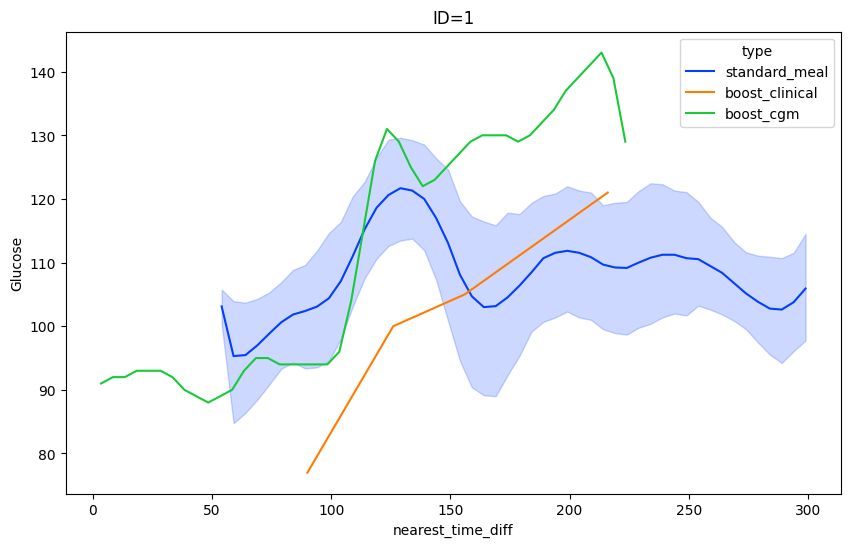

In [435]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=food_responses_grouped, y="Glucose", x="nearest_time_diff", hue='type',palette='bright').set(title='ID=1')
# sns.lineplot(data=df_gtt_one, y="Glucose", x="TimeDiff", color='red',estimator=None)
# sns.lineplot(data=boost_cgm_one, y="Glucose", x="TimeDiff", color='orange')
# plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

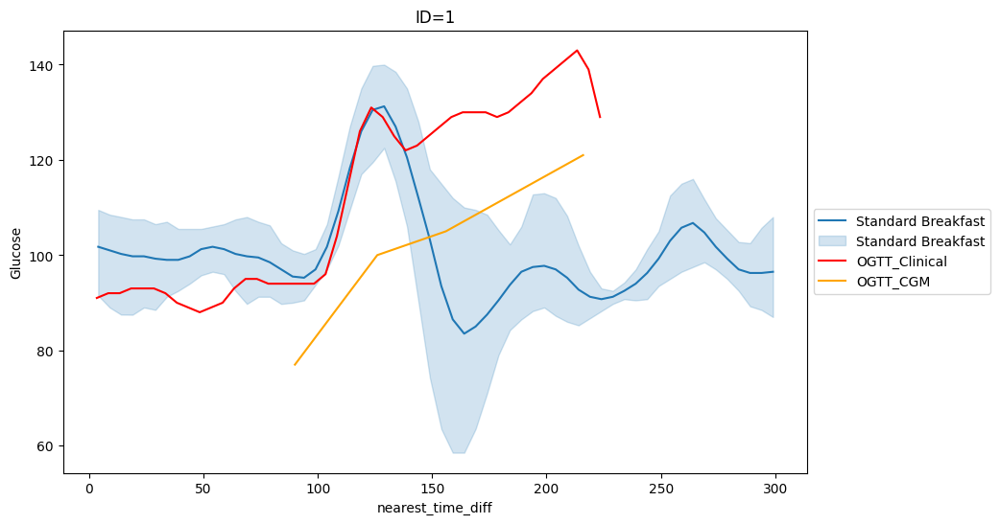

In [44]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ogtt_sub, y="Glucose", x="nearest_time_diff")
sns.lineplot(data=boost_sub, y="Glucose", x="nearest_time_diff", color='red',estimator=None).set(title='ID=1')
sns.lineplot(data=gtt_sub, y="Glucose", x="nearest_time_diff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

[Text(0.5, 1.0, 'ID=1')]

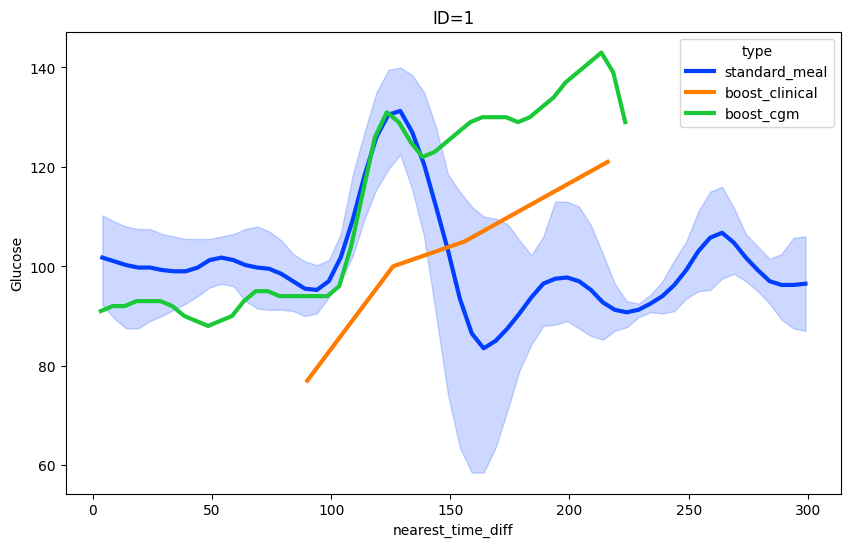

In [45]:
frg_1=food_responses_grouped[food_responses_grouped['id']==1]
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frg_1, y="Glucose", x="nearest_time_diff", palette='bright',hue='type',linewidth=3).set(title='ID=1')

Text(0.5, 1.0, 'ID=1')

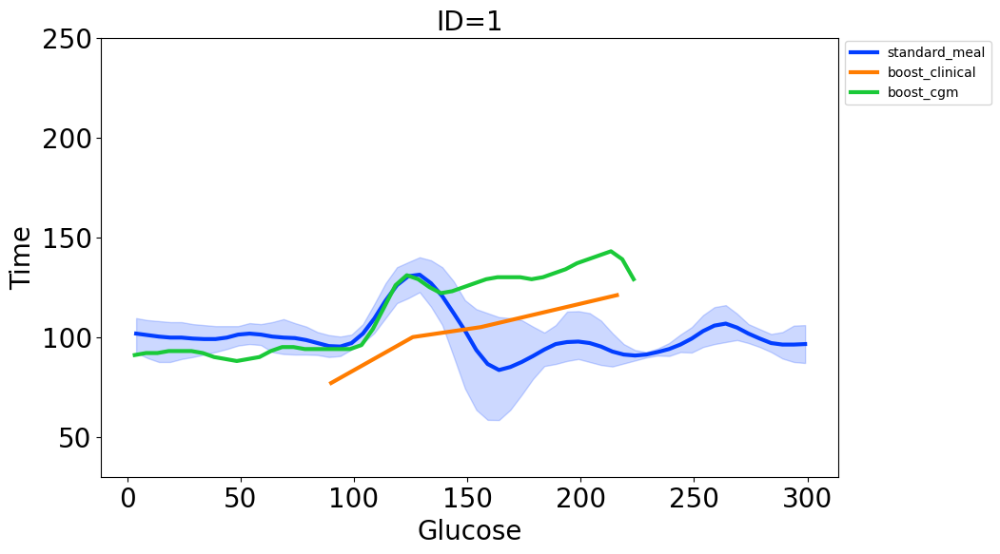

In [46]:
frg_1=food_responses_grouped[food_responses_grouped['id']==1]
plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frg_1, y="Glucose", x="nearest_time_diff", palette='bright',hue='type',linewidth=3).set(title='ID=1')
plt.ylim(30,250)
plt.legend(loc='center left', bbox_to_anchor=(1, .92), ncol=1)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel('Glucose', fontsize=20);
plt.ylabel('Time', fontsize=20);
plt.title('ID=1', fontsize=20)

In [47]:
s = '19-002'

GTT = [95,136,131,120]
GTT_times = ['2019-10-02 8:10:00', '2019-10-02 8:41:00', '2019-10-02 9:11:00', '2019-10-02 10:11:00']
GTT_times = pd.to_datetime(GTT_times, format='%Y-%m-%dT%H:%M:%S')
df_gtt_two = pd.DataFrame({'Glucose': GTT, 'Time': GTT_times})
auc_ogtt_two=calculate_area_under_curve(df_gtt_two)
auc_ogtt_two

15115

In [48]:
cgm_two=pd.read_csv('Wearables + CGM data/002/Dexcom.csv')
cgm_two['timestamp_dt']=pd.to_datetime(cgm_two['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_two['Glucose']=cgm_two['Glucose Value (mg/dL)']
cgm_two['Time']=pd.to_datetime(cgm_two['Timestamp (YYYY-MM-DDThh:mm:ss)'])

cgm_two=cgm_two.dropna(subset = ['timestamp_dt'])
cgm_two['date']=cgm_two['timestamp_dt'].dt.date
cgm_two

# food_two=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/002/Food_Log_002.csv')

# food_two['date']=pd.to_datetime(food_two['date']).dt.date

food_two=pd.read_excel('Food Logs/Food Log/Food_Log_002.xlsx')

# food_two.rename(columns={"date": "date_old"},inplace=True)

food_two['date']=pd.to_datetime(food_two['date']).dt.date

food_two.rename(columns={"time_begin": "time_begin_actual"},inplace=True)
food_two['time_begin']=pd.to_datetime(food_two['date'].astype(str) + ' ' + food_two['time_begin_actual'].astype(str))

# food_two['time_begin']=pd.to_datetime(food_two['time_begin'])
# window_dt = pd.Timedelta(minutes=120)
window_dt = pd.Timedelta(minutes=210)

food_two["time_begin_win"] = food_two["time_begin"]  + window_dt

merge_food_cgm_two=pd.merge(cgm_two,food_two,left_on=['date'],right_on=['date'])

cf_two=food_two[food_two['logged_food']=='Corn Flakes']

merge_food_cgm_two=pd.merge(cgm_two,cf_two,left_on=['date'],right_on=['date'])
# window_dt_brkfst = pd.Timedelta(minutes=-30)
# change to -90
window_dt_brkfst = pd.Timedelta(minutes=-90)

food_cgm_two_cf=merge_food_cgm_two[(merge_food_cgm_two['timestamp_dt']<=merge_food_cgm_two['time_begin_win'])&(merge_food_cgm_two['timestamp_dt']>=(merge_food_cgm_two['time_begin']+window_dt_brkfst))]

food_cgm_two_cf['pre_glu_time']=food_cgm_two_cf.groupby('date')['timestamp_dt'].transform('min')

column_names=food_cgm_two_cf.columns.values
food_cgm_two_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_two_cf['date'].unique():
  date_sub=food_cgm_two_cf[food_cgm_two_cf['date']==i]

  date_sub = date_sub.sort_values(by='timestamp_dt')
  min_glu=date_sub['Glucose Value (mg/dL)'].iloc[0]
  date_sub['min_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

  final_glu=date_sub['Glucose Value (mg/dL)'].iloc[-1]
  date_sub['final_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

  max_glu=date_sub['Glucose Value (mg/dL)'].max()
  date_sub['max_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

  date_sub['meal_auc'] = calculate_area_under_curve(date_sub)
  date_sub['auc_ogtt_two']=auc_ogtt_two
  j= i - dt.timedelta(days=1)
  cgm_two_ld=cgm_two[cgm_two['date']==j]

  date_sub['mean_glu_ld']=cgm_two_ld.groupby('date')['Glucose'].transform('mean').iloc[0]
  date_sub['interdaycv']=interdaycv(cgm_two_ld)
  date_sub['interdaysd']=interdaysd(cgm_two_ld)
  date_sub['TIR']=TIR(cgm_two_ld, sd=1, sr=5)
  date_sub['TOR']=TOR(cgm_two_ld, sd=1, sr=5)
  date_sub['POR']=POR(cgm_two_ld, sd=1, sr=5)
  date_sub['PIR']=PIR(cgm_two_ld, sd=1, sr=5)
  date_sub['MGE']=MGE(cgm_two_ld, sd=1)
  date_sub['MGN']=MGN(cgm_two_ld, sd=1)
  #MAGE(cgm_two, std=1)
  date_sub['J_index']=J_index(cgm_two_ld)
  date_sub['LBGI']=LBGI(cgm_two_ld)
  date_sub['HBGI']=HBGI(cgm_two_ld)
  #MODD(cgm_two)
  #CONGA24(cgm_two)
  date_sub['GMI']=GMI(date_sub)

  food_cgm_two_cf_all_dates=food_cgm_two_cf_all_dates.append(date_sub)

two_ogtt=food_cgm_two_cf_all_dates

two_ogtt_dup=two_ogtt.drop_duplicates(subset=['date'], keep='first')
two_ogtt_dup['id']=2
two_ogtt_dup['a1c']="norm"



In [49]:
# merge_sub_two.rename(columns={'auc_ogtt_two': 'auc_ogtt'}, inplace=True)

In [50]:
# merge_sub_two

In [51]:
# print(food_two[food_two['logged_food']=='Cornflakes'])
# food_two[food_two['logged_food']=='Boost']

In [52]:
window_dt = pd.Timedelta(minutes=150)
# boost_time=dt.datetime(2019,10,2,7,40,0)
# change to -90
boost_time=dt.datetime(2019,10,2,6,40,0)
#'2019-10-02 8:10:00'
#2019-10-02 8:10:00

boost_cgm_two=cgm_two[(cgm_two['timestamp_dt']>=boost_time)]
boost_cgm_two.head(4)
#food_thirteen["time_begin_win"] = food_thirteen["time_begin"] + window_dt

#cgm_thirteen[cgm_thirteen['timestamp_dt']>=dt.datetime(2020,6,4,9,30,0)]

,Index,Timestamp (YYYY-MM-DDThh:mm:ss),Event Type,Event Subtype,Patient Info,Device Info,Source Device ID,Glucose Value (mg/dL),Insulin Value (u),Carb Value (grams),Duration (hh:mm:ss),Glucose Rate of Change (mg/dL/min),Transmitter Time (Long Integer),Transmitter ID,timestamp_dt,Glucose,Time,date
2095,2096,2019-10-02T06:43:25,EGV,NaN,NaN,NaN,Android G6,138.0,NaN,NaN,NaN,NaN,685186.0,81C4KD,2019-10-02 06:43:25,138.0,2019-10-02 06:43:25,2019-10-02
2096,2097,2019-10-02T06:48:25,EGV,NaN,NaN,NaN,Android G6,135.0,NaN,NaN,NaN,NaN,685486.0,81C4KD,2019-10-02 06:48:25,135.0,2019-10-02 06:48:25,2019-10-02
2097,2098,2019-10-02T06:53:25,EGV,NaN,NaN,NaN,Android G6,131.0,NaN,NaN,NaN,NaN,685786.0,81C4KD,2019-10-02 06:53:25,131.0,2019-10-02 06:53:25,2019-10-02
2098,2099,2019-10-02T06:58:25,EGV,NaN,NaN,NaN,Android G6,126.0,NaN,NaN,NaN,NaN,686086.0,81C4KD,2019-10-02 06:58:25,126.0,2019-10-02 06:58:25,2019-10-02


In [53]:
# two_ogtt['TimeDiff'] = (two_ogtt['timestamp_dt'] - two_ogtt['time_begin']).dt.total_seconds()/ 60

two_ogtt['TimeDiff'] = (two_ogtt['timestamp_dt'] - (merge_food_cgm_two['time_begin']+window_dt_brkfst)).dt.total_seconds()/ 60

# Group by and use cumcount
two_ogtt['SequentialTimeValues'] = two_ogtt.groupby('date').cumcount() + 1

df_gtt_two['Time']=pd.to_datetime(df_gtt_two['Time'])

# df_gtt_two['TimeDiff'] = (df_gtt_two['Time'] - df_gtt_two['Time'].min()).dt.total_seconds()/ 60
df_gtt_two['TimeDiff'] = (df_gtt_two['Time'] - boost_time).dt.total_seconds()/ 60

boost_cgm_two['TimeDiff'] = (boost_cgm_two['timestamp_dt'] - boost_time).dt.total_seconds()/ 60


In [54]:
two_ogtt['TimeDiff_Round']=two_ogtt['TimeDiff'].round()
df_gtt_two['TimeDiff_Round']=df_gtt_two['TimeDiff'].round()
boost_cgm_two['TimeDiff_Round']=boost_cgm_two['TimeDiff'].round()

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

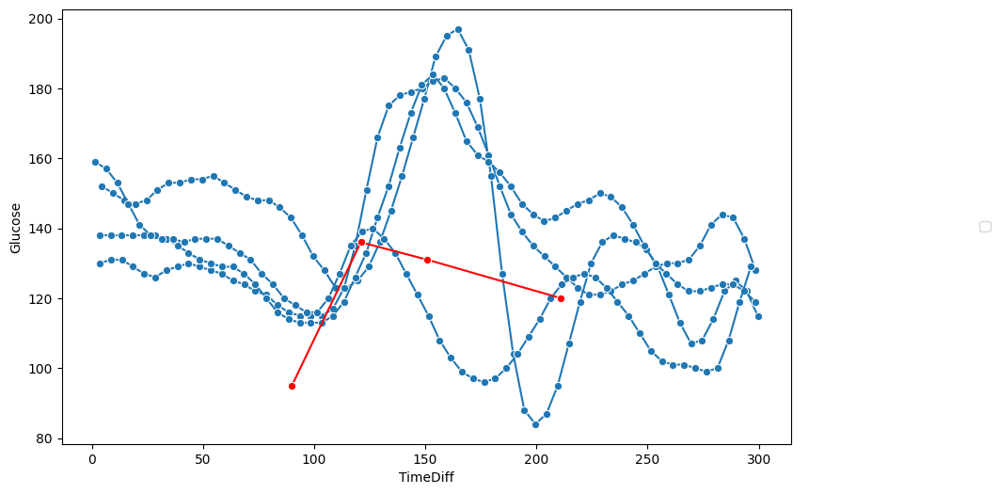

In [55]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=two_ogtt, y="Glucose", x="TimeDiff",palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_two, y="Glucose", x="TimeDiff", marker='o',color='red')

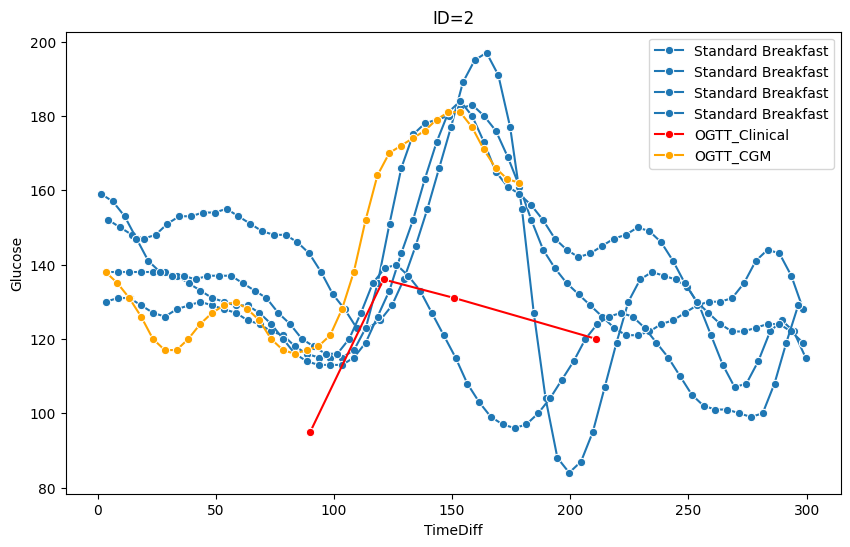

In [56]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=two_ogtt, y="Glucose", x="TimeDiff",palette='bright',units='date',estimator=None, marker='o').set(title='ID=2')
sns.lineplot(data=df_gtt_two, y="Glucose", x="TimeDiff", marker='o',color='red',estimator=None)
sns.lineplot(data=boost_cgm_two, y="Glucose", x="TimeDiff", marker='o',color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"])

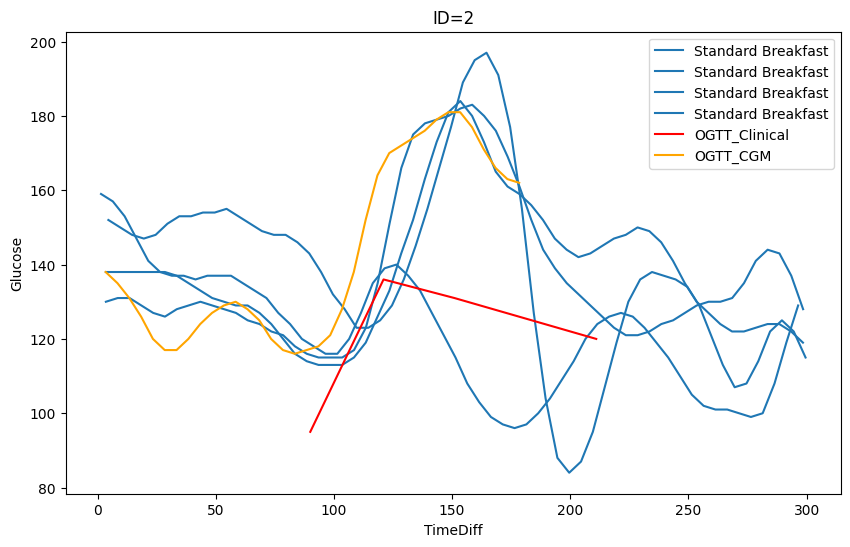

In [57]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=two_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=2')
sns.lineplot(data=df_gtt_two, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_two, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"])

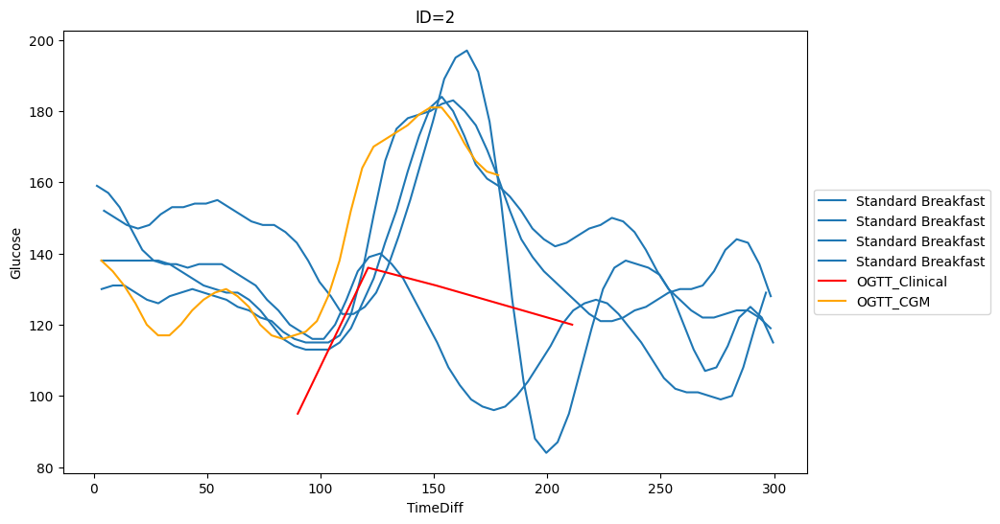

In [58]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=two_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=2')
sns.lineplot(data=df_gtt_two, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_two, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

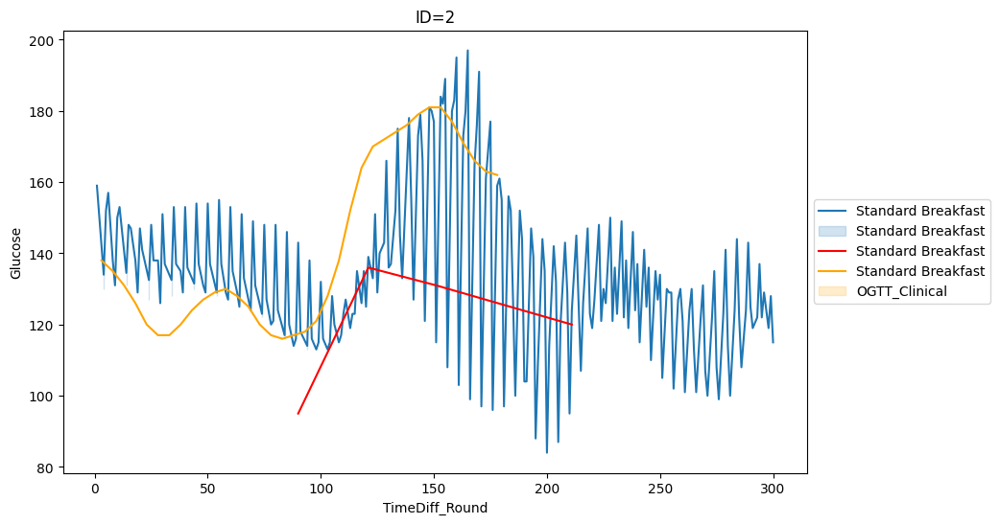

In [59]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=two_ogtt, y="Glucose", x="TimeDiff_Round", palette='bright').set(title='ID=2')
sns.lineplot(data=df_gtt_two, y="Glucose", x="TimeDiff_Round", color='red',estimator=None)
sns.lineplot(data=boost_cgm_two, y="Glucose", x="TimeDiff_Round", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [60]:
boost_sub=boost_cgm_two[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_two[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
ogtt_sub=two_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
boost_sub['id']=2
gtt_sub['id']=2
ogtt_sub['id']=2

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

food_responses=food_responses.append([ogtt_sub,gtt_sub,boost_sub])
food_responses


,TimeDiff,Glucose,Time,date,id,type
68,3.516667,88.0,2019-09-17 05:43:31,2019-09-17,1,standard_meal
69,8.533333,84.0,2019-09-17 05:48:32,2019-09-17,1,standard_meal
70,13.516667,81.0,2019-09-17 05:53:31,2019-09-17,1,standard_meal
71,18.516667,81.0,2019-09-17 05:58:31,2019-09-17,1,standard_meal
72,23.533333,83.0,2019-09-17 06:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2126,158.416667,177.0,2019-10-02 09:18:25,2019-10-02,2,boost_cgm
2127,163.400000,171.0,2019-10-02 09:23:24,2019-10-02,2,boost_cgm
2128,168.400000,166.0,2019-10-02 09:28:24,2019-10-02,2,boost_cgm
2129,173.400000,163.0,2019-10-02 09:33:24,2019-10-02,2,boost_cgm


[Text(0.5, 1.0, 'ID=2')]

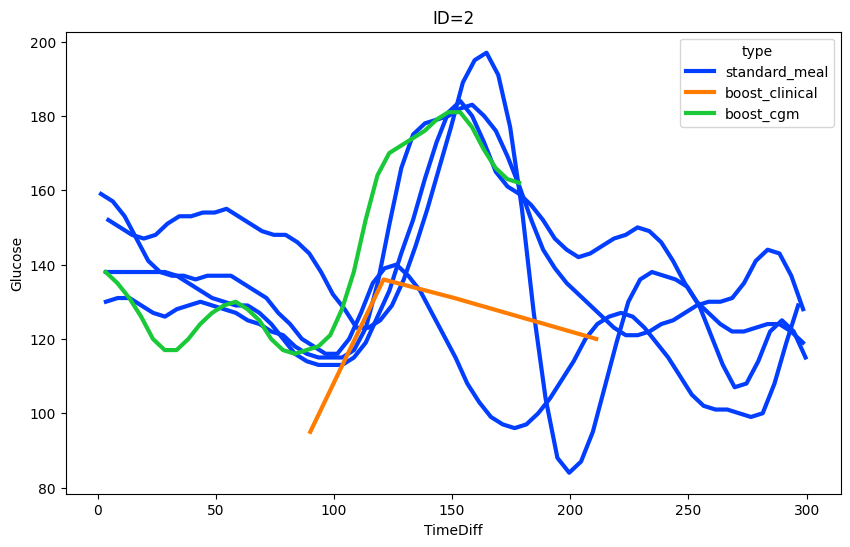

In [61]:
frng_2=food_responses[food_responses['id']==2]
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frng_2, y="Glucose", x="TimeDiff", palette='bright',hue='type',linewidth=3,units='date',estimator=None).set(title='ID=2')

Text(0.5, 1.0, 'ID=2')

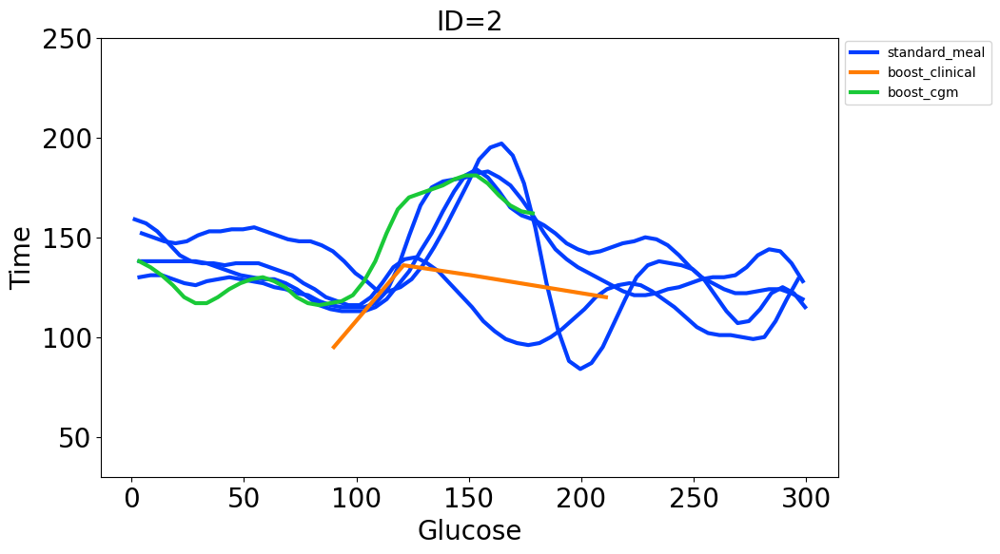

In [62]:
frng_2=food_responses[food_responses['id']==2]
plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frng_2, y="Glucose", x="TimeDiff", palette='bright',hue='type',linewidth=3,units='date',estimator=None).set(title='ID=2')
plt.ylim(30,250)
plt.legend(loc='center left', bbox_to_anchor=(1, .92), ncol=1)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel('Glucose', fontsize=20);
plt.ylabel('Time', fontsize=20);
plt.title('ID=2', fontsize=20)

In [63]:
max_times=two_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
two_ogtt.groupby('date')['TimeDiff_Round'].nunique()

date
2019-09-25    60
2019-09-27    60
2019-09-29    60
2019-10-01    60
Name: TimeDiff_Round, dtype: int64

In [64]:
max_times=two_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
two_ogtt.groupby('date')['TimeDiff_Round'].nunique()

dates=two_ogtt['date'].unique()
df_first_date=two_ogtt[two_ogtt['date']==dates[0]]

# two_ogtt_test=two_ogtt

column_names = two_ogtt.columns.tolist()

# Create an empty DataFrame with the same columns
df_ppgr_grouped_two = pd.DataFrame(columns=column_names)

for i in dates:
  df_date=two_ogtt[two_ogtt['date']==i]
  print(i)
  # df_date['nearest_time'] = df_first_date['TimeDiff'].apply(find_nearest_value)
  result_df = find_nearest_value(df_date, df_first_date, 'TimeDiff_Round', 'TimeDiff_Round')
  df_ppgr_grouped_two=df_ppgr_grouped_two.append(result_df)


# For grouped
boost_sub=boost_cgm_two[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_two[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
# ogtt_sub=two_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
ogtt_sub=df_ppgr_grouped_two[['nearest_TimeDiff_Round','Glucose','timestamp_dt','date']]
boost_sub['id']=2
gtt_sub['id']=2
ogtt_sub['id']=2

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

ogtt_sub.rename(columns={"nearest_TimeDiff_Round": "nearest_time_diff"},inplace=True)
boost_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)
gtt_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)


food_responses_grouped=food_responses_grouped.append([ogtt_sub,gtt_sub,boost_sub])
food_responses_grouped


2019-09-25
2019-09-27
2019-09-29
2019-10-01


,nearest_time_diff,Glucose,Time,date,id,type
68,4.000000,88.0,2019-09-17 05:43:31,2019-09-17,1,standard_meal
69,9.000000,84.0,2019-09-17 05:48:32,2019-09-17,1,standard_meal
70,14.000000,81.0,2019-09-17 05:53:31,2019-09-17,1,standard_meal
71,19.000000,81.0,2019-09-17 05:58:31,2019-09-17,1,standard_meal
72,24.000000,83.0,2019-09-17 06:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2126,158.416667,177.0,2019-10-02 09:18:25,2019-10-02,2,boost_cgm
2127,163.400000,171.0,2019-10-02 09:23:24,2019-10-02,2,boost_cgm
2128,168.400000,166.0,2019-10-02 09:28:24,2019-10-02,2,boost_cgm
2129,173.400000,163.0,2019-10-02 09:33:24,2019-10-02,2,boost_cgm


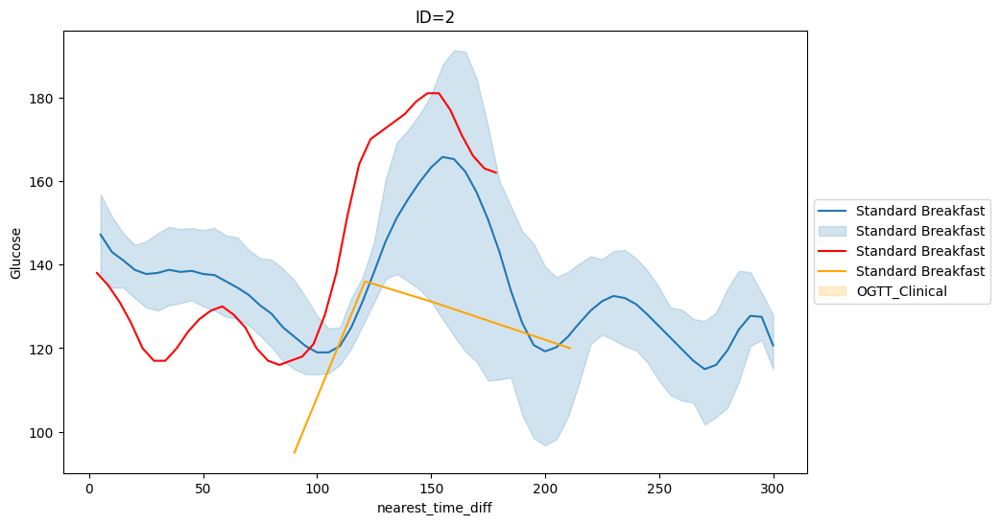

In [65]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ogtt_sub, y="Glucose", x="nearest_time_diff", palette='bright').set(title='ID=2')
sns.lineplot(data=boost_sub, y="Glucose", x="nearest_time_diff", color='red',estimator=None)
sns.lineplot(data=gtt_sub, y="Glucose", x="nearest_time_diff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

[Text(0.5, 1.0, 'ID=2')]

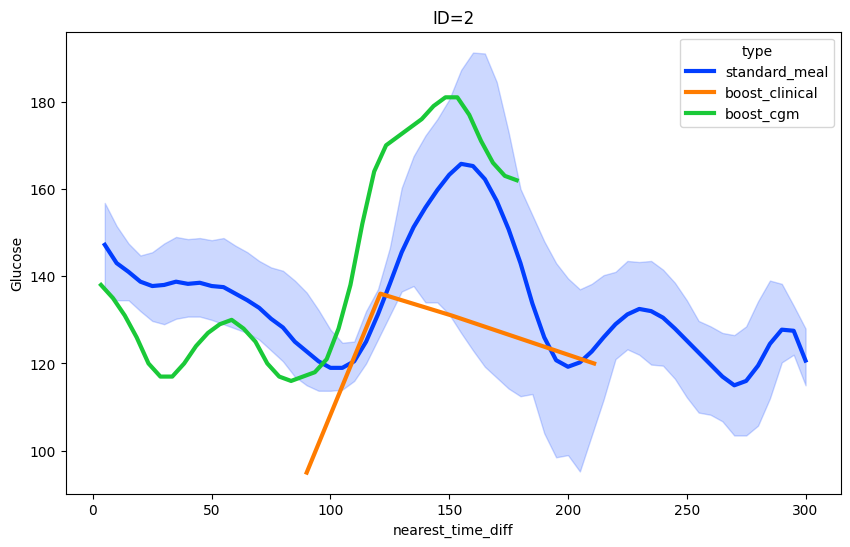

In [66]:
frg_2=food_responses_grouped[food_responses_grouped['id']==2]
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frg_2, y="Glucose", x="nearest_time_diff", palette='bright',hue='type',linewidth=3).set(title='ID=2')

Text(0.5, 1.0, 'ID=2')

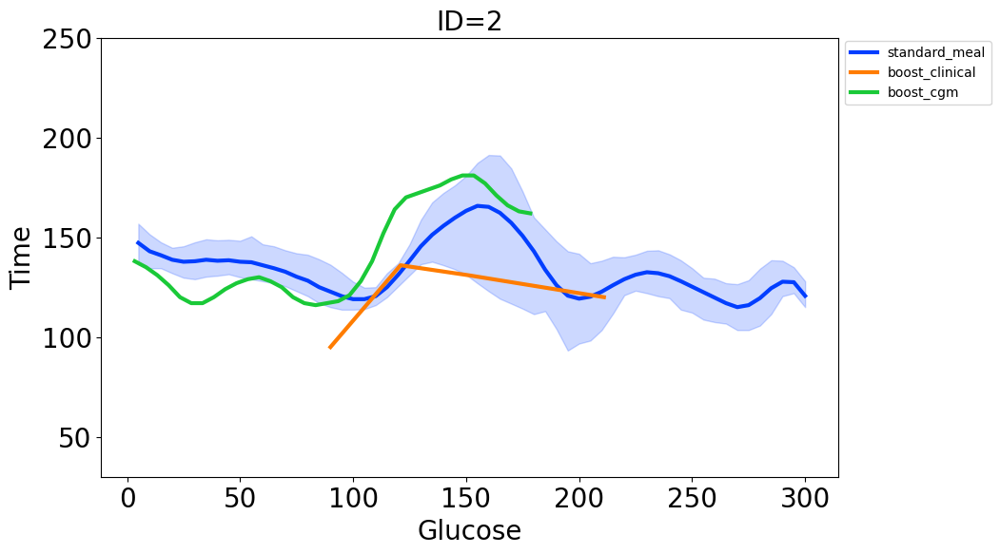

In [67]:
frg_2=food_responses_grouped[food_responses_grouped['id']==2]
plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frg_2, y="Glucose", x="nearest_time_diff", palette='bright',hue='type',linewidth=3).set(title='ID=2')
plt.ylim(30,250)
plt.legend(loc='center left', bbox_to_anchor=(1, .92), ncol=1)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel('Glucose', fontsize=20);
plt.ylabel('Time', fontsize=20);
plt.title('ID=2', fontsize=20)

In [68]:
s = '19-003'

GTT = [80,114,87,81]
GTT_times = ['2019-10-03 9:25:00', '2019-10-03 10:00:00', '2019-10-03 10:30:00', '2019-10-03 11:28:00']
GTT_times = pd.to_datetime(GTT_times, format='%Y-%m-%dT%H:%M:%S')

df_gtt_three = pd.DataFrame({'Glucose': GTT, 'Time': GTT_times})
auc_ogtt_three=calculate_area_under_curve(df_gtt_three)
auc_ogtt_three

11282

In [69]:
# # food_three=pd.read_excel('Food Logs/Food Log/Food_Log_003.xlsx')
# food_three.logged_food.unique()

In [70]:
cgm_three=pd.read_csv('Wearables + CGM data/003/Dexcom.csv')
cgm_three['timestamp_dt']=pd.to_datetime(cgm_three['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_three['Glucose']=cgm_three['Glucose Value (mg/dL)']
cgm_three['Time']=pd.to_datetime(cgm_three['Timestamp (YYYY-MM-DDThh:mm:ss)'])

cgm_three=cgm_three.dropna(subset = ['timestamp_dt'])
cgm_three['date']=cgm_three['timestamp_dt'].dt.date
cgm_three

# food_three=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/003/Food_Log_003.csv')

# food_three['date']=pd.to_datetime(food_three['date']).dt.date

food_three=pd.read_excel('Food Logs/Food Log/Food_Log_003.xlsx')

# food_three.rename(columns={"date": "date_old"},inplace=True)

food_three['date']=pd.to_datetime(food_three['date']).dt.date

food_three['time_begin']=pd.to_datetime(food_three.date_time)
# food_three['time_begin']=pd.to_datetime(food_three['time_begin'])
# window_dt = pd.Timedelta(minutes=120)
window_dt = pd.Timedelta(minutes=210)

food_three["time_begin_win"] = food_three["time_begin"]  + window_dt

merge_food_cgm_three=pd.merge(cgm_three,food_three,left_on=['date'],right_on=['date'])

cf_three=food_three[food_three['logged_food']=='Cornflakes']

merge_food_cgm_three=pd.merge(cgm_three,cf_three,left_on=['date'],right_on=['date'])
# window_dt_brkfst = pd.Timedelta(minutes=-30)
# change to -90
window_dt_brkfst = pd.Timedelta(minutes=-90)

food_cgm_three_cf=merge_food_cgm_three[(merge_food_cgm_three['timestamp_dt']<=merge_food_cgm_three['time_begin_win'])&(merge_food_cgm_three['timestamp_dt']>=(merge_food_cgm_three['time_begin']+window_dt_brkfst))]

food_cgm_three_cf['pre_glu_time']=food_cgm_three_cf.groupby('date')['timestamp_dt'].transform('min')

column_names=food_cgm_three_cf.columns.values
food_cgm_three_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_three_cf['date'].unique():
  date_sub=food_cgm_three_cf[food_cgm_three_cf['date']==i]

  date_sub = date_sub.sort_values(by='timestamp_dt')
  min_glu=date_sub['Glucose Value (mg/dL)'].iloc[0]
  date_sub['min_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

  final_glu=date_sub['Glucose Value (mg/dL)'].iloc[-1]
  date_sub['final_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

  max_glu=date_sub['Glucose Value (mg/dL)'].max()
  date_sub['max_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

  date_sub['meal_auc'] = calculate_area_under_curve(date_sub)
  date_sub['auc_ogtt_three']=auc_ogtt_three
  j= i - dt.timedelta(days=1)
  cgm_three_ld=cgm_three[cgm_three['date']==j]

  date_sub['mean_glu_ld']=cgm_three_ld.groupby('date')['Glucose'].transform('mean').iloc[0]
  date_sub['interdaycv']=interdaycv(cgm_three_ld)
  date_sub['interdaysd']=interdaysd(cgm_three_ld)
  date_sub['TIR']=TIR(cgm_three_ld, sd=1, sr=5)
  date_sub['TOR']=TOR(cgm_three_ld, sd=1, sr=5)
  date_sub['POR']=POR(cgm_three_ld, sd=1, sr=5)
  date_sub['PIR']=PIR(cgm_three_ld, sd=1, sr=5)
  date_sub['MGE']=MGE(cgm_three_ld, sd=1)
  date_sub['MGN']=MGN(cgm_three_ld, sd=1)
  #MAGE(cgm_three, std=1)
  date_sub['J_index']=J_index(cgm_three_ld)
  date_sub['LBGI']=LBGI(cgm_three_ld)
  date_sub['HBGI']=HBGI(cgm_three_ld)
  #MODD(cgm_three)
  #CONGA24(cgm_three)
  date_sub['GMI']=GMI(date_sub)

  food_cgm_three_cf_all_dates=food_cgm_three_cf_all_dates.append(date_sub)

three_ogtt=food_cgm_three_cf_all_dates

three_ogtt_dup=three_ogtt.drop_duplicates(subset=['date'], keep='first')
three_ogtt_dup['id']=3
three_ogtt_dup['a1c']="norm"


In [71]:
window_dt = pd.Timedelta(minutes=160)
# boost_time=dt.datetime(2019,10,3,8,55,0)
# change to -90
boost_time=dt.datetime(2019,10,3,7,55,0)
#'2019-10-03 9:25:00'

# boost_cgm_three=cgm_three[(cgm_three['timestamp_dt']>=boost_time)&(cgm_three['timestamp_dt']<=boost_time + window_dt)]
boost_cgm_three=cgm_three[(cgm_three['timestamp_dt']>=boost_time)]
boost_cgm_three.head(4)

,Index,Timestamp (YYYY-MM-DDThh:mm:ss),Event Type,Event Subtype,Patient Info,Device Info,Source Device ID,Glucose Value (mg/dL),Insulin Value (u),Carb Value (grams),Duration (hh:mm:ss),Glucose Rate of Change (mg/dL/min),Transmitter Time (Long Integer),Transmitter ID,timestamp_dt,Glucose,Time,date
2269,2270,2019-10-03T07:56:31,EGV,NaN,NaN,NaN,iPhone G6,89.0,NaN,NaN,NaN,NaN,689686.0,81C46E,2019-10-03 07:56:31,89.0,2019-10-03 07:56:31,2019-10-03
2270,2271,2019-10-03T08:01:31,EGV,NaN,NaN,NaN,iPhone G6,90.0,NaN,NaN,NaN,NaN,689986.0,81C46E,2019-10-03 08:01:31,90.0,2019-10-03 08:01:31,2019-10-03
2271,2272,2019-10-03T08:06:31,EGV,NaN,NaN,NaN,iPhone G6,92.0,NaN,NaN,NaN,NaN,690286.0,81C46E,2019-10-03 08:06:31,92.0,2019-10-03 08:06:31,2019-10-03
2272,2273,2019-10-03T08:11:31,EGV,NaN,NaN,NaN,iPhone G6,93.0,NaN,NaN,NaN,NaN,690586.0,81C46E,2019-10-03 08:11:31,93.0,2019-10-03 08:11:31,2019-10-03


In [72]:
three_ogtt['TimeDiff'] = (three_ogtt['timestamp_dt'] - (merge_food_cgm_three['time_begin']+window_dt_brkfst)).dt.total_seconds()/ 60

# Group by and use cumcount
three_ogtt['SequentialTimeValues'] = three_ogtt.groupby('date').cumcount() + 1

df_gtt_three['Time']=pd.to_datetime(df_gtt_three['Time'])

# df_gtt_three['TimeDiff'] = (df_gtt_three['Time'] - df_gtt_three['Time'].min()).dt.total_seconds()/ 60
df_gtt_three['TimeDiff'] = (df_gtt_three['Time'] - boost_time).dt.total_seconds()/ 60

boost_cgm_three['TimeDiff'] = (boost_cgm_three['timestamp_dt'] - boost_time).dt.total_seconds()/ 60


In [73]:
three_ogtt['TimeDiff_Round']=three_ogtt['TimeDiff'].round()
df_gtt_three['TimeDiff_Round']=df_gtt_three['TimeDiff'].round()
boost_cgm_three['TimeDiff_Round']=boost_cgm_three['TimeDiff'].round()

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

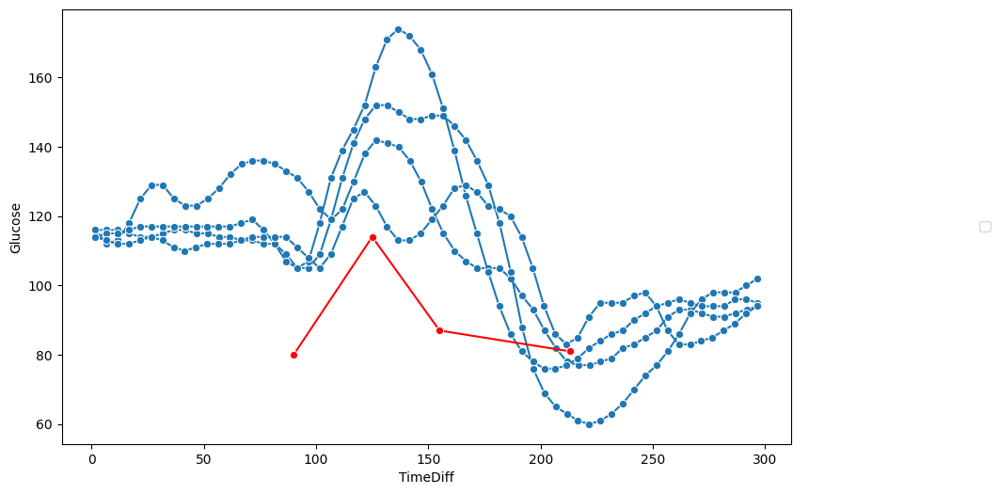

In [74]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=three_ogtt, y="Glucose", x="TimeDiff",palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_three, y="Glucose", x="TimeDiff", marker='o',color='red')

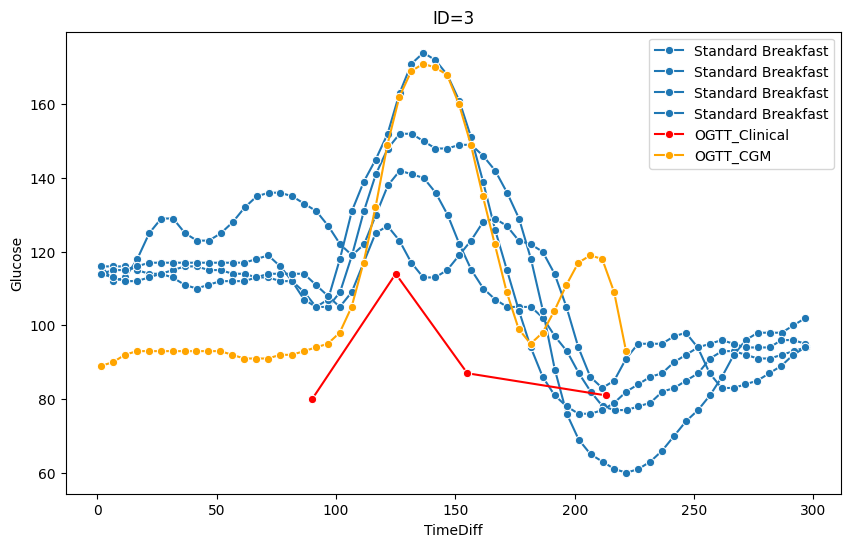

In [75]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=three_ogtt, y="Glucose", x="TimeDiff",palette='bright',units='date',estimator=None, marker='o').set(title='ID=3')
sns.lineplot(data=df_gtt_three, y="Glucose", x="TimeDiff", marker='o',color='red',estimator=None)
sns.lineplot(data=boost_cgm_three, y="Glucose", x="TimeDiff", marker='o',color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"])

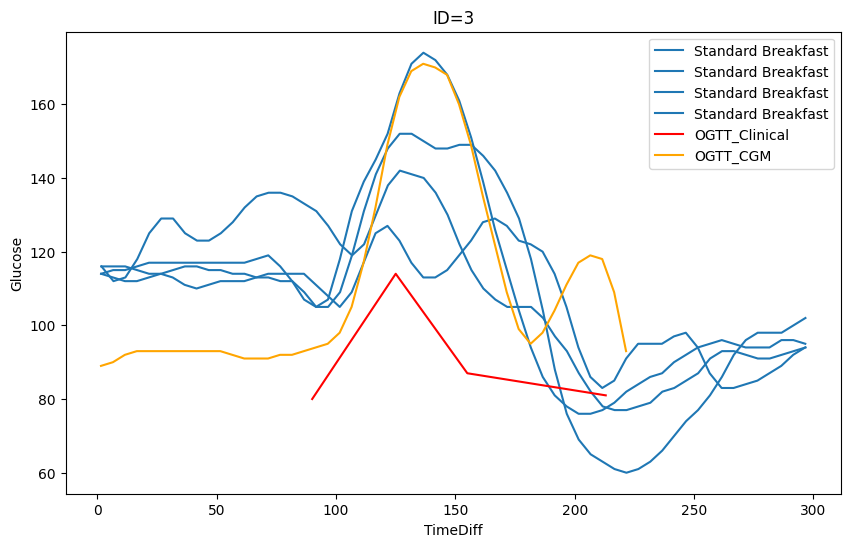

In [76]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=three_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=3')
sns.lineplot(data=df_gtt_three, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_three, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"])

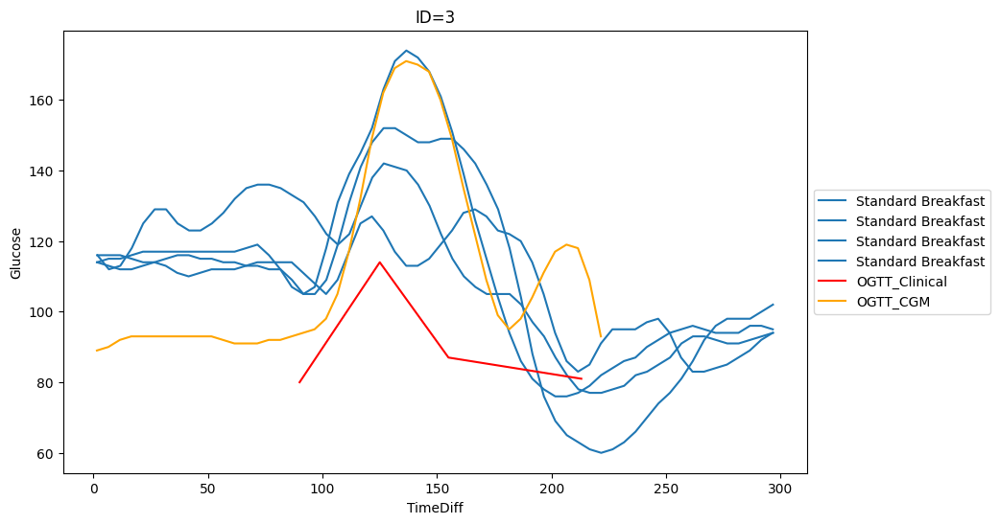

In [77]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=three_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=3')
sns.lineplot(data=df_gtt_three, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_three, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

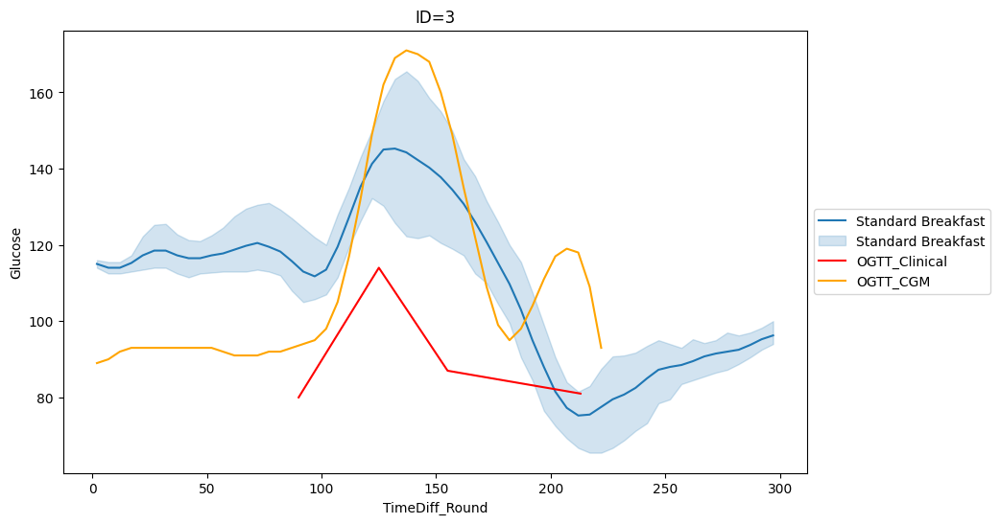

In [78]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=three_ogtt, y="Glucose", x="TimeDiff_Round", palette='bright').set(title='ID=3')
sns.lineplot(data=df_gtt_three, y="Glucose", x="TimeDiff_Round", color='red',estimator=None)
sns.lineplot(data=boost_cgm_three, y="Glucose", x="TimeDiff_Round", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [79]:
boost_sub=boost_cgm_three[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_three[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
ogtt_sub=three_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
boost_sub['id']=3
gtt_sub['id']=3
ogtt_sub['id']=3

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

food_responses=food_responses.append([ogtt_sub,gtt_sub,boost_sub])
food_responses

# food_responses=ogtt_sub.append(gtt_sub)
# food_responses=food_responses.append(boost_sub)
# food_responses


,TimeDiff,Glucose,Time,date,id,type
68,3.516667,88.0,2019-09-17 05:43:31,2019-09-17,1,standard_meal
69,8.533333,84.0,2019-09-17 05:48:32,2019-09-17,1,standard_meal
70,13.516667,81.0,2019-09-17 05:53:31,2019-09-17,1,standard_meal
71,18.516667,81.0,2019-09-17 05:58:31,2019-09-17,1,standard_meal
72,23.533333,83.0,2019-09-17 06:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2309,201.516667,117.0,2019-10-03 11:16:31,2019-10-03,3,boost_cgm
2310,206.516667,119.0,2019-10-03 11:21:31,2019-10-03,3,boost_cgm
2311,211.516667,118.0,2019-10-03 11:26:31,2019-10-03,3,boost_cgm
2312,216.516667,109.0,2019-10-03 11:31:31,2019-10-03,3,boost_cgm


[Text(0.5, 1.0, 'ID=3')]

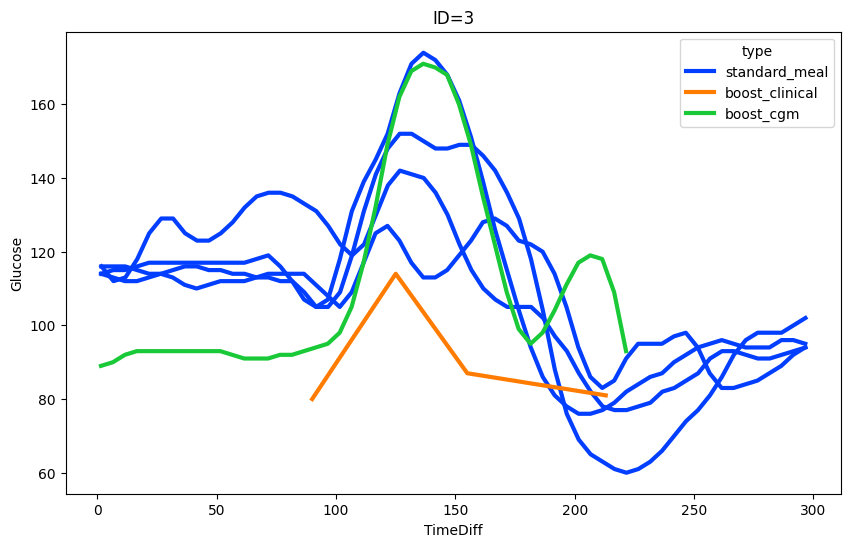

In [80]:
frng_3=food_responses[food_responses['id']==3]
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frng_3, y="Glucose", x="TimeDiff", palette='bright',hue='type',linewidth=3,units='date',estimator=None).set(title='ID=3')

Text(0.5, 1.0, 'ID=3')

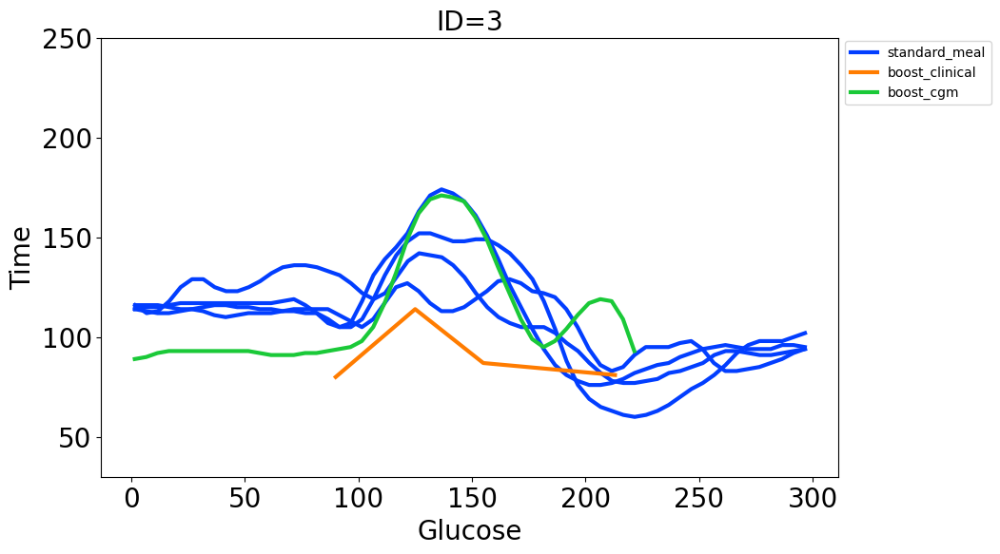

In [81]:
frng_3=food_responses[food_responses['id']==3]
plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frng_3, y="Glucose", x="TimeDiff", palette='bright',hue='type',linewidth=3,units='date',estimator=None).set(title='ID=3')
plt.ylim(30,250)
plt.legend(loc='center left', bbox_to_anchor=(1, .92), ncol=1)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel('Glucose', fontsize=20);
plt.ylabel('Time', fontsize=20);
plt.title('ID=3', fontsize=20)

In [82]:
max_times=three_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
three_ogtt.groupby('date')['TimeDiff_Round'].nunique()

dates=three_ogtt['date'].unique()
df_first_date=three_ogtt[three_ogtt['date']==dates[0]]

# three_ogtt_test=three_ogtt

column_names = three_ogtt.columns.tolist()

# Create an empty DataFrame with the same columns
df_ppgr_grouped_three = pd.DataFrame(columns=column_names)

for i in dates:
  df_date=three_ogtt[three_ogtt['date']==i]
  print(i)
  # df_date['nearest_time'] = df_first_date['TimeDiff'].apply(find_nearest_value)
  result_df = find_nearest_value(df_date, df_first_date, 'TimeDiff_Round', 'TimeDiff_Round')
  df_ppgr_grouped_three=df_ppgr_grouped_three.append(result_df)


# For grouped
boost_sub=boost_cgm_three[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_three[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
# ogtt_sub=three_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
ogtt_sub=df_ppgr_grouped_three[['nearest_TimeDiff_Round','Glucose','timestamp_dt','date']]
boost_sub['id']=3
gtt_sub['id']=3
ogtt_sub['id']=3

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

ogtt_sub.rename(columns={"nearest_TimeDiff_Round": "nearest_time_diff"},inplace=True)
boost_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)
gtt_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)


food_responses_grouped=food_responses_grouped.append([ogtt_sub,gtt_sub,boost_sub])
food_responses_grouped


2019-09-26
2019-09-28
2019-09-30
2019-10-02


,nearest_time_diff,Glucose,Time,date,id,type
68,4.000000,88.0,2019-09-17 05:43:31,2019-09-17,1,standard_meal
69,9.000000,84.0,2019-09-17 05:48:32,2019-09-17,1,standard_meal
70,14.000000,81.0,2019-09-17 05:53:31,2019-09-17,1,standard_meal
71,19.000000,81.0,2019-09-17 05:58:31,2019-09-17,1,standard_meal
72,24.000000,83.0,2019-09-17 06:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2309,201.516667,117.0,2019-10-03 11:16:31,2019-10-03,3,boost_cgm
2310,206.516667,119.0,2019-10-03 11:21:31,2019-10-03,3,boost_cgm
2311,211.516667,118.0,2019-10-03 11:26:31,2019-10-03,3,boost_cgm
2312,216.516667,109.0,2019-10-03 11:31:31,2019-10-03,3,boost_cgm


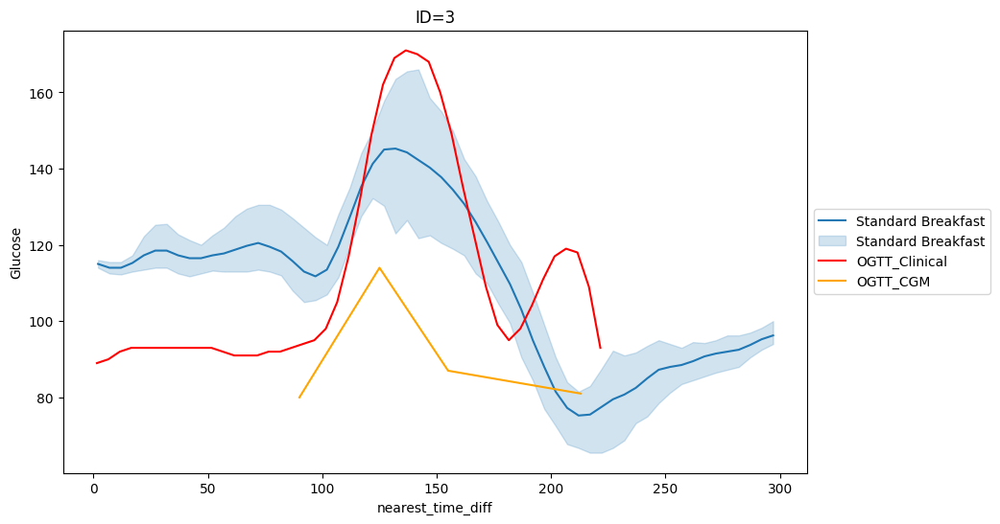

In [83]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ogtt_sub, y="Glucose", x="nearest_time_diff", palette='bright').set(title='ID=3')
sns.lineplot(data=boost_sub, y="Glucose", x="nearest_time_diff", color='red',estimator=None)
sns.lineplot(data=gtt_sub, y="Glucose", x="nearest_time_diff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

[Text(0.5, 1.0, 'ID=3')]

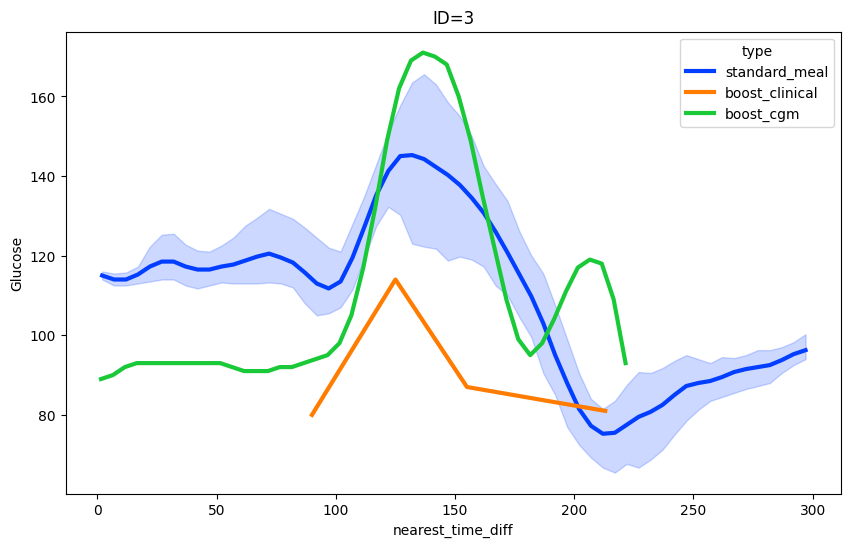

In [84]:
frg_3=food_responses_grouped[food_responses_grouped['id']==3]
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frg_3, y="Glucose", x="nearest_time_diff", palette='bright',hue='type',linewidth=3).set(title='ID=3')

Text(0.5, 1.0, 'ID=3')

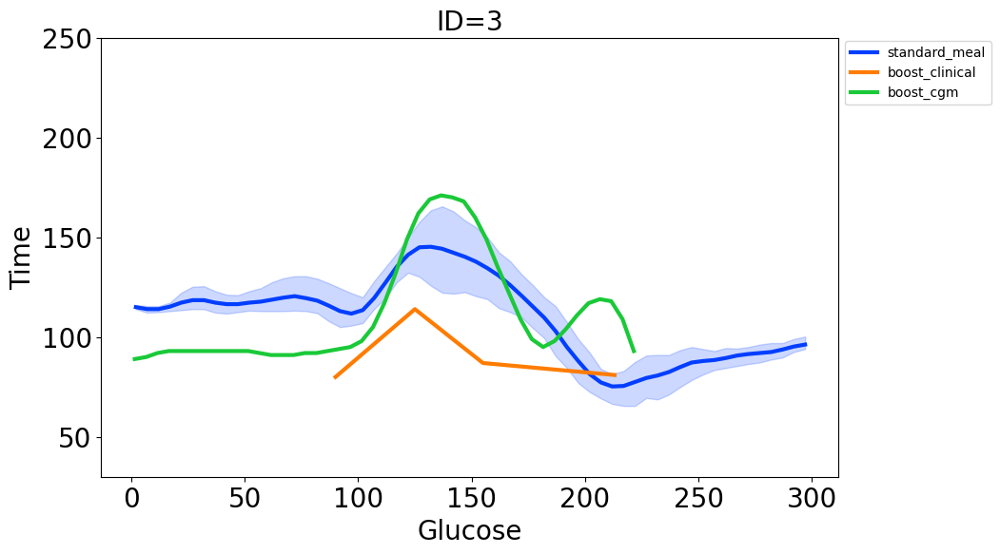

In [85]:
frg_3=food_responses_grouped[food_responses_grouped['id']==3]
plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frg_3, y="Glucose", x="nearest_time_diff", palette='bright',hue='type',linewidth=3).set(title='ID=3')
plt.ylim(30,250)
plt.legend(loc='center left', bbox_to_anchor=(1, .92), ncol=1)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel('Glucose', fontsize=20);
plt.ylabel('Time', fontsize=20);
plt.title('ID=3', fontsize=20)

In [86]:
s = '19-004'

GTT = [88,97,100,109]
GTT_times = ['2019-10-08 8:32:00', '2019-10-08 10:07:00', '2019-10-08 10:37:00', '2019-10-08 11:37:00']
GTT_times = pd.to_datetime(GTT_times, format='%Y-%m-%dT%H:%M:%S')
df_gtt_four = pd.DataFrame({'Glucose': GTT, 'Time': GTT_times})
auc_ogtt_four=calculate_area_under_curve(df_gtt_four)
auc_ogtt_four

18012

In [87]:
# food_four=pd.read_excel('Food Logs/Food Log/Food_Log_004.xlsx')
# food_four.head(4)


In [88]:
cgm_four=pd.read_csv('Wearables + CGM data/004/Dexcom.csv')
cgm_four['timestamp_dt']=pd.to_datetime(cgm_four['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_four['Glucose']=cgm_four['Glucose Value (mg/dL)']
cgm_four['Time']=pd.to_datetime(cgm_four['Timestamp (YYYY-MM-DDThh:mm:ss)'])

cgm_four=cgm_four.dropna(subset = ['timestamp_dt'])
cgm_four['date']=cgm_four['timestamp_dt'].dt.date
cgm_four

food_four=pd.read_excel('Food Logs/Food Log/Food_Log_004.xlsx')

food_four['date']=pd.to_datetime(food_four['date']).dt.date

# food_four['date']=pd.to_datetime(food_four['date']).dt.date

food_four.rename(columns={"time_begin": "time_begin_actual"},inplace=True)
food_four['time_begin']=pd.to_datetime(food_four['date'].astype(str) + ' ' + food_four['time_begin_actual'].astype(str))

food_four['time_begin']=pd.to_datetime(food_four['time_begin'])
# window_dt = pd.Timedelta(minutes=120)
window_dt = pd.Timedelta(minutes=210)

food_four["time_begin_win"] = food_four["time_begin"]  + window_dt

merge_food_cgm_four=pd.merge(cgm_four,food_four,left_on=['date'],right_on=['date'])

cf_four=food_four[food_four['logged_food']=='Frosted Flakes']

merge_food_cgm_four=pd.merge(cgm_four,cf_four,left_on=['date'],right_on=['date'])
# window_dt_brkfst = pd.Timedelta(minutes=-30)
# change to -90
window_dt_brkfst = pd.Timedelta(minutes=-90)

food_cgm_four_cf=merge_food_cgm_four[(merge_food_cgm_four['timestamp_dt']<=merge_food_cgm_four['time_begin_win'])&(merge_food_cgm_four['timestamp_dt']>=(merge_food_cgm_four['time_begin']+window_dt_brkfst))]

food_cgm_four_cf['pre_glu_time']=food_cgm_four_cf.groupby('date')['timestamp_dt'].transform('min')

column_names=food_cgm_four_cf.columns.values
food_cgm_four_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_four_cf['date'].unique():
  date_sub=food_cgm_four_cf[food_cgm_four_cf['date']==i]

  date_sub = date_sub.sort_values(by='timestamp_dt')
  min_glu=date_sub['Glucose Value (mg/dL)'].iloc[0]
  date_sub['min_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

  final_glu=date_sub['Glucose Value (mg/dL)'].iloc[-1]
  date_sub['final_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

  max_glu=date_sub['Glucose Value (mg/dL)'].max()
  date_sub['max_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

  date_sub['meal_auc'] = calculate_area_under_curve(date_sub)
  date_sub['auc_ogtt_four']=auc_ogtt_four
  j= i - dt.timedelta(days=1)
  cgm_four_ld=cgm_four[cgm_four['date']==j]

  date_sub['mean_glu_ld']=cgm_four_ld.groupby('date')['Glucose'].transform('mean').iloc[0]
  date_sub['interdaycv']=interdaycv(cgm_four_ld)
  date_sub['interdaysd']=interdaysd(cgm_four_ld)
  date_sub['TIR']=TIR(cgm_four_ld, sd=1, sr=5)
  date_sub['TOR']=TOR(cgm_four_ld, sd=1, sr=5)
  date_sub['POR']=POR(cgm_four_ld, sd=1, sr=5)
  date_sub['PIR']=PIR(cgm_four_ld, sd=1, sr=5)
  date_sub['MGE']=MGE(cgm_four_ld, sd=1)
  date_sub['MGN']=MGN(cgm_four_ld, sd=1)
  #MAGE(cgm_four, std=1)
  date_sub['J_index']=J_index(cgm_four_ld)
  date_sub['LBGI']=LBGI(cgm_four_ld)
  date_sub['HBGI']=HBGI(cgm_four_ld)
  #MODD(cgm_four)
  #CONGA24(cgm_four)
  date_sub['GMI']=GMI(date_sub)

  food_cgm_four_cf_all_dates=food_cgm_four_cf_all_dates.append(date_sub)

four_ogtt=food_cgm_four_cf_all_dates

four_ogtt_dup=four_ogtt.drop_duplicates(subset=['date'], keep='first')
four_ogtt_dup['id']=4
four_ogtt_dup['a1c']="PD"


In [89]:
# print(food_four[food_four['logged_food']=='Frosted Flakes'])
# food_four[food_four['logged_food']=='Boost']

In [90]:
window_dt = pd.Timedelta(minutes=120)
# boost_time=dt.datetime(2020,3,6,8,0,0)
# boost_time=dt.datetime(2019,10,8,8,2,0)
# change to -90
boost_time=dt.datetime(2019,10,8,7,2,0)

#2019-10-08 8:32:00
#2019-10-08 8:32:00

boost_cgm_four=cgm_four[(cgm_four['timestamp_dt']>=boost_time)&(cgm_four['timestamp_dt']<=boost_time + window_dt)]
boost_cgm_four.head(4)
#food_thirteen["time_begin_win"] = food_thirteen["time_begin"] + window_dt

#cgm_thirteen[cgm_thirteen['timestamp_dt']>=dt.datetime(2020,6,4,9,30,0)]

,Index,Timestamp (YYYY-MM-DDThh:mm:ss),Event Type,Event Subtype,Patient Info,Device Info,Source Device ID,Glucose Value (mg/dL),Insulin Value (u),Carb Value (grams),Duration (hh:mm:ss),Glucose Rate of Change (mg/dL/min),Transmitter Time (Long Integer),Transmitter ID,timestamp_dt,Glucose,Time,date


In [91]:
four_ogtt['TimeDiff'] = (four_ogtt['timestamp_dt'] - (four_ogtt['time_begin']+window_dt_brkfst)).dt.total_seconds()/ 60

# Group by and use cumcount
four_ogtt['SequentialTimeValues'] = four_ogtt.groupby('date').cumcount() + 1

df_gtt_four['Time']=pd.to_datetime(df_gtt_four['Time'])
min_four=df_gtt_four['Time'].min()

df_gtt_four['TimeDiff'] = (df_gtt_four['Time'] - boost_time).dt.total_seconds()/ 60

# df_gtt_four['TimeDiff'] = (df_gtt_four['Time'] - min_four).dt.total_seconds()/ 60


In [92]:
# four_ogtt['TimeDiff_Round']=four_ogtt['TimeDiff'].round()
# df_gtt_four['TimeDiff_Round']=df_gtt_four['TimeDiff'].round()
# boost_cgm_five['TimeDiff_Round']=boost_cgm_five['TimeDiff'].round()

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

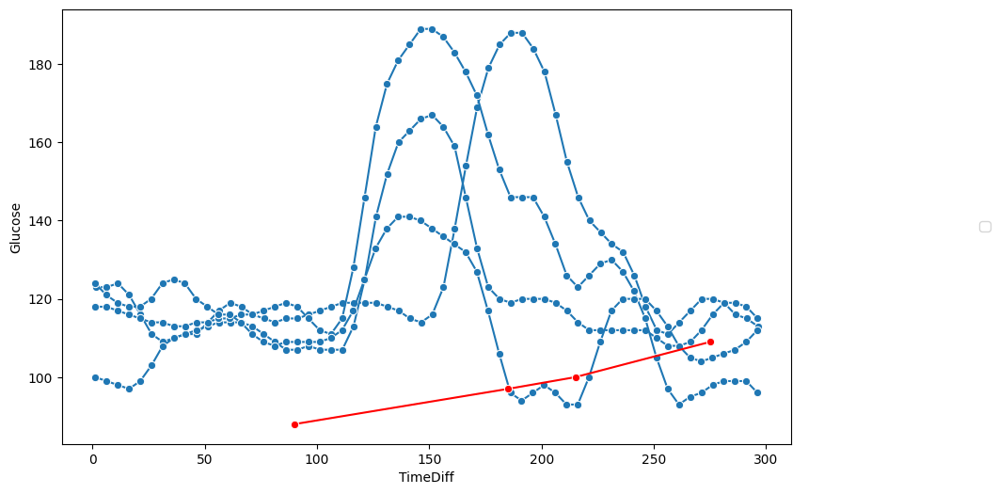

In [93]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=four_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_four, y="Glucose", x="TimeDiff", marker='o',color='red')

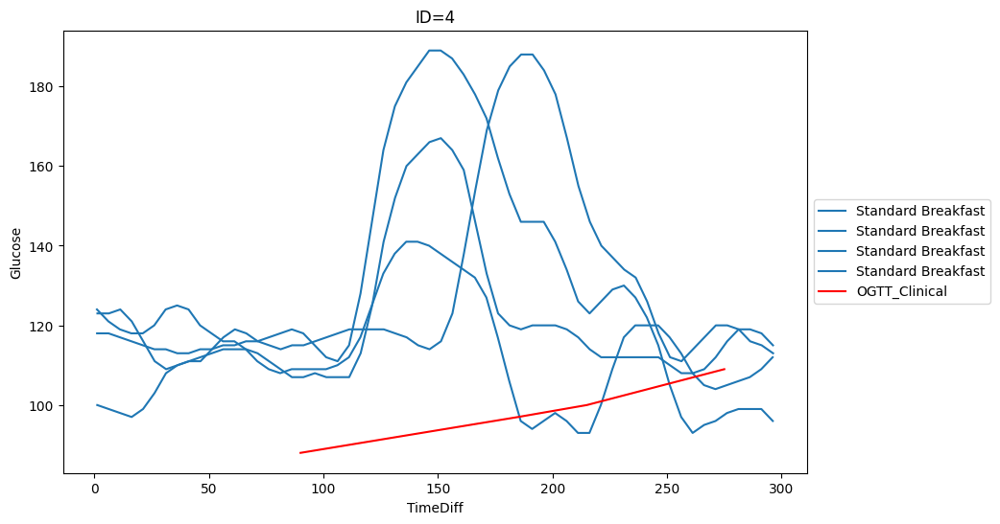

In [94]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=four_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=4')
sns.lineplot(data=df_gtt_four, y="Glucose", x="TimeDiff", color='red',estimator=None)
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [95]:
# frg_4=food_responses_grouped[food_responses_grouped['id']==4]
# plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
# sns.lineplot(data=frg_4, y="Glucose", x="nearest_time_diff", palette='bright',hue='type',linewidth=3).set(title='ID=4')

In [96]:
# boost_sub=boost_cgm_four[['TimeDiff','Glucose','timestamp_dt','date']]
# gtt_sub=df_gtt_four[['TimeDiff','Glucose','Time']]
# gtt_sub['date']=gtt_sub.Time.dt.date
# ogtt_sub=four_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
# boost_sub['id']=4
# gtt_sub['id']=4
# ogtt_sub['id']=4

# boost_sub['type']='boost_cgm'
# gtt_sub['type']='boost_clinical'
# ogtt_sub['type']='standard_meal'

# boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
# ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

# food_responses=food_responses.append[(ogtt_sub,gtt_sub,boost_sub)]
# food_responses


In [97]:
# import seaborn as sns
# plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
# sns.lineplot(data=five_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=5')
# sns.lineplot(data=df_gtt_five, y="Glucose", x="TimeDiff", color='red',estimator=None)
# sns.lineplot(data=boost_cgm_five, y="Glucose", x="TimeDiff", color='orange')
# plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"])

In [98]:
s = '19-005'

GTT = [84,131,96,74]
GTT_times = ['2019-10-09 9:34:00', '2019-10-09 10:10:00', '2019-10-09 10:40:00', '2019-10-09 11:40:00']
GTT_times = pd.to_datetime(GTT_times, format='%Y-%m-%dT%H:%M:%S')

df_gtt_five = pd.DataFrame({'Glucose': GTT, 'Time': GTT_times})
auc_ogtt_five=calculate_area_under_curve(df_gtt_five)
auc_ogtt_five

12375

In [99]:
# cgm_five = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/005/Dexcom_005.csv')
cgm_five = pd.read_csv('Wearables + CGM data/005/Dexcom.csv')

cgm_five['timestamp_dt'] = pd.to_datetime(cgm_five['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_five['Glucose'] = cgm_five['Glucose Value (mg/dL)']
cgm_five['Time'] = pd.to_datetime(cgm_five['Timestamp (YYYY-MM-DDThh:mm:ss)'])

cgm_five = cgm_five.dropna(subset=['timestamp_dt'])
cgm_five['date'] = cgm_five['timestamp_dt'].dt.date
cgm_five

food_five=pd.read_excel('Food Logs/Food Log/Food_Log_005.xlsx')

food_five['date']=pd.to_datetime(food_five['date']).dt.date

# food_four['date']=pd.to_datetime(food_four['date']).dt.date

food_five.rename(columns={"time_begin": "time_begin_actual"},inplace=True)
food_five['time_begin']=pd.to_datetime(food_five['date'].astype(str) + ' ' + food_five['time_begin_actual'].astype(str))
# window_dt_brkfst = pd.Timedelta(minutes=-30)
# change to -90
window_dt_brkfst = pd.Timedelta(minutes=-90)

# food_five = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/005/Food_Log_005.csv')

# food_five['date'] = pd.to_datetime(food_five['date']).dt.date

# food_five['time_begin'] = pd.to_datetime(food_five['time_begin'])
# window_dt = pd.Timedelta(minutes=120)
window_dt = pd.Timedelta(minutes=210)

food_five["time_begin_win"] = food_five["time_begin"] + window_dt

merge_food_cgm_five = pd.merge(cgm_five, food_five, left_on=['date'], right_on=['date'])

cf_five = food_five[food_five['logged_food'] == 'Cornflakes']

merge_food_cgm_five = pd.merge(cgm_five, cf_five, left_on=['date'], right_on=['date'])

food_cgm_five_cf = merge_food_cgm_five[(merge_food_cgm_five['timestamp_dt'] <= merge_food_cgm_five['time_begin_win']) & (merge_food_cgm_five['timestamp_dt'] >= (merge_food_cgm_five['time_begin']+window_dt_brkfst))]

food_cgm_five_cf['pre_glu_time'] = food_cgm_five_cf.groupby('date')['timestamp_dt'].transform('min')

column_names = food_cgm_five_cf.columns.values
food_cgm_five_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_five_cf['date'].unique():
    date_sub = food_cgm_five_cf[food_cgm_five_cf['date'] == i]

    date_sub = date_sub.sort_values(by='timestamp_dt')
    min_glu = date_sub['Glucose Value (mg/dL)'].iloc[0]
    date_sub['min_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

    final_glu = date_sub['Glucose Value (mg/dL)'].iloc[-1]
    date_sub['final_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

    max_glu = date_sub['Glucose Value (mg/dL)'].max()
    date_sub['max_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

    date_sub['meal_auc'] = calculate_area_under_curve(date_sub)
    date_sub['auc_ogtt_five'] = auc_ogtt_five
    j = i - dt.timedelta(days=1)
    cgm_five_ld = cgm_five[cgm_five['date'] == j]

    date_sub['mean_glu_ld'] = cgm_five_ld.groupby('date')['Glucose'].transform('mean').iloc[0]
    date_sub['interdaycv'] = interdaycv(cgm_five_ld)
    date_sub['interdaysd'] = interdaysd(cgm_five_ld)
    date_sub['TIR'] = TIR(cgm_five_ld, sd=1, sr=5)
    date_sub['TOR'] = TOR(cgm_five_ld, sd=1, sr=5)
    date_sub['POR'] = POR(cgm_five_ld, sd=1, sr=5)
    date_sub['PIR'] = PIR(cgm_five_ld, sd=1, sr=5)
    date_sub['MGE'] = MGE(cgm_five_ld, sd=1)
    date_sub['MGN'] = MGN(cgm_five_ld, sd=1)
    # MAGE(cgm_five, std=1)
    date_sub['J_index'] = J_index(cgm_five_ld)
    date_sub['LBGI'] = LBGI(cgm_five_ld)
    date_sub['HBGI'] = HBGI(cgm_five_ld)
    # MODD(cgm_five)
    # CONGA24(cgm_five)
    date_sub['GMI'] = GMI(date_sub)

    food_cgm_five_cf_all_dates = food_cgm_five_cf_all_dates.append(date_sub)

five_ogtt = food_cgm_five_cf_all_dates

five_ogtt_dup = five_ogtt.drop_duplicates(subset=['date'], keep='first')
five_ogtt_dup['id'] = 5
five_ogtt_dup['a1c'] = "PD"


In [100]:
# print(food_five[food_five['logged_food']=='Cornflakes'])
# food_five[food_five['logged_food']=='Boost']

In [101]:
window_dt = pd.Timedelta(minutes=120)
# boost_time=dt.datetime(2019,10,9,9,4,0)
# change to -90
boost_time=dt.datetime(2019,10,9,8,4,0)
#9:34:00
#8:53:00
# 2019-10-09 9:34:00

boost_cgm_five=cgm_five[(cgm_five['timestamp_dt']>=boost_time)]
boost_cgm_five.head(4)
#food_thirteen["time_begin_win"] = food_thirteen["time_begin"] + window_dt

#cgm_thirteen[cgm_thirteen['timestamp_dt']>=dt.datetime(2020,6,4,9,30,0)]

,Index,Timestamp (YYYY-MM-DDThh:mm:ss),Event Type,Event Subtype,Patient Info,Device Info,Source Device ID,Glucose Value (mg/dL),Insulin Value (u),Carb Value (grams),Duration (hh:mm:ss),Glucose Rate of Change (mg/dL/min),Transmitter Time (Long Integer),Transmitter ID,timestamp_dt,Glucose,Time,date
2524,2525,2019-10-09T08:06:06,EGV,NaN,NaN,NaN,MX84702427,85.0,NaN,NaN,NaN,NaN,768057.0,81C2FU,2019-10-09 08:06:06,85.0,2019-10-09 08:06:06,2019-10-09
2525,2526,2019-10-09T08:11:06,EGV,NaN,NaN,NaN,MX84702427,85.0,NaN,NaN,NaN,NaN,768357.0,81C2FU,2019-10-09 08:11:06,85.0,2019-10-09 08:11:06,2019-10-09
2526,2527,2019-10-09T08:16:07,EGV,NaN,NaN,NaN,MX84702427,85.0,NaN,NaN,NaN,NaN,768657.0,81C2FU,2019-10-09 08:16:07,85.0,2019-10-09 08:16:07,2019-10-09
2527,2528,2019-10-09T08:21:06,EGV,NaN,NaN,NaN,MX84702427,86.0,NaN,NaN,NaN,NaN,768957.0,81C2FU,2019-10-09 08:21:06,86.0,2019-10-09 08:21:06,2019-10-09


In [102]:
five_ogtt['TimeDiff'] = (five_ogtt['timestamp_dt'] - (five_ogtt['time_begin']+window_dt_brkfst)).dt.total_seconds()/ 60

# Group by and use cumcount
five_ogtt['SequentialTimeValues'] = five_ogtt.groupby('date').cumcount() + 1

df_gtt_five['Time']=pd.to_datetime(df_gtt_five['Time'])

df_gtt_five['TimeDiff'] = (df_gtt_five['Time'] - boost_time).dt.total_seconds()/ 60

boost_cgm_five['TimeDiff'] = (boost_cgm_five['timestamp_dt'] - boost_time).dt.total_seconds()/ 60


In [103]:
five_ogtt['TimeDiff_Round']=five_ogtt['TimeDiff'].round()
df_gtt_five['TimeDiff_Round']=df_gtt_five['TimeDiff'].round()
boost_cgm_five['TimeDiff_Round']=boost_cgm_five['TimeDiff'].round()

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

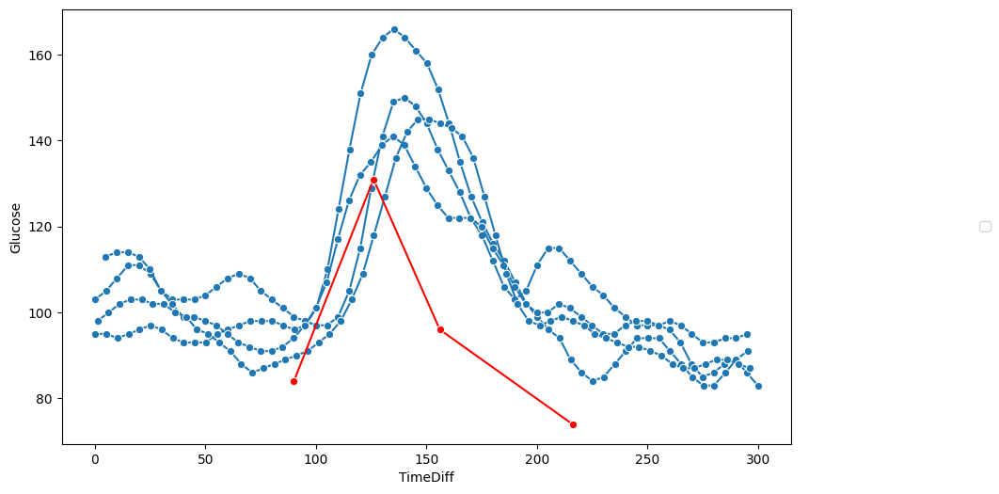

In [104]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=five_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_five, y="Glucose", x="TimeDiff", marker='o',color='red')

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

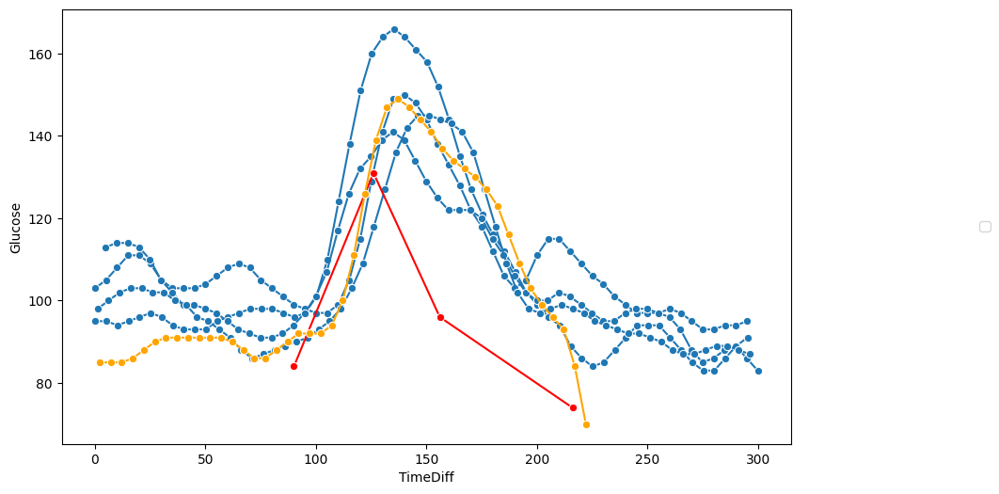

In [105]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=five_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_five, y="Glucose", x="TimeDiff", marker='o',color='red')
sns.lineplot(data=boost_cgm_five, y="Glucose", x="TimeDiff", marker='o',color='orange')

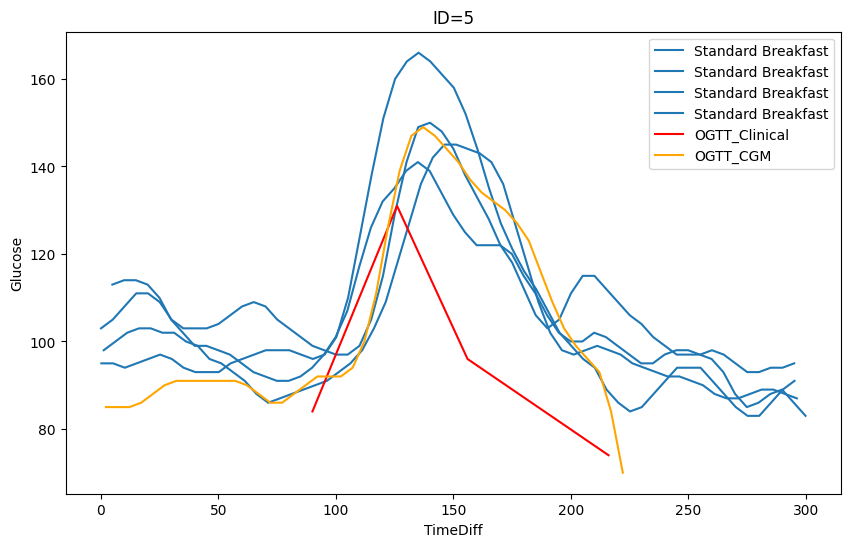

In [106]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=five_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=5')
sns.lineplot(data=df_gtt_five, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_five, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"])

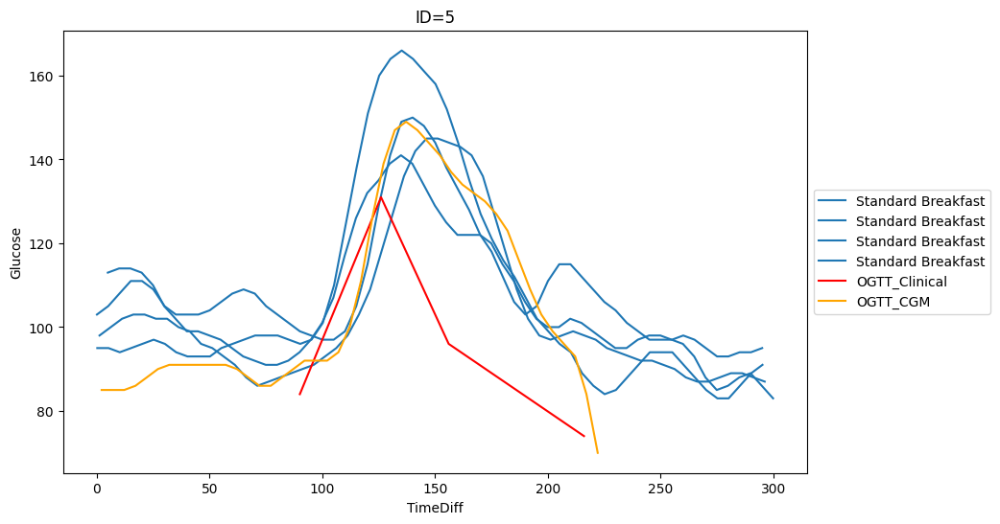

In [107]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=five_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=5')
sns.lineplot(data=df_gtt_five, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_five, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

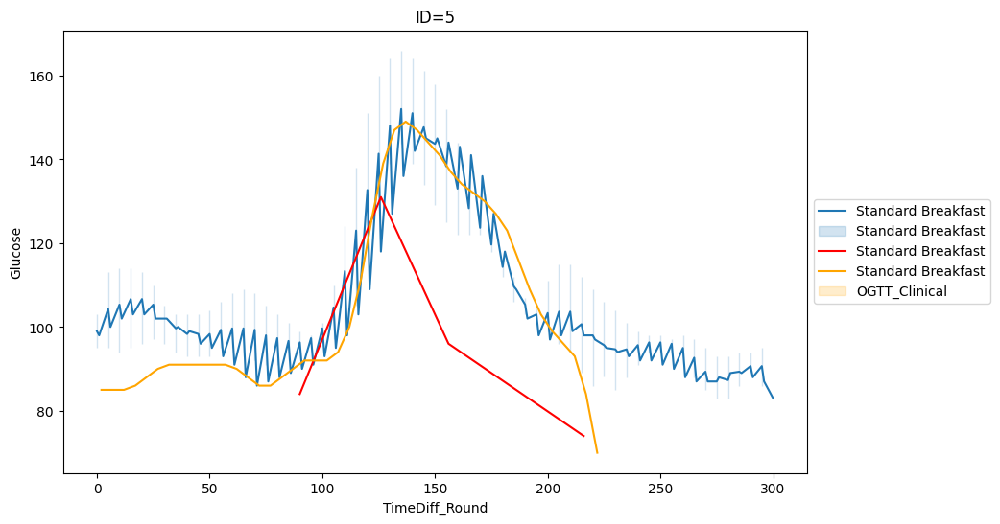

In [108]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=five_ogtt, y="Glucose", x="TimeDiff_Round", palette='bright').set(title='ID=5')
sns.lineplot(data=df_gtt_five, y="Glucose", x="TimeDiff_Round", color='red',estimator=None)
sns.lineplot(data=boost_cgm_five, y="Glucose", x="TimeDiff_Round", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [109]:
boost_sub=boost_cgm_five[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_five[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
ogtt_sub=five_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
boost_sub['id']=5
gtt_sub['id']=5
ogtt_sub['id']=5

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

food_responses=food_responses.append([ogtt_sub,gtt_sub,boost_sub])
food_responses


,TimeDiff,Glucose,Time,date,id,type
68,3.516667,88.0,2019-09-17 05:43:31,2019-09-17,1,standard_meal
69,8.533333,84.0,2019-09-17 05:48:32,2019-09-17,1,standard_meal
70,13.516667,81.0,2019-09-17 05:53:31,2019-09-17,1,standard_meal
71,18.516667,81.0,2019-09-17 05:58:31,2019-09-17,1,standard_meal
72,23.533333,83.0,2019-09-17 06:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2564,202.100000,99.0,2019-10-09 11:26:06,2019-10-09,5,boost_cgm
2565,207.083333,96.0,2019-10-09 11:31:05,2019-10-09,5,boost_cgm
2566,212.100000,93.0,2019-10-09 11:36:06,2019-10-09,5,boost_cgm
2567,217.083333,84.0,2019-10-09 11:41:05,2019-10-09,5,boost_cgm


[Text(0.5, 1.0, 'ID=5')]

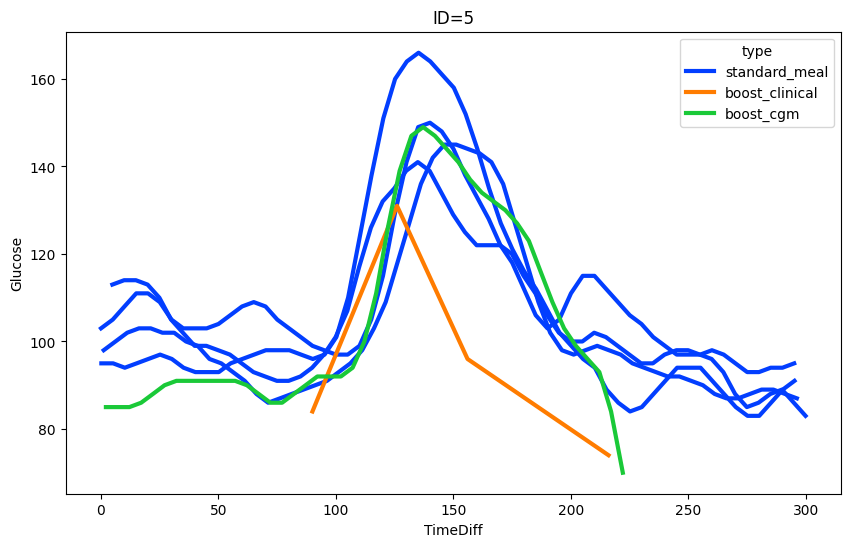

In [110]:
frng_5=food_responses[food_responses['id']==5]
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frng_5, y="Glucose", x="TimeDiff", palette='bright',hue='type',linewidth=3,units='date',estimator=None).set(title='ID=5')

Text(0.5, 1.0, 'ID=5')

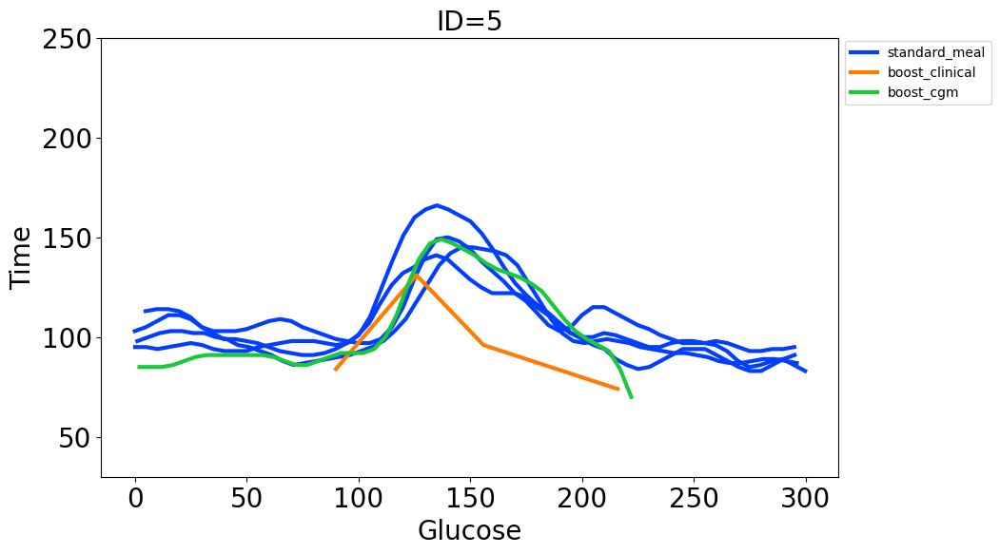

In [111]:
frng_5=food_responses[food_responses['id']==5]
plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frng_5, y="Glucose", x="TimeDiff", palette='bright',hue='type',linewidth=3,units='date',estimator=None).set(title='ID=5')
plt.ylim(30,250)
plt.legend(loc='center left', bbox_to_anchor=(1, .92), ncol=1)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel('Glucose', fontsize=20);
plt.ylabel('Time', fontsize=20);
plt.title('ID=5', fontsize=20)

In [112]:
max_times=five_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
five_ogtt.groupby('date')['TimeDiff_Round'].nunique()


date
2019-10-01    60
2019-10-03    60
2019-10-05    60
2019-10-07    60
Name: TimeDiff_Round, dtype: int64

In [113]:
max_times=five_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
five_ogtt.groupby('date')['TimeDiff_Round'].nunique()

dates=five_ogtt['date'].unique()
df_first_date=five_ogtt[five_ogtt['date']==dates[0]]

# five_ogtt_test=five_ogtt

column_names = five_ogtt.columns.tolist()

# Create an empty DataFrame with the same columns
df_ppgr_grouped_five = pd.DataFrame(columns=column_names)

for i in dates:
  df_date=five_ogtt[five_ogtt['date']==i]
  print(i)
  # df_date['nearest_time'] = df_first_date['TimeDiff'].apply(find_nearest_value)
  result_df = find_nearest_value(df_date, df_first_date, 'TimeDiff_Round', 'TimeDiff_Round')
  df_ppgr_grouped_five=df_ppgr_grouped_five.append(result_df)


# For grouped
boost_sub=boost_cgm_five[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_five[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
# ogtt_sub=five_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
ogtt_sub=df_ppgr_grouped_five[['nearest_TimeDiff_Round','Glucose','timestamp_dt','date']]
boost_sub['id']=5
gtt_sub['id']=5
ogtt_sub['id']=5

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

ogtt_sub.rename(columns={"nearest_TimeDiff_Round": "nearest_time_diff"},inplace=True)
boost_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)
gtt_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)


food_responses_grouped=food_responses_grouped.append([ogtt_sub,gtt_sub,boost_sub])
food_responses_grouped


2019-10-01
2019-10-03
2019-10-05
2019-10-07


,nearest_time_diff,Glucose,Time,date,id,type
68,4.000000,88.0,2019-09-17 05:43:31,2019-09-17,1,standard_meal
69,9.000000,84.0,2019-09-17 05:48:32,2019-09-17,1,standard_meal
70,14.000000,81.0,2019-09-17 05:53:31,2019-09-17,1,standard_meal
71,19.000000,81.0,2019-09-17 05:58:31,2019-09-17,1,standard_meal
72,24.000000,83.0,2019-09-17 06:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2564,202.100000,99.0,2019-10-09 11:26:06,2019-10-09,5,boost_cgm
2565,207.083333,96.0,2019-10-09 11:31:05,2019-10-09,5,boost_cgm
2566,212.100000,93.0,2019-10-09 11:36:06,2019-10-09,5,boost_cgm
2567,217.083333,84.0,2019-10-09 11:41:05,2019-10-09,5,boost_cgm


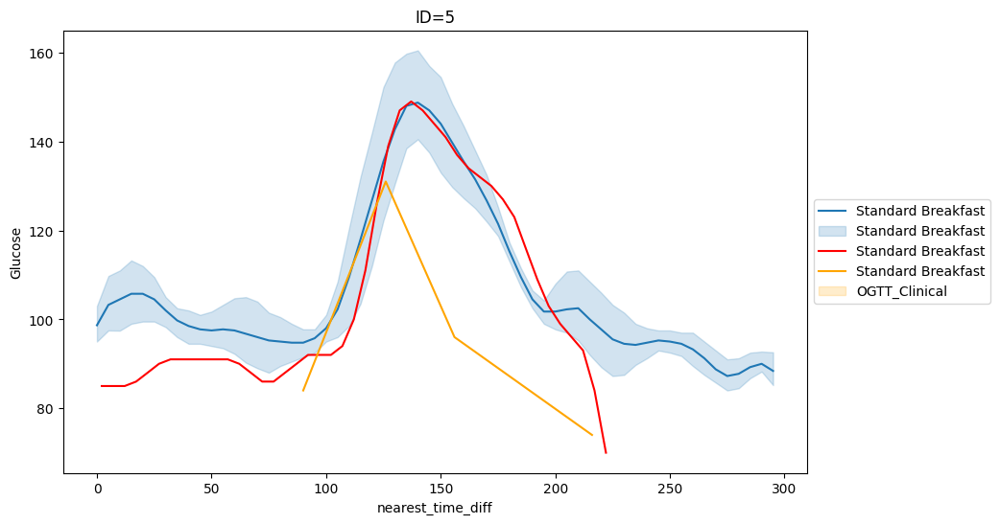

In [114]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ogtt_sub, y="Glucose", x="nearest_time_diff", palette='bright').set(title='ID=5')
sns.lineplot(data=boost_sub, y="Glucose", x="nearest_time_diff", color='red',estimator=None)
sns.lineplot(data=gtt_sub, y="Glucose", x="nearest_time_diff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

[Text(0.5, 1.0, 'ID=5')]

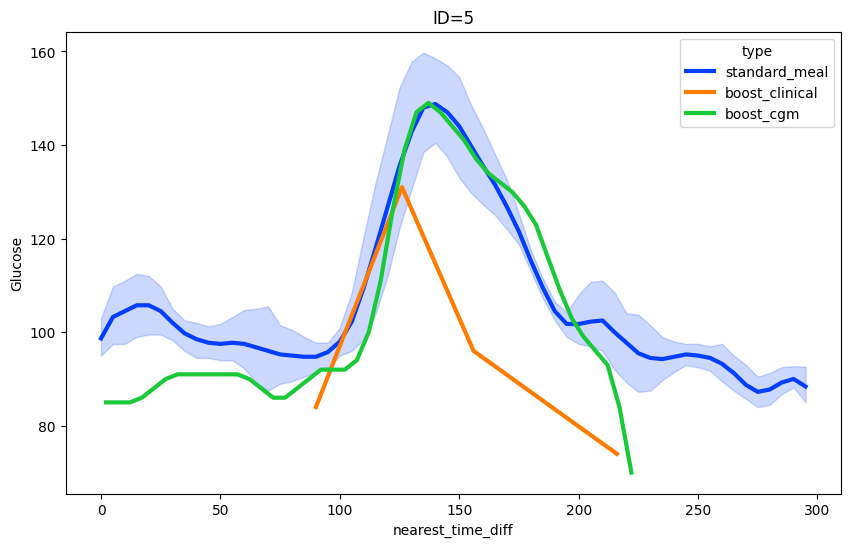

In [115]:
frg_5=food_responses_grouped[food_responses_grouped['id']==5]
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frg_5, y="Glucose", x="nearest_time_diff", palette='bright',hue='type',linewidth=3).set(title='ID=5')

Text(0.5, 1.0, 'ID=5')

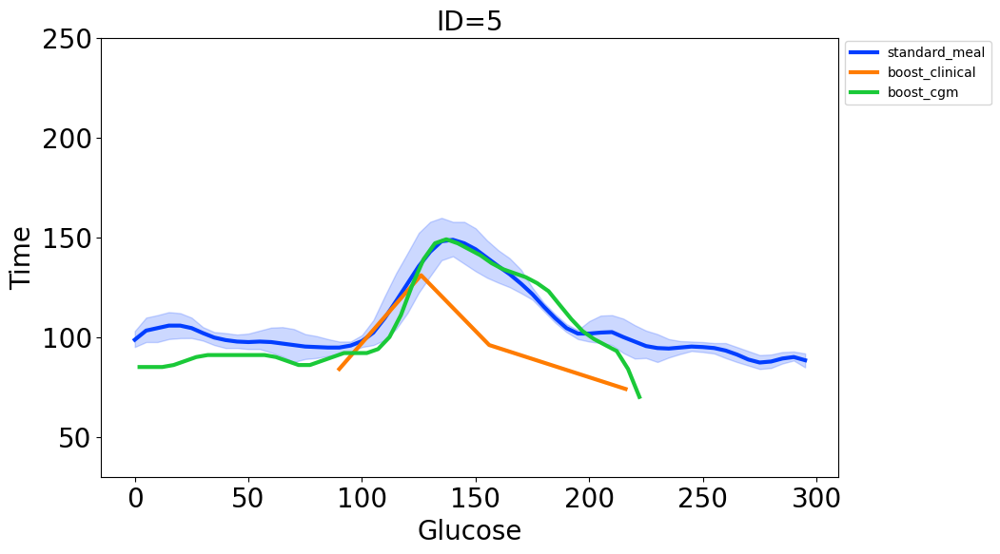

In [116]:
frg_5=food_responses_grouped[food_responses_grouped['id']==5]
plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frg_5, y="Glucose", x="nearest_time_diff", palette='bright',hue='type',linewidth=3).set(title='ID=5')
plt.ylim(30,250)
plt.legend(loc='center left', bbox_to_anchor=(1, .92), ncol=1)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel('Glucose', fontsize=20);
plt.ylabel('Time', fontsize=20);
plt.title('ID=5', fontsize=20)

In [117]:
s = '19-006'

GTT = [85,99,104,75]
GTT_times = ['2019-10-11 7:52:00', '2019-10-11 8:26:00', '2019-10-11 8:56:00', '2019-10-11 9:56:00']
GTT_times = pd.to_datetime(GTT_times, format='%Y-%m-%dT%H:%M:%S')

df_gtt_six = pd.DataFrame({'Glucose': GTT, 'Time': GTT_times})
auc_ogtt_six=calculate_area_under_curve(df_gtt_six)
auc_ogtt_six


11543

In [118]:
# df_gtt_six['Time']=pd.to_datetime(df_gtt_six['Time'])
# df_gtt_six['TimeDiff'] = (df_gtt_six['Time'] - df_gtt_six['Time'].min()).dt.total_seconds()/ 60

In [119]:
# cgm_six.head(2)

In [120]:
# food_six=pd.read_excel('Food Logs/Food Log/Food_Log_006.xlsx')
# food_six.head()

In [121]:
# food_six[food_six.logged_food=='Boost']

In [122]:
# cgm_six=pd.read_csv('Wearables + CGM data/006/Dexcom.csv')
cgm_six=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/006/Dexcom_006.csv')
cgm_six['timestamp_dt']=pd.to_datetime(cgm_six['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_six['Glucose']=cgm_six['Glucose Value (mg/dL)']
cgm_six['Time']=pd.to_datetime(cgm_six['Timestamp (YYYY-MM-DDThh:mm:ss)'])

cgm_six=cgm_six.dropna(subset = ['timestamp_dt'])
cgm_six['date']=cgm_six['timestamp_dt'].dt.date
cgm_six

# food_six=pd.read_excel('Food Logs/Food Log/Food_Log_006.xlsx')
food_six=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/006/Food_Log_006.csv')

food_six['date']=pd.to_datetime(food_six['date']).dt.date

# food_six['date']=pd.to_datetime(food_six['date']).dt.date

# food_six.rename(columns={"time_begin": "time_begin_actual"},inplace=True)
# food_six['time_begin']=pd.to_datetime(food_six['date'].astype(str) + ' ' + food_six['time_begin_actual'].astype(str))

food_six['time_begin']=pd.to_datetime(food_six['time_begin'])
# window_dt = pd.Timedelta(minutes=120)
window_dt = pd.Timedelta(minutes=210)

food_six["time_begin_win"] = food_six["time_begin"]  + window_dt

merge_food_cgm_six=pd.merge(cgm_six,food_six,left_on=['date'],right_on=['date'])

cf_six=food_six[food_six['logged_food']=='Std breakfast']

merge_food_cgm_six=pd.merge(cgm_six,cf_six,left_on=['date'],right_on=['date'])
# window_dt_brkfst = pd.Timedelta(minutes=-30)
# change to -90
window_dt_brkfst = pd.Timedelta(minutes=-90)

food_cgm_six_cf=merge_food_cgm_six[(merge_food_cgm_six['timestamp_dt']<=merge_food_cgm_six['time_begin_win'])&(merge_food_cgm_six['timestamp_dt']>=(merge_food_cgm_six['time_begin']+window_dt_brkfst))]

food_cgm_six_cf['pre_glu_time']=food_cgm_six_cf.groupby('date')['timestamp_dt'].transform('min')

column_names=food_cgm_six_cf.columns.values
food_cgm_six_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_six_cf['date'].unique():
  date_sub=food_cgm_six_cf[food_cgm_six_cf['date']==i]

  date_sub = date_sub.sort_values(by='timestamp_dt')
  min_glu=date_sub['Glucose Value (mg/dL)'].iloc[0]
  date_sub['min_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

  final_glu=date_sub['Glucose Value (mg/dL)'].iloc[-1]
  date_sub['final_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

  max_glu=date_sub['Glucose Value (mg/dL)'].max()
  date_sub['max_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

  date_sub['meal_auc'] = calculate_area_under_curve(date_sub)
  date_sub['auc_ogtt_six']=auc_ogtt_six
  j= i - dt.timedelta(days=1)
  cgm_six_ld=cgm_six[cgm_six['date']==j]

  date_sub['mean_glu_ld']=cgm_six_ld.groupby('date')['Glucose'].transform('mean').iloc[0]
  date_sub['interdaycv']=interdaycv(cgm_six_ld)
  date_sub['interdaysd']=interdaysd(cgm_six_ld)
  date_sub['TIR']=TIR(cgm_six_ld, sd=1, sr=5)
  date_sub['TOR']=TOR(cgm_six_ld, sd=1, sr=5)
  date_sub['POR']=POR(cgm_six_ld, sd=1, sr=5)
  date_sub['PIR']=PIR(cgm_six_ld, sd=1, sr=5)
  date_sub['MGE']=MGE(cgm_six_ld, sd=1)
  date_sub['MGN']=MGN(cgm_six_ld, sd=1)
  #MAGE(cgm_six, std=1)
  date_sub['J_index']=J_index(cgm_six_ld)
  date_sub['LBGI']=LBGI(cgm_six_ld)
  date_sub['HBGI']=HBGI(cgm_six_ld)
  #MODD(cgm_six)
  #CONGA24(cgm_six)
  date_sub['GMI']=GMI(date_sub)

  food_cgm_six_cf_all_dates=food_cgm_six_cf_all_dates.append(date_sub)

six_ogtt=food_cgm_six_cf_all_dates

six_ogtt_dup=six_ogtt.drop_duplicates(subset=['date'], keep='first')
six_ogtt_dup['id']=6
six_ogtt_dup['a1c']="PD"


In [123]:
# merge_food_cgm_six

In [124]:
window_dt = pd.Timedelta(minutes=150)
# boost_time=dt.datetime(2020,3,6,8,0,0)
# boost_time=dt.datetime(2020,3,9,7,22,0)
# change to -90
boost_time=dt.datetime(2020,3,9,6,22,0)
#2019-10-08 8:32:00
#2019-10-08 8:32:00
# 2019-10-11 7:52:00
# 2020-03-09 07:30:00

# boost_cgm_six=cgm_six[(cgm_six['timestamp_dt']>=boost_time)&(cgm_six['timestamp_dt']<=boost_time + window_dt)]
boost_cgm_six=cgm_six[(cgm_six['timestamp_dt']>=boost_time)]
boost_cgm_six.head(4)
#food_thirteen["time_begin_win"] = food_thirteen["time_begin"] + window_dt

#cgm_thirteen[cgm_thirteen['timestamp_dt']>=dt.datetime(2020,6,4,9,30,0)]


,Index,Timestamp (YYYY-MM-DDThh:mm:ss),Event Type,Event Subtype,Patient Info,Device Info,Source Device ID,Glucose Value (mg/dL),Insulin Value (u),Carb Value (grams),Duration (hh:mm:ss),Glucose Rate of Change (mg/dL/min),Transmitter Time (Long Integer),timestamp_dt,Glucose,Time,date
2821,2822,2020-03-09 06:22:51,EGV,NaN,NaN,NaN,iPhone G6,108.0,NaN,NaN,NaN,NaN,850479.0,2020-03-09 06:22:51,108.0,2020-03-09 06:22:51,2020-03-09
2822,2823,2020-03-09 06:27:51,EGV,NaN,NaN,NaN,iPhone G6,108.0,NaN,NaN,NaN,NaN,850779.0,2020-03-09 06:27:51,108.0,2020-03-09 06:27:51,2020-03-09
2823,2824,2020-03-09 06:32:51,EGV,NaN,NaN,NaN,iPhone G6,108.0,NaN,NaN,NaN,NaN,851079.0,2020-03-09 06:32:51,108.0,2020-03-09 06:32:51,2020-03-09
2824,2825,2020-03-09 06:37:51,EGV,NaN,NaN,NaN,iPhone G6,108.0,NaN,NaN,NaN,NaN,851379.0,2020-03-09 06:37:51,108.0,2020-03-09 06:37:51,2020-03-09


In [125]:
six_ogtt['TimeDiff'] = (six_ogtt['timestamp_dt'] - (six_ogtt['time_begin']+window_dt_brkfst)).dt.total_seconds()/ 60

# Group by and use cumcount
six_ogtt['SequentialTimeValues'] = six_ogtt.groupby('date').cumcount() + 1

df_gtt_six['Time']=pd.to_datetime(df_gtt_six['Time'])
min_six=df_gtt_six['Time'].min()

df_gtt_six['TimeDiff'] = (df_gtt_six['Time'] - (df_gtt_six['Time'].min()+window_dt_brkfst)).dt.total_seconds()/ 60

boost_cgm_six['TimeDiff'] = (boost_cgm_six['timestamp_dt'] - boost_time).dt.total_seconds()/ 60


In [126]:
six_ogtt['TimeDiff_Round']=six_ogtt['TimeDiff'].round()
df_gtt_six['TimeDiff_Round']=df_gtt_six['TimeDiff'].round()
boost_cgm_six['TimeDiff_Round']=boost_cgm_six['TimeDiff'].round()

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

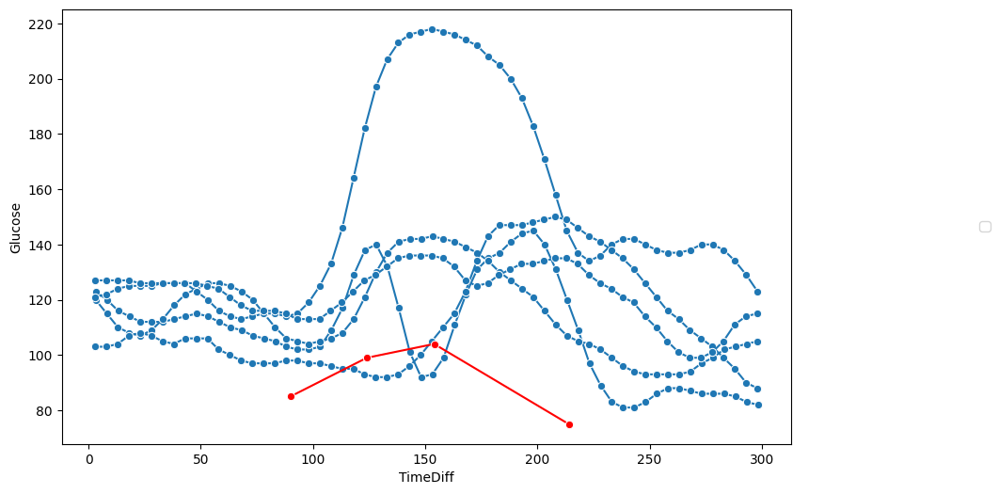

In [127]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=six_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_six, y="Glucose", x="TimeDiff", marker='o',color='red')


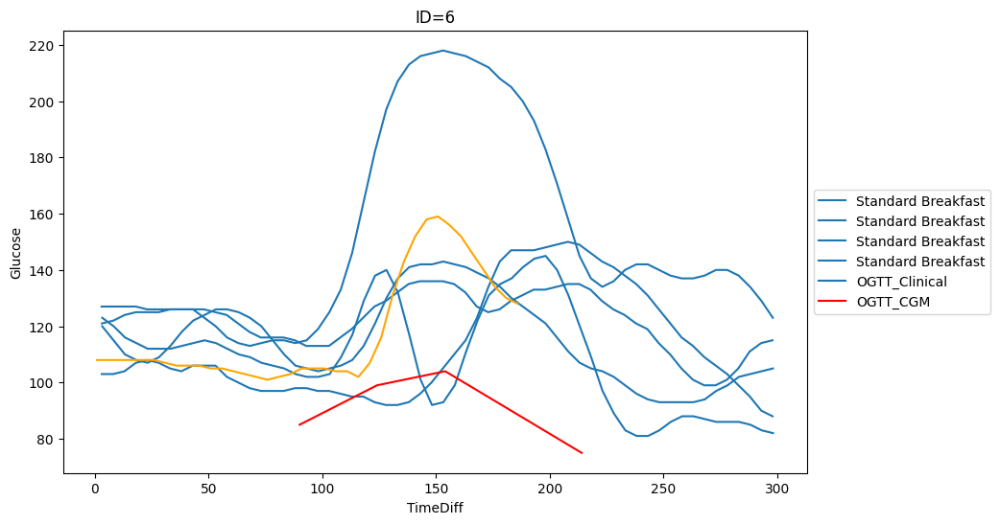

In [128]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=six_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=6')
sns.lineplot(data=df_gtt_six, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_six, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


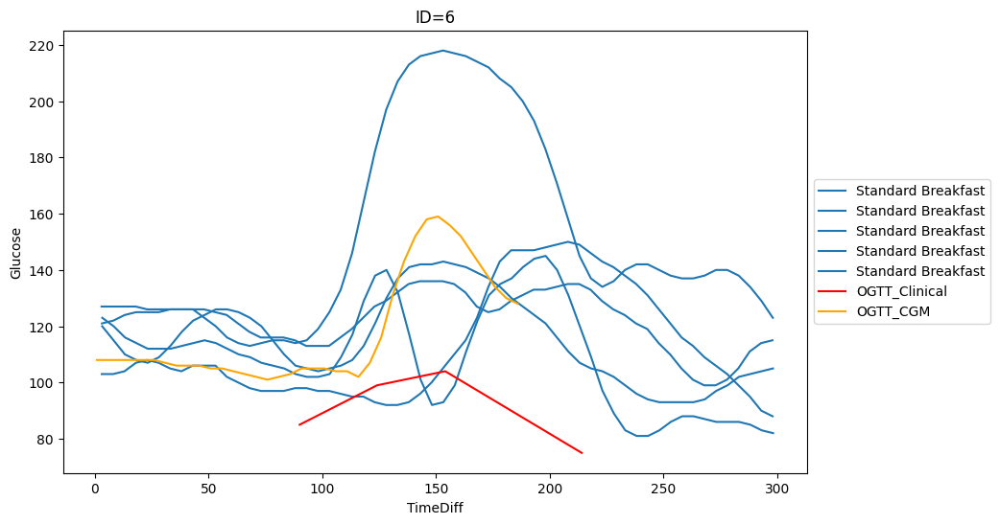

In [129]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=six_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=6')
sns.lineplot(data=df_gtt_six, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_six, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

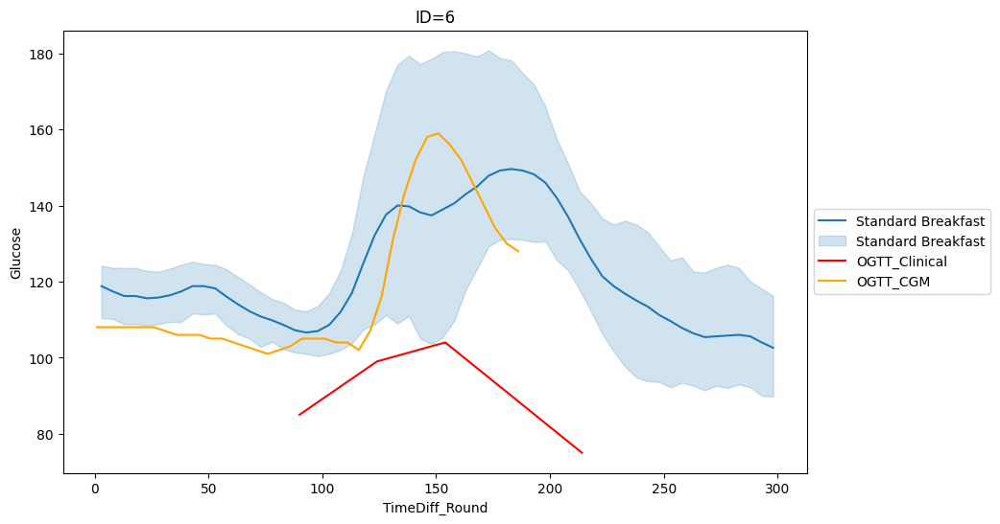

In [130]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=six_ogtt, y="Glucose", x="TimeDiff_Round", palette='bright').set(title='ID=6')
sns.lineplot(data=df_gtt_six, y="Glucose", x="TimeDiff_Round", color='red',estimator=None)
sns.lineplot(data=boost_cgm_six, y="Glucose", x="TimeDiff_Round", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [131]:
boost_sub=boost_cgm_six[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_six[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
ogtt_sub=six_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
boost_sub['id']=6
gtt_sub['id']=6
ogtt_sub['id']=6

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

food_responses=food_responses.append([ogtt_sub,gtt_sub,boost_sub])
food_responses


,TimeDiff,Glucose,Time,date,id,type
68,3.516667,88.0,2019-09-17 05:43:31,2019-09-17,1,standard_meal
69,8.533333,84.0,2019-09-17 05:48:32,2019-09-17,1,standard_meal
70,13.516667,81.0,2019-09-17 05:53:31,2019-09-17,1,standard_meal
71,18.516667,81.0,2019-09-17 05:58:31,2019-09-17,1,standard_meal
72,23.533333,83.0,2019-09-17 06:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2854,165.850000,146.0,2020-03-09 09:07:51,2020-03-09,6,boost_cgm
2855,170.866667,140.0,2020-03-09 09:12:52,2020-03-09,6,boost_cgm
2856,175.850000,134.0,2020-03-09 09:17:51,2020-03-09,6,boost_cgm
2857,180.850000,130.0,2020-03-09 09:22:51,2020-03-09,6,boost_cgm


[Text(0.5, 1.0, 'ID=6')]

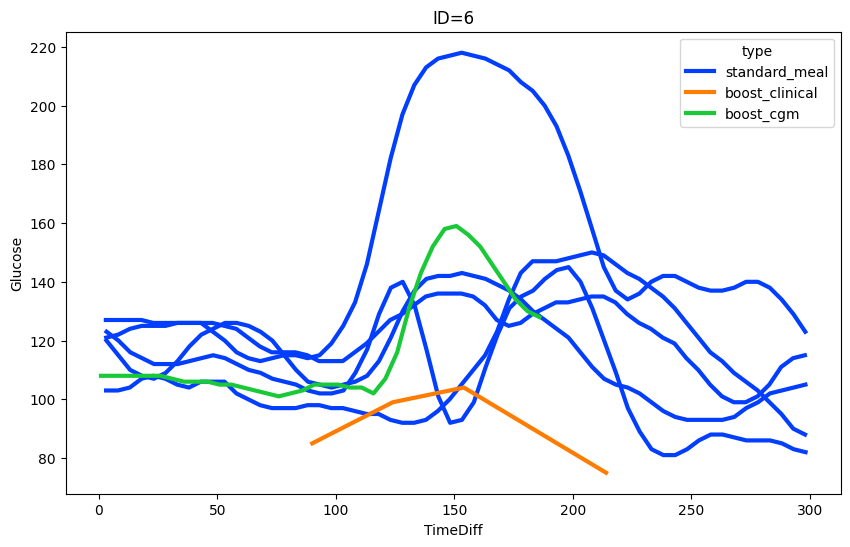

In [132]:
frng_6=food_responses[food_responses['id']==6]
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frng_6, y="Glucose", x="TimeDiff", palette='bright',hue='type',linewidth=3,units='date',estimator=None).set(title='ID=6')

Text(0.5, 1.0, 'ID=6')

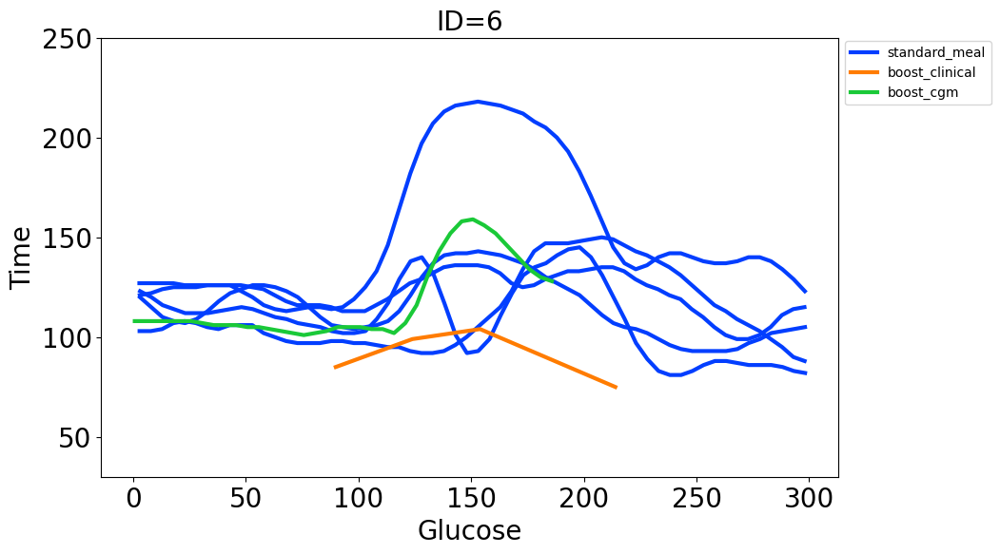

In [133]:
frng_6=food_responses[food_responses['id']==6]
plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frng_6, y="Glucose", x="TimeDiff", palette='bright',hue='type',linewidth=3,units='date',estimator=None).set(title='ID=6')
plt.ylim(30,250)
plt.legend(loc='center left', bbox_to_anchor=(1, .92), ncol=1)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel('Glucose', fontsize=20);
plt.ylabel('Time', fontsize=20);
plt.title('ID=6', fontsize=20)

In [134]:
max_times=six_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
six_ogtt.groupby('date')['TimeDiff_Round'].nunique()

date
2020-02-29    60
2020-03-02    60
2020-03-04    60
2020-03-06    60
2020-03-08    60
Name: TimeDiff_Round, dtype: int64

In [135]:
max_times=six_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
six_ogtt.groupby('date')['TimeDiff_Round'].nunique()

dates=six_ogtt['date'].unique()
df_first_date=six_ogtt[six_ogtt['date']==dates[0]]

# six_ogtt_test=six_ogtt

column_names = six_ogtt.columns.tolist()

# Create an empty DataFrame with the same columns
df_ppgr_grouped_six = pd.DataFrame(columns=column_names)

for i in dates:
  df_date=six_ogtt[six_ogtt['date']==i]
  print(i)
  # df_date['nearest_time'] = df_first_date['TimeDiff'].apply(find_nearest_value)
  result_df = find_nearest_value(df_date, df_first_date, 'TimeDiff_Round', 'TimeDiff_Round')
  df_ppgr_grouped_six=df_ppgr_grouped_six.append(result_df)


# For grouped
boost_sub=boost_cgm_six[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_six[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
# ogtt_sub=six_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
ogtt_sub=df_ppgr_grouped_six[['nearest_TimeDiff_Round','Glucose','timestamp_dt','date']]
boost_sub['id']=6
gtt_sub['id']=6
ogtt_sub['id']=6

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

ogtt_sub.rename(columns={"nearest_TimeDiff_Round": "nearest_time_diff"},inplace=True)
boost_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)
gtt_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)


food_responses_grouped=food_responses_grouped.append([ogtt_sub,gtt_sub,boost_sub])
food_responses_grouped


2020-02-29
2020-03-02
2020-03-04
2020-03-06
2020-03-08


,nearest_time_diff,Glucose,Time,date,id,type
68,4.000000,88.0,2019-09-17 05:43:31,2019-09-17,1,standard_meal
69,9.000000,84.0,2019-09-17 05:48:32,2019-09-17,1,standard_meal
70,14.000000,81.0,2019-09-17 05:53:31,2019-09-17,1,standard_meal
71,19.000000,81.0,2019-09-17 05:58:31,2019-09-17,1,standard_meal
72,24.000000,83.0,2019-09-17 06:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2854,165.850000,146.0,2020-03-09 09:07:51,2020-03-09,6,boost_cgm
2855,170.866667,140.0,2020-03-09 09:12:52,2020-03-09,6,boost_cgm
2856,175.850000,134.0,2020-03-09 09:17:51,2020-03-09,6,boost_cgm
2857,180.850000,130.0,2020-03-09 09:22:51,2020-03-09,6,boost_cgm


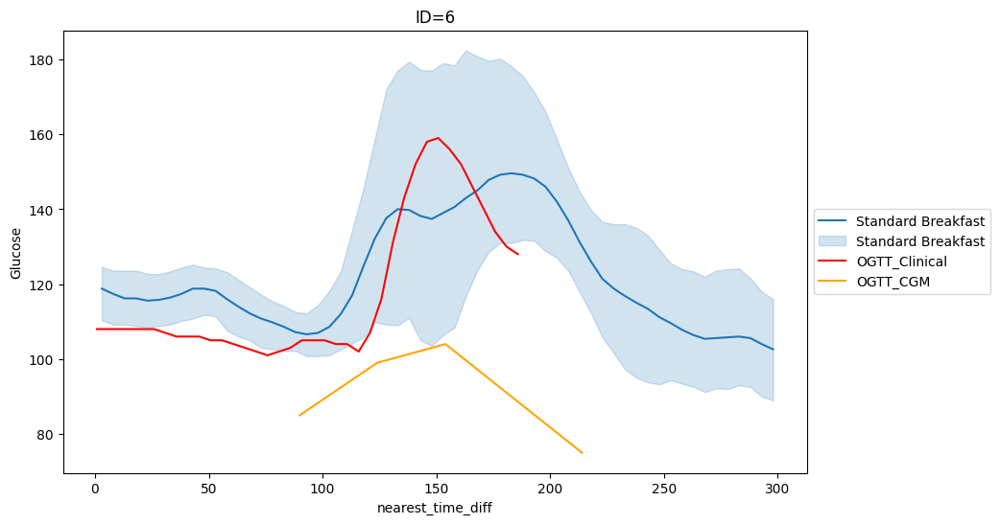

In [136]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ogtt_sub, y="Glucose", x="nearest_time_diff", palette='bright').set(title='ID=6')
sns.lineplot(data=boost_sub, y="Glucose", x="nearest_time_diff", color='red',estimator=None)
sns.lineplot(data=gtt_sub, y="Glucose", x="nearest_time_diff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

[Text(0.5, 1.0, 'ID=6')]

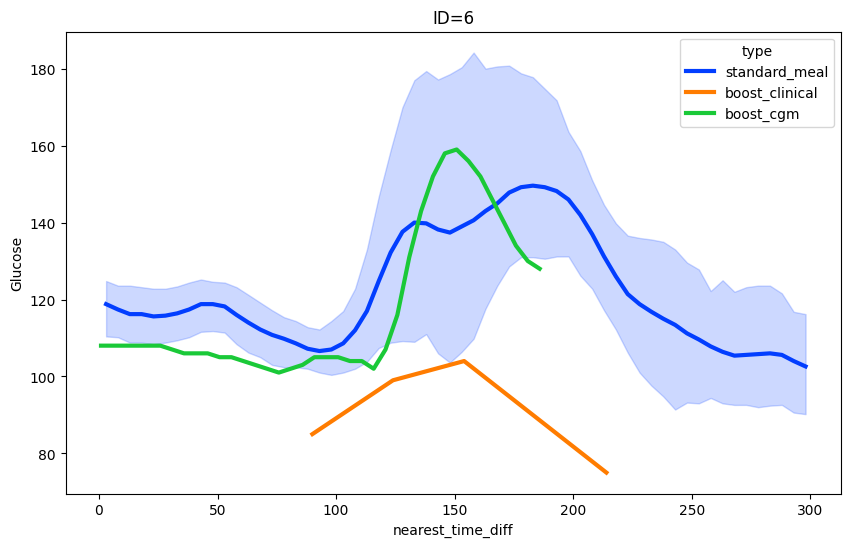

In [137]:
frg_6=food_responses_grouped[food_responses_grouped['id']==6]
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frg_6, y="Glucose", x="nearest_time_diff", palette='bright',hue='type',linewidth=3).set(title='ID=6')

Text(0.5, 1.0, 'ID=6')

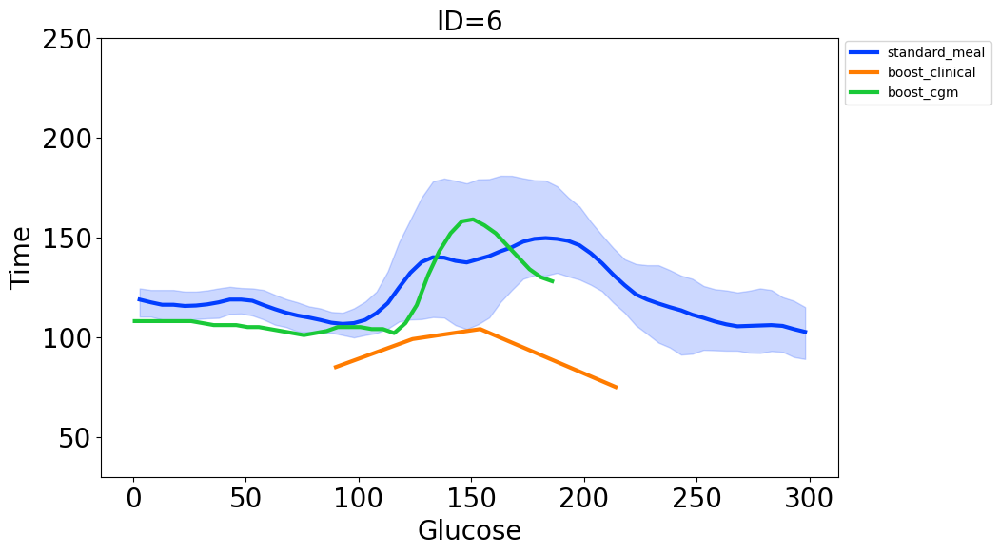

In [138]:
frg_6=food_responses_grouped[food_responses_grouped['id']==6]
plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frg_6, y="Glucose", x="nearest_time_diff", palette='bright',hue='type',linewidth=3).set(title='ID=6')
plt.ylim(30,250)
plt.legend(loc='center left', bbox_to_anchor=(1, .92), ncol=1)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel('Glucose', fontsize=20);
plt.ylabel('Time', fontsize=20);
plt.title('ID=6', fontsize=20)

In [139]:
s = '19-007'

GTT = [84,98,76,99]
GTT_times = ['2019-10-24 9:00:00', '2019-10-24 9:35:00', '2019-10-24 10:05:00', '2019-10-24 11:05:00']
GTT_times = pd.to_datetime(GTT_times, format='%Y-%m-%dT%H:%M:%S')

df_gtt_seven = pd.DataFrame({'Glucose': GTT, 'Time': GTT_times})
auc_ogtt_seven=calculate_area_under_curve(df_gtt_seven)
auc_ogtt_seven

11045

In [140]:
# food_seven=pd.read_excel('Food Logs/Food Log/Food_Log_007.xlsx')
# food_seven.head(3)

In [141]:
cgm_seven = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/007/Dexcom_007.csv')
# cgm_seven=pd.read_csv('Wearables + CGM data/007/Dexcom.csv')
cgm_seven['timestamp_dt'] = pd.to_datetime(cgm_seven['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_seven['Glucose'] = cgm_seven['Glucose Value (mg/dL)']
cgm_seven['Time'] = pd.to_datetime(cgm_seven['Timestamp (YYYY-MM-DDThh:mm:ss)'])

cgm_seven = cgm_seven.dropna(subset=['timestamp_dt'])
cgm_seven['date'] = cgm_seven['timestamp_dt'].dt.date
cgm_seven

food_seven = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/007/Food_Log_007.csv')
# food_seven=pd.read_excel('Food Logs/Food Log/Food_Log_007.xlsx')


# food_seven.rename(columns={"time_begin": "time_begin_actual"},inplace=True)
# food_seven['time_begin']=pd.to_datetime(food_seven['date'].astype(str) + ' ' + food_seven['time_begin_actual'].astype(str))


food_seven['date'] = pd.to_datetime(food_seven['date']).dt.date

food_seven['time_begin'] = pd.to_datetime(food_seven['time_begin'])
# window_dt = pd.Timedelta(minutes=120)
window_dt = pd.Timedelta(minutes=210)


food_seven["time_begin_win"] = food_seven["time_begin"] + window_dt

merge_food_cgm_seven = pd.merge(cgm_seven, food_seven, left_on=['date'], right_on=['date'])

cf_seven = food_seven[food_seven['Food_Item']=='Std Bfast']

merge_food_cgm_seven = pd.merge(cgm_seven, cf_seven, left_on=['date'], right_on=['date'])
# window_dt_brkfst = pd.Timedelta(minutes=-30)
# change to -90
window_dt_brkfst = pd.Timedelta(minutes=-90)

food_cgm_seven_cf = merge_food_cgm_seven[(merge_food_cgm_seven['timestamp_dt'] <= merge_food_cgm_seven['time_begin_win']) & (merge_food_cgm_seven['timestamp_dt'] >= (merge_food_cgm_seven['time_begin']+window_dt_brkfst))]

food_cgm_seven_cf['pre_glu_time'] = food_cgm_seven_cf.groupby('date')['timestamp_dt'].transform('min')

column_names = food_cgm_seven_cf.columns.values
food_cgm_seven_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_seven_cf['date'].unique():
    date_sub = food_cgm_seven_cf[food_cgm_seven_cf['date'] == i]

    date_sub = date_sub.sort_values(by='timestamp_dt')
    min_glu = date_sub['Glucose Value (mg/dL)'].iloc[0]
    date_sub['min_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

    final_glu = date_sub['Glucose Value (mg/dL)'].iloc[-1]
    date_sub['final_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

    max_glu = date_sub['Glucose Value (mg/dL)'].max()
    date_sub['max_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

    date_sub['meal_auc'] = calculate_area_under_curve(date_sub)
    date_sub['auc_ogtt_seven'] = auc_ogtt_seven
    j = i - dt.timedelta(days=1)
    cgm_seven_ld = cgm_seven[cgm_seven['date'] == j]

    date_sub['mean_glu_ld'] = cgm_seven_ld.groupby('date')['Glucose'].transform('mean').iloc[0]
    date_sub['interdaycv'] = interdaycv(cgm_seven_ld)
    date_sub['interdaysd'] = interdaysd(cgm_seven_ld)
    date_sub['TIR'] = TIR(cgm_seven_ld, sd=1, sr=5)
    date_sub['TOR'] = TOR(cgm_seven_ld, sd=1, sr=5)
    date_sub['POR'] = POR(cgm_seven_ld, sd=1, sr=5)
    date_sub['PIR'] = PIR(cgm_seven_ld, sd=1, sr=5)
    date_sub['MGE'] = MGE(cgm_seven_ld, sd=1)
    date_sub['MGN'] = MGN(cgm_seven_ld, sd=1)
    # MAGE(cgm_seven, std=1)
    date_sub['J_index'] = J_index(cgm_seven_ld)
    date_sub['LBGI'] = LBGI(cgm_seven_ld)
    date_sub['HBGI'] = HBGI(cgm_seven_ld)
    # MODD(cgm_seven)
    # CONGA24(cgm_seven)
    date_sub['GMI'] = GMI(date_sub)

    food_cgm_seven_cf_all_dates = food_cgm_seven_cf_all_dates.append(date_sub)

seven_ogtt = food_cgm_seven_cf_all_dates

seven_ogtt_dup = seven_ogtt.drop_duplicates(subset=['date'], keep='first')
seven_ogtt_dup['id'] = 7
seven_ogtt_dup['a1c'] = "PD"


In [142]:
# print(food_seven[food_seven['Food_Item']=='Std Bfast'])
# food_seven[food_seven['Food_Item']=='Boost']

In [143]:
window_dt = pd.Timedelta(minutes=160)
# boost_time=dt.datetime(2020,3,22,8,30,0)
# change to -90
boost_time=dt.datetime(2020,3,22,7,30,0)
#8:53:00
# 2019-10-24 9:00:00

# boost_cgm_seven=cgm_seven[(cgm_seven['timestamp_dt']>=boost_time)&(cgm_seven['timestamp_dt']<=boost_time + window_dt)]
boost_cgm_seven=cgm_seven[(cgm_seven['timestamp_dt']>=boost_time)]
boost_cgm_seven.head(4)


,Index,Timestamp (YYYY-MM-DDThh:mm:ss),Event Type,Event Subtype,Patient Info,Device Info,Source Device ID,Glucose Value (mg/dL),Insulin Value (u),Carb Value (grams),Duration (hh:mm:ss),Glucose Rate of Change (mg/dL/min),Transmitter Time (Long Integer),timestamp_dt,Glucose,Time,date
2174,2175,2020-03-22 07:31:56,EGV,NaN,NaN,NaN,Android G6,85.0,NaN,NaN,NaN,NaN,681882.0,2020-03-22 07:31:56,85.0,2020-03-22 07:31:56,2020-03-22
2175,2176,2020-03-22 07:36:57,EGV,NaN,NaN,NaN,Android G6,88.0,NaN,NaN,NaN,NaN,682182.0,2020-03-22 07:36:57,88.0,2020-03-22 07:36:57,2020-03-22
2176,2177,2020-03-22 07:41:57,EGV,NaN,NaN,NaN,Android G6,90.0,NaN,NaN,NaN,NaN,682482.0,2020-03-22 07:41:57,90.0,2020-03-22 07:41:57,2020-03-22
2177,2178,2020-03-22 07:46:57,EGV,NaN,NaN,NaN,Android G6,88.0,NaN,NaN,NaN,NaN,682782.0,2020-03-22 07:46:57,88.0,2020-03-22 07:46:57,2020-03-22


In [144]:
# seven_ogtt['TimeDiff'] = (seven_ogtt['timestamp_dt'] - seven_ogtt['time_begin']).dt.total_seconds()/ 60
seven_ogtt['TimeDiff'] = (seven_ogtt['timestamp_dt'] - (seven_ogtt['time_begin']+window_dt_brkfst)).dt.total_seconds()/ 60

# Group by and use cumcount
seven_ogtt['SequentialTimeValues'] = seven_ogtt.groupby('date').cumcount() + 1

df_gtt_seven['Time']=pd.to_datetime(df_gtt_seven['Time'])

# df_gtt_seven['TimeDiff'] = (df_gtt_seven['Time'] - df_gtt_seven['Time'].min()).dt.total_seconds()/ 60
df_gtt_seven['TimeDiff'] = (df_gtt_seven['Time'] - (df_gtt_seven['Time'].min()+window_dt_brkfst)).dt.total_seconds()/ 60


boost_cgm_seven['TimeDiff'] = (boost_cgm_seven['timestamp_dt'] - boost_time).dt.total_seconds()/ 60


In [145]:
seven_ogtt['TimeDiff_Round']=seven_ogtt['TimeDiff'].round()
df_gtt_seven['TimeDiff_Round']=df_gtt_seven['TimeDiff'].round()
boost_cgm_seven['TimeDiff_Round']=boost_cgm_seven['TimeDiff'].round()

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

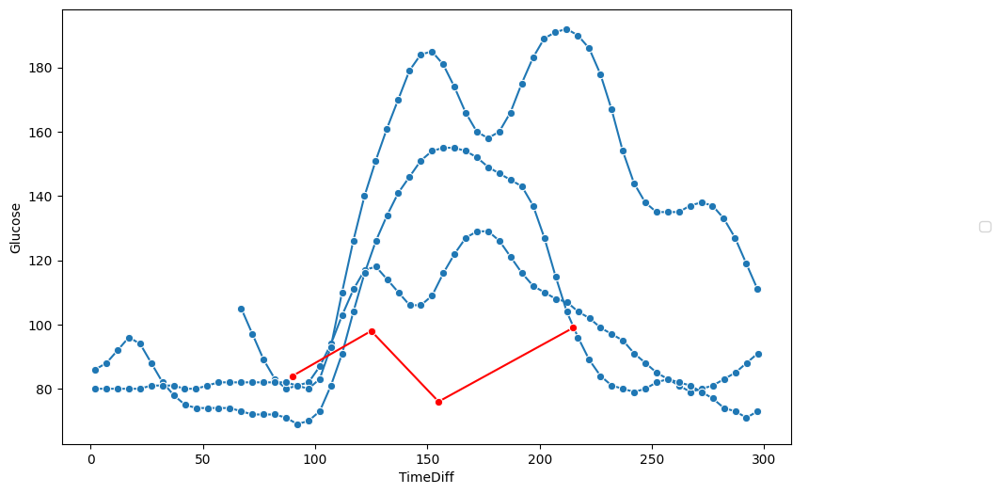

In [146]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=seven_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_seven, y="Glucose", x="TimeDiff", marker='o',color='red')

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

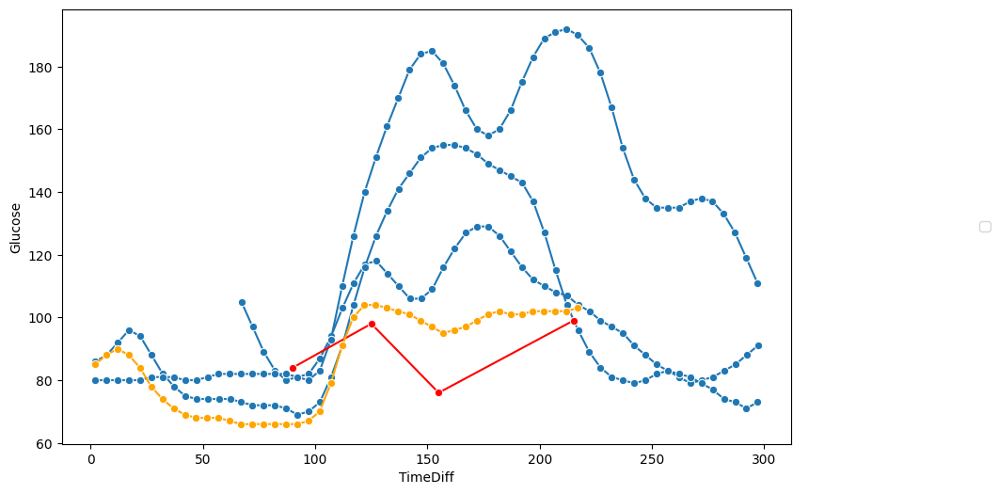

In [147]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=seven_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_seven, y="Glucose", x="TimeDiff", marker='o',color='red')
sns.lineplot(data=boost_cgm_seven, y="Glucose", x="TimeDiff", marker='o',color='orange')

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

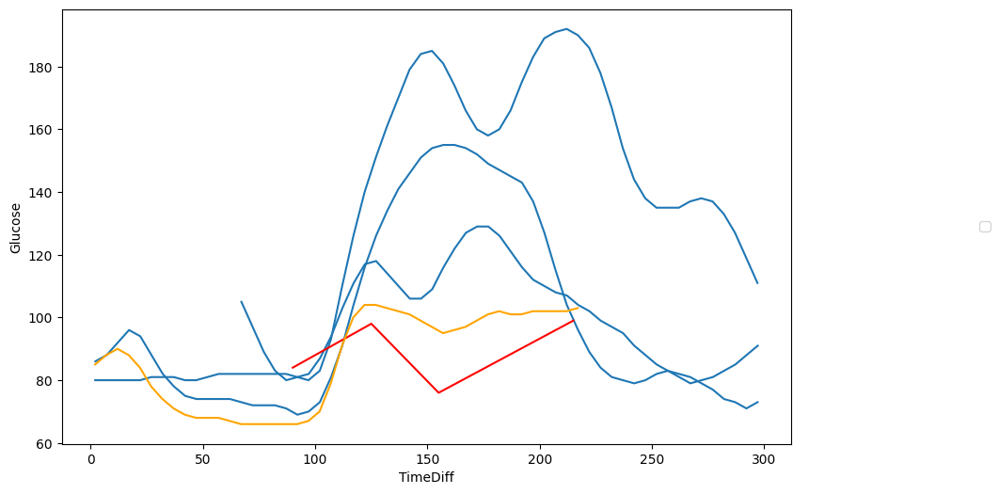

In [148]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=seven_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None)
sns.lineplot(data=df_gtt_seven, y="Glucose", x="TimeDiff",color='red')
sns.lineplot(data=boost_cgm_seven, y="Glucose", x="TimeDiff", color='orange')

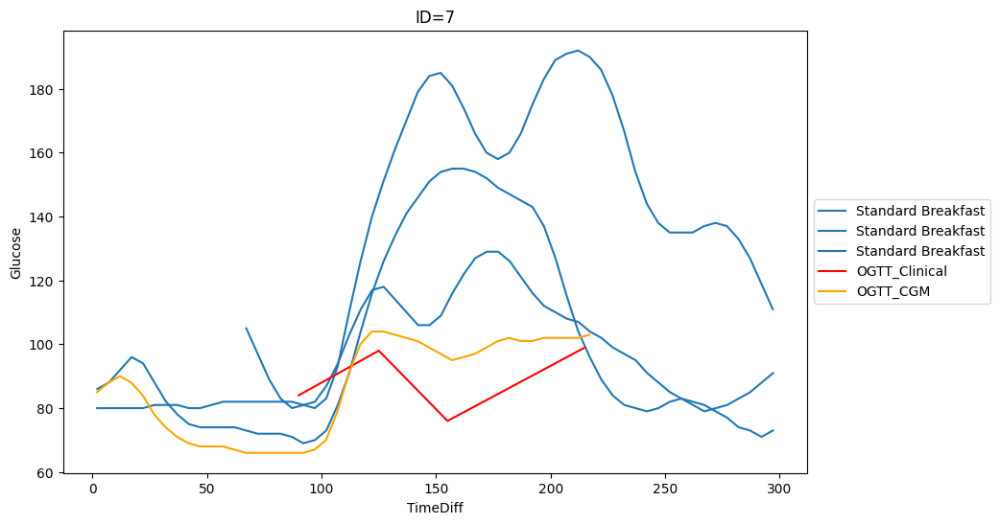

In [149]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=seven_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=7')
sns.lineplot(data=df_gtt_seven, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_seven, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

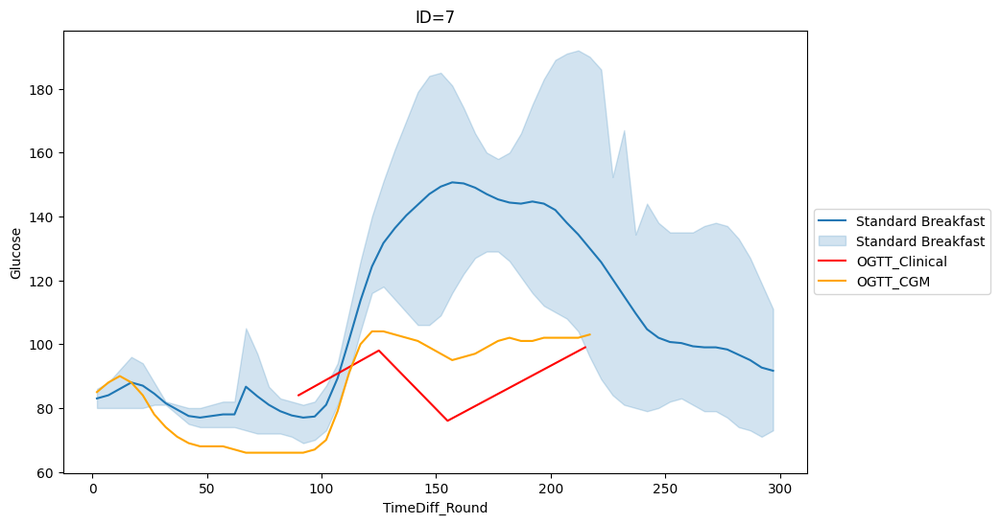

In [150]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=seven_ogtt, y="Glucose", x="TimeDiff_Round").set(title='ID=7')
sns.lineplot(data=df_gtt_seven, y="Glucose", x="TimeDiff_Round", color='red',estimator=None)
sns.lineplot(data=boost_cgm_seven, y="Glucose", x="TimeDiff_Round", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [151]:
boost_sub=boost_cgm_seven[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_seven[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
ogtt_sub=seven_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
boost_sub['id']=7
gtt_sub['id']=7
ogtt_sub['id']=7

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

food_responses=food_responses.append([ogtt_sub,gtt_sub,boost_sub])
food_responses


,TimeDiff,Glucose,Time,date,id,type
68,3.516667,88.0,2019-09-17 05:43:31,2019-09-17,1,standard_meal
69,8.533333,84.0,2019-09-17 05:48:32,2019-09-17,1,standard_meal
70,13.516667,81.0,2019-09-17 05:53:31,2019-09-17,1,standard_meal
71,18.516667,81.0,2019-09-17 05:58:31,2019-09-17,1,standard_meal
72,23.533333,83.0,2019-09-17 06:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2213,196.966667,102.0,2020-03-22 10:46:58,2020-03-22,7,boost_cgm
2214,201.950000,102.0,2020-03-22 10:51:57,2020-03-22,7,boost_cgm
2215,206.950000,102.0,2020-03-22 10:56:57,2020-03-22,7,boost_cgm
2216,211.950000,102.0,2020-03-22 11:01:57,2020-03-22,7,boost_cgm


[Text(0.5, 1.0, 'ID=7')]

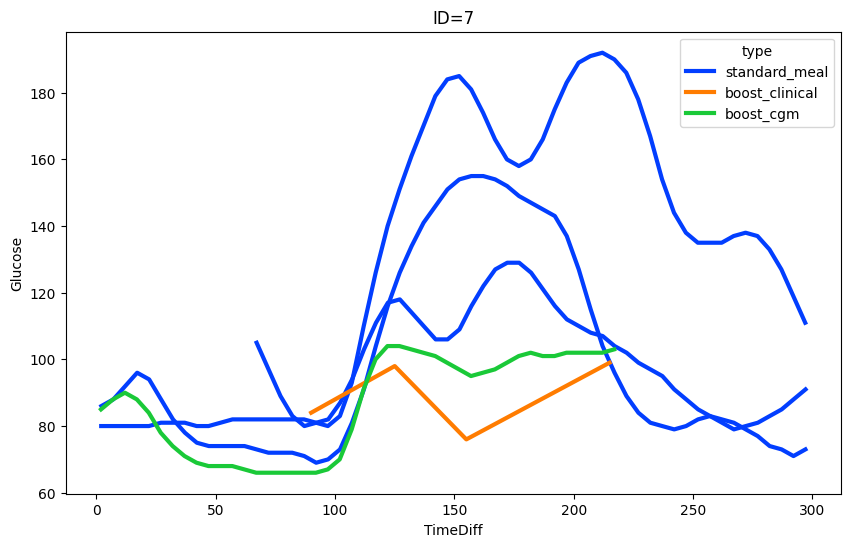

In [152]:
frng_7=food_responses[food_responses['id']==7]
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frng_7, y="Glucose", x="TimeDiff", palette='bright',hue='type',linewidth=3,units='date',estimator=None).set(title='ID=7')

Text(0.5, 1.0, 'ID=7')

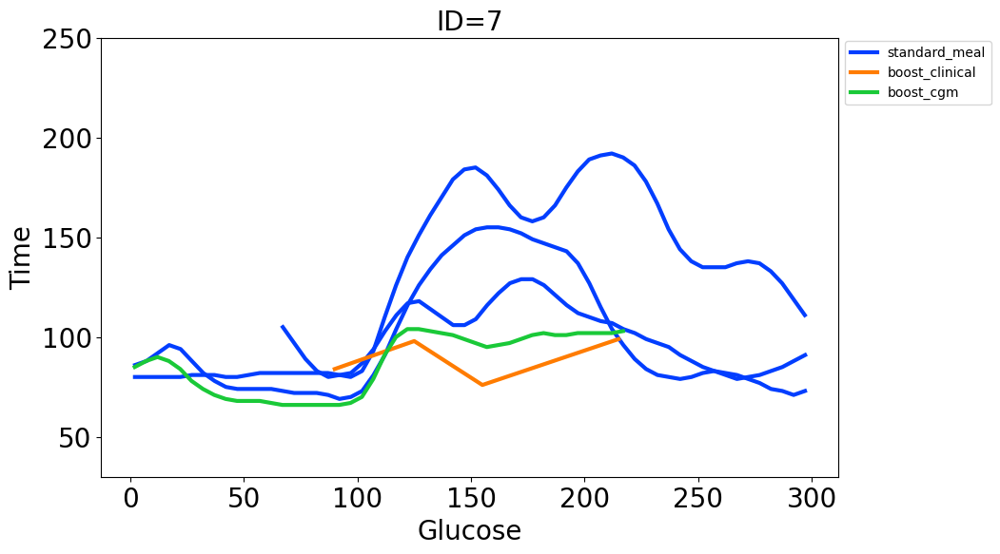

In [153]:
frng_7=food_responses[food_responses['id']==7]
plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frng_7, y="Glucose", x="TimeDiff", palette='bright',hue='type',linewidth=3,units='date',estimator=None).set(title='ID=7')
plt.ylim(30,250)
plt.legend(loc='center left', bbox_to_anchor=(1, .92), ncol=1)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel('Glucose', fontsize=20);
plt.ylabel('Time', fontsize=20);
plt.title('ID=7', fontsize=20)

In [154]:
max_times=seven_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
seven_ogtt.groupby('date')['TimeDiff_Round'].nunique()

date
2020-03-18    47
2020-03-19    60
2020-03-21    60
Name: TimeDiff_Round, dtype: int64

In [155]:
max_times=seven_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
seven_ogtt.groupby('date')['TimeDiff_Round'].nunique()

dates=seven_ogtt['date'].unique()
df_first_date=seven_ogtt[seven_ogtt['date']==dates[1]]

# seven_ogtt_test=seven_ogtt

column_names = seven_ogtt.columns.tolist()

# Create an empty DataFrame with the same columns
df_ppgr_grouped_seven = pd.DataFrame(columns=column_names)

for i in dates:
  df_date=seven_ogtt[seven_ogtt['date']==i]
  print(i)
  # df_date['nearest_time'] = df_first_date['TimeDiff'].apply(find_nearest_value)
  result_df = find_nearest_value(df_date, df_first_date, 'TimeDiff_Round', 'TimeDiff_Round')
  df_ppgr_grouped_seven=df_ppgr_grouped_seven.append(result_df)


# For grouped
boost_sub=boost_cgm_seven[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_seven[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
# ogtt_sub=seven_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
ogtt_sub=df_ppgr_grouped_seven[['nearest_TimeDiff_Round','Glucose','timestamp_dt','date']]
boost_sub['id']=7
gtt_sub['id']=7
ogtt_sub['id']=7

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

ogtt_sub.rename(columns={"nearest_TimeDiff_Round": "nearest_time_diff"},inplace=True)
boost_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)
gtt_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)


food_responses_grouped=food_responses_grouped.append([ogtt_sub,gtt_sub,boost_sub])
food_responses_grouped


2020-03-18
2020-03-19
2020-03-21


,nearest_time_diff,Glucose,Time,date,id,type
68,4.000000,88.0,2019-09-17 05:43:31,2019-09-17,1,standard_meal
69,9.000000,84.0,2019-09-17 05:48:32,2019-09-17,1,standard_meal
70,14.000000,81.0,2019-09-17 05:53:31,2019-09-17,1,standard_meal
71,19.000000,81.0,2019-09-17 05:58:31,2019-09-17,1,standard_meal
72,24.000000,83.0,2019-09-17 06:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2213,196.966667,102.0,2020-03-22 10:46:58,2020-03-22,7,boost_cgm
2214,201.950000,102.0,2020-03-22 10:51:57,2020-03-22,7,boost_cgm
2215,206.950000,102.0,2020-03-22 10:56:57,2020-03-22,7,boost_cgm
2216,211.950000,102.0,2020-03-22 11:01:57,2020-03-22,7,boost_cgm


In [156]:
# food_eight[food_eight['logged_food']=='Frosted Flake']
# food_eight[food_eight['logged_food']=='Boost']

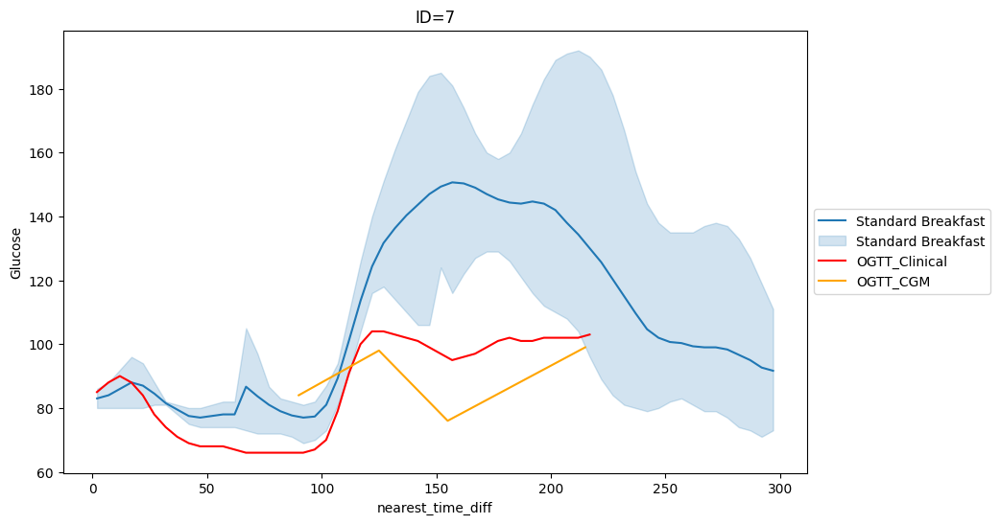

In [157]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ogtt_sub, y="Glucose", x="nearest_time_diff").set(title='ID=7')
sns.lineplot(data=boost_sub, y="Glucose", x="nearest_time_diff", color='red',estimator=None)
sns.lineplot(data=gtt_sub, y="Glucose", x="nearest_time_diff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

[Text(0.5, 1.0, 'ID=7')]

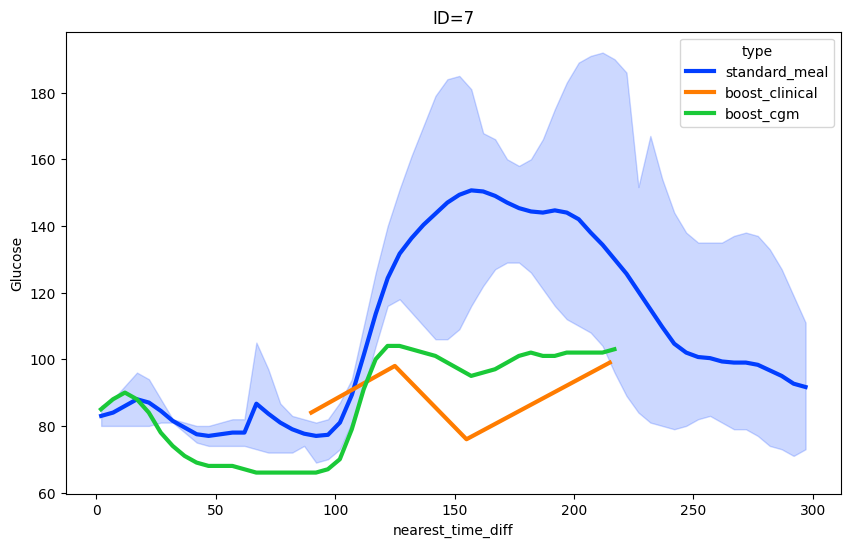

In [158]:
frg_7=food_responses_grouped[food_responses_grouped['id']==7]
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frg_7, y="Glucose", x="nearest_time_diff", palette='bright',hue='type',linewidth=3).set(title='ID=7')

Text(0.5, 1.0, 'ID=7')

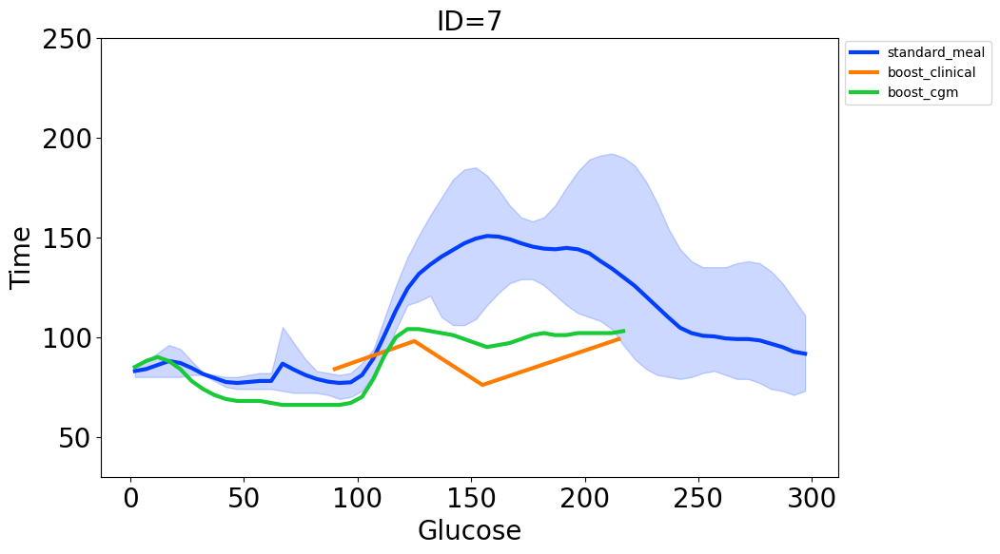

In [159]:
frg_7=food_responses_grouped[food_responses_grouped['id']==7]
plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frg_7, y="Glucose", x="nearest_time_diff", palette='bright',hue='type',linewidth=3).set(title='ID=7')
plt.ylim(30,250)
plt.legend(loc='center left', bbox_to_anchor=(1, .92), ncol=1)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel('Glucose', fontsize=20);
plt.ylabel('Time', fontsize=20);
plt.title('ID=7', fontsize=20)

In [160]:
s = '19-008'

GTT = [90,100,75,100]
GTT_times = ['2019-10-25 9:32:00', '2019-10-25 10:05:00', '2019-10-25 10:35:00', '2019-10-25 11:35:00']
GTT_times = pd.to_datetime(GTT_times, format='%Y-%m-%dT%H:%M:%S')

df_gtt_eight = pd.DataFrame({'Glucose': GTT, 'Time': GTT_times})
auc_ogtt_eight=calculate_area_under_curve(df_gtt_eight)
auc_ogtt_eight

11010

In [161]:
cgm_eight = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/008/Dexcom_008.csv')
cgm_eight['timestamp_dt'] = pd.to_datetime(cgm_eight['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_eight['Glucose'] = cgm_eight['Glucose Value (mg/dL)']
cgm_eight['Time'] = pd.to_datetime(cgm_eight['Timestamp (YYYY-MM-DDThh:mm:ss)'])

cgm_eight = cgm_eight.dropna(subset=['timestamp_dt'])
cgm_eight['date'] = cgm_eight['timestamp_dt'].dt.date
cgm_eight

food_eight = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/008/Food_Log_008.csv')

food_eight['date'] = pd.to_datetime(food_eight['date']).dt.date

food_eight['time_begin'] = pd.to_datetime(food_eight['time_begin'])
# window_dt = pd.Timedelta(minutes=120)
window_dt = pd.Timedelta(minutes=210)

food_eight["time_begin_win"] = food_eight["time_begin"] + window_dt

merge_food_cgm_eight = pd.merge(cgm_eight, food_eight, left_on=['date'], right_on=['date'])

cf_eight = food_eight[food_eight['logged_food']=='Frosted Flakes']

merge_food_cgm_eight = pd.merge(cgm_eight, cf_eight, left_on=['date'], right_on=['date'])
# window_dt_brkfst = pd.Timedelta(minutes=-30)
# change to -90
window_dt_brkfst = pd.Timedelta(minutes=-90)

food_cgm_eight_cf = merge_food_cgm_eight[(merge_food_cgm_eight['timestamp_dt'] <= merge_food_cgm_eight['time_begin_win']) & (merge_food_cgm_eight['timestamp_dt'] >= (merge_food_cgm_eight['time_begin']+window_dt_brkfst))]

food_cgm_eight_cf['pre_glu_time'] = food_cgm_eight_cf.groupby('date')['timestamp_dt'].transform('min')

column_names = food_cgm_eight_cf.columns.values
food_cgm_eight_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_eight_cf['date'].unique():
    date_sub = food_cgm_eight_cf[food_cgm_eight_cf['date'] == i]

    date_sub = date_sub.sort_values(by='timestamp_dt')
    min_glu = date_sub['Glucose Value (mg/dL)'].iloc[0]
    date_sub['min_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

    final_glu = date_sub['Glucose Value (mg/dL)'].iloc[-1]
    date_sub['final_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

    max_glu = date_sub['Glucose Value (mg/dL)'].max()
    date_sub['max_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

    date_sub['meal_auc'] = calculate_area_under_curve(date_sub)
    date_sub['auc_ogtt_eight'] = auc_ogtt_eight
    j = i - dt.timedelta(days=1)
    cgm_eight_ld = cgm_eight[cgm_eight['date'] == j]

    date_sub['mean_glu_ld'] = cgm_eight_ld.groupby('date')['Glucose'].transform('mean').iloc[0]
    date_sub['interdaycv'] = interdaycv(cgm_eight_ld)
    date_sub['interdaysd'] = interdaysd(cgm_eight_ld)
    date_sub['TIR'] = TIR(cgm_eight_ld, sd=1, sr=5)
    date_sub['TOR'] = TOR(cgm_eight_ld, sd=1, sr=5)
    date_sub['POR'] = POR(cgm_eight_ld, sd=1, sr=5)
    date_sub['PIR'] = PIR(cgm_eight_ld, sd=1, sr=5)
    date_sub['MGE'] = MGE(cgm_eight_ld, sd=1)
    date_sub['MGN'] = MGN(cgm_eight_ld, sd=1)
    # MAGE(cgm_eight, std=1)
    date_sub['J_index'] = J_index(cgm_eight_ld)
    date_sub['LBGI'] = LBGI(cgm_eight_ld)
    date_sub['HBGI'] = HBGI(cgm_eight_ld)
    # MODD(cgm_eight)
    # CONGA24(cgm_eight)
    date_sub['GMI'] = GMI(date_sub)

    food_cgm_eight_cf_all_dates = food_cgm_eight_cf_all_dates.append(date_sub)

eight_ogtt = food_cgm_eight_cf_all_dates

eight_ogtt_dup = eight_ogtt.drop_duplicates(subset=['date'], keep='first')
eight_ogtt_dup['id'] = 8
eight_ogtt_dup['a1c'] = "norm"



In [162]:
# merge_sub_eight.rename(columns={'auc_ogtt_eight': 'auc_ogtt'}, inplace=True)

In [163]:
window_dt = pd.Timedelta(minutes=120)
# boost_time=dt.datetime(2020,3,23,9,2,0)
# change to -90
boost_time=dt.datetime(2020,3,23,8,2,0)
#8:53:00
# 2019-10-25 9:32:00

# boost_cgm_eight=cgm_eight[(cgm_eight['timestamp_dt']>=boost_time)&(cgm_eight['timestamp_dt']<=boost_time + window_dt)]
boost_cgm_eight=cgm_eight[(cgm_eight['timestamp_dt']>=boost_time)]

#food_thirteen["time_begin_win"] = food_thirteen["time_begin"] + window_dt

#cgm_thirteen[cgm_thirteen['timestamp_dt']>=dt.datetime(2020,6,4,9,30,0)]

In [164]:
eight_ogtt['TimeDiff'] = (eight_ogtt['timestamp_dt'] - (eight_ogtt['time_begin']+window_dt_brkfst)).dt.total_seconds()/ 60

# Group by and use cumcount
eight_ogtt['SequentialTimeValues'] = eight_ogtt.groupby('date').cumcount() + 1

df_gtt_eight['Time']=pd.to_datetime(df_gtt_eight['Time'])

# df_gtt_eight['TimeDiff'] = (df_gtt_eight['Time'] - df_gtt_eight['Time'].min()).dt.total_seconds()/ 60
df_gtt_eight['TimeDiff'] = (df_gtt_eight['Time'] - (df_gtt_eight['Time'].min()+window_dt_brkfst)).dt.total_seconds()/ 60


boost_cgm_eight['TimeDiff'] = (boost_cgm_eight['timestamp_dt'] - boost_time).dt.total_seconds()/ 60



In [165]:
eight_ogtt['TimeDiff_Round']=eight_ogtt['TimeDiff'].round()
df_gtt_eight['TimeDiff_Round']=df_gtt_eight['TimeDiff'].round()
boost_cgm_eight['TimeDiff_Round']=boost_cgm_eight['TimeDiff'].round()

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

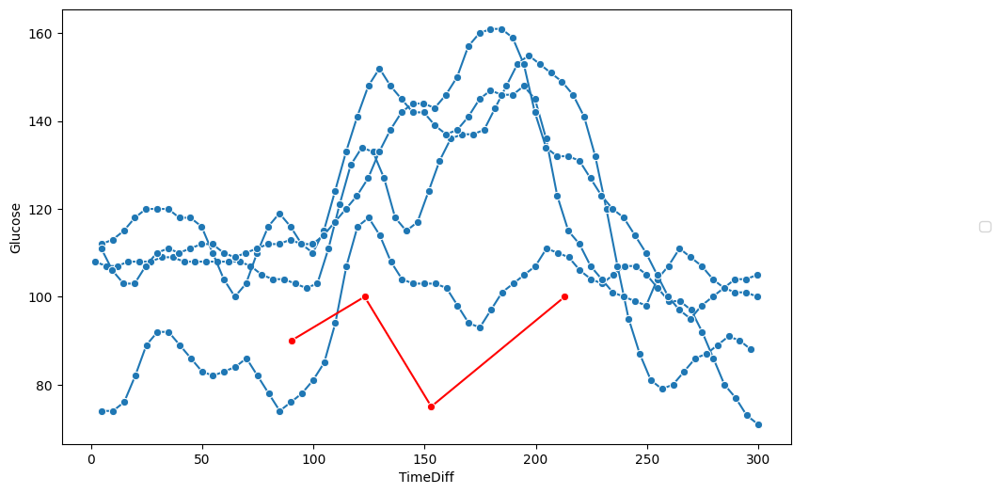

In [166]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=eight_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_eight, y="Glucose", x="TimeDiff", marker='o',color='red')

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

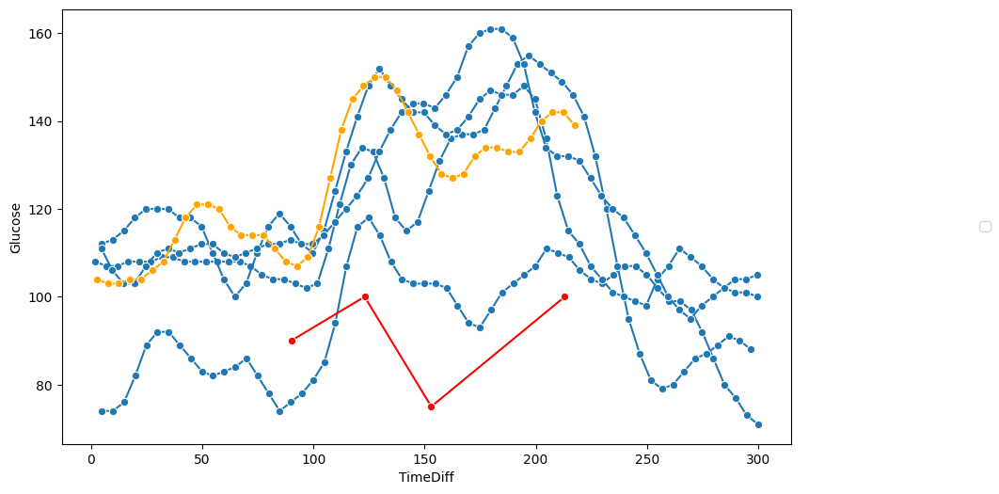

In [167]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=eight_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_eight, y="Glucose", x="TimeDiff", marker='o',color='red')
sns.lineplot(data=boost_cgm_eight, y="Glucose", x="TimeDiff", marker='o',color='orange')

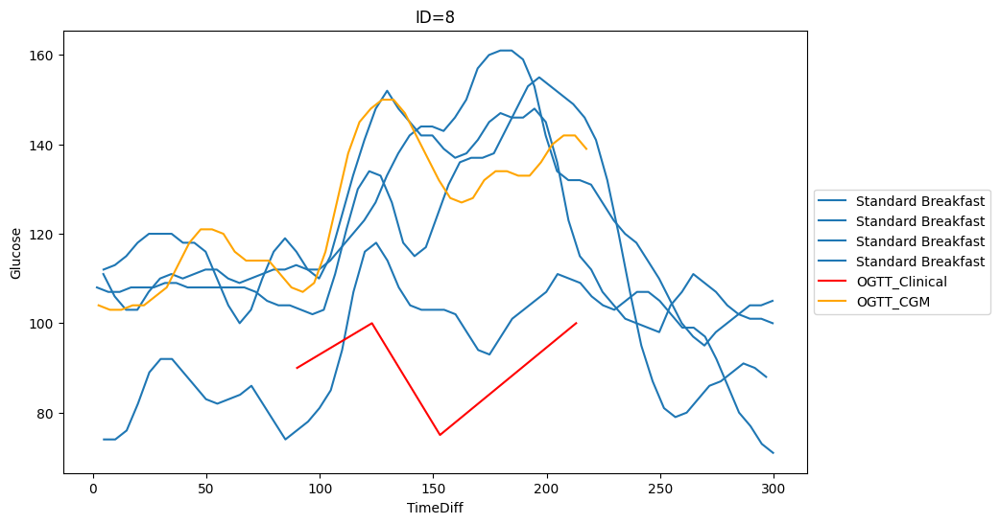

In [168]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=eight_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=8')
sns.lineplot(data=df_gtt_eight, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_eight, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

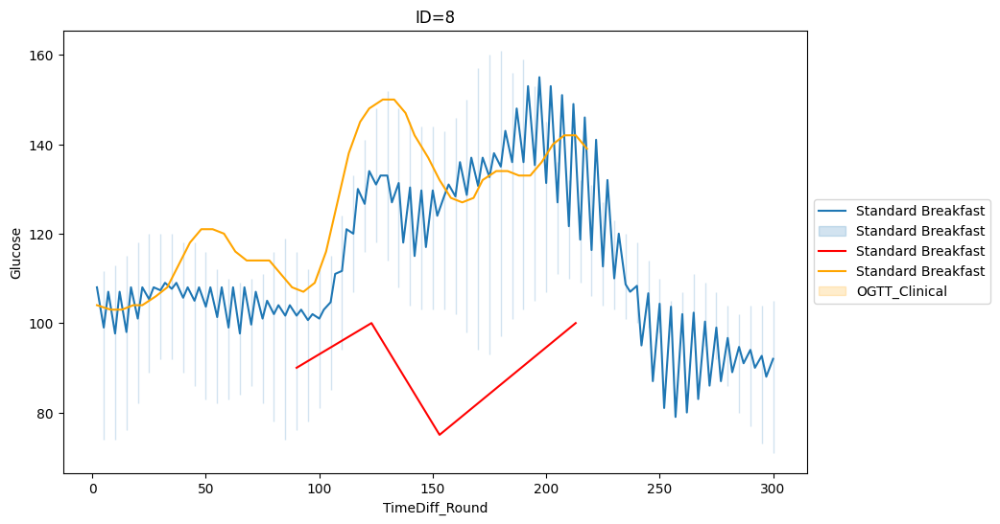

In [169]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=eight_ogtt, y="Glucose", x="TimeDiff_Round", palette='bright').set(title='ID=8')
sns.lineplot(data=df_gtt_eight, y="Glucose", x="TimeDiff_Round", color='red',estimator=None)
sns.lineplot(data=boost_cgm_eight, y="Glucose", x="TimeDiff_Round", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [170]:
boost_sub=boost_cgm_eight[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_eight[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
ogtt_sub=eight_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
boost_sub['id']=8
gtt_sub['id']=8
ogtt_sub['id']=8

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

food_responses=food_responses.append([ogtt_sub,gtt_sub,boost_sub])
food_responses


,TimeDiff,Glucose,Time,date,id,type
68,3.516667,88.0,2019-09-17 05:43:31,2019-09-17,1,standard_meal
69,8.533333,84.0,2019-09-17 05:48:32,2019-09-17,1,standard_meal
70,13.516667,81.0,2019-09-17 05:53:31,2019-09-17,1,standard_meal
71,18.516667,81.0,2019-09-17 05:58:31,2019-09-17,1,standard_meal
72,23.533333,83.0,2019-09-17 06:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2511,197.516667,136.0,2020-03-23 11:19:31,2020-03-23,8,boost_cgm
2512,202.516667,140.0,2020-03-23 11:24:31,2020-03-23,8,boost_cgm
2513,207.516667,142.0,2020-03-23 11:29:31,2020-03-23,8,boost_cgm
2514,212.516667,142.0,2020-03-23 11:34:31,2020-03-23,8,boost_cgm


[Text(0.5, 1.0, 'ID=8')]

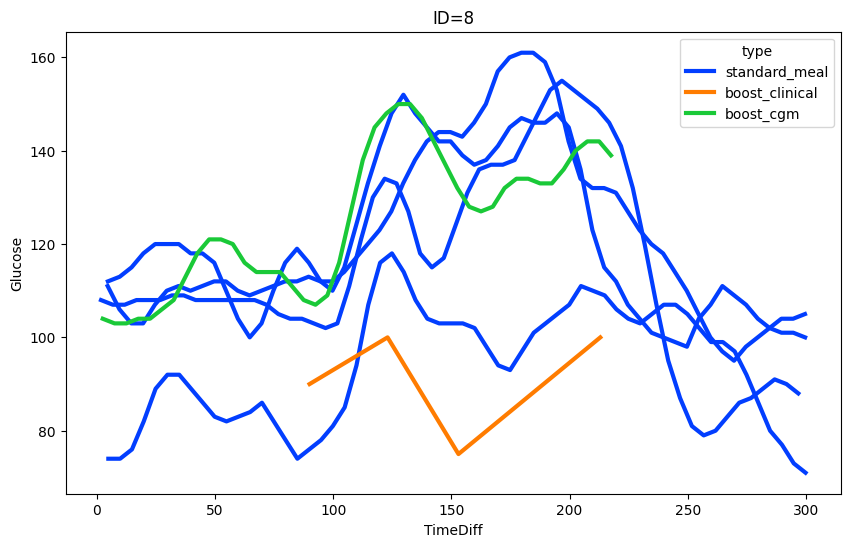

In [171]:
frng_8=food_responses[food_responses['id']==8]
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frng_8, y="Glucose", x="TimeDiff", palette='bright',hue='type',linewidth=3,units='date',estimator=None).set(title='ID=8')

Text(0.5, 1.0, 'ID=8')

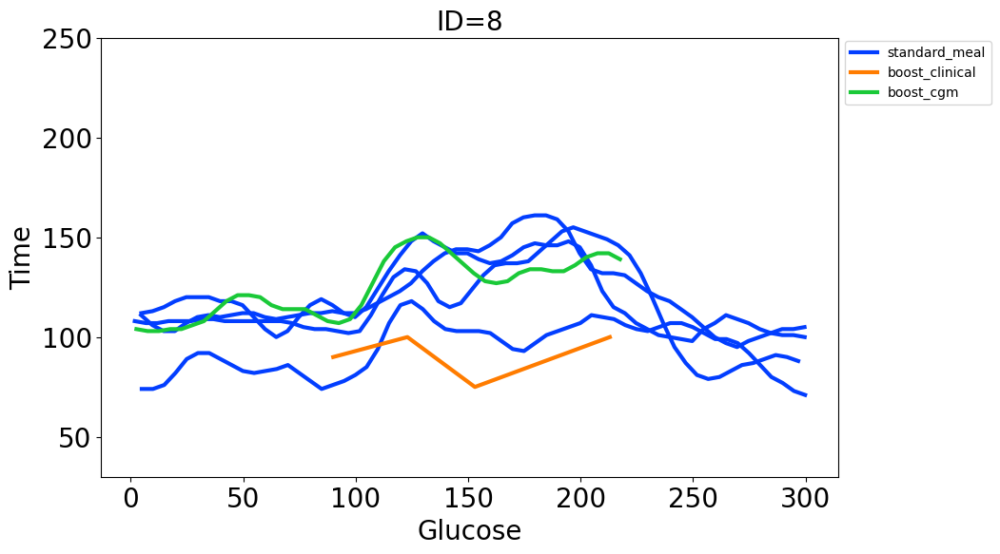

In [172]:
frng_8=food_responses[food_responses['id']==8]
plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frng_8, y="Glucose", x="TimeDiff", palette='bright',hue='type',linewidth=3,units='date',estimator=None).set(title='ID=8')
plt.ylim(30,250)
plt.legend(loc='center left', bbox_to_anchor=(1, .92), ncol=1)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel('Glucose', fontsize=20);
plt.ylabel('Time', fontsize=20);
plt.title('ID=8', fontsize=20)

In [173]:
max_times=eight_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
eight_ogtt.groupby('date')['TimeDiff_Round'].nunique()

date
2020-03-15    60
2020-03-17    60
2020-03-19    60
2020-03-21    60
Name: TimeDiff_Round, dtype: int64

In [174]:
max_times=eight_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
eight_ogtt.groupby('date')['TimeDiff_Round'].nunique()

dates=eight_ogtt['date'].unique()
df_first_date=eight_ogtt[eight_ogtt['date']==dates[0]]

# eight_ogtt_test=eight_ogtt

column_names = eight_ogtt.columns.tolist()

# Create an empty DataFrame with the same columns
df_ppgr_grouped_eight = pd.DataFrame(columns=column_names)

for i in dates:
  df_date=eight_ogtt[eight_ogtt['date']==i]
  print(i)
  # df_date['nearest_time'] = df_first_date['TimeDiff'].apply(find_nearest_value)
  result_df = find_nearest_value(df_date, df_first_date, 'TimeDiff_Round', 'TimeDiff_Round')
  df_ppgr_grouped_eight=df_ppgr_grouped_eight.append(result_df)


# For grouped
boost_sub=boost_cgm_eight[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_eight[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
# ogtt_sub=eight_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
ogtt_sub=df_ppgr_grouped_eight[['nearest_TimeDiff_Round','Glucose','timestamp_dt','date']]
boost_sub['id']=8
gtt_sub['id']=8
ogtt_sub['id']=8

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

ogtt_sub.rename(columns={"nearest_TimeDiff_Round": "nearest_time_diff"},inplace=True)
boost_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)
gtt_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)


food_responses_grouped=food_responses_grouped.append([ogtt_sub,gtt_sub,boost_sub])
food_responses_grouped


2020-03-15
2020-03-17
2020-03-19
2020-03-21


,nearest_time_diff,Glucose,Time,date,id,type
68,4.000000,88.0,2019-09-17 05:43:31,2019-09-17,1,standard_meal
69,9.000000,84.0,2019-09-17 05:48:32,2019-09-17,1,standard_meal
70,14.000000,81.0,2019-09-17 05:53:31,2019-09-17,1,standard_meal
71,19.000000,81.0,2019-09-17 05:58:31,2019-09-17,1,standard_meal
72,24.000000,83.0,2019-09-17 06:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2511,197.516667,136.0,2020-03-23 11:19:31,2020-03-23,8,boost_cgm
2512,202.516667,140.0,2020-03-23 11:24:31,2020-03-23,8,boost_cgm
2513,207.516667,142.0,2020-03-23 11:29:31,2020-03-23,8,boost_cgm
2514,212.516667,142.0,2020-03-23 11:34:31,2020-03-23,8,boost_cgm


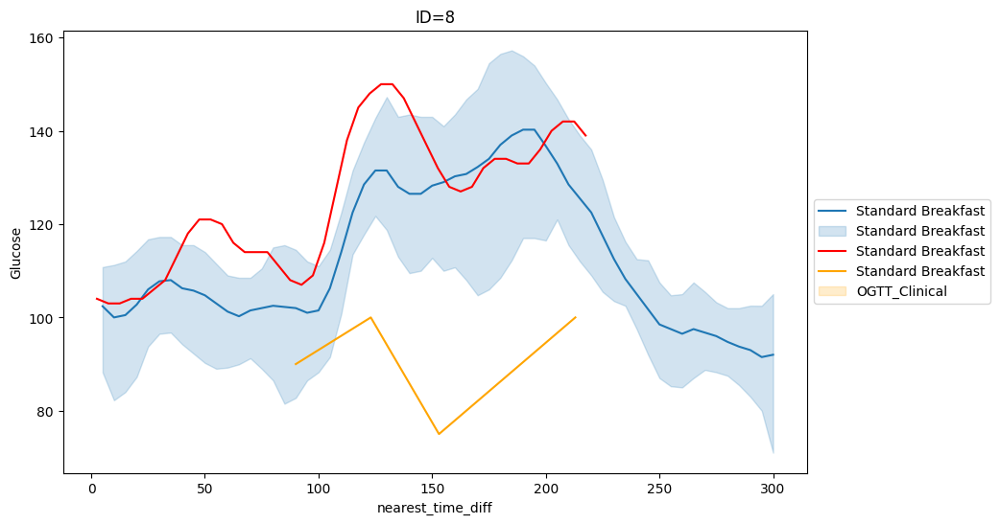

In [175]:
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ogtt_sub, y="Glucose", x="nearest_time_diff", palette='bright').set(title='ID=8')
sns.lineplot(data=boost_sub, y="Glucose", x="nearest_time_diff", color='red',estimator=None)
sns.lineplot(data=gtt_sub, y="Glucose", x="nearest_time_diff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

[Text(0.5, 1.0, 'ID=8')]

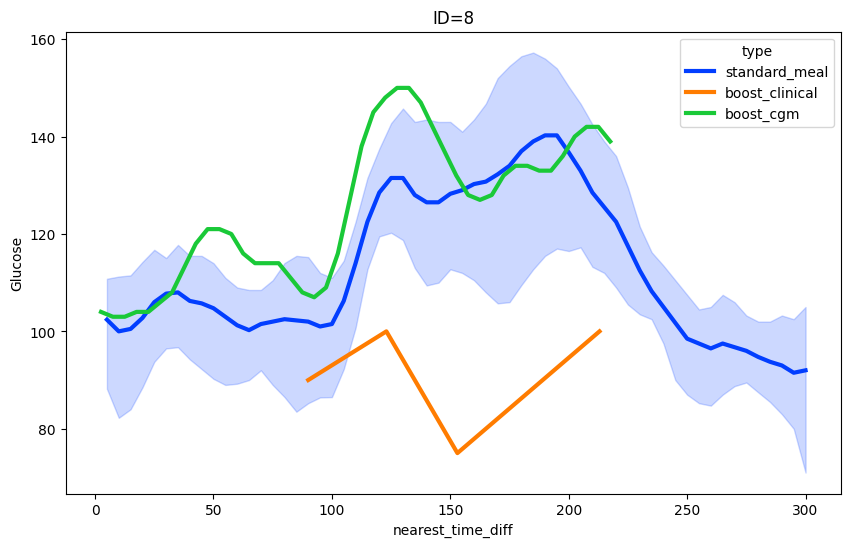

In [176]:
frg_8=food_responses_grouped[food_responses_grouped['id']==8]
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frg_8, y="Glucose", x="nearest_time_diff", palette='bright',hue='type',linewidth=3).set(title='ID=8')

Text(0.5, 1.0, 'ID=8')

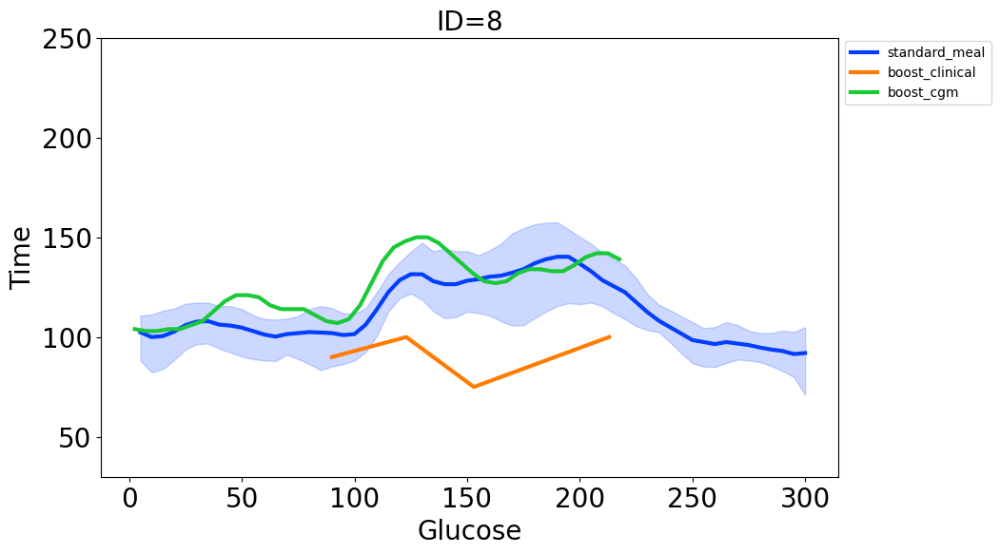

In [177]:
frg_8=food_responses_grouped[food_responses_grouped['id']==8]
plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frg_8, y="Glucose", x="nearest_time_diff", palette='bright',hue='type',linewidth=3).set(title='ID=8')
plt.ylim(30,250)
plt.legend(loc='center left', bbox_to_anchor=(1, .92), ncol=1)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel('Glucose', fontsize=20);
plt.ylabel('Time', fontsize=20);
plt.title('ID=8', fontsize=20)

In [178]:
s = '19-009'

GTT = [121,138,143,109]
GTT_times = ['2019-10-31 8:53:00', '2019-10-31 9:25:00', '2019-10-31 9:55:00', '2019-10-31 10:55:00']
GTT_times = pd.to_datetime(GTT_times, format='%Y-%m-%dT%H:%M:%S')

df_gtt_nine = pd.DataFrame({'Glucose': GTT, 'Time': GTT_times})
auc_ogtt_nine=calculate_area_under_curve(df_gtt_nine)
auc_ogtt_nine

15919

In [179]:
cgm_nine = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/009/Dexcom_009.csv')
cgm_nine['timestamp_dt'] = pd.to_datetime(cgm_nine['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_nine['Glucose'] = cgm_nine['Glucose Value (mg/dL)']
cgm_nine['Time'] = pd.to_datetime(cgm_nine['Timestamp (YYYY-MM-DDThh:mm:ss)'])

cgm_nine = cgm_nine.dropna(subset=['timestamp_dt'])
cgm_nine['date'] = cgm_nine['timestamp_dt'].dt.date
cgm_nine

food_nine = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/009/Food_Log_009.csv')

food_nine['date'] = pd.to_datetime(food_nine['date']).dt.date

food_nine['time_begin'] = pd.to_datetime(food_nine['time_begin'])
# window_dt = pd.Timedelta(minutes=120)
window_dt = pd.Timedelta(minutes=210)

food_nine["time_begin_win"] = food_nine["time_begin"] + window_dt

merge_food_cgm_nine = pd.merge(cgm_nine, food_nine, left_on=['date'], right_on=['date'])

cf_nine = food_nine[food_nine['logged_food']=='Frosted Flakes']

merge_food_cgm_nine = pd.merge(cgm_nine, cf_nine, left_on=['date'], right_on=['date'])
# window_dt_brkfst = pd.Timedelta(minutes=-30)
# change to -90 mins
window_dt_brkfst = pd.Timedelta(minutes=-90)

food_cgm_nine_cf = merge_food_cgm_nine[(merge_food_cgm_nine['timestamp_dt'] <= merge_food_cgm_nine['time_begin_win']) & (merge_food_cgm_nine['timestamp_dt'] >= (merge_food_cgm_nine['time_begin']+window_dt_brkfst))]

food_cgm_nine_cf['pre_glu_time'] = food_cgm_nine_cf.groupby('date')['timestamp_dt'].transform('min')

column_names = food_cgm_nine_cf.columns.values
food_cgm_nine_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_nine_cf['date'].unique():
    date_sub = food_cgm_nine_cf[food_cgm_nine_cf['date'] == i]

    date_sub = date_sub.sort_values(by='timestamp_dt')
    min_glu = date_sub['Glucose Value (mg/dL)'].iloc[0]
    date_sub['min_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

    final_glu = date_sub['Glucose Value (mg/dL)'].iloc[-1]
    date_sub['final_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

    max_glu = date_sub['Glucose Value (mg/dL)'].max()
    date_sub['max_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

    date_sub['meal_auc'] = calculate_area_under_curve(date_sub)
    date_sub['auc_ogtt_nine'] = auc_ogtt_nine
    j = i - dt.timedelta(days=1)
    cgm_nine_ld = cgm_nine[cgm_nine['date'] == j]

    date_sub['mean_glu_ld'] = cgm_nine_ld.groupby('date')['Glucose'].transform('mean').iloc[0]
    date_sub['interdaycv'] = interdaycv(cgm_nine_ld)
    date_sub['interdaysd'] = interdaysd(cgm_nine_ld)
    date_sub['TIR'] = TIR(cgm_nine_ld, sd=1, sr=5)
    date_sub['TOR'] = TOR(cgm_nine_ld, sd=1, sr=5)
    date_sub['POR'] = POR(cgm_nine_ld, sd=1, sr=5)
    date_sub['PIR'] = PIR(cgm_nine_ld, sd=1, sr=5)
    date_sub['MGE'] = MGE(cgm_nine_ld, sd=1)
    date_sub['MGN'] = MGN(cgm_nine_ld, sd=1)
    # MAGE(cgm_nine, std=1)
    date_sub['J_index'] = J_index(cgm_nine_ld)
    date_sub['LBGI'] = LBGI(cgm_nine_ld)
    date_sub['HBGI'] = HBGI(cgm_nine_ld)
    # MODD(cgm_nine)
    # CONGA24(cgm_nine)
    date_sub['GMI'] = GMI(date_sub)

    food_cgm_nine_cf_all_dates = food_cgm_nine_cf_all_dates.append(date_sub)

nine_ogtt = food_cgm_nine_cf_all_dates

nine_ogtt_dup = nine_ogtt.drop_duplicates(subset=['date'], keep='first')
nine_ogtt_dup['id'] = 9
nine_ogtt_dup['a1c'] = "PD"



In [180]:
# merge_sub_nine.rename(columns={'auc_ogtt_nine': 'auc_ogtt'}, inplace=True)

In [181]:
# food_nine[food_nine['logged_food']=='Frosted Flake']
# food_nine[food_nine['logged_food']=='Boost']

In [182]:
window_dt = pd.Timedelta(minutes=120)
# boost_time=dt.datetime(2020,3,29,8,23,0)
# change to -90 mins
boost_time=dt.datetime(2020,3,29,7,23,0)
#8:53:00
# 2019-10-31 8:53:00

# boost_cgm_nine=cgm_nine[(cgm_nine['timestamp_dt']>=boost_time)&(cgm_nine['timestamp_dt']<=boost_time + window_dt)]
boost_cgm_nine=cgm_nine[(cgm_nine['timestamp_dt']>=boost_time)]


#food_thirteen["time_begin_win"] = food_thirteen["time_begin"] + window_dt

#cgm_thirteen[cgm_thirteen['timestamp_dt']>=dt.datetime(2020,6,4,9,30,0)]

In [183]:
# nine_ogtt['TimeDiff'] = (nine_ogtt['timestamp_dt'] - nine_ogtt['time_begin']).dt.total_seconds()/ 60
nine_ogtt['TimeDiff'] = (nine_ogtt['timestamp_dt'] - (nine_ogtt['time_begin']+window_dt_brkfst)).dt.total_seconds()/ 60

# Group by and use cumcount
nine_ogtt['SequentialTimeValues'] = nine_ogtt.groupby('date').cumcount() + 1

df_gtt_nine['Time']=pd.to_datetime(df_gtt_nine['Time'])

# df_gtt_nine['TimeDiff'] = (df_gtt_nine['Time'] - df_gtt_nine['Time'].min()).dt.total_seconds()/ 60
df_gtt_nine['TimeDiff'] = (df_gtt_nine['Time'] - (df_gtt_nine['Time'].min()+window_dt_brkfst)).dt.total_seconds()/ 60


boost_cgm_nine['TimeDiff'] = (boost_cgm_nine['timestamp_dt'] - boost_time).dt.total_seconds()/ 60


In [184]:
nine_ogtt['TimeDiff_Round']=nine_ogtt['TimeDiff'].round()
df_gtt_nine['TimeDiff_Round']=df_gtt_nine['TimeDiff'].round()
boost_cgm_nine['TimeDiff_Round']=boost_cgm_nine['TimeDiff'].round()

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

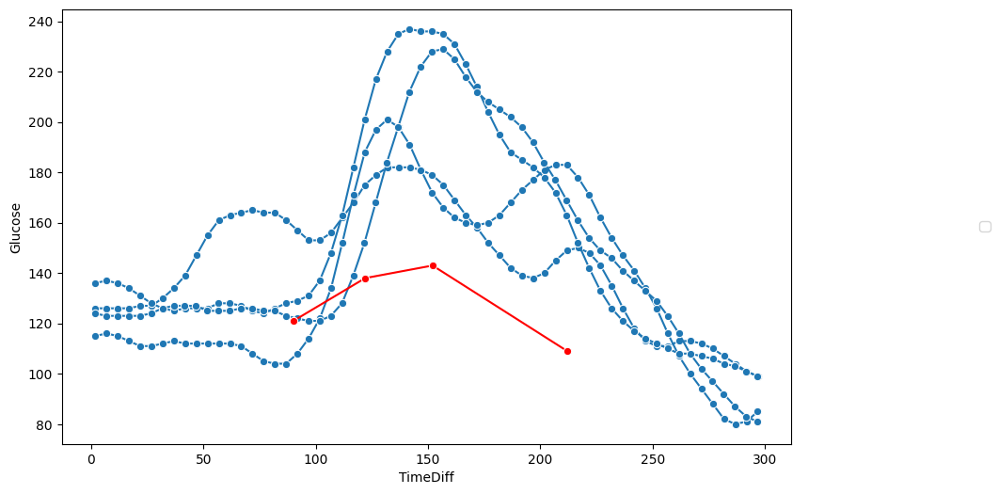

In [185]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=nine_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_nine, y="Glucose", x="TimeDiff", marker='o',color='red')

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

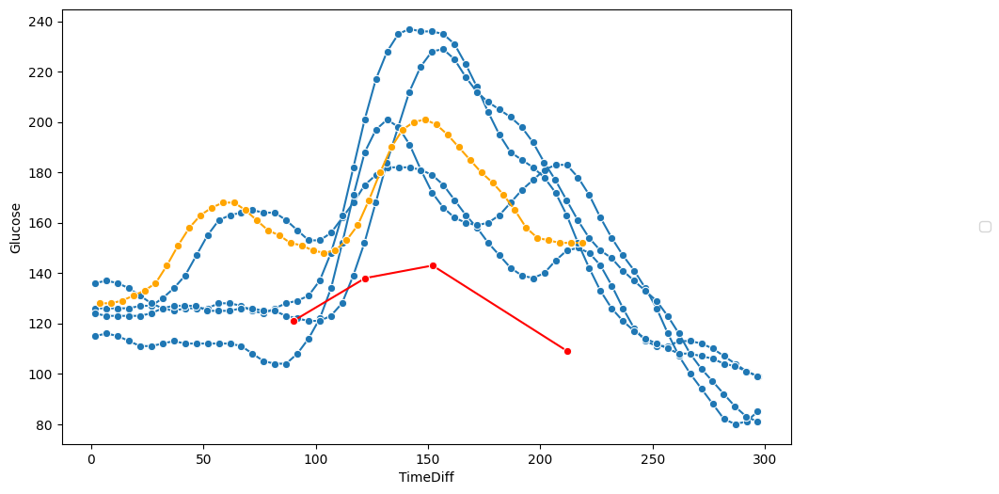

In [186]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=nine_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_nine, y="Glucose", x="TimeDiff", marker='o',color='red')
sns.lineplot(data=boost_cgm_nine, y="Glucose", x="TimeDiff", marker='o',color='orange')

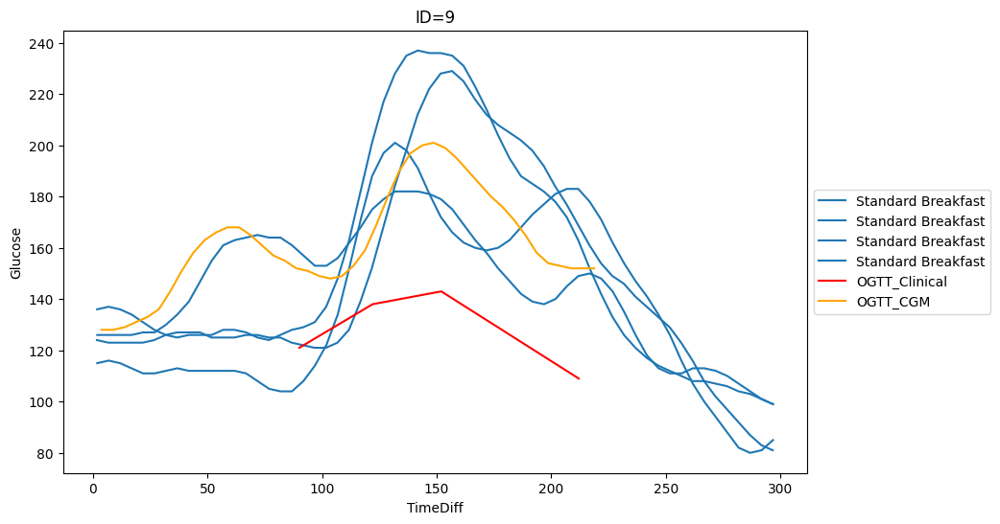

In [187]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=nine_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=9')
sns.lineplot(data=df_gtt_nine, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_nine, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

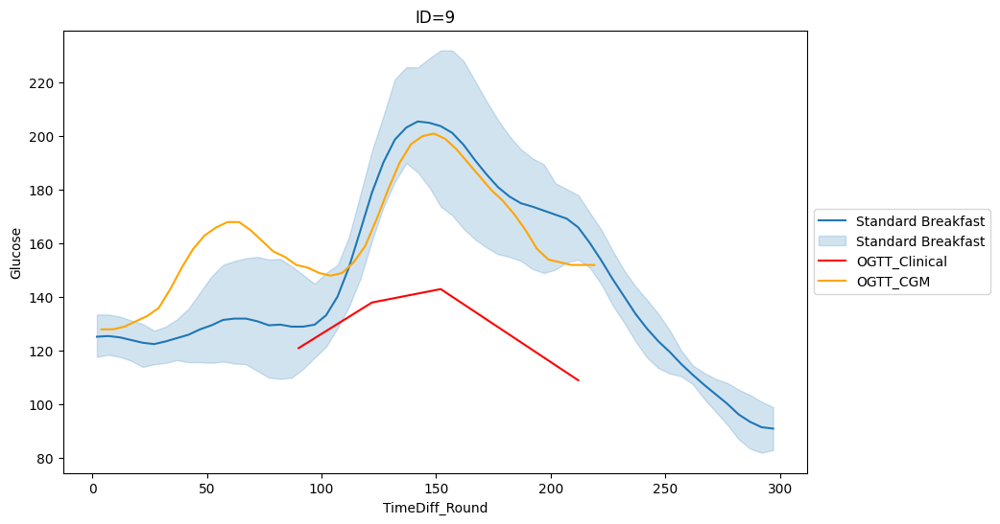

In [188]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=nine_ogtt, y="Glucose", x="TimeDiff_Round", palette='bright').set(title='ID=9')
sns.lineplot(data=df_gtt_nine, y="Glucose", x="TimeDiff_Round", color='red',estimator=None)
sns.lineplot(data=boost_cgm_nine, y="Glucose", x="TimeDiff_Round", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [189]:
boost_sub=boost_cgm_nine[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_nine[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
ogtt_sub=nine_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
boost_sub['id']=9
gtt_sub['id']=9
ogtt_sub['id']=9

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

food_responses=food_responses.append([ogtt_sub,gtt_sub,boost_sub])
food_responses


,TimeDiff,Glucose,Time,date,id,type
68,3.516667,88.0,2019-09-17 05:43:31,2019-09-17,1,standard_meal
69,8.533333,84.0,2019-09-17 05:48:32,2019-09-17,1,standard_meal
70,13.516667,81.0,2019-09-17 05:53:31,2019-09-17,1,standard_meal
71,18.516667,81.0,2019-09-17 05:58:31,2019-09-17,1,standard_meal
72,23.533333,83.0,2019-09-17 06:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2312,198.683333,154.0,2020-03-29 10:41:41,2020-03-29,9,boost_cgm
2313,203.683333,153.0,2020-03-29 10:46:41,2020-03-29,9,boost_cgm
2314,208.683333,152.0,2020-03-29 10:51:41,2020-03-29,9,boost_cgm
2315,213.683333,152.0,2020-03-29 10:56:41,2020-03-29,9,boost_cgm


[Text(0.5, 1.0, 'ID=9')]

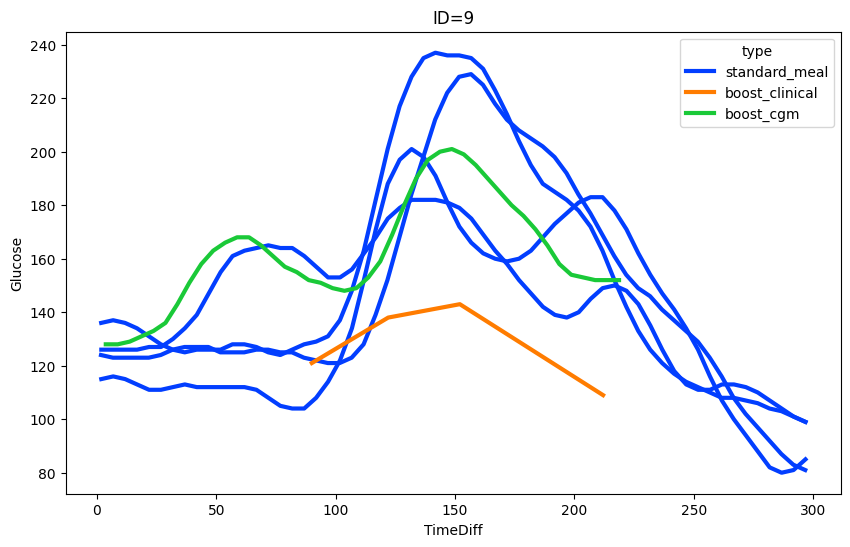

In [190]:
frng_9=food_responses[food_responses['id']==9]
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frng_9, y="Glucose", x="TimeDiff", palette='bright',hue='type',linewidth=3,units='date',estimator=None).set(title='ID=9')

Text(0.5, 1.0, 'ID=9')

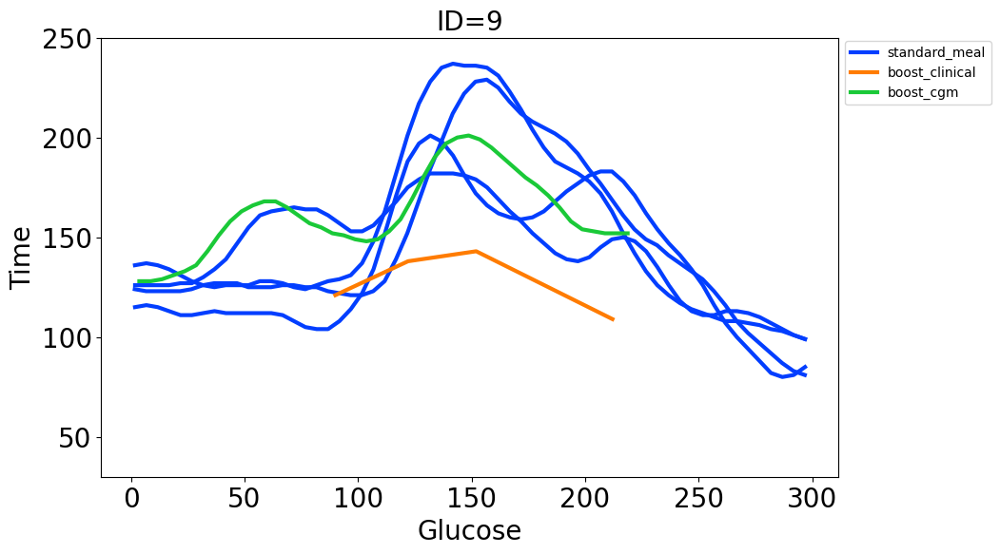

In [191]:
frng_9=food_responses[food_responses['id']==9]
plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frng_9, y="Glucose", x="TimeDiff", palette='bright',hue='type',linewidth=3,units='date',estimator=None).set(title='ID=9')
plt.ylim(30,250)
plt.legend(loc='center left', bbox_to_anchor=(1, .92), ncol=1)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel('Glucose', fontsize=20);
plt.ylabel('Time', fontsize=20);
plt.title('ID=9', fontsize=20)

In [192]:
max_times=nine_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
nine_ogtt.groupby('date')['TimeDiff_Round'].nunique()


date
2020-03-22    60
2020-03-24    60
2020-03-26    60
2020-03-28    60
Name: TimeDiff_Round, dtype: int64

In [193]:
# df_ppgr_grouped_nine

In [194]:
max_times=nine_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
nine_ogtt.groupby('date')['TimeDiff_Round'].nunique()

dates=nine_ogtt['date'].unique()
df_first_date=nine_ogtt[nine_ogtt['date']==dates[0]]

# nine_ogtt_test=nine_ogtt

column_names = nine_ogtt.columns.tolist()

# Create an empty DataFrame with the same columns
df_ppgr_grouped_nine = pd.DataFrame(columns=column_names)

for i in dates:
  df_date=nine_ogtt[nine_ogtt['date']==i]
  print(i)
  # df_date['nearest_time'] = df_first_date['TimeDiff'].apply(find_nearest_value)
  result_df = find_nearest_value(df_date, df_first_date, 'TimeDiff_Round', 'TimeDiff_Round')
  df_ppgr_grouped_nine=df_ppgr_grouped_nine.append(result_df)


# For grouped
boost_sub=boost_cgm_nine[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_nine[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
# ogtt_sub=nine_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
ogtt_sub=df_ppgr_grouped_nine[['nearest_TimeDiff_Round','Glucose','timestamp_dt','date']]
boost_sub['id']=9
gtt_sub['id']=9
ogtt_sub['id']=9

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

ogtt_sub.rename(columns={"nearest_TimeDiff_Round": "nearest_time_diff"},inplace=True)
boost_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)
gtt_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)


food_responses_grouped=food_responses_grouped.append([ogtt_sub,gtt_sub,boost_sub])
food_responses_grouped


2020-03-22
2020-03-24
2020-03-26
2020-03-28


,nearest_time_diff,Glucose,Time,date,id,type
68,4.000000,88.0,2019-09-17 05:43:31,2019-09-17,1,standard_meal
69,9.000000,84.0,2019-09-17 05:48:32,2019-09-17,1,standard_meal
70,14.000000,81.0,2019-09-17 05:53:31,2019-09-17,1,standard_meal
71,19.000000,81.0,2019-09-17 05:58:31,2019-09-17,1,standard_meal
72,24.000000,83.0,2019-09-17 06:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2312,198.683333,154.0,2020-03-29 10:41:41,2020-03-29,9,boost_cgm
2313,203.683333,153.0,2020-03-29 10:46:41,2020-03-29,9,boost_cgm
2314,208.683333,152.0,2020-03-29 10:51:41,2020-03-29,9,boost_cgm
2315,213.683333,152.0,2020-03-29 10:56:41,2020-03-29,9,boost_cgm


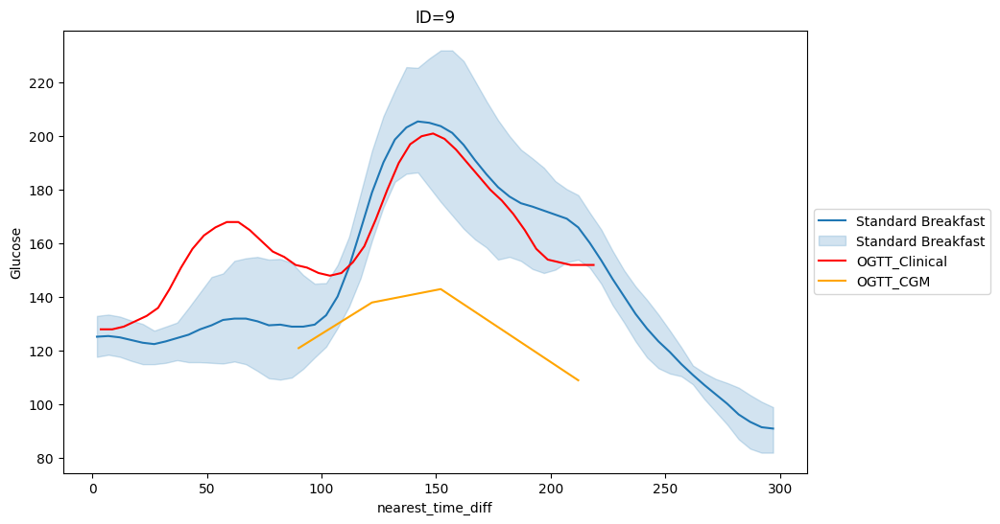

In [195]:
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ogtt_sub, y="Glucose", x="nearest_time_diff", palette='bright').set(title='ID=9')
sns.lineplot(data=boost_sub, y="Glucose", x="nearest_time_diff", color='red',estimator=None)
sns.lineplot(data=gtt_sub, y="Glucose", x="nearest_time_diff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

[Text(0.5, 1.0, 'ID=9')]

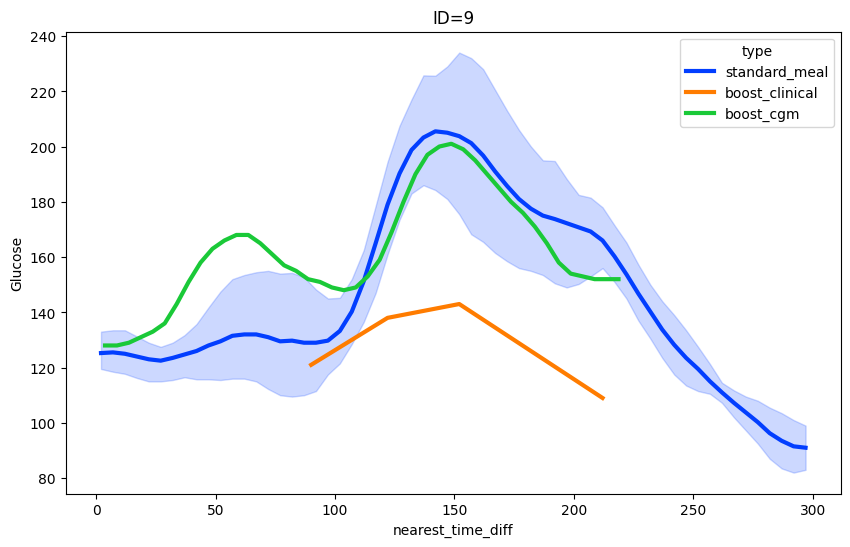

In [196]:
frg_9=food_responses_grouped[food_responses_grouped['id']==9]
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frg_9, y="Glucose", x="nearest_time_diff", palette='bright',hue='type',linewidth=3).set(title='ID=9')

Text(0.5, 1.0, 'ID=9')

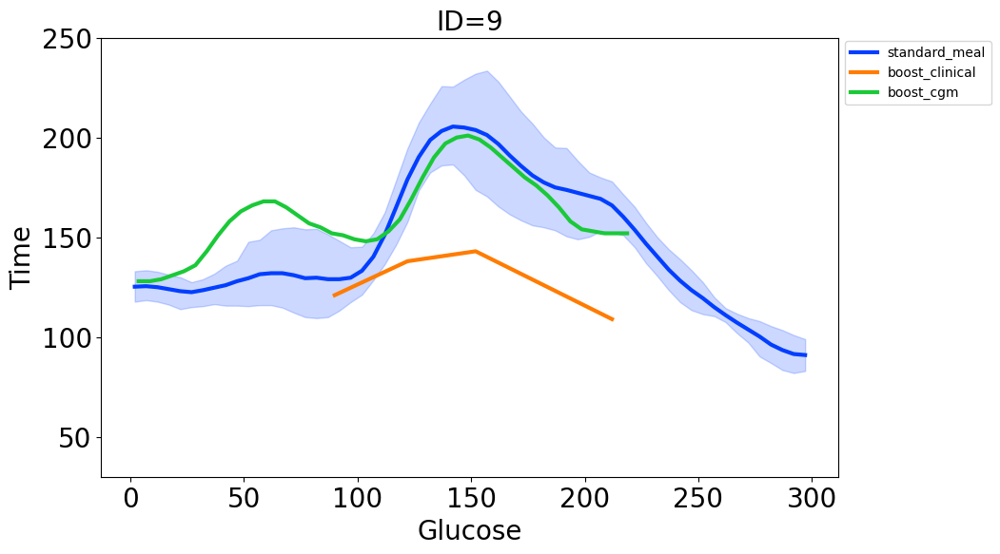

In [197]:
frg_9=food_responses_grouped[food_responses_grouped['id']==9]
plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frg_9, y="Glucose", x="nearest_time_diff", palette='bright',hue='type',linewidth=3).set(title='ID=9')
plt.ylim(30,250)
plt.legend(loc='center left', bbox_to_anchor=(1, .92), ncol=1)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel('Glucose', fontsize=20);
plt.ylabel('Time', fontsize=20);
plt.title('ID=9', fontsize=20)

In [198]:
s = '19-010'
Starttime = pd.to_datetime('2019-11-01 7:00:00', format='%Y-%m-%dT%H:%M:%S')
Endtime = pd.to_datetime('2019-11-01 10:00:00', format='%Y-%m-%dT%H:%M:%S')

GTT = [82,111,98,70]
GTT_times = ['2019-11-01 7:09:00', '2019-11-01 7:40:00', '2019-11-01 8:10:00', '2019-11-01 9:10:00']
GTT_times = pd.to_datetime(GTT_times, format='%Y-%m-%dT%H:%M:%S')

df_gtt_ten = pd.DataFrame({'Glucose': GTT, 'Time': GTT_times})
auc_ogtt_ten=calculate_area_under_curve(df_gtt_ten)
auc_ogtt_ten

11166

In [199]:
cgm_ten = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/010/Dexcom_010.csv')
cgm_ten['timestamp_dt'] = pd.to_datetime(cgm_ten['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_ten['Glucose'] = cgm_ten['Glucose Value (mg/dL)']
cgm_ten['Time'] = pd.to_datetime(cgm_ten['Timestamp (YYYY-MM-DDThh:mm:ss)'])

cgm_ten = cgm_ten.dropna(subset=['timestamp_dt'])
cgm_ten['date'] = cgm_ten['timestamp_dt'].dt.date
cgm_ten

food_ten = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/010/Food_Log_010.csv')

food_ten['date'] = pd.to_datetime(food_ten['date']).dt.date

food_ten['time_begin'] = pd.to_datetime(food_ten['time_begin'])
# window_dt = pd.Timedelta(minutes=120)
window_dt = pd.Timedelta(minutes=210)

food_ten["time_begin_win"] = food_ten["time_begin"] + window_dt

merge_food_cgm_ten = pd.merge(cgm_ten, food_ten, left_on=['date'], right_on=['date'])

cf_ten = food_ten[food_ten['logged_food']=='Frosted Flakes']

merge_food_cgm_ten = pd.merge(cgm_ten, cf_ten, left_on=['date'], right_on=['date'])
# window_dt_brkfst = pd.Timedelta(minutes=-30)
# chnage to 90 mins before
window_dt_brkfst = pd.Timedelta(minutes=-90)

food_cgm_ten_cf = merge_food_cgm_ten[(merge_food_cgm_ten['timestamp_dt'] <= merge_food_cgm_ten['time_begin_win']) & (merge_food_cgm_ten['timestamp_dt'] >= (merge_food_cgm_ten['time_begin']+window_dt_brkfst))]

food_cgm_ten_cf['pre_glu_time'] = food_cgm_ten_cf.groupby('date')['timestamp_dt'].transform('min')

column_names = food_cgm_ten_cf.columns.values
food_cgm_ten_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_ten_cf['date'].unique():
    date_sub = food_cgm_ten_cf[food_cgm_ten_cf['date'] == i]

    date_sub = date_sub.sort_values(by='timestamp_dt')
    min_glu = date_sub['Glucose Value (mg/dL)'].iloc[0]
    date_sub['min_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

    final_glu = date_sub['Glucose Value (mg/dL)'].iloc[-1]
    date_sub['final_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

    max_glu = date_sub['Glucose Value (mg/dL)'].max()
    date_sub['max_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

    date_sub['meal_auc'] = calculate_area_under_curve(date_sub)
    date_sub['auc_ogtt_ten'] = auc_ogtt_ten
    j = i - dt.timedelta(days=1)
    cgm_ten_ld = cgm_ten[cgm_ten['date'] == j]

    date_sub['mean_glu_ld'] = cgm_ten_ld.groupby('date')['Glucose'].transform('mean').iloc[0]
    date_sub['interdaycv'] = interdaycv(cgm_ten_ld)
    date_sub['interdaysd'] = interdaysd(cgm_ten_ld)
    date_sub['TIR'] = TIR(cgm_ten_ld, sd=1, sr=5)
    date_sub['TOR'] = TOR(cgm_ten_ld, sd=1, sr=5)
    date_sub['POR'] = POR(cgm_ten_ld, sd=1, sr=5)
    date_sub['PIR'] = PIR(cgm_ten_ld, sd=1, sr=5)
    date_sub['MGE'] = MGE(cgm_ten_ld, sd=1)
    date_sub['MGN'] = MGN(cgm_ten_ld, sd=1)
    # MAGE(cgm_ten, std=1)
    date_sub['J_index'] = J_index(cgm_ten_ld)
    date_sub['LBGI'] = LBGI(cgm_ten_ld)
    date_sub['HBGI'] = HBGI(cgm_ten_ld)
    # MODD(cgm_ten)
    # CONGA24(cgm_ten)
    date_sub['GMI'] = GMI(date_sub)

    food_cgm_ten_cf_all_dates = food_cgm_ten_cf_all_dates.append(date_sub)

ten_ogtt = food_cgm_ten_cf_all_dates

ten_ogtt_dup = ten_ogtt.drop_duplicates(subset=['date'], keep='first')
ten_ogtt_dup['id'] = 10
ten_ogtt_dup['a1c'] = "PD"


In [200]:
# ten_ogtt.head()

In [201]:
# food_ten[food_ten['logged_food']=='Frosted Flakes']

In [202]:
# food_ten[food_ten['logged_food']=='Boost']

In [203]:
window_dt = pd.Timedelta(minutes=120)
# boost_time=dt.datetime(2020,3,30,6,39,0)
# change to 90 mins before
boost_time=dt.datetime(2020,3,30,5,39,0)
#8:53:00
# 2019-10-31 8:53:00
# 2019-11-01 7:09:00
# boost_cgm_ten=cgm_ten[(cgm_ten['timestamp_dt']>=boost_time)&(cgm_ten['timestamp_dt']<=boost_time + window_dt)]
boost_cgm_ten=cgm_ten[(cgm_ten['timestamp_dt']>=boost_time)]


In [204]:

# ten_ogtt['TimeDiff'] = (ten_ogtt['timestamp_dt'] - ten_ogtt['time_begin']).dt.total_seconds()/ 60
ten_ogtt['TimeDiff'] = (ten_ogtt['timestamp_dt'] - (ten_ogtt['time_begin']+window_dt_brkfst)).dt.total_seconds()/ 60

# Group by and use cumcount
ten_ogtt['SequentialTimeValues'] = ten_ogtt.groupby('date').cumcount() + 1

df_gtt_ten['Time']=pd.to_datetime(df_gtt_ten['Time'])

# df_gtt_ten['TimeDiff'] = (df_gtt_ten['Time'] - df_gtt_ten['Time'].min()).dt.total_seconds()/ 60
df_gtt_ten['TimeDiff'] = (df_gtt_ten['Time'] - (df_gtt_ten['Time'].min()+window_dt_brkfst)).dt.total_seconds()/ 60


boost_cgm_ten['TimeDiff'] = (boost_cgm_ten['timestamp_dt'] - boost_time).dt.total_seconds()/ 60


In [205]:
ten_ogtt['TimeDiff_Round']=ten_ogtt['TimeDiff'].round()
df_gtt_ten['TimeDiff_Round']=df_gtt_ten['TimeDiff'].round()
boost_cgm_ten['TimeDiff_Round']=boost_cgm_ten['TimeDiff'].round()

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

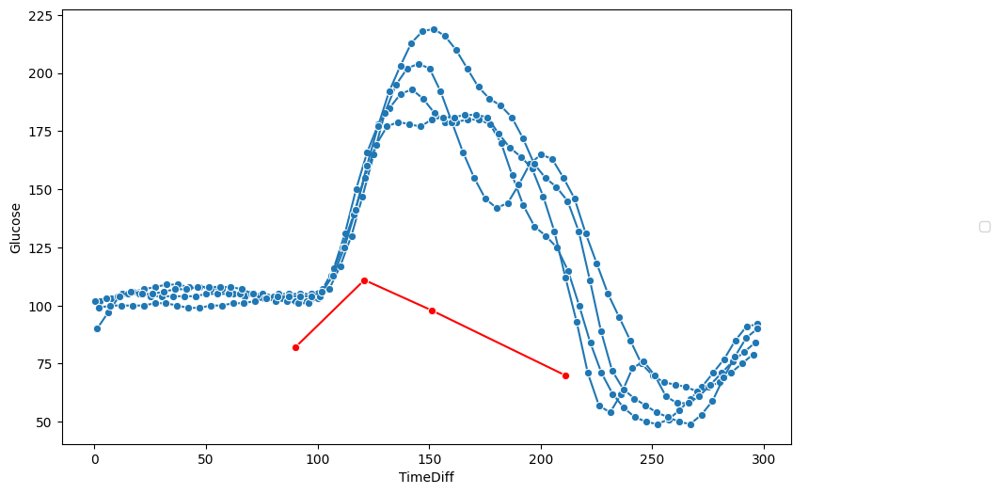

In [206]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ten_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_ten, y="Glucose", x="TimeDiff", marker='o',color='red')

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

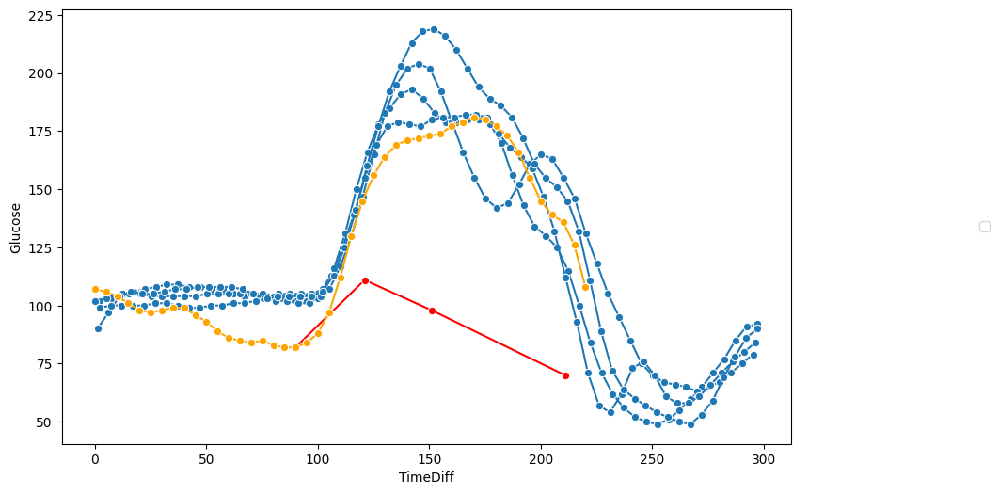

In [207]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ten_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_ten, y="Glucose", x="TimeDiff", marker='o',color='red')
sns.lineplot(data=boost_cgm_ten, y="Glucose", x="TimeDiff", marker='o',color='orange')

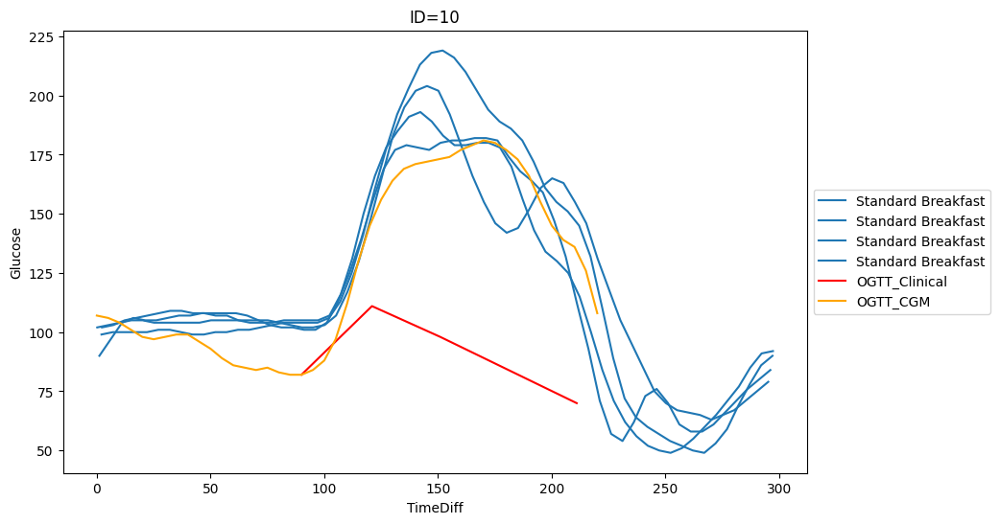

In [208]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ten_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=10')
sns.lineplot(data=df_gtt_ten, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_ten, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


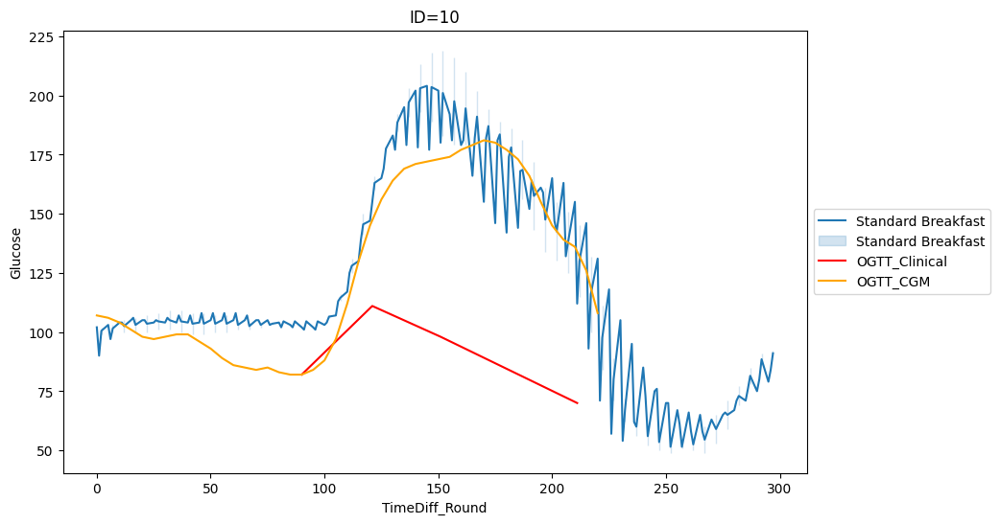

In [209]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ten_ogtt, y="Glucose", x="TimeDiff_Round", palette='bright').set(title='ID=10')
sns.lineplot(data=df_gtt_ten, y="Glucose", x="TimeDiff_Round", color='red',estimator=None)
sns.lineplot(data=boost_cgm_ten, y="Glucose", x="TimeDiff_Round", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


In [210]:
boost_sub=boost_cgm_ten[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_ten[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
ogtt_sub=ten_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
boost_sub['id']=10
gtt_sub['id']=10
ogtt_sub['id']=10

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

food_responses=food_responses.append([ogtt_sub,gtt_sub,boost_sub])
food_responses


,TimeDiff,Glucose,Time,date,id,type
68,3.516667,88.0,2019-09-17 05:43:31,2019-09-17,1,standard_meal
69,8.533333,84.0,2019-09-17 05:48:32,2019-09-17,1,standard_meal
70,13.516667,81.0,2019-09-17 05:53:31,2019-09-17,1,standard_meal
71,18.516667,81.0,2019-09-17 05:58:31,2019-09-17,1,standard_meal
72,23.533333,83.0,2019-09-17 06:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2154,200.050000,145.0,2020-03-30 08:59:03,2020-03-30,10,boost_cgm
2155,205.033333,139.0,2020-03-30 09:04:02,2020-03-30,10,boost_cgm
2156,210.050000,136.0,2020-03-30 09:09:03,2020-03-30,10,boost_cgm
2157,215.033333,126.0,2020-03-30 09:14:02,2020-03-30,10,boost_cgm


In [211]:
max_times=ten_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
ten_ogtt.groupby('date')['TimeDiff_Round'].nunique()


date
2020-03-23    60
2020-03-25    60
2020-03-27    60
2020-03-29    60
Name: TimeDiff_Round, dtype: int64

[Text(0.5, 1.0, 'ID=10')]

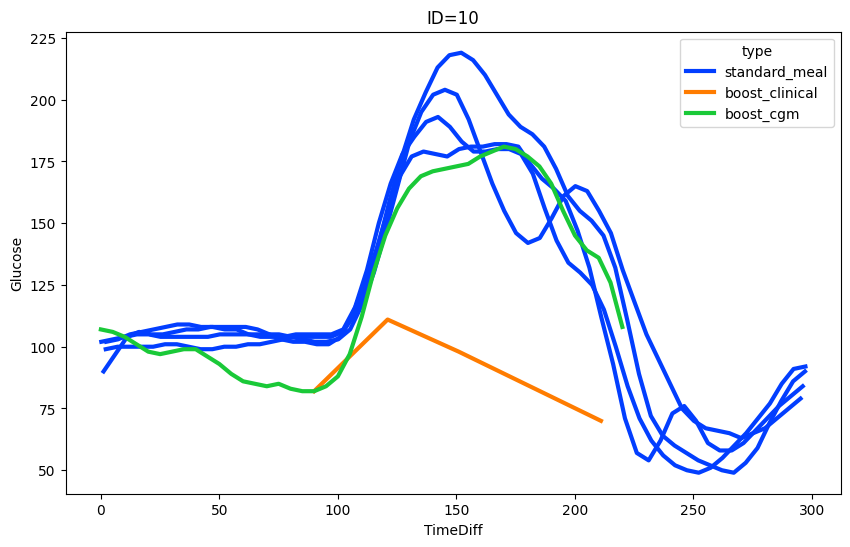

In [212]:
frng_10=food_responses[food_responses['id']==10]
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frng_10, y="Glucose", x="TimeDiff", palette='bright',hue='type',linewidth=3,units='date',estimator=None).set(title='ID=10')

Text(0.5, 1.0, 'ID=10')

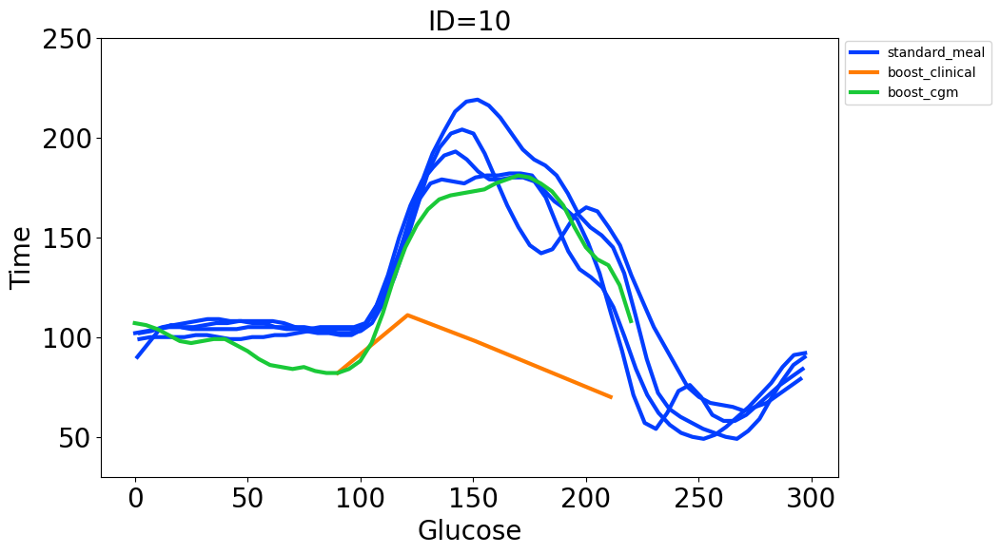

In [213]:
frng_10=food_responses[food_responses['id']==10]
plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frng_10, y="Glucose", x="TimeDiff", palette='bright',hue='type',linewidth=3,units='date',estimator=None).set(title='ID=10')
plt.ylim(30,250)
plt.legend(loc='center left', bbox_to_anchor=(1, .92), ncol=1)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel('Glucose', fontsize=20);
plt.ylabel('Time', fontsize=20);
plt.title('ID=10', fontsize=20)

In [214]:
max_times=ten_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
ten_ogtt.groupby('date')['TimeDiff_Round'].nunique()

dates=ten_ogtt['date'].unique()
df_first_date=ten_ogtt[ten_ogtt['date']==dates[0]]

# ten_ogtt_test=ten_ogtt

column_names = ten_ogtt.columns.tolist()

# Create an empty DataFrame with the same columns
df_ppgr_grouped_ten = pd.DataFrame(columns=column_names)

for i in dates:
  df_date=ten_ogtt[ten_ogtt['date']==i]
  print(i)
  # df_date['nearest_time'] = df_first_date['TimeDiff'].apply(find_nearest_value)
  result_df = find_nearest_value(df_date, df_first_date, 'TimeDiff_Round', 'TimeDiff_Round')
  df_ppgr_grouped_ten=df_ppgr_grouped_ten.append(result_df)


# For grouped
boost_sub=boost_cgm_ten[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_ten[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
# ogtt_sub=ten_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
ogtt_sub=df_ppgr_grouped_ten[['nearest_TimeDiff_Round','Glucose','timestamp_dt','date']]
boost_sub['id']=10
gtt_sub['id']=10
ogtt_sub['id']=10

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

ogtt_sub.rename(columns={"nearest_TimeDiff_Round": "nearest_time_diff"},inplace=True)
boost_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)
gtt_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)


food_responses_grouped=food_responses_grouped.append([ogtt_sub,gtt_sub,boost_sub])
food_responses_grouped


2020-03-23
2020-03-25
2020-03-27
2020-03-29


,nearest_time_diff,Glucose,Time,date,id,type
68,4.000000,88.0,2019-09-17 05:43:31,2019-09-17,1,standard_meal
69,9.000000,84.0,2019-09-17 05:48:32,2019-09-17,1,standard_meal
70,14.000000,81.0,2019-09-17 05:53:31,2019-09-17,1,standard_meal
71,19.000000,81.0,2019-09-17 05:58:31,2019-09-17,1,standard_meal
72,24.000000,83.0,2019-09-17 06:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2154,200.050000,145.0,2020-03-30 08:59:03,2020-03-30,10,boost_cgm
2155,205.033333,139.0,2020-03-30 09:04:02,2020-03-30,10,boost_cgm
2156,210.050000,136.0,2020-03-30 09:09:03,2020-03-30,10,boost_cgm
2157,215.033333,126.0,2020-03-30 09:14:02,2020-03-30,10,boost_cgm


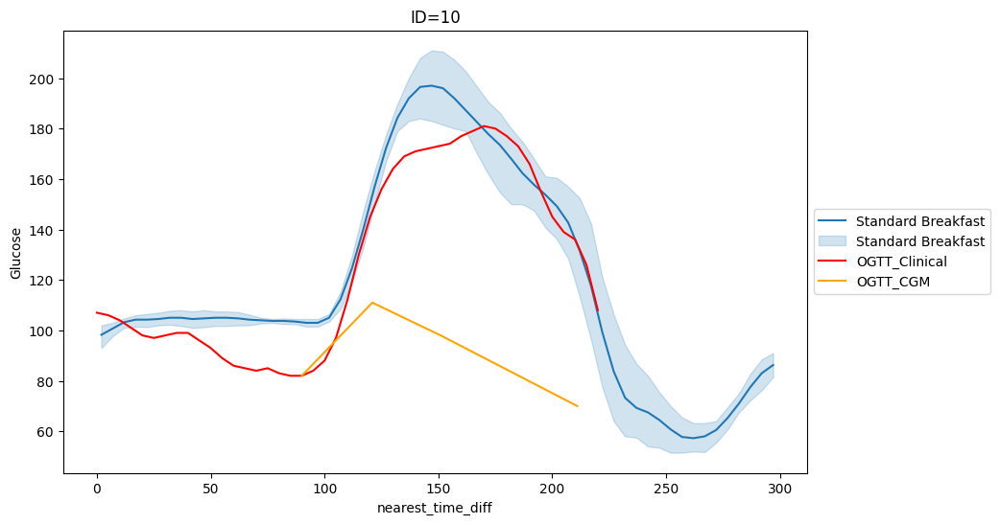

In [215]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ogtt_sub, y="Glucose", x="nearest_time_diff", palette='bright').set(title='ID=10')
sns.lineplot(data=boost_sub, y="Glucose", x="nearest_time_diff", color='red',estimator=None)
sns.lineplot(data=gtt_sub, y="Glucose", x="nearest_time_diff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


[Text(0.5, 1.0, 'ID=10')]

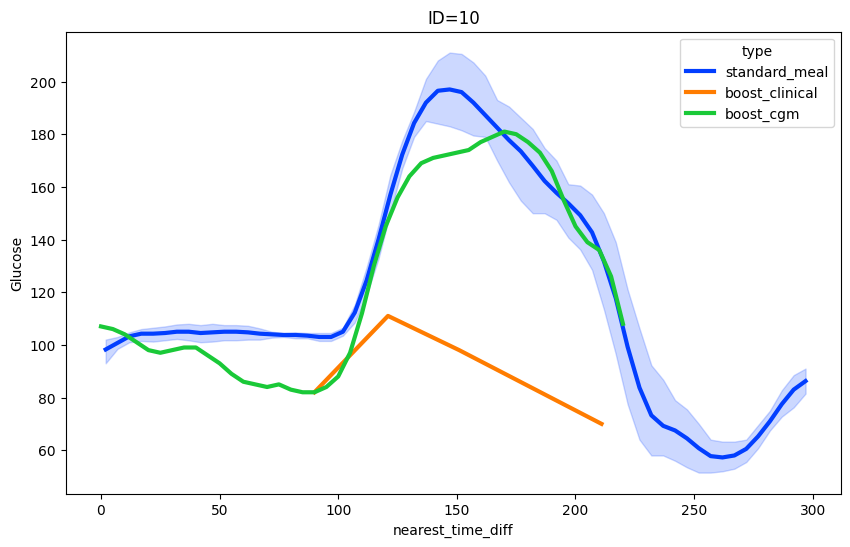

In [216]:
frg_10=food_responses_grouped[food_responses_grouped['id']==10]
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frg_10, y="Glucose", x="nearest_time_diff", palette='bright',hue='type',linewidth=3).set(title='ID=10')

Text(0.5, 1.0, 'ID=10')

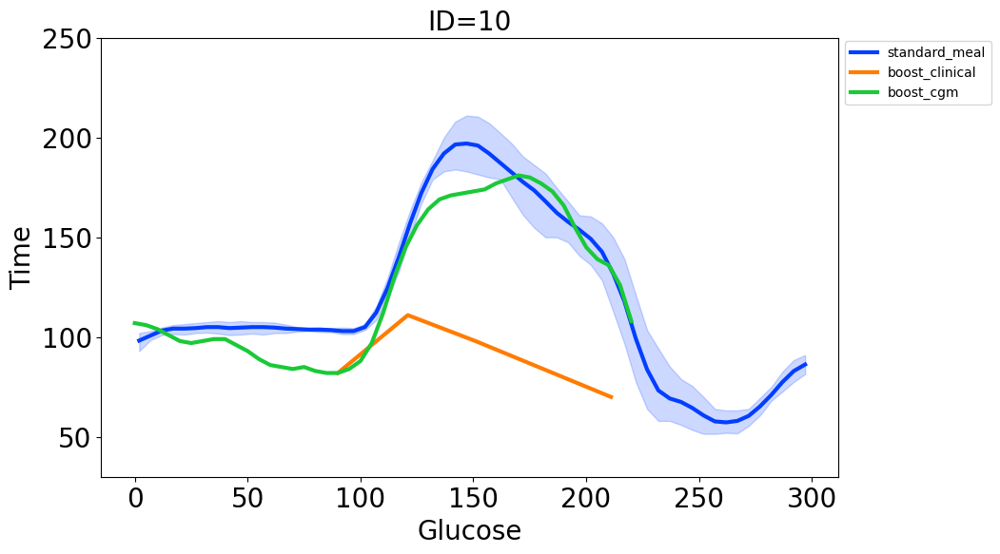

In [217]:
frg_10=food_responses_grouped[food_responses_grouped['id']==10]
plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frg_10, y="Glucose", x="nearest_time_diff", palette='bright',hue='type',linewidth=3).set(title='ID=10')
plt.ylim(30,250)
plt.legend(loc='center left', bbox_to_anchor=(1, .92), ncol=1)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel('Glucose', fontsize=20);
plt.ylabel('Time', fontsize=20);
plt.title('ID=10', fontsize=20)

In [218]:
# df_gtt_ten['Time']=pd.to_datetime(df_gtt_ten['Time'])
# df_gtt_ten['TimeDiff'] = (df_gtt_ten['Time'] - df_gtt_ten['Time'].min()).dt.total_seconds()/ 60

In [219]:
s = '19-011'

GTT = [91, 143, 114, 87]
GTT_times = ['2019-11-18 7:08:00', '2019-11-18 7:40:00', '2019-11-18 8:10:00', '2019-11-18 9:10:00']
GTT_times = pd.to_datetime(GTT_times, format='%Y-%m-%dT%H:%M:%S')

df_gtt_eleven = pd.DataFrame({'Glucose': GTT, 'Time': GTT_times})
auc_ogtt_eleven=calculate_area_under_curve(df_gtt_eleven)
auc_ogtt_eleven

13629

In [220]:
df_gtt_eleven['Time']=pd.to_datetime(df_gtt_eleven['Time'])
df_gtt_eleven['TimeDiff'] = (df_gtt_eleven['Time'] - df_gtt_eleven['Time'].min()).dt.total_seconds()/ 60

In [221]:
cgm_eleven = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/011/Dexcom_011.csv')
cgm_eleven['timestamp_dt'] = pd.to_datetime(cgm_eleven['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_eleven['Glucose'] = cgm_eleven['Glucose Value (mg/dL)']
cgm_eleven['Time'] = pd.to_datetime(cgm_eleven['Timestamp (YYYY-MM-DDThh:mm:ss)'])

cgm_eleven = cgm_eleven.dropna(subset=['timestamp_dt'])
cgm_eleven['date'] = cgm_eleven['timestamp_dt'].dt.date
cgm_eleven

food_eleven = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/011/Food_Log_011.csv')

food_eleven['date'] = pd.to_datetime(food_eleven['date']).dt.date

food_eleven['time_begin'] = pd.to_datetime(food_eleven['time_begin'])
# window_dt = pd.Timedelta(minutes=120)
window_dt = pd.Timedelta(minutes=210)


food_eleven["time_begin_win"] = food_eleven["time_begin"] + window_dt

merge_food_cgm_eleven = pd.merge(cgm_eleven, food_eleven, left_on=['date'], right_on=['date'])

cf_eleven = food_eleven[food_eleven['logged_food']=='Std Bfast']
# window_dt_brkfst = pd.Timedelta(minutes=-30)
# change to 90 mins before food
window_dt_brkfst = pd.Timedelta(minutes=-90)


merge_food_cgm_eleven = pd.merge(cgm_eleven, cf_eleven, left_on=['date'], right_on=['date'])

food_cgm_eleven_cf = merge_food_cgm_eleven[(merge_food_cgm_eleven['timestamp_dt'] <= merge_food_cgm_eleven['time_begin_win']) & (merge_food_cgm_eleven['timestamp_dt'] >= (merge_food_cgm_eleven['time_begin']+window_dt_brkfst))]

food_cgm_eleven_cf['pre_glu_time'] = food_cgm_eleven_cf.groupby('date')['timestamp_dt'].transform('min')

column_names = food_cgm_eleven_cf.columns.values
food_cgm_eleven_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_eleven_cf['date'].unique():
    date_sub = food_cgm_eleven_cf[food_cgm_eleven_cf['date'] == i]

    date_sub = date_sub.sort_values(by='timestamp_dt')
    min_glu = date_sub['Glucose Value (mg/dL)'].iloc[0]
    date_sub['min_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

    final_glu = date_sub['Glucose Value (mg/dL)'].iloc[-1]
    date_sub['final_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

    max_glu = date_sub['Glucose Value (mg/dL)'].max()
    date_sub['max_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

    date_sub['meal_auc'] = calculate_area_under_curve(date_sub)
    date_sub['auc_ogtt_eleven'] = auc_ogtt_eleven
    j = i - dt.timedelta(days=1)
    cgm_eleven_ld = cgm_eleven[cgm_eleven['date'] == j]

    date_sub['mean_glu_ld'] = cgm_eleven_ld.groupby('date')['Glucose'].transform('mean').iloc[0]
    date_sub['interdaycv'] = interdaycv(cgm_eleven_ld)
    date_sub['interdaysd'] = interdaysd(cgm_eleven_ld)
    date_sub['TIR'] = TIR(cgm_eleven_ld, sd=1, sr=5)
    date_sub['TOR'] = TOR(cgm_eleven_ld, sd=1, sr=5)
    date_sub['POR'] = POR(cgm_eleven_ld, sd=1, sr=5)
    date_sub['PIR'] = PIR(cgm_eleven_ld, sd=1, sr=5)
    date_sub['MGE'] = MGE(cgm_eleven_ld, sd=1)
    date_sub['MGN'] = MGN(cgm_eleven_ld, sd=1)
    # MAGE(cgm_eleven, std=1)
    date_sub['J_index'] = J_index(cgm_eleven_ld)
    date_sub['LBGI'] = LBGI(cgm_eleven_ld)
    date_sub['HBGI'] = HBGI(cgm_eleven_ld)
    # MODD(cgm_eleven)
    # CONGA24(cgm_eleven)
    date_sub['GMI'] = GMI(date_sub)

    food_cgm_eleven_cf_all_dates = food_cgm_eleven_cf_all_dates.append(date_sub)

eleven_ogtt = food_cgm_eleven_cf_all_dates

eleven_ogtt_dup = eleven_ogtt.drop_duplicates(subset=['date'], keep='first')
eleven_ogtt_dup['id'] = 11
eleven_ogtt_dup['a1c'] = "PD"



In [222]:
# food_eleven[food_eleven['logged_food']=='Std Bfast']

In [223]:
# food_eleven[food_eleven['logged_food']=='Boost']

In [224]:
window_dt = pd.Timedelta(minutes=120)
# boost_time=dt.datetime(2020,4,16,6,38,0)
#change to 90 mins before
boost_time=dt.datetime(2020,4,16,5,38,0)
#8:53:00
# 2019-10-31 8:53:00
# 2019-11-18 7:08:00

# boost_cgm_eleven=cgm_eleven[(cgm_eleven['timestamp_dt']>=boost_time)&(cgm_eleven['timestamp_dt']<=boost_time + window_dt)]
boost_cgm_eleven=cgm_eleven[(cgm_eleven['timestamp_dt']>=boost_time)]

In [225]:
# eleven_ogtt['TimeDiff'] = (eleven_ogtt['timestamp_dt'] - eleven_ogtt['time_begin']).dt.total_seconds()/ 60
eleven_ogtt['TimeDiff'] = (eleven_ogtt['timestamp_dt'] - (eleven_ogtt['time_begin']+window_dt_brkfst)).dt.total_seconds()/ 60

# Group by and use cumcount
eleven_ogtt['SequentialTimeValues'] = eleven_ogtt.groupby('date').cumcount() + 1

df_gtt_eleven['Time']=pd.to_datetime(df_gtt_eleven['Time'])

# df_gtt_eleven['TimeDiff'] = (df_gtt_eleven['Time'] - df_gtt_eleven['Time'].min()).dt.total_seconds()/ 60
df_gtt_eleven['TimeDiff'] = (df_gtt_eleven['Time'] - (df_gtt_eleven['Time'].min()+window_dt_brkfst)).dt.total_seconds()/ 60


boost_cgm_eleven['TimeDiff'] = (boost_cgm_eleven['timestamp_dt'] - boost_time).dt.total_seconds()/ 60

In [226]:
eleven_ogtt['TimeDiff_Round']=eleven_ogtt['TimeDiff'].round()
df_gtt_eleven['TimeDiff_Round']=df_gtt_eleven['TimeDiff'].round()
boost_cgm_eleven['TimeDiff_Round']=boost_cgm_eleven['TimeDiff'].round()

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

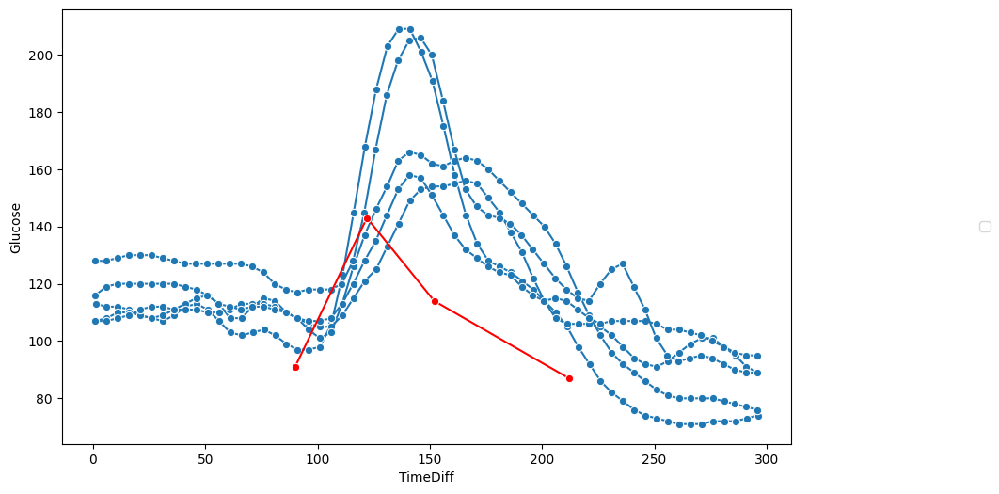

In [227]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=eleven_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_eleven, y="Glucose", x="TimeDiff", marker='o',color='red')


<Axes: xlabel='TimeDiff', ylabel='Glucose'>

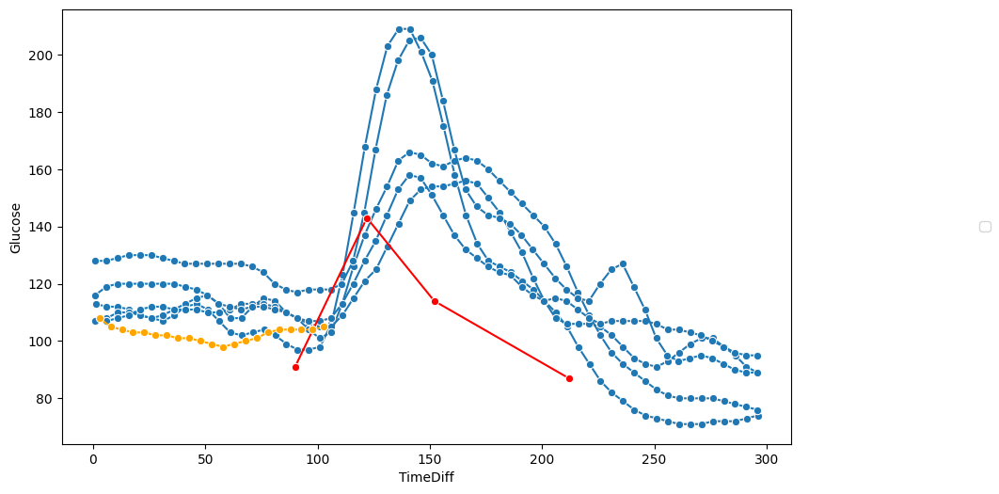

In [228]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=eleven_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_eleven, y="Glucose", x="TimeDiff", marker='o',color='red')
sns.lineplot(data=boost_cgm_eleven, y="Glucose", x="TimeDiff", marker='o',color='orange')

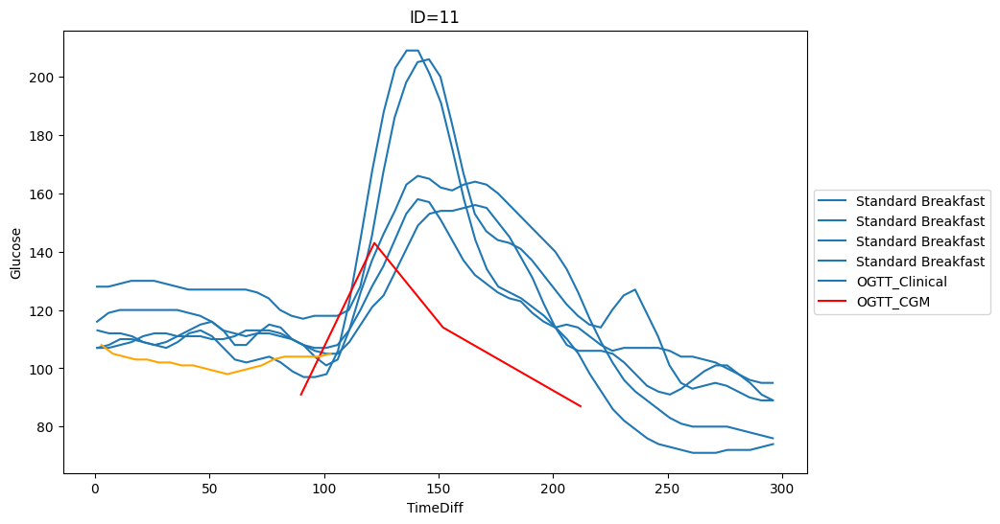

In [229]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=eleven_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=11')
sns.lineplot(data=df_gtt_eleven, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_eleven, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


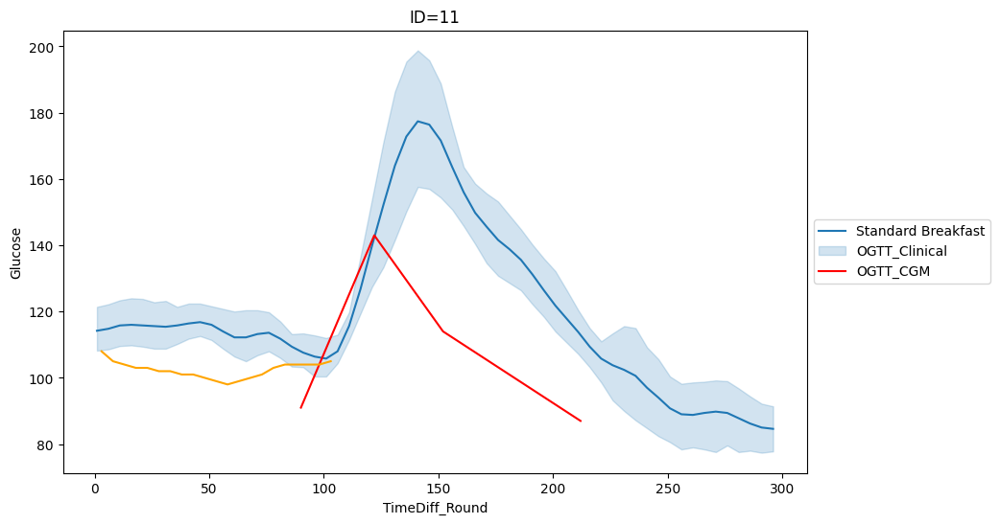

In [230]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=eleven_ogtt, y="Glucose", x="TimeDiff_Round", palette='bright').set(title='ID=11')
sns.lineplot(data=df_gtt_eleven, y="Glucose", x="TimeDiff_Round", color='red',estimator=None)
sns.lineplot(data=boost_cgm_eleven, y="Glucose", x="TimeDiff_Round", color='orange')
plt.legend(labels=["Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


In [231]:
boost_sub=boost_cgm_eleven[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_eleven[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
ogtt_sub=eleven_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
boost_sub['id']=11
gtt_sub['id']=11
ogtt_sub['id']=11

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

food_responses=food_responses.append([ogtt_sub,gtt_sub,boost_sub])
food_responses


,TimeDiff,Glucose,Time,date,id,type
68,3.516667,88.0,2019-09-17 05:43:31,2019-09-17,1,standard_meal
69,8.533333,84.0,2019-09-17 05:48:32,2019-09-17,1,standard_meal
70,13.516667,81.0,2019-09-17 05:53:31,2019-09-17,1,standard_meal
71,18.516667,81.0,2019-09-17 05:58:31,2019-09-17,1,standard_meal
72,23.533333,83.0,2019-09-17 06:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2849,82.850000,104.0,2020-04-16 07:00:51,2020-04-16,11,boost_cgm
2850,87.850000,104.0,2020-04-16 07:05:51,2020-04-16,11,boost_cgm
2851,92.850000,104.0,2020-04-16 07:10:51,2020-04-16,11,boost_cgm
2852,97.850000,104.0,2020-04-16 07:15:51,2020-04-16,11,boost_cgm


[Text(0.5, 1.0, 'ID=11')]

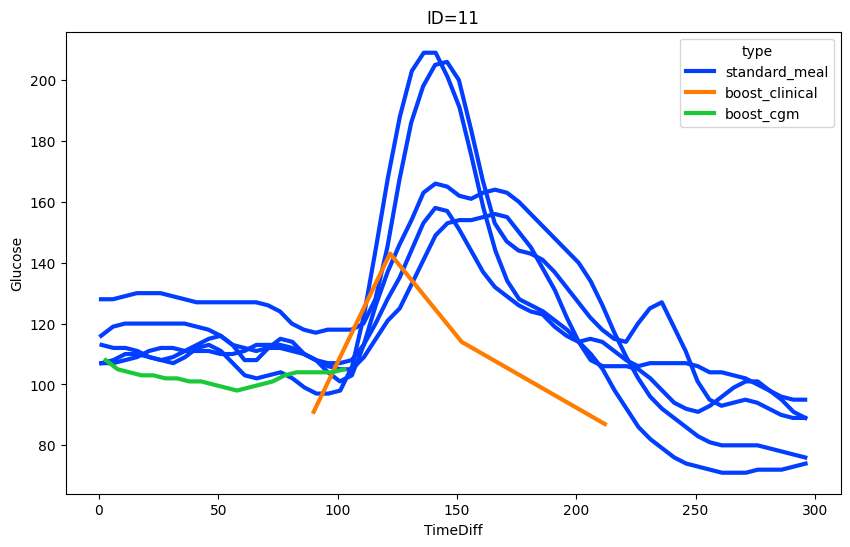

In [232]:
frng_11=food_responses[food_responses['id']==11]
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frng_11, y="Glucose", x="TimeDiff", palette='bright',hue='type',linewidth=3,units='date',estimator=None).set(title='ID=11')

Text(0.5, 1.0, 'ID=11')

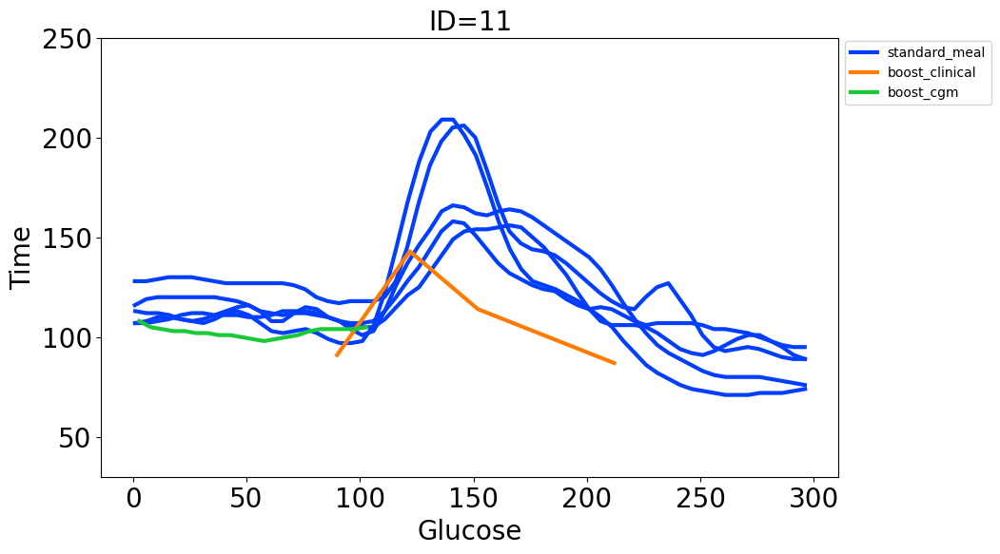

In [233]:
frng_11=food_responses[food_responses['id']==11]
plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frng_11, y="Glucose", x="TimeDiff", palette='bright',hue='type',linewidth=3,units='date',estimator=None).set(title='ID=11')
plt.ylim(30,250)
plt.legend(loc='center left', bbox_to_anchor=(1, .92), ncol=1)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel('Glucose', fontsize=20);
plt.ylabel('Time', fontsize=20);
plt.title('ID=11', fontsize=20)

In [234]:
max_times=eleven_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
eleven_ogtt.groupby('date')['TimeDiff_Round'].nunique()

date
2020-04-07    60
2020-04-09    60
2020-04-11    60
2020-04-13    60
2020-04-15    60
Name: TimeDiff_Round, dtype: int64

In [235]:
max_times=eleven_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
eleven_ogtt.groupby('date')['TimeDiff_Round'].nunique()

dates=eleven_ogtt['date'].unique()
df_first_date=eleven_ogtt[eleven_ogtt['date']==dates[0]]

# eleven_ogtt_test=eleven_ogtt

column_names = eleven_ogtt.columns.tolist()

# Create an empty DataFrame with the same columns
df_ppgr_grouped_eleven = pd.DataFrame(columns=column_names)

for i in dates:
  df_date=eleven_ogtt[eleven_ogtt['date']==i]
  print(i)
  # df_date['nearest_time'] = df_first_date['TimeDiff'].apply(find_nearest_value)
  result_df = find_nearest_value(df_date, df_first_date, 'TimeDiff_Round', 'TimeDiff_Round')
  df_ppgr_grouped_eleven=df_ppgr_grouped_eleven.append(result_df)


# For grouped
boost_sub=boost_cgm_eleven[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_eleven[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
# ogtt_sub=eleven_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
ogtt_sub=df_ppgr_grouped_eleven[['nearest_TimeDiff_Round','Glucose','timestamp_dt','date']]
boost_sub['id']=11
gtt_sub['id']=11
ogtt_sub['id']=11

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

ogtt_sub.rename(columns={"nearest_TimeDiff_Round": "nearest_time_diff"},inplace=True)
boost_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)
gtt_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)


food_responses_grouped=food_responses_grouped.append([ogtt_sub,gtt_sub,boost_sub])
food_responses_grouped


2020-04-07
2020-04-09
2020-04-11
2020-04-13
2020-04-15


,nearest_time_diff,Glucose,Time,date,id,type
68,4.00,88.0,2019-09-17 05:43:31,2019-09-17,1,standard_meal
69,9.00,84.0,2019-09-17 05:48:32,2019-09-17,1,standard_meal
70,14.00,81.0,2019-09-17 05:53:31,2019-09-17,1,standard_meal
71,19.00,81.0,2019-09-17 05:58:31,2019-09-17,1,standard_meal
72,24.00,83.0,2019-09-17 06:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2849,82.85,104.0,2020-04-16 07:00:51,2020-04-16,11,boost_cgm
2850,87.85,104.0,2020-04-16 07:05:51,2020-04-16,11,boost_cgm
2851,92.85,104.0,2020-04-16 07:10:51,2020-04-16,11,boost_cgm
2852,97.85,104.0,2020-04-16 07:15:51,2020-04-16,11,boost_cgm


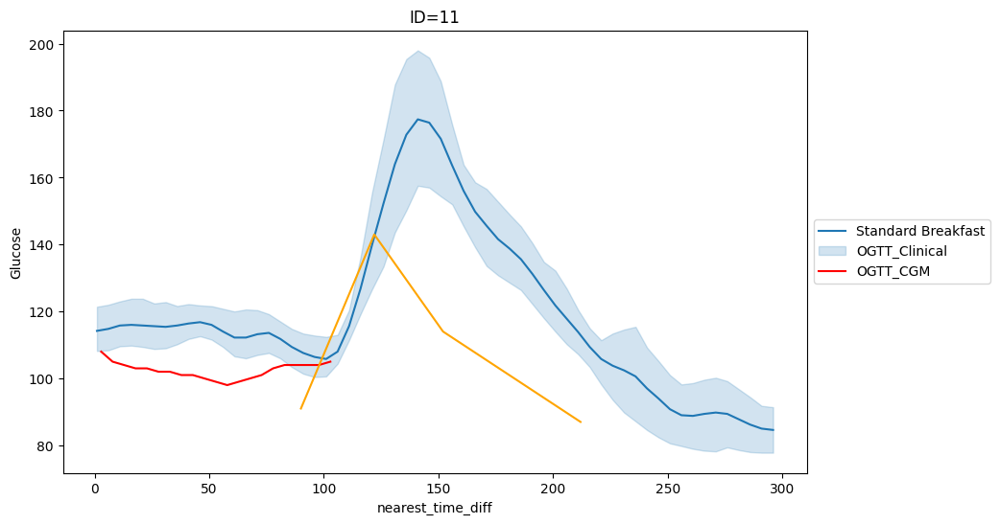

In [236]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ogtt_sub, y="Glucose", x="nearest_time_diff", palette='bright').set(title='ID=11')
sns.lineplot(data=boost_sub, y="Glucose", x="nearest_time_diff", color='red',estimator=None)
sns.lineplot(data=gtt_sub, y="Glucose", x="nearest_time_diff", color='orange')
plt.legend(labels=["Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


[Text(0.5, 1.0, 'ID=11')]

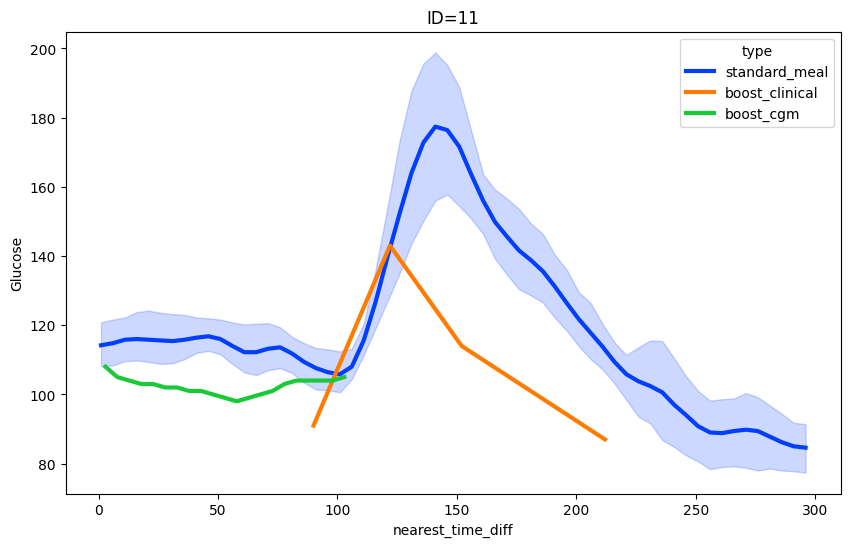

In [237]:
frg_11=food_responses_grouped[food_responses_grouped['id']==11]
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frg_11, y="Glucose", x="nearest_time_diff", palette='bright',hue='type',linewidth=3).set(title='ID=11')

Text(0.5, 1.0, 'ID=11')

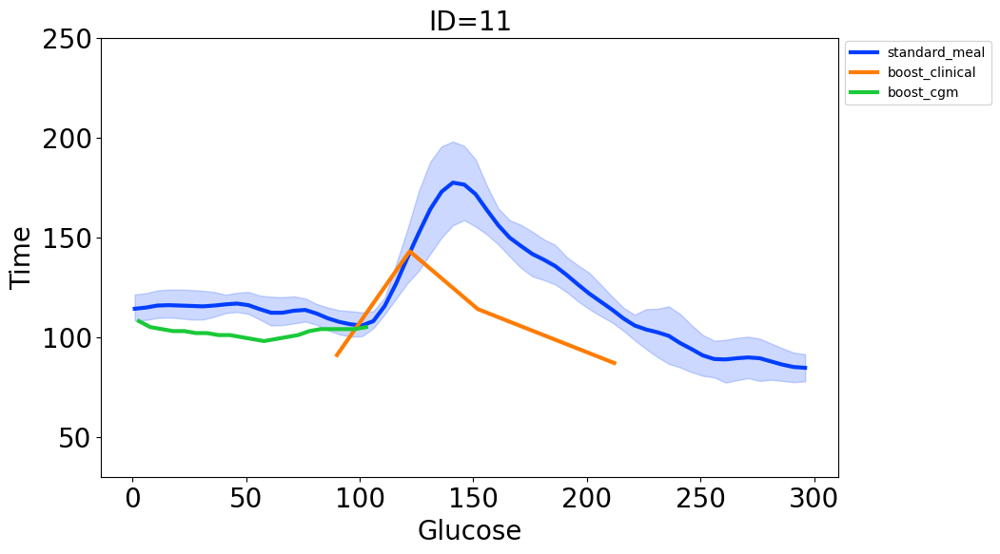

In [238]:
frg_11=food_responses_grouped[food_responses_grouped['id']==11]
plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frg_11, y="Glucose", x="nearest_time_diff", palette='bright',hue='type',linewidth=3).set(title='ID=11')
plt.ylim(30,250)
plt.legend(loc='center left', bbox_to_anchor=(1, .92), ncol=1)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel('Glucose', fontsize=20);
plt.ylabel('Time', fontsize=20);
plt.title('ID=11', fontsize=20)

In [239]:
# ogtt_acc[ogtt_acc['datetime'].lt(time_start.max())]

In [240]:
# time_start = ogtt_day['pre_glu_time'].values
# acc_time_start = ogtt_acc[ogtt_acc['datetime'].lt(time_start.max())]
# acc_time_start
# ogtt_day['pre_glu_time'].values

In [241]:
s = '19-012'

GTT = [85, 92, 108, 87]
GTT_times = ['2019-12-13 7:21:00', '2019-12-13 7:55:00', '2019-12-13 8:25:00', '2019-12-13 9:25:00']
GTT_times = pd.to_datetime(GTT_times, format='%Y-%m-%dT%H:%M:%S')

df_gtt_twelve = pd.DataFrame({'Glucose': GTT, 'Time': GTT_times})
auc_ogtt_twelve=calculate_area_under_curve(df_gtt_twelve)
auc_ogtt_twelve

11859

In [242]:
cgm_twelve = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/012/Dexcom_012.csv')
cgm_twelve['timestamp_dt'] = pd.to_datetime(cgm_twelve['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_twelve['Glucose'] = cgm_twelve['Glucose Value (mg/dL)']
cgm_twelve['Time'] = pd.to_datetime(cgm_twelve['Timestamp (YYYY-MM-DDThh:mm:ss)'])

cgm_twelve = cgm_twelve.dropna(subset=['timestamp_dt'])
cgm_twelve['date'] = cgm_twelve['timestamp_dt'].dt.date

food_twelve = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/012/Food_Log_012.csv')

food_twelve['date'] = pd.to_datetime(food_twelve['date']).dt.date

food_twelve['time_begin'] = pd.to_datetime(food_twelve['time_begin'])
# window_dt = pd.Timedelta(minutes=120)
window_dt = pd.Timedelta(minutes=210)

food_twelve["time_begin_win"] = food_twelve["time_begin"] + window_dt

merge_food_cgm_twelve = pd.merge(cgm_twelve, food_twelve, left_on=['date'], right_on=['date'])

cf_twelve = food_twelve[food_twelve['logged_food']=='Frosted Flake']

merge_food_cgm_twelve = pd.merge(cgm_twelve, cf_twelve, left_on=['date'], right_on=['date'])
# window_dt_brkfst = pd.Timedelta(minutes=-30)
window_dt_brkfst = pd.Timedelta(minutes=-90)

food_cgm_twelve_cf = merge_food_cgm_twelve[(merge_food_cgm_twelve['timestamp_dt'] <= merge_food_cgm_twelve['time_begin_win']) & (merge_food_cgm_twelve['timestamp_dt'] >= (merge_food_cgm_twelve['time_begin']+window_dt_brkfst))]

food_cgm_twelve_cf['pre_glu_time'] = food_cgm_twelve_cf.groupby('date')['timestamp_dt'].transform('min')

column_names = food_cgm_twelve_cf.columns.values
food_cgm_twelve_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_twelve_cf['date'].unique():
    date_sub = food_cgm_twelve_cf[food_cgm_twelve_cf['date'] == i]

    date_sub = date_sub.sort_values(by='timestamp_dt')
    min_glu = date_sub['Glucose Value (mg/dL)'].iloc[0]
    date_sub['min_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

    final_glu = date_sub['Glucose Value (mg/dL)'].iloc[-1]
    date_sub['final_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

    max_glu = date_sub['Glucose Value (mg/dL)'].max()
    date_sub['max_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

    date_sub['meal_auc'] = calculate_area_under_curve(date_sub)
    date_sub['auc_ogtt_twelve'] = auc_ogtt_twelve
    j = i - dt.timedelta(days=1)
    cgm_twelve_ld = cgm_twelve[cgm_twelve['date'] == j]

    date_sub['mean_glu_ld'] = cgm_twelve_ld.groupby('date')['Glucose'].transform('mean').iloc[0]
    date_sub['interdaycv'] = interdaycv(cgm_twelve_ld)
    date_sub['interdaysd'] = interdaysd(cgm_twelve_ld)
    date_sub['TIR'] = TIR(cgm_twelve_ld, sd=1, sr=5)
    date_sub['TOR'] = TOR(cgm_twelve_ld, sd=1, sr=5)
    date_sub['POR'] = POR(cgm_twelve_ld, sd=1, sr=5)
    date_sub['PIR'] = PIR(cgm_twelve_ld, sd=1, sr=5)
    date_sub['MGE'] = MGE(cgm_twelve_ld, sd=1)
    date_sub['MGN'] = MGN(cgm_twelve_ld, sd=1)
    # MAGE(cgm_twelve, std=1)
    date_sub['J_index'] = J_index(cgm_twelve_ld)
    date_sub['LBGI'] = LBGI(cgm_twelve_ld)
    date_sub['HBGI'] = HBGI(cgm_twelve_ld)
    # MODD(cgm_twelve)
    # CONGA24(cgm_twelve)
    date_sub['GMI'] = GMI(date_sub)

    food_cgm_twelve_cf_all_dates = food_cgm_twelve_cf_all_dates.append(date_sub)

twelve_ogtt = food_cgm_twelve_cf_all_dates

twelve_ogtt_dup = twelve_ogtt.drop_duplicates(subset=['date'], keep='first')
twelve_ogtt_dup['id'] = 12
twelve_ogtt_dup['a1c'] = "PD"


In [243]:
# food_twelve['logged_food'].unique()

In [244]:
# food_twelve[food_twelve['logged_food']=='Frosted Flake']

In [245]:
# food_twelve[food_twelve['logged_food']=='Boost']

In [246]:
window_dt = pd.Timedelta(minutes=120)
# boost_time=dt.datetime(2020,5,11,6,51,0)
#change to 90 hours before
boost_time=dt.datetime(2020,5,11,5,51,0)
# 2019-12-13 7:21:00'

# boost_cgm_twelve=cgm_twelve[(cgm_twelve['timestamp_dt']>=boost_time)&(cgm_twelve['timestamp_dt']<=boost_time + window_dt)]
boost_cgm_twelve=cgm_twelve[(cgm_twelve['timestamp_dt']>=boost_time)]


In [247]:
# twelve_ogtt['TimeDiff'] = (twelve_ogtt['timestamp_dt'] - twelve_ogtt['time_begin']).dt.total_seconds()/ 60
twelve_ogtt['TimeDiff'] = (twelve_ogtt['timestamp_dt'] - (twelve_ogtt['time_begin']+window_dt_brkfst)).dt.total_seconds()/ 60

# Group by and use cumcount
twelve_ogtt['SequentialTimeValues'] = twelve_ogtt.groupby('date').cumcount() + 1

df_gtt_twelve['Time']=pd.to_datetime(df_gtt_twelve['Time'])

# df_gtt_twelve['TimeDiff'] = (df_gtt_twelve['Time'] - df_gtt_twelve['Time'].min()).dt.total_seconds()/ 60
df_gtt_twelve['TimeDiff'] = (df_gtt_twelve['Time'] - (df_gtt_twelve['Time'].min()+window_dt_brkfst)).dt.total_seconds()/ 60


boost_cgm_twelve['TimeDiff'] = (boost_cgm_twelve['timestamp_dt'] - boost_time).dt.total_seconds()/ 60

In [248]:
twelve_ogtt['TimeDiff_Round']=twelve_ogtt['TimeDiff'].round()
df_gtt_twelve['TimeDiff_Round']=df_gtt_twelve['TimeDiff'].round()
boost_cgm_twelve['TimeDiff_Round']=boost_cgm_twelve['TimeDiff'].round()

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

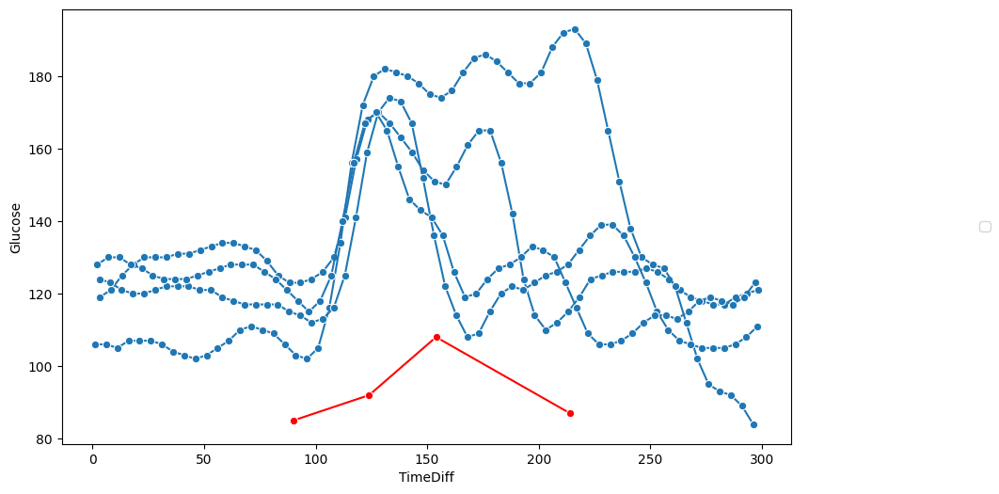

In [249]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=twelve_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_twelve, y="Glucose", x="TimeDiff", marker='o',color='red')

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

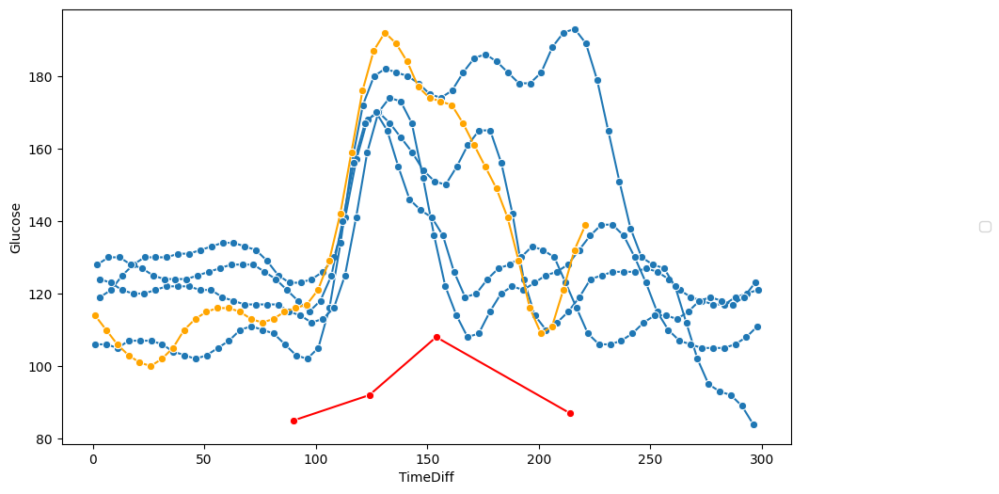

In [250]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=twelve_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_twelve, y="Glucose", x="TimeDiff", marker='o',color='red')
sns.lineplot(data=boost_cgm_twelve, y="Glucose", x="TimeDiff", marker='o',color='orange')

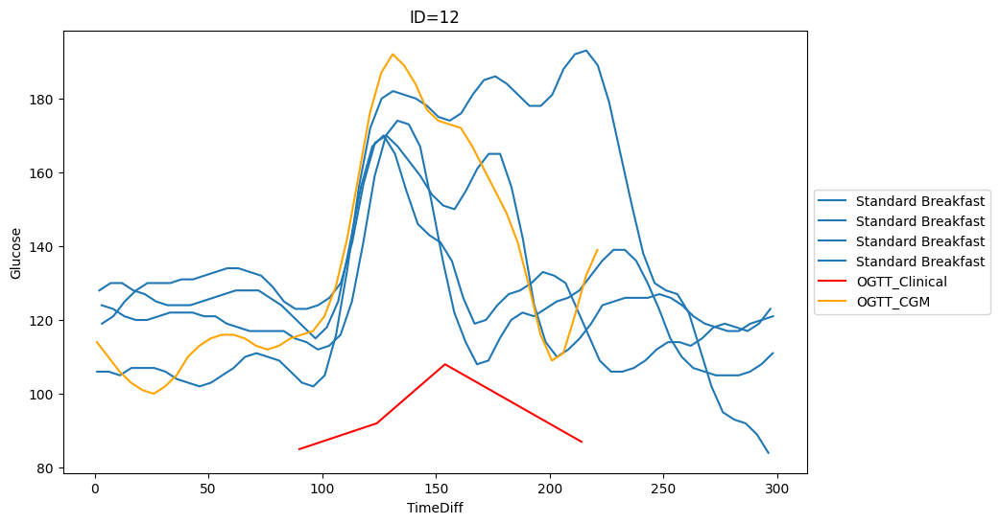

In [251]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=twelve_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=12')
sns.lineplot(data=df_gtt_twelve, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_twelve, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


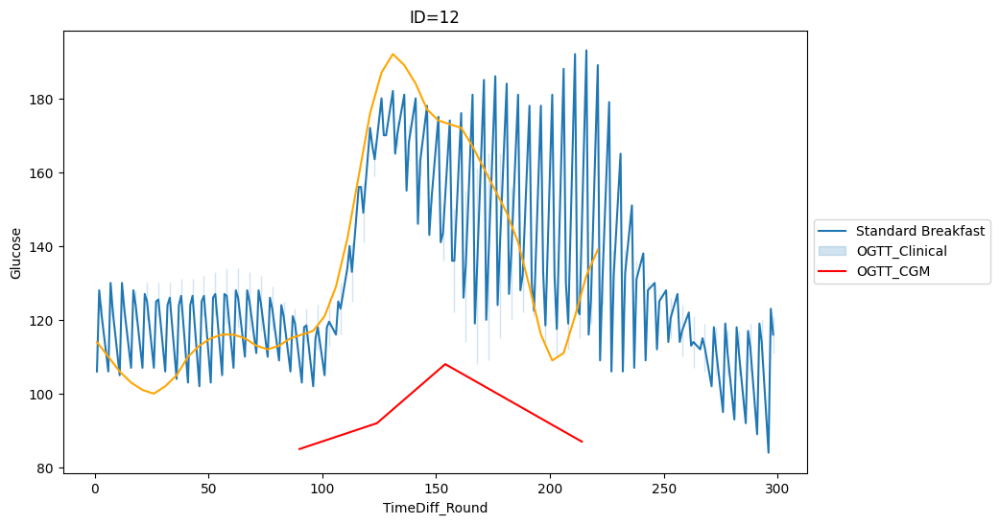

In [252]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=twelve_ogtt, y="Glucose", x="TimeDiff_Round", palette='bright').set(title='ID=12')
sns.lineplot(data=df_gtt_twelve, y="Glucose", x="TimeDiff_Round", color='red',estimator=None)
sns.lineplot(data=boost_cgm_twelve, y="Glucose", x="TimeDiff_Round", color='orange')
plt.legend(labels=["Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


In [253]:
boost_sub=boost_cgm_twelve[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_twelve[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
ogtt_sub=twelve_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
boost_sub['id']=12
gtt_sub['id']=12
ogtt_sub['id']=12

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

food_responses=food_responses.append([ogtt_sub,gtt_sub,boost_sub])
food_responses


,TimeDiff,Glucose,Time,date,id,type
68,3.516667,88.0,2019-09-17 05:43:31,2019-09-17,1,standard_meal
69,8.533333,84.0,2019-09-17 05:48:32,2019-09-17,1,standard_meal
70,13.516667,81.0,2019-09-17 05:53:31,2019-09-17,1,standard_meal
71,18.516667,81.0,2019-09-17 05:58:31,2019-09-17,1,standard_meal
72,23.533333,83.0,2019-09-17 06:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2175,201.000000,109.0,2020-05-11 09:12:00,2020-05-11,12,boost_cgm
2176,205.983333,111.0,2020-05-11 09:16:59,2020-05-11,12,boost_cgm
2177,210.983333,121.0,2020-05-11 09:21:59,2020-05-11,12,boost_cgm
2178,215.983333,132.0,2020-05-11 09:26:59,2020-05-11,12,boost_cgm


[Text(0.5, 1.0, 'ID=12')]

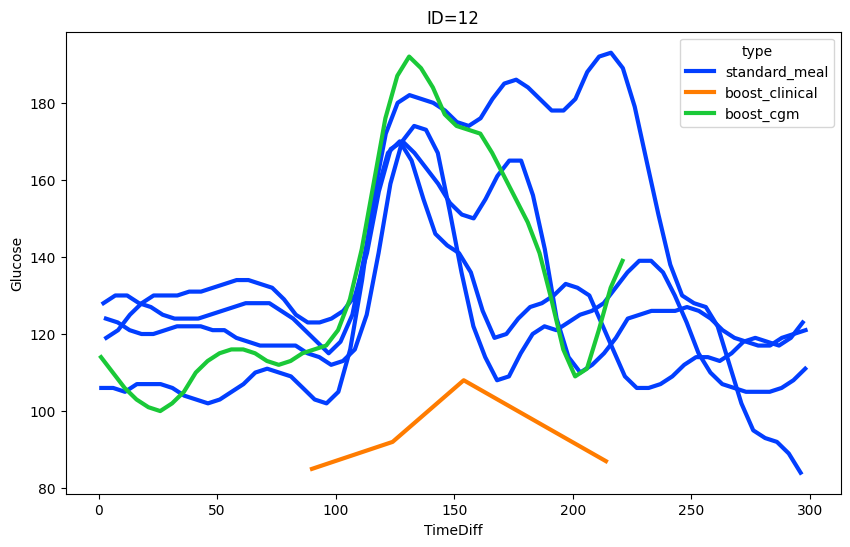

In [254]:
frng_12=food_responses[food_responses['id']==12]
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frng_12, y="Glucose", x="TimeDiff", palette='bright',hue='type',linewidth=3,units='date',estimator=None).set(title='ID=12')

Text(0.5, 1.0, 'ID=12')

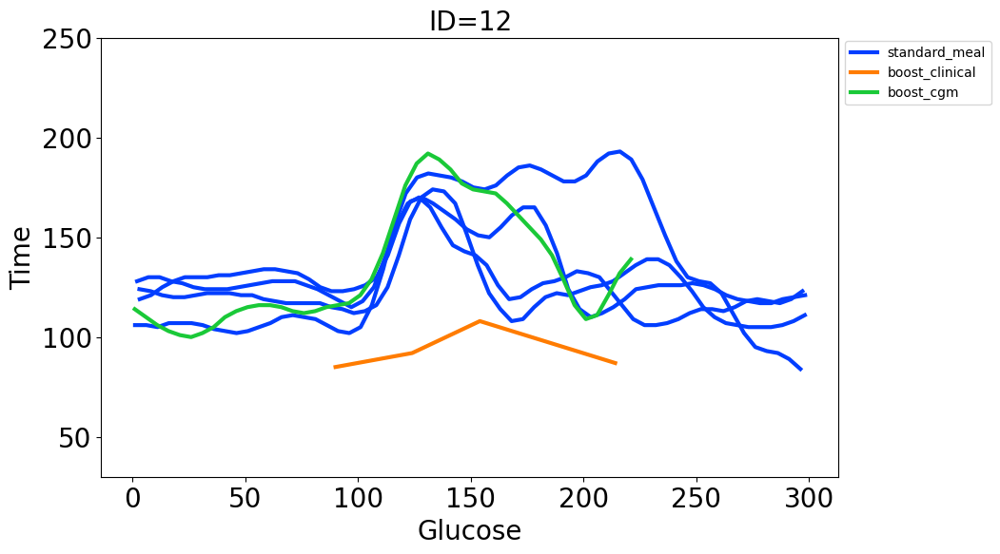

In [255]:
frng_12=food_responses[food_responses['id']==12]
plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frng_12, y="Glucose", x="TimeDiff", palette='bright',hue='type',linewidth=3,units='date',estimator=None).set(title='ID=12')
plt.ylim(30,250)
plt.legend(loc='center left', bbox_to_anchor=(1, .92), ncol=1)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel('Glucose', fontsize=20);
plt.ylabel('Time', fontsize=20);
plt.title('ID=12', fontsize=20)

In [256]:
max_times=twelve_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
twelve_ogtt.groupby('date')['TimeDiff_Round'].nunique()


date
2020-05-04    60
2020-05-06    60
2020-05-08    60
2020-05-10    60
Name: TimeDiff_Round, dtype: int64

In [257]:
max_times=twelve_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
twelve_ogtt.groupby('date')['TimeDiff_Round'].nunique()

dates=twelve_ogtt['date'].unique()
df_first_date=twelve_ogtt[twelve_ogtt['date']==dates[0]]

# twelve_ogtt_test=twelve_ogtt

column_names = twelve_ogtt.columns.tolist()

# Create an empty DataFrame with the same columns
df_ppgr_grouped_twelve = pd.DataFrame(columns=column_names)

for i in dates:
  df_date=twelve_ogtt[twelve_ogtt['date']==i]
  print(i)
  # df_date['nearest_time'] = df_first_date['TimeDiff'].apply(find_nearest_value)
  result_df = find_nearest_value(df_date, df_first_date, 'TimeDiff_Round', 'TimeDiff_Round')
  df_ppgr_grouped_twelve=df_ppgr_grouped_twelve.append(result_df)


# For grouped
boost_sub=boost_cgm_twelve[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_twelve[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
# ogtt_sub=twelve_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
ogtt_sub=df_ppgr_grouped_twelve[['nearest_TimeDiff_Round','Glucose','timestamp_dt','date']]
boost_sub['id']=12
gtt_sub['id']=12
ogtt_sub['id']=12

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

ogtt_sub.rename(columns={"nearest_TimeDiff_Round": "nearest_time_diff"},inplace=True)
boost_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)
gtt_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)


food_responses_grouped=food_responses_grouped.append([ogtt_sub,gtt_sub,boost_sub])
food_responses_grouped


2020-05-04
2020-05-06
2020-05-08
2020-05-10


,nearest_time_diff,Glucose,Time,date,id,type
68,4.000000,88.0,2019-09-17 05:43:31,2019-09-17,1,standard_meal
69,9.000000,84.0,2019-09-17 05:48:32,2019-09-17,1,standard_meal
70,14.000000,81.0,2019-09-17 05:53:31,2019-09-17,1,standard_meal
71,19.000000,81.0,2019-09-17 05:58:31,2019-09-17,1,standard_meal
72,24.000000,83.0,2019-09-17 06:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2175,201.000000,109.0,2020-05-11 09:12:00,2020-05-11,12,boost_cgm
2176,205.983333,111.0,2020-05-11 09:16:59,2020-05-11,12,boost_cgm
2177,210.983333,121.0,2020-05-11 09:21:59,2020-05-11,12,boost_cgm
2178,215.983333,132.0,2020-05-11 09:26:59,2020-05-11,12,boost_cgm


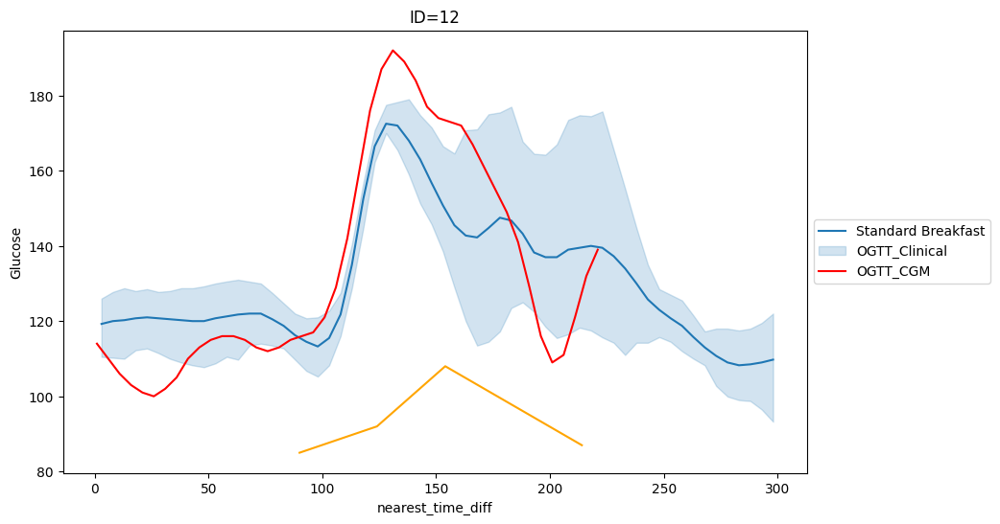

In [258]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ogtt_sub, y="Glucose", x="nearest_time_diff", palette='bright').set(title='ID=12')
sns.lineplot(data=boost_sub, y="Glucose", x="nearest_time_diff", color='red',estimator=None)
sns.lineplot(data=gtt_sub, y="Glucose", x="nearest_time_diff", color='orange')
plt.legend(labels=["Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


[Text(0.5, 1.0, 'ID=12')]

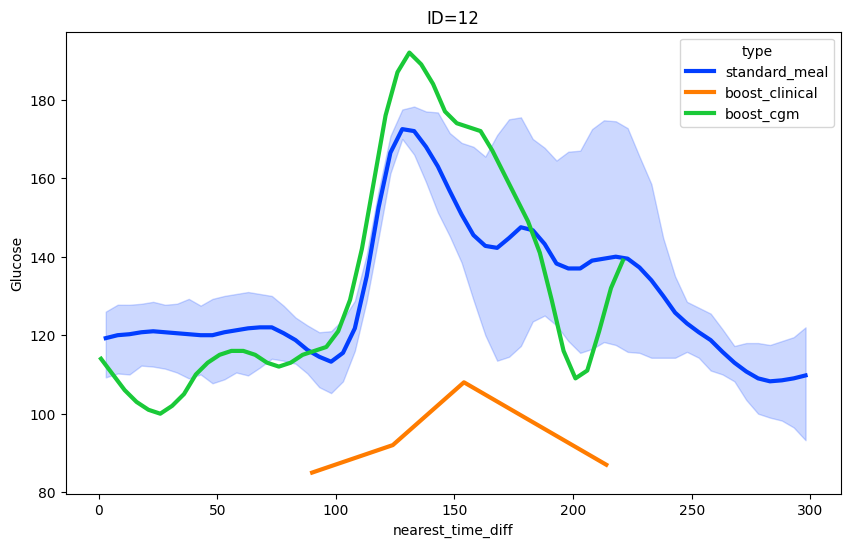

In [259]:
frg_12=food_responses_grouped[food_responses_grouped['id']==12]
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frg_12, y="Glucose", x="nearest_time_diff", palette='bright',hue='type',linewidth=3).set(title='ID=12')

Text(0.5, 1.0, 'ID=12')

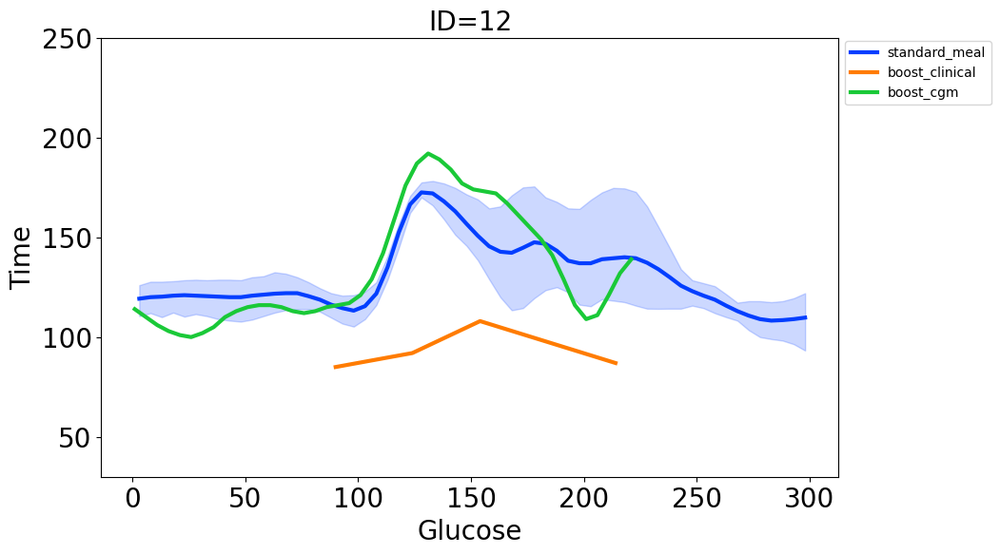

In [260]:
frg_12=food_responses_grouped[food_responses_grouped['id']==12]
plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frg_12, y="Glucose", x="nearest_time_diff", palette='bright',hue='type',linewidth=3).set(title='ID=12')
plt.ylim(30,250)
plt.legend(loc='center left', bbox_to_anchor=(1, .92), ncol=1)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel('Glucose', fontsize=20);
plt.ylabel('Time', fontsize=20);
plt.title('ID=12', fontsize=20)

In [261]:
s = '19-013'

GTT = [87, 96, 65, 84]
GTT_times = ['2020-01-06 9:55:00', '2020-01-06 10:30:00', '2020-01-06 11:00:00', '2020-01-06 12:00:00']
GTT_times = pd.to_datetime(GTT_times, format='%Y-%m-%dT%H:%M:%S')

df_gtt_thirteen = pd.DataFrame({'Glucose': GTT, 'Time': GTT_times})
auc_ogtt_thirteen=calculate_area_under_curve(df_gtt_thirteen)
auc_ogtt_thirteen

10087

In [262]:
cgm_thirteen = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/013/Dexcom_013.csv')
cgm_thirteen['timestamp_dt'] = pd.to_datetime(cgm_thirteen['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_thirteen['Glucose'] = cgm_thirteen['Glucose Value (mg/dL)']
cgm_thirteen['Time'] = pd.to_datetime(cgm_thirteen['Timestamp (YYYY-MM-DDThh:mm:ss)'])

cgm_thirteen = cgm_thirteen.dropna(subset=['timestamp_dt'])
cgm_thirteen['date'] = cgm_thirteen['timestamp_dt'].dt.date
cgm_thirteen

food_thirteen = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/013/Food_Log_013.csv')

food_thirteen['date'] = pd.to_datetime(food_thirteen['date']).dt.date

food_thirteen['time_begin'] = pd.to_datetime(food_thirteen['time_begin'])
# window_dt = pd.Timedelta(minutes=120)
window_dt = pd.Timedelta(minutes=210)

food_thirteen["time_begin_win"] = food_thirteen["time_begin"] + window_dt

merge_food_cgm_thirteen = pd.merge(cgm_thirteen, food_thirteen, left_on=['date'], right_on=['date'])

cf_thirteen = food_thirteen[food_thirteen['Food_Item']=='Frosted Flake']

merge_food_cgm_thirteen = pd.merge(cgm_thirteen, cf_thirteen, left_on=['date'], right_on=['date'])
# window_dt_brkfst = pd.Timedelta(minutes=-30)
window_dt_brkfst = pd.Timedelta(minutes=-90)


food_cgm_thirteen_cf = merge_food_cgm_thirteen[(merge_food_cgm_thirteen['timestamp_dt'] <= merge_food_cgm_thirteen['time_begin_win']) & (merge_food_cgm_thirteen['timestamp_dt'] >= (merge_food_cgm_thirteen['time_begin']+window_dt_brkfst))]

food_cgm_thirteen_cf['pre_glu_time'] = food_cgm_thirteen_cf.groupby('date')['timestamp_dt'].transform('min')

column_names = food_cgm_thirteen_cf.columns.values
food_cgm_thirteen_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_thirteen_cf['date'].unique():
    date_sub = food_cgm_thirteen_cf[food_cgm_thirteen_cf['date'] == i]

    date_sub = date_sub.sort_values(by='timestamp_dt')
    min_glu = date_sub['Glucose Value (mg/dL)'].iloc[0]
    date_sub['min_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

    final_glu = date_sub['Glucose Value (mg/dL)'].iloc[-1]
    date_sub['final_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

    max_glu = date_sub['Glucose Value (mg/dL)'].max()
    date_sub['max_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

    date_sub['meal_auc'] = calculate_area_under_curve(date_sub)
    date_sub['auc_ogtt_thirteen'] = auc_ogtt_thirteen
    j = i - dt.timedelta(days=1)
    cgm_thirteen_ld = cgm_thirteen[cgm_thirteen['date'] == j]

    date_sub['mean_glu_ld'] = cgm_thirteen_ld.groupby('date')['Glucose'].transform('mean').iloc[0]
    date_sub['interdaycv'] = interdaycv(cgm_thirteen_ld)
    date_sub['interdaysd'] = interdaysd(cgm_thirteen_ld)
    date_sub['TIR'] = TIR(cgm_thirteen_ld, sd=1, sr=5)
    date_sub['TOR'] = TOR(cgm_thirteen_ld, sd=1, sr=5)
    date_sub['POR'] = POR(cgm_thirteen_ld, sd=1, sr=5)
    date_sub['PIR'] = PIR(cgm_thirteen_ld, sd=1, sr=5)
    date_sub['MGE'] = MGE(cgm_thirteen_ld, sd=1)
    date_sub['MGN'] = MGN(cgm_thirteen_ld, sd=1)
    # MAGE(cgm_thirteen, std=1)
    date_sub['J_index'] = J_index(cgm_thirteen_ld)
    date_sub['LBGI'] = LBGI(cgm_thirteen_ld)
    date_sub['HBGI'] = HBGI(cgm_thirteen_ld)
    # MODD(cgm_thirteen)
    # CONGA24(cgm_thirteen)
    date_sub['GMI'] = GMI(date_sub)

    food_cgm_thirteen_cf_all_dates = food_cgm_thirteen_cf_all_dates.append(date_sub)

thirteen_ogtt = food_cgm_thirteen_cf_all_dates

thirteen_ogtt_dup = thirteen_ogtt.drop_duplicates(subset=['date'], keep='first')
thirteen_ogtt_dup['id'] = 13
thirteen_ogtt_dup['a1c'] = "PD"



In [263]:
# merge_sub_thirteen.columns

In [264]:
# merge_sub_thirteen.rename(columns={'auc_ogtt_thirteen': 'auc_ogtt'}, inplace=True)

In [265]:
# food_thirteen[food_thirteen['Food_Item']=='Frosted Flake']
# food_thirteen[food_thirteen['Food_Item']=='Boost']

In [266]:
window_dt = pd.Timedelta(minutes=120)
# boost_time=dt.datetime(2020,6,4,9,25,0)
#extend 90 mins before instead of 30
boost_time=dt.datetime(2020,6,4,8,25,0)
# 2020-01-06 9:55:00

# bosst_cgm_thirteen=cgm_thirteen[(cgm_thirteen['timestamp_dt']>=boost_time)&(cgm_thirteen['timestamp_dt']<=boost_time + window_dt)]
bosst_cgm_thirteen=cgm_thirteen[(cgm_thirteen['timestamp_dt']>=boost_time)]

#food_thirteen["time_begin_win"] = food_thirteen["time_begin"] + window_dt

#cgm_thirteen[cgm_thirteen['timestamp_dt']>=dt.datetime(2020,6,4,9,30,0)]

In [267]:
thirteen_ogtt['TimeDiff'] = (thirteen_ogtt['timestamp_dt'] - (thirteen_ogtt['time_begin']+window_dt_brkfst)).dt.total_seconds()/ 60

# Group by and use cumcount
thirteen_ogtt['SequentialTimeValues'] = thirteen_ogtt.groupby('date').cumcount() + 1

df_gtt_thirteen['Time']=pd.to_datetime(df_gtt_thirteen['Time'])

df_gtt_thirteen['TimeDiff'] = (df_gtt_thirteen['Time'] - (df_gtt_thirteen['Time'].min()+window_dt_brkfst)).dt.total_seconds()/ 60

bosst_cgm_thirteen['TimeDiff']=(bosst_cgm_thirteen['timestamp_dt']-boost_time).dt.total_seconds()/ 60


In [268]:
thirteen_ogtt['TimeDiff_Round']=thirteen_ogtt['TimeDiff'].round()
df_gtt_thirteen['TimeDiff_Round']=df_gtt_thirteen['TimeDiff'].round()
bosst_cgm_thirteen['TimeDiff_Round']=bosst_cgm_thirteen['TimeDiff'].round()

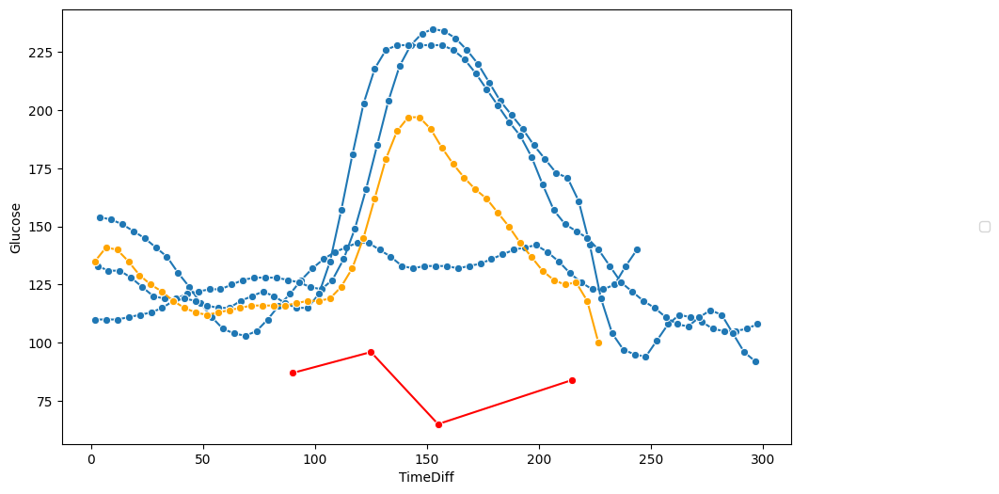

In [269]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=thirteen_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_thirteen, y="Glucose", x="TimeDiff", marker='o',color='red')
sns.lineplot(data=bosst_cgm_thirteen, y="Glucose", x="TimeDiff", marker='o',color='orange')
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)

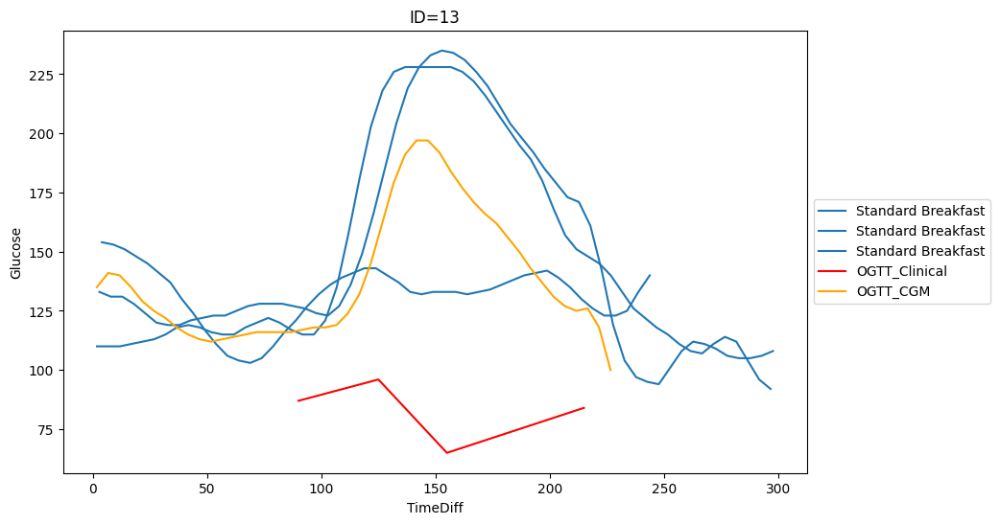

In [270]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=thirteen_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=13')
sns.lineplot(data=df_gtt_thirteen, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=bosst_cgm_thirteen, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

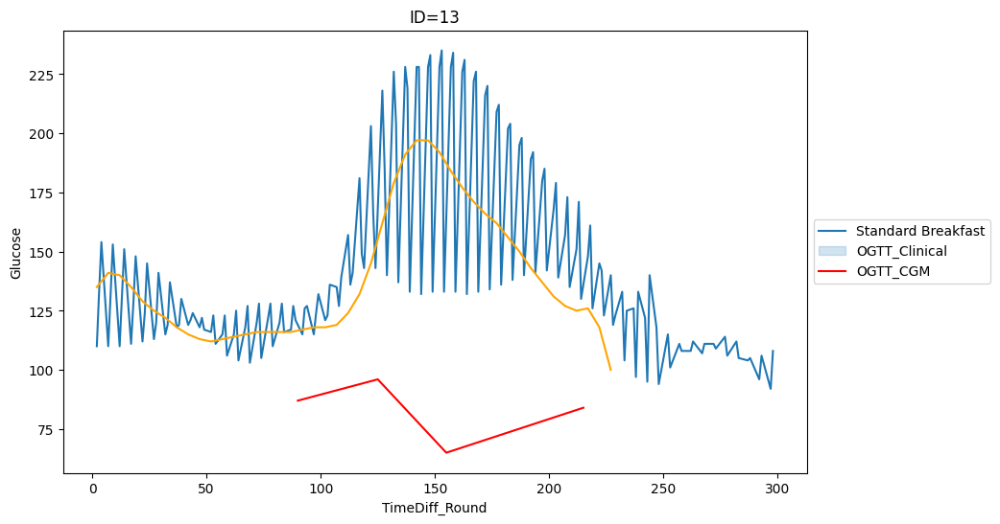

In [271]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=thirteen_ogtt, y="Glucose", x="TimeDiff_Round").set(title='ID=13')
sns.lineplot(data=df_gtt_thirteen, y="Glucose", x="TimeDiff_Round", color='red',estimator=None)
sns.lineplot(data=bosst_cgm_thirteen, y="Glucose", x="TimeDiff_Round", color='orange')
plt.legend(labels=["Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [272]:
max_times=thirteen_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
thirteen_ogtt.groupby('date')['TimeDiff_Round'].nunique()

date
2020-05-29    49
2020-05-31    60
2020-06-02    60
Name: TimeDiff_Round, dtype: int64

In [273]:
# max_times=thirteen_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
# thirteen_ogtt.groupby('date')['TimeDiff_Round'].nunique()

# dates=thirteen_ogtt['date'].unique()
# df_first_date=thirteen_ogtt[thirteen_ogtt['date']==dates[0]]

# # thirteen_ogtt_test=thirteen_ogtt

# column_names = thirteen_ogtt.columns.tolist()

# # Create an empty DataFrame with the same columns
# df_ppgr_grouped_thirteen = pd.DataFrame(columns=column_names)

# for i in dates:
#   df_date=thirteen_ogtt[thirteen_ogtt['date']==i]
#   print(i)
#   # df_date['nearest_time'] = df_first_date['TimeDiff'].apply(find_nearest_value)
#   result_df = find_nearest_value(df_date, df_first_date, 'TimeDiff_Round', 'TimeDiff_Round')
#   df_ppgr_grouped_thirteen=df_ppgr_grouped_thirteen.append(result_df)


In [274]:
# #for grouped
# boost_sub=bosst_cgm_thirteen[['TimeDiff','Glucose','timestamp_dt','date']]
# gtt_sub=df_gtt_thirteen[['TimeDiff','Glucose','Time']]
# gtt_sub['date']=gtt_sub.Time.dt.date
# # ogtt_sub=thirteen_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
# ogtt_sub=df_ppgr_grouped_thirteen[['TimeDiff','Glucose','timestamp_dt','date']]
# boost_sub['id']=13
# gtt_sub['id']=13
# ogtt_sub['id']=13

# boost_sub['type']='boost_cgm'
# gtt_sub['type']='boost_clinical'
# ogtt_sub['type']='standard_meal'

# boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
# ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

# food_responses_grouped=food_responses_grouped.append([ogtt_sub,gtt_sub,boost_sub])
# food_responses_grouped

In [275]:
max_times=thirteen_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
thirteen_ogtt.groupby('date')['TimeDiff_Round'].nunique()

date
2020-05-29    49
2020-05-31    60
2020-06-02    60
Name: TimeDiff_Round, dtype: int64

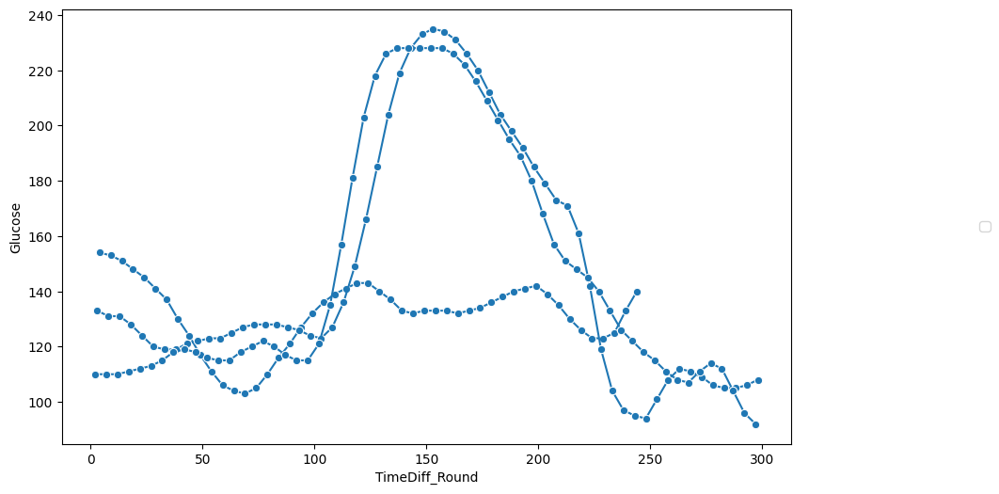

In [276]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=thirteen_ogtt, y="Glucose", x="TimeDiff_Round", palette='bright',units='date',estimator=None, marker='o')
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)

In [277]:
# import seaborn as sns
# plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
# sns.lineplot(data=df_test, y="Glucose", x="nearest_TimeDiff_Round", palette='bright')
# plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)

[Text(0.5, 1.0, 'ID=13')]

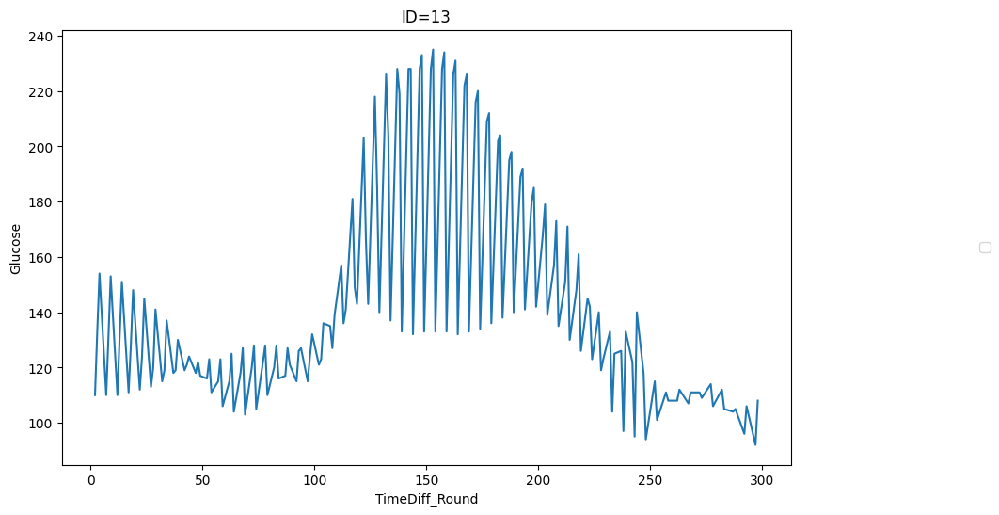

In [278]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=thirteen_ogtt, y="Glucose", x="TimeDiff_Round").set(title='ID=13')
# sns.lineplot(data=df_gtt_thirteen, y="Glucose", x="TimeDiff_Round", color='red',estimator=None)
# sns.lineplot(data=bosst_cgm_thirteen, y="Glucose", x="TimeDiff_Round", color='orange')
# plt.legend(labels=["Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [279]:
boost_sub=bosst_cgm_thirteen[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_thirteen[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
ogtt_sub=thirteen_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
boost_sub['id']=13
gtt_sub['id']=13
ogtt_sub['id']=13

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

food_responses=food_responses.append([ogtt_sub,gtt_sub,boost_sub])
food_responses


,TimeDiff,Glucose,Time,date,id,type
68,3.516667,88.0,2019-09-17 05:43:31,2019-09-17,1,standard_meal
69,8.533333,84.0,2019-09-17 05:48:32,2019-09-17,1,standard_meal
70,13.516667,81.0,2019-09-17 05:53:31,2019-09-17,1,standard_meal
71,18.516667,81.0,2019-09-17 05:58:31,2019-09-17,1,standard_meal
72,23.533333,83.0,2019-09-17 06:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
1985,206.666667,127.0,2020-06-04 11:51:40,2020-06-04,13,boost_cgm
1986,211.666667,125.0,2020-06-04 11:56:40,2020-06-04,13,boost_cgm
1987,216.650000,126.0,2020-06-04 12:01:39,2020-06-04,13,boost_cgm
1988,221.650000,118.0,2020-06-04 12:06:39,2020-06-04,13,boost_cgm


[Text(0.5, 1.0, 'ID=13')]

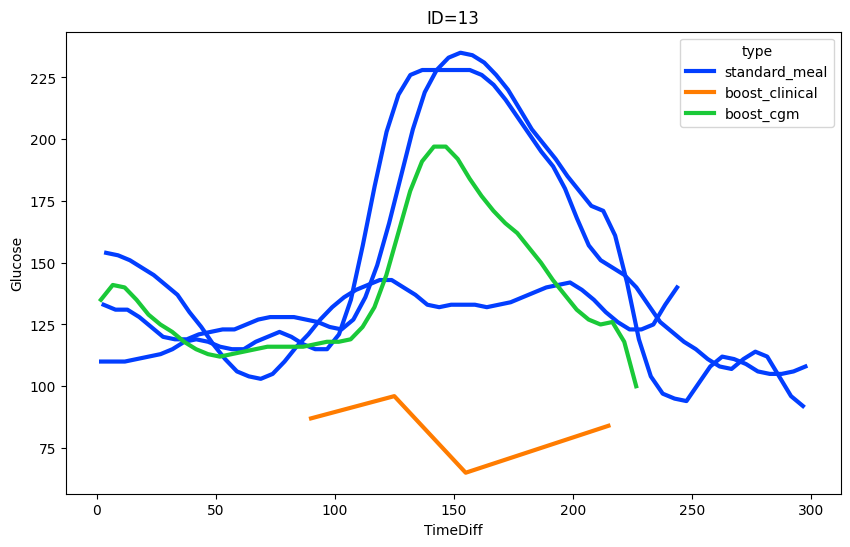

In [280]:
frng_13=food_responses[food_responses['id']==13]
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frng_13, y="Glucose", x="TimeDiff", palette='bright',hue='type',linewidth=3,units='date',estimator=None).set(title='ID=13')

Text(0.5, 1.0, 'ID=13')

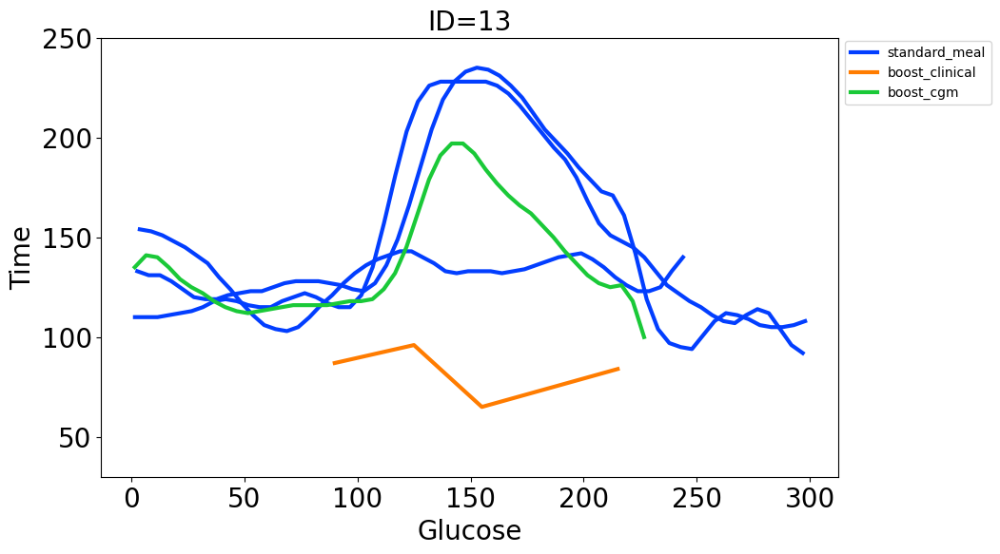

In [281]:
frng_13=food_responses[food_responses['id']==13]
plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frng_13, y="Glucose", x="TimeDiff", palette='bright',hue='type',linewidth=3,units='date',estimator=None).set(title='ID=13')
plt.ylim(30,250)
plt.legend(loc='center left', bbox_to_anchor=(1, .92), ncol=1)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel('Glucose', fontsize=20);
plt.ylabel('Time', fontsize=20);
plt.title('ID=13', fontsize=20)

In [282]:
max_times=thirteen_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
thirteen_ogtt.groupby('date')['TimeDiff_Round'].nunique()

dates=thirteen_ogtt['date'].unique()
df_first_date=thirteen_ogtt[thirteen_ogtt['date']==dates[0]]

# thirteen_ogtt_test=thirteen_ogtt

column_names = thirteen_ogtt.columns.tolist()

# Create an empty DataFrame with the same columns
df_ppgr_grouped_thirteen = pd.DataFrame(columns=column_names)

for i in dates:
  df_date=thirteen_ogtt[thirteen_ogtt['date']==i]
  print(i)
  # df_date['nearest_time'] = df_first_date['TimeDiff'].apply(find_nearest_value)
  result_df = find_nearest_value(df_date, df_first_date, 'TimeDiff_Round', 'TimeDiff_Round')
  df_ppgr_grouped_thirteen=df_ppgr_grouped_thirteen.append(result_df)


# For grouped
boost_sub=bosst_cgm_thirteen[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_thirteen[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
# ogtt_sub=thirteen_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
ogtt_sub=df_ppgr_grouped_thirteen[['nearest_TimeDiff_Round','Glucose','timestamp_dt','date']]
boost_sub['id']=13
gtt_sub['id']=13
ogtt_sub['id']=13

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

ogtt_sub.rename(columns={"nearest_TimeDiff_Round": "nearest_time_diff"},inplace=True)
boost_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)
gtt_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)


food_responses_grouped=food_responses_grouped.append([ogtt_sub,gtt_sub,boost_sub])
food_responses_grouped


2020-05-29
2020-05-31
2020-06-02


,nearest_time_diff,Glucose,Time,date,id,type
68,4.000000,88.0,2019-09-17 05:43:31,2019-09-17,1,standard_meal
69,9.000000,84.0,2019-09-17 05:48:32,2019-09-17,1,standard_meal
70,14.000000,81.0,2019-09-17 05:53:31,2019-09-17,1,standard_meal
71,19.000000,81.0,2019-09-17 05:58:31,2019-09-17,1,standard_meal
72,24.000000,83.0,2019-09-17 06:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
1985,206.666667,127.0,2020-06-04 11:51:40,2020-06-04,13,boost_cgm
1986,211.666667,125.0,2020-06-04 11:56:40,2020-06-04,13,boost_cgm
1987,216.650000,126.0,2020-06-04 12:01:39,2020-06-04,13,boost_cgm
1988,221.650000,118.0,2020-06-04 12:06:39,2020-06-04,13,boost_cgm


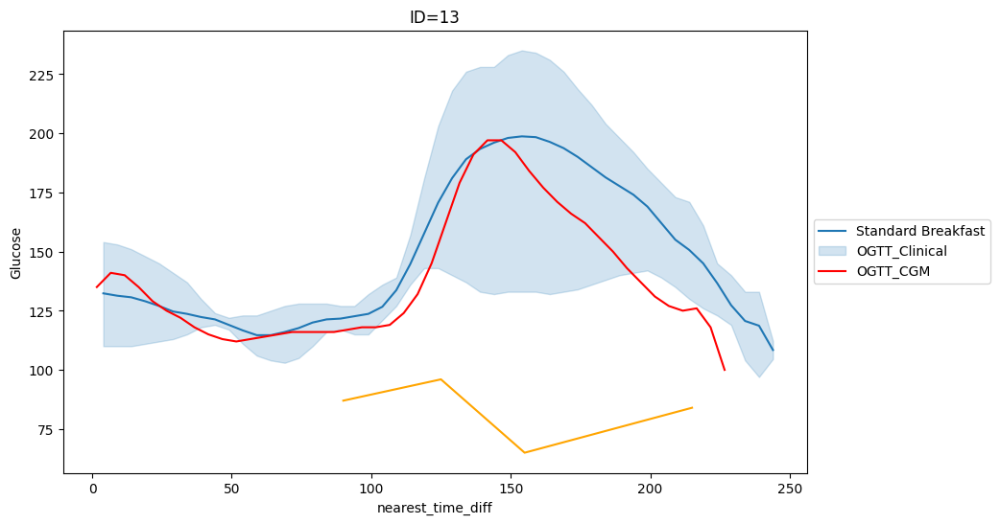

In [283]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ogtt_sub, y="Glucose", x="nearest_time_diff").set(title='ID=13')
sns.lineplot(data=boost_sub, y="Glucose", x="nearest_time_diff", color='red',estimator=None)
sns.lineplot(data=gtt_sub, y="Glucose", x="nearest_time_diff", color='orange')
plt.legend(labels=["Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

[Text(0.5, 1.0, 'ID=13')]

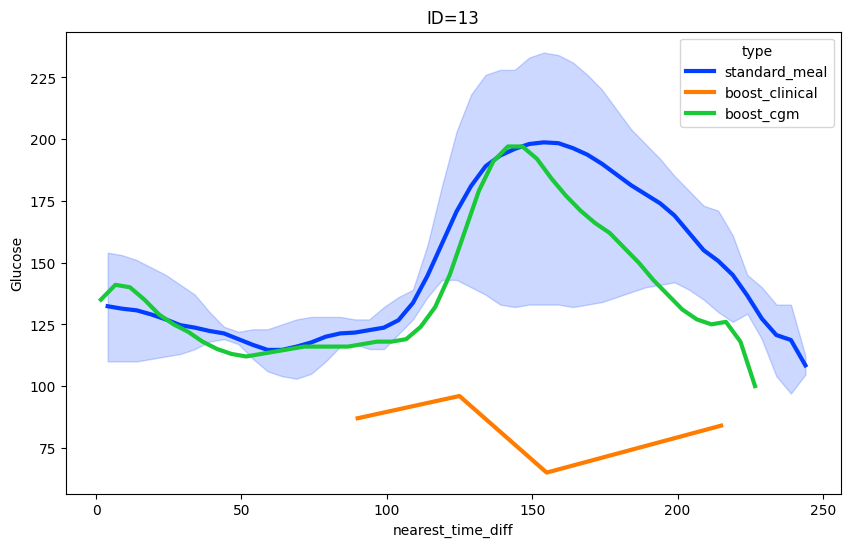

In [284]:
frg_13=food_responses_grouped[food_responses_grouped['id']==13]
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frg_13, y="Glucose", x="nearest_time_diff", palette='bright',hue='type',linewidth=3).set(title='ID=13')

Text(0.5, 1.0, 'ID=13')

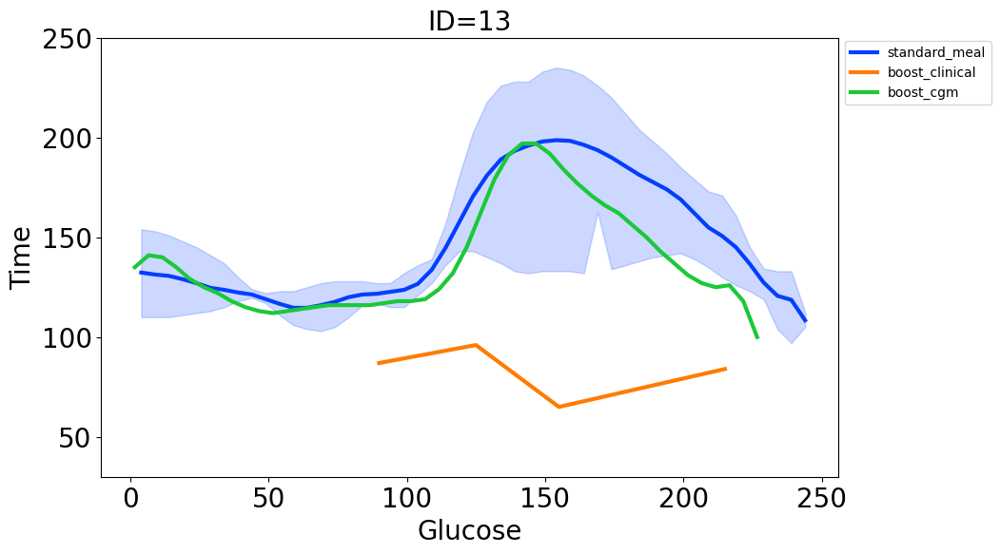

In [285]:
frg_13=food_responses_grouped[food_responses_grouped['id']==13]
plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frg_13, y="Glucose", x="nearest_time_diff", palette='bright',hue='type',linewidth=3).set(title='ID=13')
plt.ylim(30,250)
plt.legend(loc='center left', bbox_to_anchor=(1, .92), ncol=1)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel('Glucose', fontsize=20);
plt.ylabel('Time', fontsize=20);
plt.title('ID=13', fontsize=20)

In [286]:
# import seaborn as sns
# plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
# sns.lineplot(data=df_gtt_one, y="Glucose", x="TimeDiff", color='red',estimator=None).set(title='Clinic OGTT')
# sns.lineplot(data=df_gtt_two, y="Glucose", x="TimeDiff", color='olive',estimator=None)
# sns.lineplot(data=df_gtt_three, y="Glucose", x="TimeDiff", color='limegreen',estimator=None)
# sns.lineplot(data=df_gtt_four, y="Glucose", x="TimeDiff", color='coral',estimator=None)
# sns.lineplot(data=df_gtt_five, y="Glucose", x="TimeDiff", color='violet',estimator=None)
# sns.lineplot(data=df_gtt_six, y="Glucose", x="TimeDiff", color='cornflowerblue',estimator=None)
# sns.lineplot(data=df_gtt_seven, y="Glucose", x="TimeDiff", color='blue',estimator=None)
# sns.lineplot(data=df_gtt_eight, y="Glucose", x="TimeDiff", color='teal',estimator=None)
# sns.lineplot(data=df_gtt_nine, y="Glucose", x="TimeDiff", color='maroon',estimator=None)
# sns.lineplot(data=df_gtt_ten, y="Glucose", x="TimeDiff", color='cyan',estimator=None)
# sns.lineplot(data=df_gtt_eleven, y="Glucose", x="TimeDiff", color='peru',estimator=None)
# sns.lineplot(data=df_gtt_twelve, y="Glucose", x="TimeDiff", color='deeppink',estimator=None)
# sns.lineplot(data=df_gtt_thirteen, y="Glucose", x="TimeDiff", color='green',estimator=None)
# sns.lineplot(data=df_gtt_fourteen, y="Glucose", x="TimeDiff", color='orange',estimator=None)
# plt.legend(labels=["One","Two","Three","Four","Five","Six","Seven","Eight","Nine","Ten","Eleven","Twelve","Thirteen","Fourteen"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [287]:
s = '19-014'

GTT = [91, 68, 75, 56]
GTT_times = ['2020-01-15 9:47:00', '2020-01-15 10:20:00', '2020-01-15 10:50:00', '2020-01-15 11:50:00']
GTT_times = pd.to_datetime(GTT_times, format='%Y-%m-%dT%H:%M:%S')

df_gtt_fourteen = pd.DataFrame({'Glucose': GTT, 'Time': GTT_times})

df_gtt_fourteen['Time']=pd.to_datetime(df_gtt_fourteen['Time'])
auc_ogtt_fourteen=calculate_area_under_curve(df_gtt_fourteen)
auc_ogtt_fourteen

8698

In [288]:
# df_gtt_fourteen['Time']=pd.to_datetime(df_gtt_fourteen['Time'])
# df_gtt_fourteen['TimeDiff'] = (df_gtt_fourteen['Time'] - df_gtt_fourteen['Time'].min()).dt.total_seconds()/ 60

In [289]:
cgm_fourteen = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/014/Dexcom_014.csv')
cgm_fourteen['timestamp_dt'] = pd.to_datetime(cgm_fourteen['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_fourteen['Glucose'] = cgm_fourteen['Glucose Value (mg/dL)']
cgm_fourteen['Time'] = pd.to_datetime(cgm_fourteen['Timestamp (YYYY-MM-DDThh:mm:ss)'])

cgm_fourteen = cgm_fourteen.dropna(subset=['timestamp_dt'])
cgm_fourteen['date'] = cgm_fourteen['timestamp_dt'].dt.date

food_fourteen = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/014/Food_Log_014.csv')
food_fourteen['date'] = pd.to_datetime(food_fourteen['date']).dt.date
food_fourteen['time_begin'] = pd.to_datetime(food_fourteen['time_begin'])
# window_dt = pd.Timedelta(minutes=120)
#extend to 1 hour
window_dt = pd.Timedelta(minutes=210)
food_fourteen["time_begin_win"] = food_fourteen["time_begin"] + window_dt

merge_food_cgm_fourteen = pd.merge(cgm_fourteen, food_fourteen, left_on=['date'], right_on=['date'])

cf_fourteen = food_fourteen[food_fourteen['logged_food']=='Standard Breakfast']

merge_food_cgm_fourteen = pd.merge(cgm_fourteen, cf_fourteen, left_on=['date'], right_on=['date'])
# window_dt_brkfst=pd.Timedelta(minutes=-30)
window_dt_brkfst=pd.Timedelta(minutes=-90)

food_cgm_fourteen_cf = merge_food_cgm_fourteen[(merge_food_cgm_fourteen['timestamp_dt'] <= merge_food_cgm_fourteen['time_begin_win']) & (merge_food_cgm_fourteen['timestamp_dt'] >= (merge_food_cgm_fourteen['time_begin']+window_dt_brkfst))]

food_cgm_fourteen_cf['pre_glu_time'] = food_cgm_fourteen_cf.groupby('date')['timestamp_dt'].transform('min')

column_names = food_cgm_fourteen_cf.columns.values
food_cgm_fourteen_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_fourteen_cf['date'].unique():
    date_sub = food_cgm_fourteen_cf[food_cgm_fourteen_cf['date'] == i]

    date_sub = date_sub.sort_values(by='timestamp_dt')
    min_glu = date_sub['Glucose Value (mg/dL)'].iloc[0]
    date_sub['min_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

    final_glu = date_sub['Glucose Value (mg/dL)'].iloc[-1]
    date_sub['final_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

    max_glu = date_sub['Glucose Value (mg/dL)'].max()
    date_sub['max_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

    # date_sub['meal_auc'] = calculate_area_under_curve(date_sub)
    # date_sub['auc_ogtt_fourteen'] = auc_ogtt_fourteen
    # j = i - dt.timedelta(days=1)
    # cgm_fourteen_ld = cgm_fourteen[cgm_fourteen['date'] == j]

    # date_sub['mean_glu_ld'] = cgm_fourteen_ld.groupby('date')['Glucose'].transform('mean').iloc[0]
    # date_sub['interdaycv'] = interdaycv(cgm_fourteen_ld)
    # date_sub['interdaysd'] = interdaysd(cgm_fourteen_ld)
    # date_sub['TIR'] = TIR(cgm_fourteen_ld, sd=1, sr=5)
    # date_sub['TOR'] = TOR(cgm_fourteen_ld, sd=1, sr=5)
    # date_sub['POR'] = POR(cgm_fourteen_ld, sd=1, sr=5)
    # date_sub['PIR'] = PIR(cgm_fourteen_ld, sd=1, sr=5)
    # date_sub['MGE'] = MGE(cgm_fourteen_ld, sd=1)
    # date_sub['MGN'] = MGN(cgm_fourteen_ld, sd=1)
    # # MAGE(cgm_fourteen, std=1)
    # date_sub['J_index'] = J_index(cgm_fourteen_ld)
    # date_sub['LBGI'] = LBGI(cgm_fourteen_ld)
    # date_sub['HBGI'] = HBGI(cgm_fourteen_ld)
    # # MODD(cgm_fourteen)
    # # CONGA24(cgm_fourteen)
    # date_sub['GMI'] = GMI(date_sub)

    food_cgm_fourteen_cf_all_dates = food_cgm_fourteen_cf_all_dates.append(date_sub)

fourteen_ogtt = food_cgm_fourteen_cf_all_dates

fourteen_ogtt_dup = fourteen_ogtt.drop_duplicates(subset=['date'], keep='first')
fourteen_ogtt_dup['id'] = 14
fourteen_ogtt_dup['a1c'] = "norm"


In [290]:
food_fourteen[food_fourteen['logged_food']=='Standard Breakfast']

,date,time,time_begin,time_end,logged_food,amount,unit,searched_food,calorie,total_carb,dietary_fiber,sugar,protein,total_fat,time_begin_win
8,2020-06-06,06:10:00,2020-06-06 06:10:00,06:15:00,Standard Breakfast,NaN,NaN,NaN,280,56.5,1.0,24.0,8.0,2.5,2020-06-06 09:40:00
28,2020-06-08,06:10:00,2020-06-08 06:10:00,06:15:00,Standard Breakfast,NaN,NaN,NaN,280,56.5,1.0,24.0,8.0,2.5,2020-06-08 09:40:00
51,2020-06-10,06:15:00,2020-06-10 06:15:00,06:25:00,Standard Breakfast,NaN,NaN,NaN,280,56.5,1.0,24.0,8.0,2.5,2020-06-10 09:45:00
73,2020-06-12,06:05:00,2020-06-12 06:05:00,06:10:00,Standard Breakfast,NaN,NaN,NaN,280,56.5,1.0,24.0,8.0,2.5,2020-06-12 09:35:00


In [291]:
food_fourteen[food_fourteen['logged_food']=='Boost']

,date,time,time_begin,time_end,logged_food,amount,unit,searched_food,calorie,total_carb,dietary_fiber,sugar,protein,total_fat,time_begin_win
87,2020-06-13,09:30:00,2020-06-13 09:30:00,NaN,Boost,NaN,NaN,NaN,654,82.0,5.6,40.0,26.0,26.0,2020-06-13 13:00:00


In [292]:
window_dt = pd.Timedelta(minutes=120)
# boost_time=dt.datetime(2020,6,13,9,17,0)
#extend 1.5 hours before
boost_time=dt.datetime(2020,6,13,8,17,0)
#9:34:00
#8:53:00
# 2020-01-15 9:47:00

# boost_cgm_fourteen=cgm_fourteen[(cgm_fourteen['timestamp_dt']>=boost_time)&(cgm_fourteen['timestamp_dt']<=boost_time + window_dt)]
boost_cgm_fourteen=cgm_fourteen[(cgm_fourteen['timestamp_dt']>=boost_time)]
boost_cgm_fourteen.head(4)

,Index,Timestamp (YYYY-MM-DDThh:mm:ss),Event Type,Event Subtype,Patient Info,Device Info,Source Device ID,Glucose Value (mg/dL),Insulin Value (u),Carb Value (grams),Duration (hh:mm:ss),Glucose Rate of Change (mg/dL/min),Transmitter Time (Long Integer),timestamp_dt,Glucose,Time,date
2219,2220,2020-06-13 08:17:55,EGV,NaN,NaN,NaN,Android G6,104.0,NaN,NaN,NaN,NaN,669885.0,2020-06-13 08:17:55,104.0,2020-06-13 08:17:55,2020-06-13
2220,2221,2020-06-13 08:22:56,EGV,NaN,NaN,NaN,Android G6,104.0,NaN,NaN,NaN,NaN,670185.0,2020-06-13 08:22:56,104.0,2020-06-13 08:22:56,2020-06-13
2221,2222,2020-06-13 08:27:56,EGV,NaN,NaN,NaN,Android G6,104.0,NaN,NaN,NaN,NaN,670485.0,2020-06-13 08:27:56,104.0,2020-06-13 08:27:56,2020-06-13
2222,2223,2020-06-13 08:32:56,EGV,NaN,NaN,NaN,Android G6,103.0,NaN,NaN,NaN,NaN,670785.0,2020-06-13 08:32:56,103.0,2020-06-13 08:32:56,2020-06-13


In [293]:

fourteen_ogtt['TimeDiff'] = (fourteen_ogtt['timestamp_dt'] - (fourteen_ogtt['time_begin']+window_dt_brkfst)).dt.total_seconds()/ 60

# Group by and use cumcount
fourteen_ogtt['SequentialTimeValues'] = fourteen_ogtt.groupby('date').cumcount() + 1

df_gtt_fourteen['Time']=pd.to_datetime(df_gtt_fourteen['Time'])

df_gtt_fourteen['TimeDiff'] = (df_gtt_fourteen['Time'] - (df_gtt_fourteen['Time'].min()+window_dt_brkfst)).dt.total_seconds()/ 60

boost_cgm_fourteen['TimeDiff'] = (boost_cgm_fourteen['timestamp_dt'] - boost_time).dt.total_seconds()/ 60

In [294]:
fourteen_ogtt['TimeDiff_Round']=fourteen_ogtt['TimeDiff'].round()

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

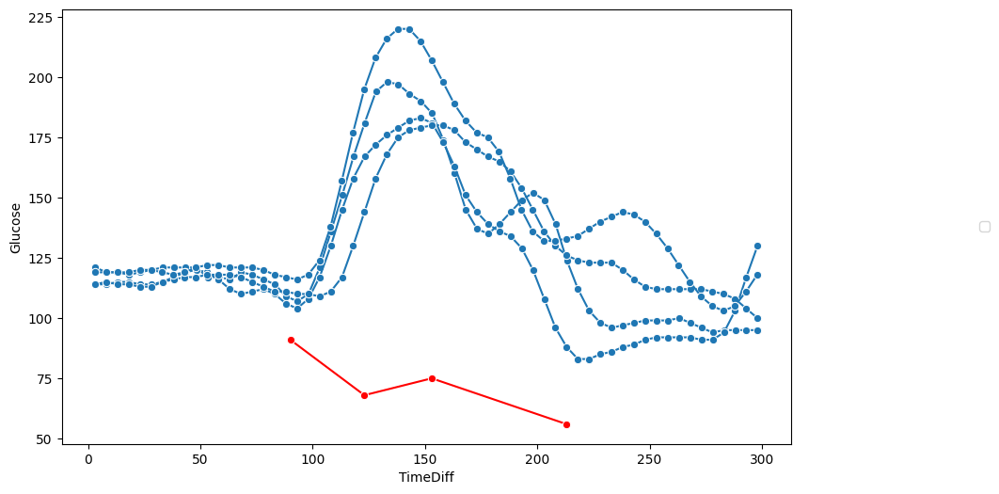

In [295]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=fourteen_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_fourteen, y="Glucose", x="TimeDiff", marker='o',color='red')


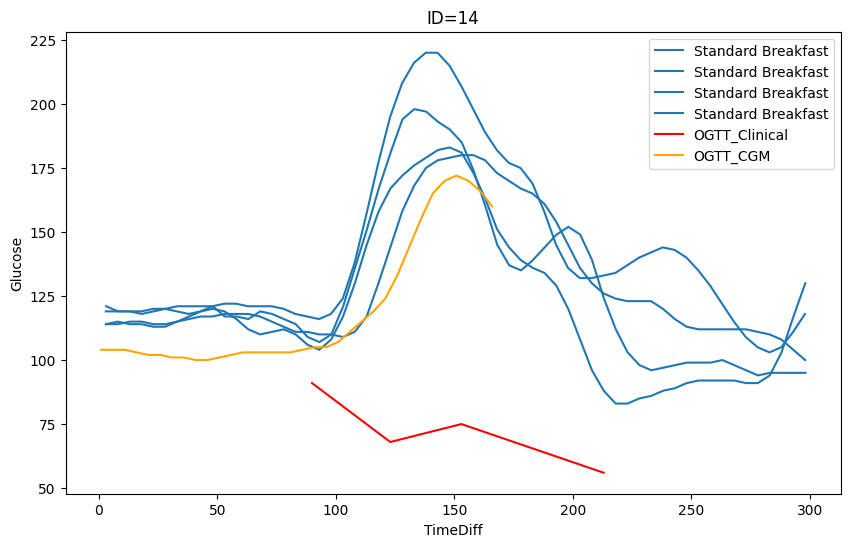

In [296]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=fourteen_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=14')
sns.lineplot(data=df_gtt_fourteen, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_fourteen, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"])


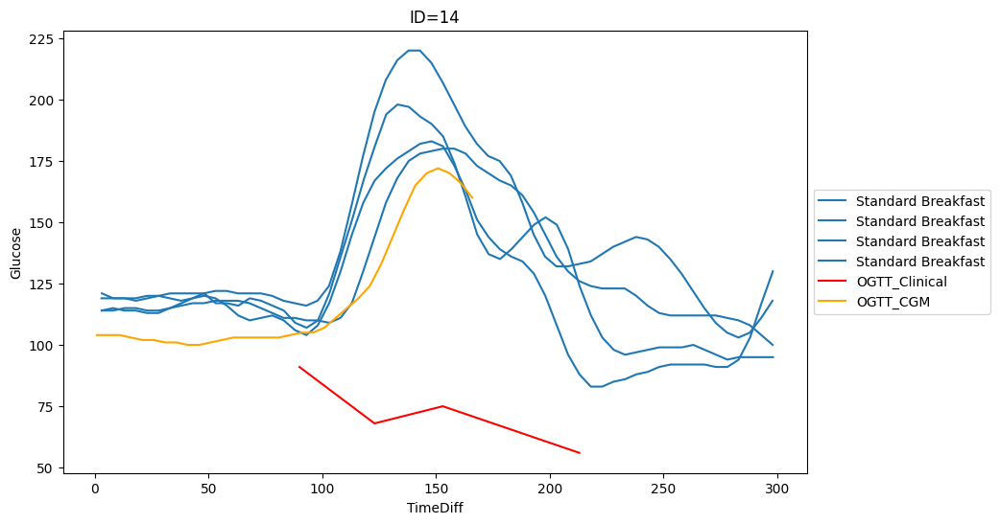

In [297]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=fourteen_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=14')
sns.lineplot(data=df_gtt_fourteen, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_fourteen, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


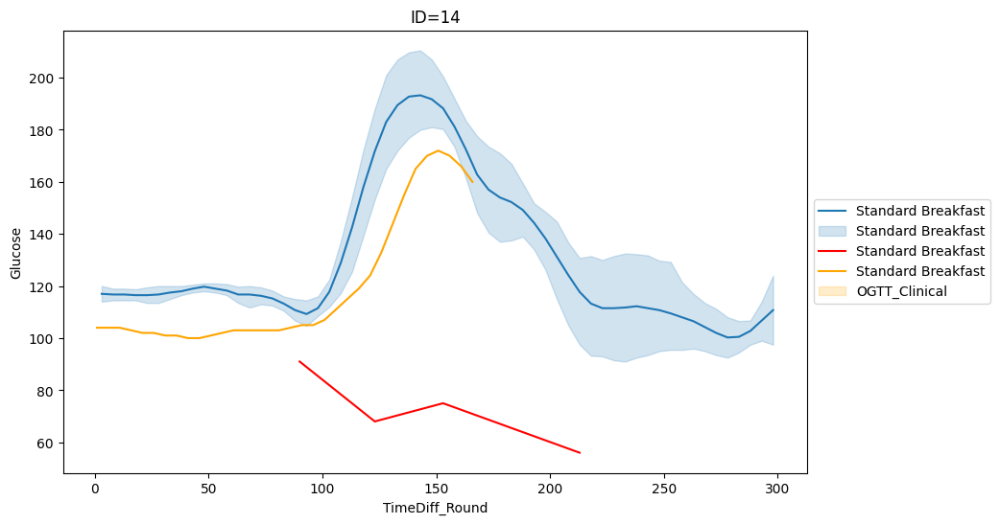

In [298]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=fourteen_ogtt, y="Glucose", x="TimeDiff_Round", palette='bright').set(title='ID=14')
sns.lineplot(data=df_gtt_fourteen, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_fourteen, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


In [299]:
boost_sub=boost_cgm_fourteen[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_fourteen[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
ogtt_sub=fourteen_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
boost_sub['id']=14
gtt_sub['id']=14
ogtt_sub['id']=14

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

food_responses=food_responses.append([ogtt_sub,gtt_sub,boost_sub])
food_responses


,TimeDiff,Glucose,Time,date,id,type
68,3.516667,88.0,2019-09-17 05:43:31,2019-09-17,1,standard_meal
69,8.533333,84.0,2019-09-17 05:48:32,2019-09-17,1,standard_meal
70,13.516667,81.0,2019-09-17 05:53:31,2019-09-17,1,standard_meal
71,18.516667,81.0,2019-09-17 05:58:31,2019-09-17,1,standard_meal
72,23.533333,83.0,2019-09-17 06:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2248,145.933333,170.0,2020-06-13 10:42:56,2020-06-13,14,boost_cgm
2249,150.916667,172.0,2020-06-13 10:47:55,2020-06-13,14,boost_cgm
2250,155.933333,170.0,2020-06-13 10:52:56,2020-06-13,14,boost_cgm
2251,160.916667,166.0,2020-06-13 10:57:55,2020-06-13,14,boost_cgm


[Text(0.5, 1.0, 'ID=14')]

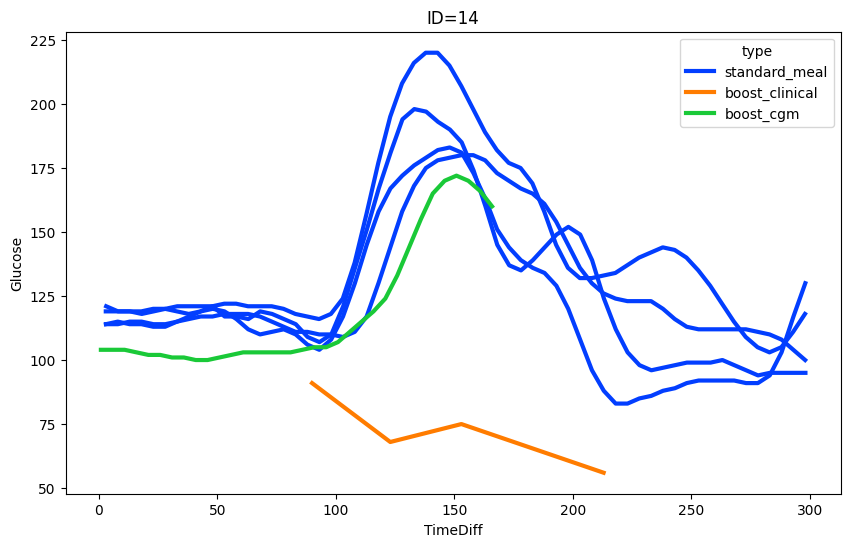

In [300]:
frng_14=food_responses[food_responses['id']==14]
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frng_14, y="Glucose", x="TimeDiff", palette='bright',hue='type',linewidth=3,units='date',estimator=None).set(title='ID=14')

Text(0.5, 1.0, 'ID=14')

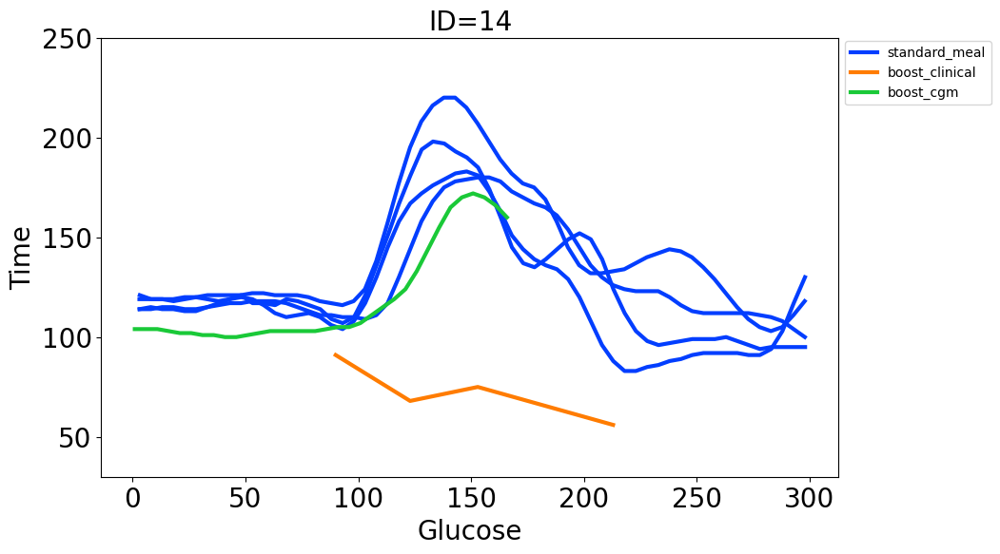

In [301]:
frng_14=food_responses[food_responses['id']==14]
plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frng_14, y="Glucose", x="TimeDiff", palette='bright',hue='type',linewidth=3,units='date',estimator=None).set(title='ID=14')
plt.ylim(30,250)
plt.legend(loc='center left', bbox_to_anchor=(1, .92), ncol=1)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel('Glucose', fontsize=20);
plt.ylabel('Time', fontsize=20);
plt.title('ID=14', fontsize=20)

In [302]:
max_times=fourteen_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
fourteen_ogtt.groupby('date')['TimeDiff_Round'].nunique()

date
2020-06-06    61
2020-06-08    60
2020-06-10    60
2020-06-12    60
Name: TimeDiff_Round, dtype: int64

In [303]:
max_times=fourteen_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
fourteen_ogtt.groupby('date')['TimeDiff_Round'].nunique()

dates=fourteen_ogtt['date'].unique()
df_first_date=fourteen_ogtt[fourteen_ogtt['date']==dates[0]]

# fourteen_ogtt_test=fourteen_ogtt

column_names = fourteen_ogtt.columns.tolist()

# Create an empty DataFrame with the same columns
df_ppgr_grouped_fourteen = pd.DataFrame(columns=column_names)

for i in dates:
  df_date=fourteen_ogtt[fourteen_ogtt['date']==i]
  print(i)
  # df_date['nearest_time'] = df_first_date['TimeDiff'].apply(find_nearest_value)
  result_df = find_nearest_value(df_date, df_first_date, 'TimeDiff_Round', 'TimeDiff_Round')
  df_ppgr_grouped_fourteen=df_ppgr_grouped_fourteen.append(result_df)


# For grouped
boost_sub=boost_cgm_fourteen[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_fourteen[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
# ogtt_sub=fourteen_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
ogtt_sub=df_ppgr_grouped_fourteen[['nearest_TimeDiff_Round','Glucose','timestamp_dt','date']]
boost_sub['id']=14
gtt_sub['id']=14
ogtt_sub['id']=14

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

ogtt_sub.rename(columns={"nearest_TimeDiff_Round": "nearest_time_diff"},inplace=True)
boost_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)
gtt_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)


food_responses_grouped=food_responses_grouped.append([ogtt_sub,gtt_sub,boost_sub])
food_responses_grouped


2020-06-06
2020-06-08
2020-06-10
2020-06-12


,nearest_time_diff,Glucose,Time,date,id,type
68,4.000000,88.0,2019-09-17 05:43:31,2019-09-17,1,standard_meal
69,9.000000,84.0,2019-09-17 05:48:32,2019-09-17,1,standard_meal
70,14.000000,81.0,2019-09-17 05:53:31,2019-09-17,1,standard_meal
71,19.000000,81.0,2019-09-17 05:58:31,2019-09-17,1,standard_meal
72,24.000000,83.0,2019-09-17 06:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2248,145.933333,170.0,2020-06-13 10:42:56,2020-06-13,14,boost_cgm
2249,150.916667,172.0,2020-06-13 10:47:55,2020-06-13,14,boost_cgm
2250,155.933333,170.0,2020-06-13 10:52:56,2020-06-13,14,boost_cgm
2251,160.916667,166.0,2020-06-13 10:57:55,2020-06-13,14,boost_cgm


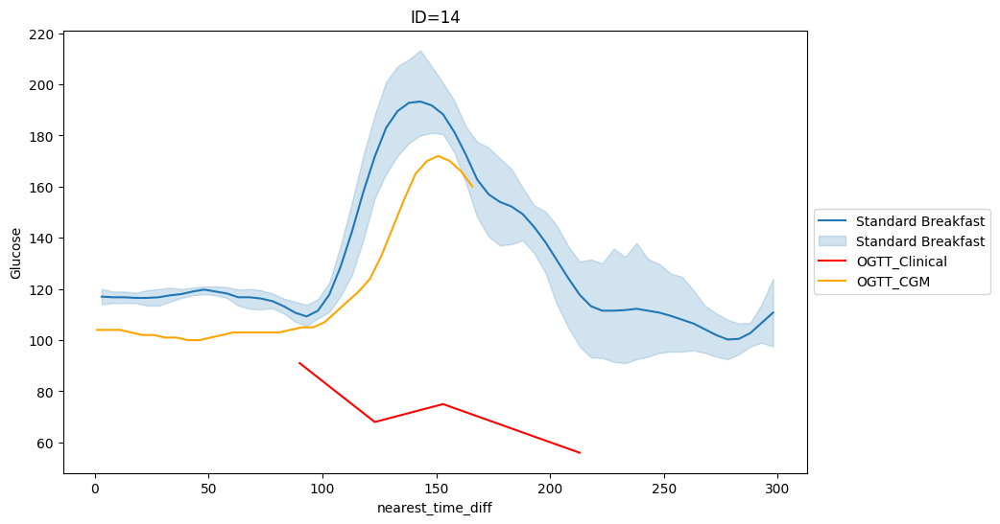

In [304]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ogtt_sub, y="Glucose", x="nearest_time_diff", palette='bright').set(title='ID=14')
sns.lineplot(data=gtt_sub, y="Glucose", x="nearest_time_diff", color='red',estimator=None)
sns.lineplot(data=boost_sub, y="Glucose", x="nearest_time_diff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


[Text(0.5, 1.0, 'ID=14')]

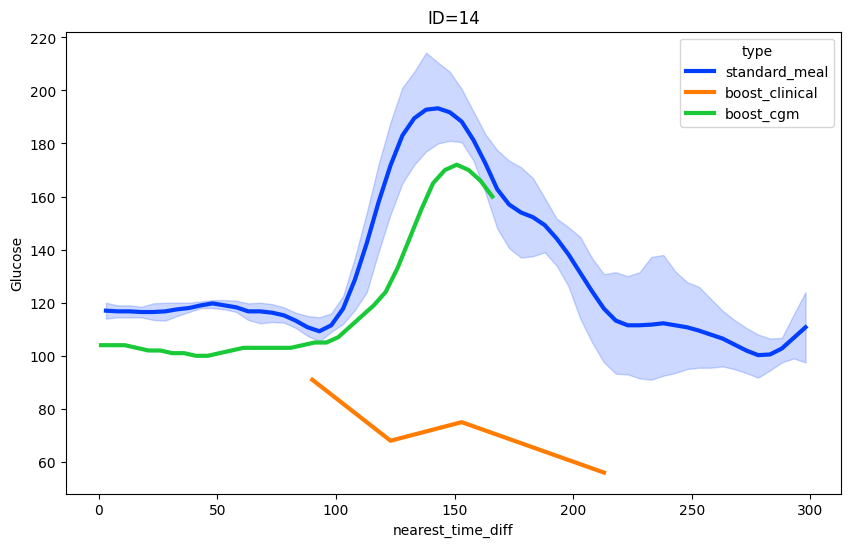

In [305]:
frg_14=food_responses_grouped[food_responses_grouped['id']==14]
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frg_14, y="Glucose", x="nearest_time_diff", palette='bright',hue='type',linewidth=3).set(title='ID=14')

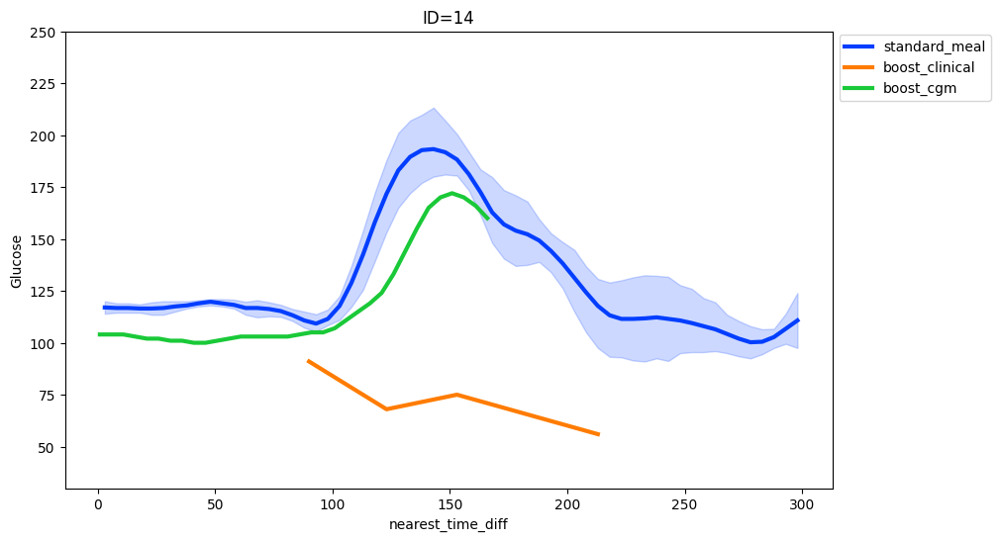

In [306]:
frg_14=food_responses_grouped[food_responses_grouped['id']==14]
plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frg_14, y="Glucose", x="nearest_time_diff", palette='bright',hue='type',linewidth=3).set(title='ID=14')
plt.ylim(30,250)
plt.legend(loc='center left', bbox_to_anchor=(1, .92), ncol=1)

Text(0.5, 1.0, 'ID=14')

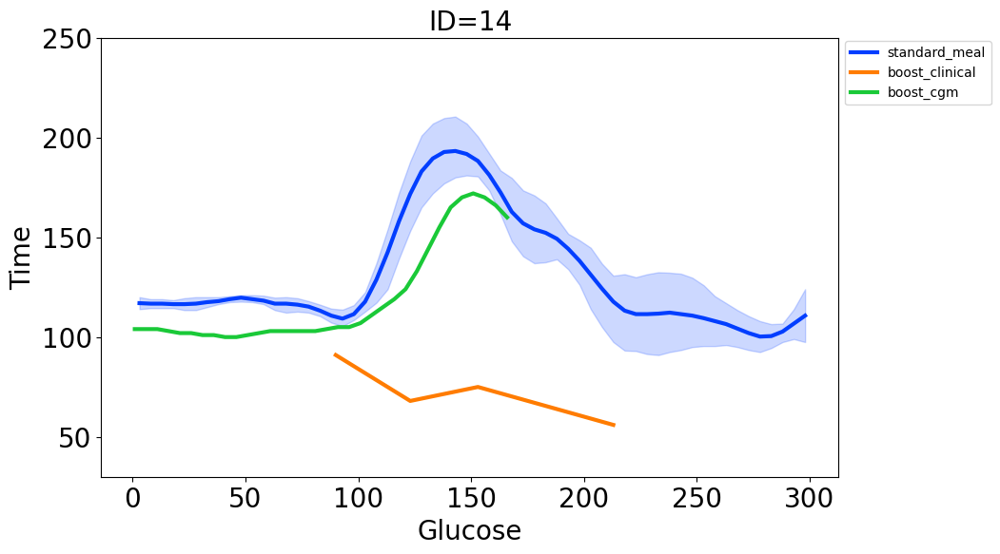

In [307]:
frg_14=food_responses_grouped[food_responses_grouped['id']==14]
plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
sns.lineplot(data=frg_14, y="Glucose", x="nearest_time_diff", palette='bright',hue='type',linewidth=3).set(title='ID=14')
plt.ylim(30,250)
plt.legend(loc='center left', bbox_to_anchor=(1, .92), ncol=1)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel('Glucose', fontsize=20);
plt.ylabel('Time', fontsize=20);
plt.title('ID=14', fontsize=20)

In [308]:
food_responses.columns

Index(['TimeDiff', 'Glucose', 'Time', 'date', 'id', 'type'], dtype='object')

In [309]:
food_responses.Glucose.max()

237.0

In [310]:
food_responses.Glucose.min()

46.0

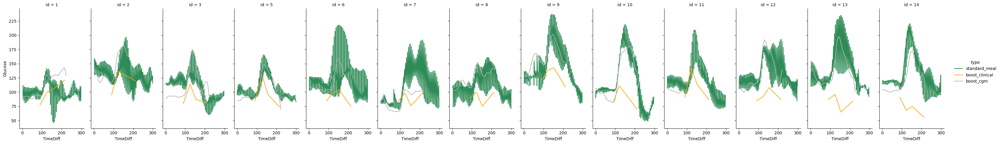

In [311]:
pal = dict(standard_meal="seagreen", boost_cgm=".7", boost_clinical="orange")
# g = sns.FacetGrid(food_responses, col="id", hue="type", palette=pal, height=6, col_wrap=4, aspect=1)
g = sns.FacetGrid(food_responses, col="id", hue="type", palette=pal, height=5, aspect=.5)
g.map(sns.lineplot, "TimeDiff", "Glucose",estimator='mean',err_style='band')
# g.set(xticks=[10, 30, 50], yticks=[2, 6, 10])
# plt.figure(figsize=(10,6))
# g.ax.set_xlabel("Time",fontsize=30)
# g.ax.set_ylabel("Glucose",fontsize=20)
# g.ax.tick_params(labelsize=15)
g.add_legend()

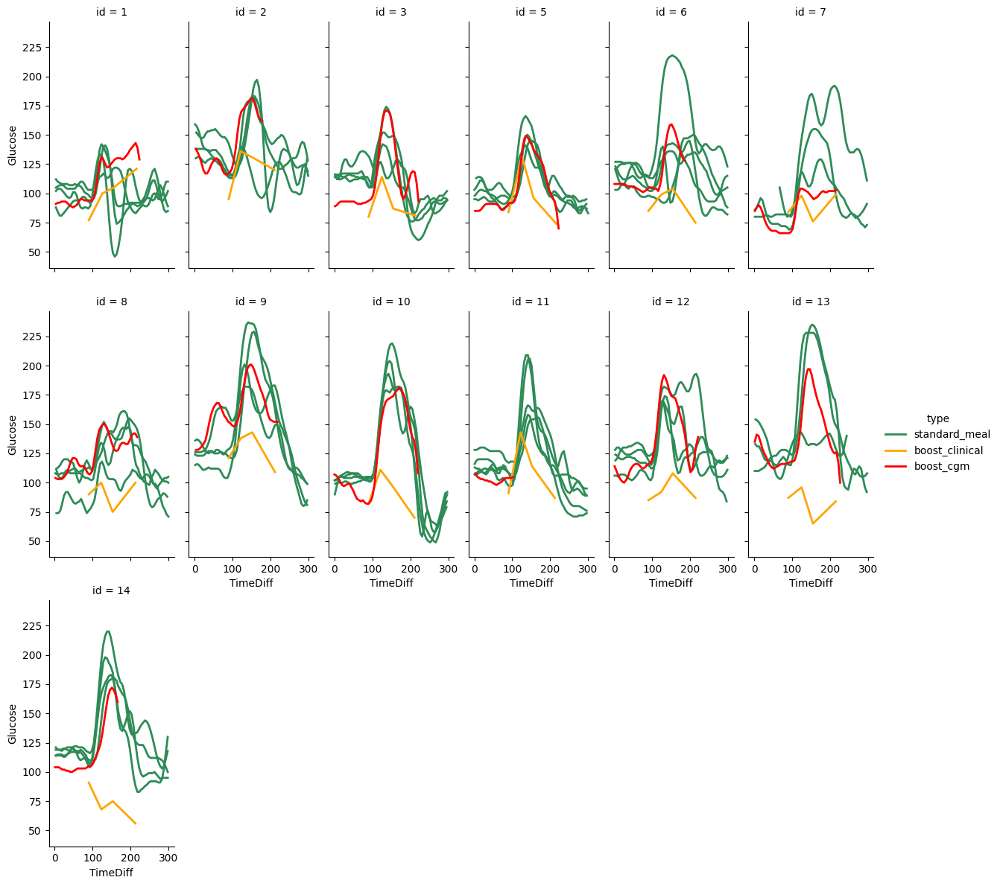

In [312]:
pal = dict(standard_meal="seagreen", boost_cgm="red", boost_clinical="orange")
g = sns.FacetGrid(food_responses, col="id", hue="type", palette=pal, height=4, col_wrap=6, aspect=.5)
# g = sns.FacetGrid(food_responses, col="id", hue="type", palette=pal, height=5, aspect=.5)
# g.map(sns.lineplot, "TimeDiff", "Glucose","date",estimator=None,linewidth=3)
g.map_dataframe(sns.lineplot, x='TimeDiff', y='Glucose', units='date', estimator=None,linewidth=2)
# g.set(xticks=[10, 30, 50], yticks=[2, 6, 10])
# plt.figure(figsize=(10,6))
# g.ax.set_xlabel("Time",fontsize=30)
# g.ax.set_ylabel("Glucose",fontsize=20)
# g.ax.tick_params(labelsize=15)
g.add_legend()

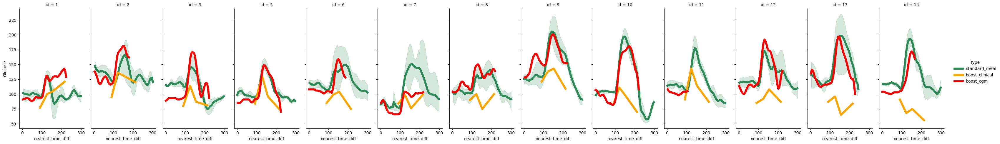

In [313]:
pal = dict(standard_meal="seagreen", boost_cgm="red", boost_clinical="orange")
# g = sns.FacetGrid(food_responses, col="id", hue="type", palette=pal, height=6, col_wrap=4, aspect=1)
g = sns.FacetGrid(food_responses_grouped, col="id", hue="type", palette=pal, height=5, aspect=.5)
g.map(sns.lineplot, "nearest_time_diff", "Glucose",estimator='mean',err_style='band',linewidth=5)
# g.set(xticks=[10, 30, 50], yticks=[2, 6, 10])
# plt.figure(figsize=(10,6))
# g.ax.set_xlabel("Time",fontsize=30)
# g.ax.set_ylabel("Glucose",fontsize=20)
# g.ax.tick_params(labelsize=15)
g.add_legend()

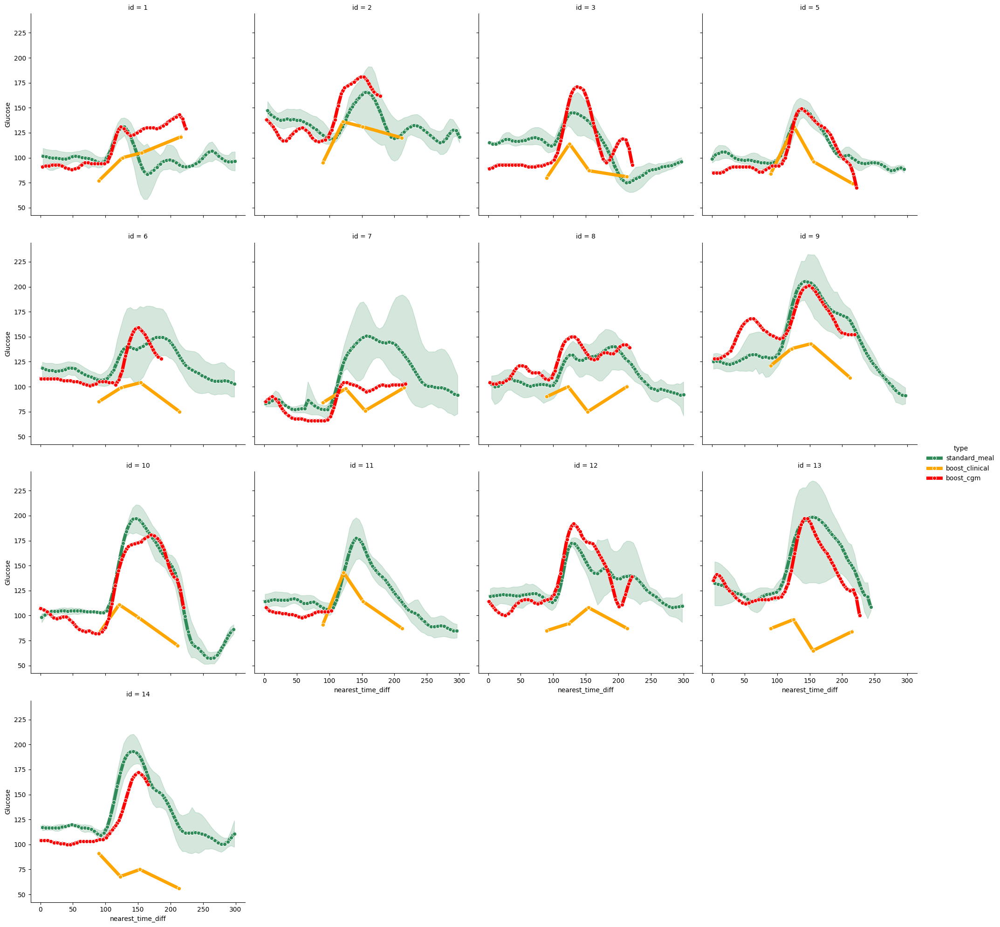

In [314]:
pal = dict(standard_meal="seagreen", boost_cgm="red", boost_clinical="orange")
g = sns.FacetGrid(food_responses_grouped, col="id", hue="type", palette=pal, height=5, col_wrap=4, aspect=1)
# g = sns.FacetGrid(food_responses_grouped, col="id", hue="type", palette=pal, height=5, aspect=.5)
g.map(sns.lineplot, "nearest_time_diff", "Glucose",estimator='mean',err_style='band',linewidth=5, marker='o')
# g.set(xticks=[10, 30, 50], yticks=[2, 6, 10])
# plt.figure(figsize=(10,6))
# g.ax.set_xlabel("Time",fontsize=30)
# g.ax.set_ylabel("Glucose",fontsize=20)
# g.ax.tick_params(labelsize=15)
g.add_legend()

In [315]:
df_stop

NameError: name 'df_stop' is not defined

In [ ]:
food_responses

In [ ]:
food_responses_clust=food_responses

In [ ]:
food_responses_clust.loc[food_responses_clust['id'] == 1, 'a1c_val_num'] = 5.5
food_responses_clust.loc[food_responses_clust['id'] == 1, 'a1c'] = 'norm'
food_responses_clust.loc[food_responses_clust['id'] == 1, 'FPG'] = 77

In [ ]:
food_responses_clust.loc[food_responses_clust['id'] == 2, 'a1c_val_num'] = 5.6
food_responses_clust.loc[food_responses_clust['id'] == 2, 'a1c'] = 'norm'
food_responses_clust.loc[food_responses_clust['id'] == 2, 'FPG'] = 95

In [ ]:
food_responses_clust.loc[food_responses_clust['id'] == 3, 'a1c_val_num'] = 5.9
food_responses_clust.loc[food_responses_clust['id'] == 3, 'a1c'] = 'PD'
food_responses_clust.loc[food_responses_clust['id'] == 3, 'FPG'] = 80

In [ ]:
food_responses_clust.loc[food_responses_clust['id'] == 4, 'a1c_val_num'] = 6.4
food_responses_clust.loc[food_responses_clust['id'] == 4, 'a1c'] = 'PD'
food_responses_clust.loc[food_responses_clust['id'] == 4, 'FPG'] = 88

In [ ]:
food_responses_clust.loc[food_responses_clust['id'] == 5, 'a1c_val_num'] = 5.7
food_responses_clust.loc[food_responses_clust['id'] == 5, 'a1c'] = 'PD'
food_responses_clust.loc[food_responses_clust['id'] == 5, 'FPG'] = 84

In [ ]:
food_responses_clust.loc[food_responses_clust['id'] == 6, 'a1c_val_num'] = 5.8
food_responses_clust.loc[food_responses_clust['id'] == 6, 'a1c'] = 'PD'
food_responses_clust.loc[food_responses_clust['id'] == 6, 'FPG'] = 85

In [ ]:
food_responses_clust.loc[food_responses_clust['id'] == 7, 'a1c_val_num'] = 5.3
food_responses_clust.loc[food_responses_clust['id'] == 7, 'a1c'] = 'norm'
food_responses_clust.loc[food_responses_clust['id'] == 7, 'FPG'] = 84

In [ ]:
food_responses_clust.loc[food_responses_clust['id'] == 8, 'a1c_val_num'] = 5.6
food_responses_clust.loc[food_responses_clust['id'] == 8, 'a1c'] = 'norm'
food_responses_clust.loc[food_responses_clust['id'] == 8, 'FPG'] = 90

In [ ]:
food_responses_clust.loc[food_responses_clust['id'] == 9, 'a1c_val_num'] = 6.1
food_responses_clust.loc[food_responses_clust['id'] == 9, 'a1c'] = 'PD'
food_responses_clust.loc[food_responses_clust['id'] == 9, 'FPG'] = 121

In [ ]:
food_responses_clust.loc[food_responses_clust['id'] == 10, 'a1c_val_num'] = 6
food_responses_clust.loc[food_responses_clust['id'] == 10, 'a1c'] = 'PD'
food_responses_clust.loc[food_responses_clust['id'] == 10, 'FPG'] = 82

In [ ]:
food_responses_clust.loc[food_responses_clust['id'] == 11, 'a1c_val_num'] = 6
food_responses_clust.loc[food_responses_clust['id'] == 11, 'a1c'] = 'PD'
food_responses_clust.loc[food_responses_clust['id'] == 11, 'FPG'] = 91

In [ ]:
food_responses_clust.loc[food_responses_clust['id'] == 12, 'a1c_val_num'] = 5.6
food_responses_clust.loc[food_responses_clust['id'] == 12, 'a1c'] = 'norm'
food_responses_clust.loc[food_responses_clust['id'] == 12, 'FPG'] = 85

In [ ]:
# result_df.loc[result_df['id'] == 11, 'a1c_val_num'] = 6
# result_df.loc[result_df['id'] == 11, 'a1c'] = 'PD'

In [ ]:
food_responses_clust.loc[food_responses_clust['id'] == 13, 'a1c_val_num'] = 5.7
food_responses_clust.loc[food_responses_clust['id'] == 13, 'a1c'] = 'PD'
food_responses_clust.loc[food_responses_clust['id'] == 13, 'FPG'] = 87

In [ ]:
food_responses_clust.loc[food_responses_clust['id'] == 14, 'a1c_val_num'] = 5.5
food_responses_clust.loc[food_responses_clust['id'] == 14, 'a1c'] = 'norm'
food_responses_clust.loc[food_responses_clust['id'] == 14, 'FPG'] = 91

In [ ]:
food_responses_clust.to_csv('/content/gdrive/My Drive/PD Project/food_responses_clust.csv', index=False)

In [ ]:
# food_clust_meal=food_responses_grouped_clust[food_responses_grouped_clust['type']=='standard_meal']

In [ ]:
# df_fcm=food_clust_meal.drop_duplicates(subset=['id', 'date','nearest_time_diff'], keep='first')

In [ ]:
# df_fcm=food_clust_meal.drop_duplicates(subset=['id', 'date','nearest_time_diff'], keep='first')

In [ ]:
food_responses.to_csv('/content/gdrive/My Drive/PD Project/food_responses.csv', index=False)

In [ ]:
df_verify = pd.read_csv('/content/gdrive/My Drive/PD Project/food_responses.csv')
print(df_verify)

In [ ]:
food_responses.to_csv("food_responses.csv")

In [ ]:
# import seaborn as sns
# plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
# sns.lineplot(data=food_responses, y="Glucose", x="TimeDiff",units='date',estimator=None, hue="id").set(title='ID=14')
# # sns.lineplot(data=df_gtt_fourteen, y="Glucose", x="TimeDiff", color='red',estimator=None)
# # sns.lineplot(data=boost_cgm_fourteen, y="Glucose", x="TimeDiff", color='orange')
# plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


In [ ]:
pal = dict(standard_meal="seagreen", boost_cgm=".7", boost_clinical="orange")
# g = sns.FacetGrid(food_responses, col="id", hue="type", palette=pal, height=6, col_wrap=4, aspect=1)
g = sns.FacetGrid(food_responses, col="id", hue="type", palette=pal, height=5, aspect=.5)
g.map(sns.lineplot, "TimeDiff", "Glucose",estimator='mean',err_style='band')
# g.set(xticks=[10, 30, 50], yticks=[2, 6, 10])
# plt.figure(figsize=(10,6))
# g.ax.set_xlabel("Time",fontsize=30)
# g.ax.set_ylabel("Glucose",fontsize=20)
# g.ax.tick_params(labelsize=15)
g.add_legend()

In [ ]:
pal = dict(standard_meal="seagreen", boost_cgm="red", boost_clinical="orange")
g = sns.FacetGrid(food_responses, col="id", hue="type", palette=pal, height=4, col_wrap=6, aspect=.5)
# g = sns.FacetGrid(food_responses, col="id", hue="type", palette=pal, height=5, aspect=.5)
# g.map(sns.lineplot, "TimeDiff", "Glucose","date",estimator=None,linewidth=3)
g.map_dataframe(sns.lineplot, x='TimeDiff', y='Glucose', units='date', estimator=None,linewidth=2)
# g.set(xticks=[10, 30, 50], yticks=[2, 6, 10])
# plt.figure(figsize=(10,6))
# g.ax.set_xlabel("Time",fontsize=30)
# g.ax.set_ylabel("Glucose",fontsize=20)
# g.ax.tick_params(labelsize=15)
g.add_legend()

In [ ]:
pal = dict(standard_meal="seagreen", boost_cgm="red", boost_clinical="orange")
# g = sns.FacetGrid(food_responses, col="id", hue="type", palette=pal, height=6, col_wrap=4, aspect=1)
g = sns.FacetGrid(food_responses_grouped, col="id", hue="type", palette=pal, height=5, aspect=.5)
g.map(sns.lineplot, "nearest_time_diff", "Glucose",estimator='mean',err_style='band',linewidth=5)
# g.set(xticks=[10, 30, 50], yticks=[2, 6, 10])
# plt.figure(figsize=(10,6))
# g.ax.set_xlabel("Time",fontsize=30)
# g.ax.set_ylabel("Glucose",fontsize=20)
# g.ax.tick_params(labelsize=15)
g.add_legend()

In [ ]:
pal = dict(standard_meal="seagreen", boost_cgm="red", boost_clinical="orange")
g = sns.FacetGrid(food_responses_grouped, col="id", hue="type", palette=pal, height=5, col_wrap=4, aspect=1)
# g = sns.FacetGrid(food_responses_grouped, col="id", hue="type", palette=pal, height=5, aspect=.5)
g.map(sns.lineplot, "nearest_time_diff", "Glucose",estimator='mean',err_style='band',linewidth=5)
# g.set(xticks=[10, 30, 50], yticks=[2, 6, 10])
# plt.figure(figsize=(10,6))
# g.ax.set_xlabel("Time",fontsize=30)
# g.ax.set_ylabel("Glucose",fontsize=20)
# g.ax.tick_params(labelsize=15)
g.add_legend()

In [ ]:
food_responses_grouped_clust=food_responses_grouped

In [ ]:
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 1, 'a1c_val_num'] = 5.5
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 1, 'a1c'] = 'norm'
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 1, 'FPG'] = 77

In [ ]:
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 2, 'a1c_val_num'] = 5.6
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 2, 'a1c'] = 'norm'
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 2, 'FPG'] = 95

In [ ]:
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 3, 'a1c_val_num'] = 5.9
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 3, 'a1c'] = 'PD'
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 3, 'FPG'] = 80

In [ ]:
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 4, 'a1c_val_num'] = 6.4
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 4, 'a1c'] = 'PD'
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 4, 'FPG'] = 88

In [ ]:
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 5, 'a1c_val_num'] = 5.7
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 5, 'a1c'] = 'PD'
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 5, 'FPG'] = 84

In [ ]:
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 6, 'a1c_val_num'] = 5.8
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 6, 'a1c'] = 'PD'
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 6, 'FPG'] = 85

In [ ]:
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 7, 'a1c_val_num'] = 5.3
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 7, 'a1c'] = 'norm'
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 7, 'FPG'] = 84

In [ ]:
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 8, 'a1c_val_num'] = 5.6
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 8, 'a1c'] = 'norm'
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 8, 'FPG'] = 90

In [ ]:
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 9, 'a1c_val_num'] = 6.1
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 9, 'a1c'] = 'PD'
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 9, 'FPG'] = 121

In [ ]:
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 10, 'a1c_val_num'] = 6
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 10, 'a1c'] = 'PD'
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 10, 'FPG'] = 82

In [ ]:
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 11, 'a1c_val_num'] = 6
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 11, 'a1c'] = 'PD'
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 11, 'FPG'] = 91

In [ ]:
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 12, 'a1c_val_num'] = 5.6
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 12, 'a1c'] = 'norm'
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 12, 'FPG'] = 85

In [ ]:
# result_df.loc[result_df['id'] == 11, 'a1c_val_num'] = 6
# result_df.loc[result_df['id'] == 11, 'a1c'] = 'PD'

In [ ]:
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 13, 'a1c_val_num'] = 5.7
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 13, 'a1c'] = 'PD'
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 13, 'FPG'] = 87

In [ ]:
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 14, 'a1c_val_num'] = 5.5
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 14, 'a1c'] = 'norm'
food_responses_grouped_clust.loc[food_responses_grouped_clust['id'] == 14, 'FPG'] = 91

In [ ]:
food_clust_meal=food_responses_grouped_clust[food_responses_grouped_clust['type']=='standard_meal']

In [ ]:
df_fcm=food_clust_meal.drop_duplicates(subset=['id', 'date','nearest_time_diff'], keep='first')

In [ ]:
df_fcm=food_clust_meal.drop_duplicates(subset=['id', 'date','nearest_time_diff'], keep='first')

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=df_fcm, y="Glucose", x="nearest_time_diff", hue='id',estimator='mean',err_style='band')

In [ ]:
food_responses_grouped_clust['type'].unique()

In [ ]:
food_clust_boost_cgm=food_responses_grouped_clust[food_responses_grouped_clust['type']=='boost_cgm']

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=food_clust_boost_cgm, y="Glucose", x="nearest_time_diff", hue='a1c',palette='husl',units='date',estimator=None).set(title='CGM Boost')

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=food_clust_boost_cgm, y="Glucose", x="nearest_time_diff", hue='FPG',palette='husl',units='date',estimator=None).set(title='CGM Boost')

In [ ]:
df

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=df_gtt_one, y="Glucose", x="TimeDiff", color='red',estimator=None).set(title='Clinic OGTT')
sns.lineplot(data=df_gtt_two, y="Glucose", x="TimeDiff", color='olive',estimator=None)
sns.lineplot(data=df_gtt_three, y="Glucose", x="TimeDiff", color='limegreen',estimator=None)
sns.lineplot(data=df_gtt_four, y="Glucose", x="TimeDiff", color='coral',estimator=None)
sns.lineplot(data=df_gtt_five, y="Glucose", x="TimeDiff", color='violet',estimator=None)
sns.lineplot(data=df_gtt_six, y="Glucose", x="TimeDiff", color='cornflowerblue',estimator=None)
sns.lineplot(data=df_gtt_seven, y="Glucose", x="TimeDiff", color='blue',estimator=None)
sns.lineplot(data=df_gtt_eight, y="Glucose", x="TimeDiff", color='teal',estimator=None)
sns.lineplot(data=df_gtt_nine, y="Glucose", x="TimeDiff", color='maroon',estimator=None)
sns.lineplot(data=df_gtt_ten, y="Glucose", x="TimeDiff", color='cyan',estimator=None)
sns.lineplot(data=df_gtt_eleven, y="Glucose", x="TimeDiff", color='peru',estimator=None)
sns.lineplot(data=df_gtt_twelve, y="Glucose", x="TimeDiff", color='deeppink',estimator=None)
sns.lineplot(data=df_gtt_thirteen, y="Glucose", x="TimeDiff", color='green',estimator=None)
sns.lineplot(data=df_gtt_fourteen, y="Glucose", x="TimeDiff", color='orange',estimator=None)
plt.legend(labels=["One","Two","Three","Four","Five","Six","Seven","Eight","Nine","Ten","Eleven","Twelve","Thirteen","Fourteen"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [ ]:
# groupby_object = df_melt.groupby('variable')
# count number of groups to determine the required number of subplots
number_of_columns = 2
df_ogtt[1]=fourteen_ogtt
df_gtt[1]=df_gtt_fourteen
df_boost[1]=boost_cgm_fourteen

df_ogtt[2]=thirteen_ogtt
df_gtt[2]=df_gtt_thirteen
df_boost[2]=boost_cgm_thirteen

fig, axs = plt.subplots(1, number_of_columns+1, sharey=True)
for i, (_, g) in enumerate(2):
    # feed data from each sub-dataframe `g` to regplot
    # sns.regplot(data=g, x='value', y='wage', ax=axs[i])
    sns.lineplot(data=df_ogtt[i], y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=14')
    sns.lineplot(data=df_gtt[i], y="Glucose", x="TimeDiff", color='red',estimator=None)
    sns.lineplot(data=df_boost[i], y="Glucose", x="TimeDiff", color='orange')
    plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [ ]:
boost_cgm_one['id'] = 1

boost_cgm_two['id'] = 2

boost_cgm_three['id'] = 3

# three_ogtt['id'] = 3

boost_cgm_four['id'] = 4

boost_cgm_five['id'] = 5

boost_cgm_six['id'] = 6

#six_ogtt['id'] = 6

boost_cgm_seven['id'] = 7

boost_cgm_eight['id'] = 8

boost_cgm_nine['id'] = 9

boost_cgm_ten['id'] = 10

boost_cgm_eleven['id'] = 11

boost_cgm_twelve['id'] = 12

#ten_ogtt['id'] = 10

#eleven_ogtt['id'] = 11

#twelve_ogtt['id'] = 12

bosst_cgm_thirteen['id'] = 13

#fourteen_ogtt['id'] = 14

boost_cgm_fourteen['id'] = 14


In [ ]:
# Append all the DataFrames
result_df_boost = boost_cgm_one.append([boost_cgm_one, boost_cgm_two, boost_cgm_three, boost_cgm_four, boost_cgm_five,
                                        boost_cgm_six, boost_cgm_seven
                                  , boost_cgm_eight, boost_cgm_nine, boost_cgm_ten, boost_cgm_eleven,
                                      boost_cgm_twelve,  bosst_cgm_thirteen, boost_cgm_fourteen], ignore_index=True)

# Display the resulting DataFrame
#result_df.id

In [ ]:
result_df_boost.head(2)

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
pal=sns.color_palette("husl", 14)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_boost, y="Glucose", x="TimeDiff", hue='id',palette=pal,units='date',estimator=None, linewidth=3)

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=boost_cgm_one, y="Glucose", x="TimeDiff", color='red',estimator=None, linewidth=3).set(title='Clinic OGTT')
sns.lineplot(data=boost_cgm_two, y="Glucose", x="TimeDiff", color='olive',estimator=None, linewidth=3)
sns.lineplot(data=boost_cgm_three, y="Glucose", x="TimeDiff", color='limegreen',estimator=None, linewidth=3)
# sns.lineplot(data=boost_cgm_four, y="Glucose", x="TimeDiff", color='coral',estimator=None)
sns.lineplot(data=boost_cgm_five, y="Glucose", x="TimeDiff", color='violet',estimator=None, linewidth=3)
sns.lineplot(data=boost_cgm_six, y="Glucose", x="TimeDiff", color='cornflowerblue',estimator=None, linewidth=3)
sns.lineplot(data=boost_cgm_seven, y="Glucose", x="TimeDiff", color='blue',estimator=None, linewidth=3)
sns.lineplot(data=boost_cgm_eight, y="Glucose", x="TimeDiff", color='teal',estimator=None, linewidth=3)
sns.lineplot(data=boost_cgm_nine, y="Glucose", x="TimeDiff", color='maroon',estimator=None, linewidth=3)
sns.lineplot(data=boost_cgm_ten, y="Glucose", x="TimeDiff", color='cyan',estimator=None, linewidth=3)
sns.lineplot(data=boost_cgm_eleven, y="Glucose", x="TimeDiff", color='peru',estimator=None, linewidth=3)
sns.lineplot(data=boost_cgm_twelve, y="Glucose", x="TimeDiff", color='deeppink',estimator=None, linewidth=3)
sns.lineplot(data=bosst_cgm_thirteen, y="Glucose", x="TimeDiff", color='green',estimator=None, linewidth=3)
sns.lineplot(data=boost_cgm_fourteen, y="Glucose", x="TimeDiff", color='orange',estimator=None, linewidth=3)
plt.legend(labels=["One","Two","Three","Four","Five","Six","Seven","Eight","Nine","Ten","Eleven","Twelve","Thirteen","Fourteen"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [ ]:
result_df_boost.loc[result_df_boost['id'] == 1, 'a1c_val_num'] = 5.5
result_df_boost.loc[result_df_boost['id'] == 1, 'a1c'] = 'norm'
result_df_boost.loc[result_df_boost['id'] == 1, 'FPG'] = 77

In [ ]:
result_df_boost.loc[result_df_boost['id'] == 2, 'a1c_val_num'] = 5.6
result_df_boost.loc[result_df_boost['id'] == 2, 'a1c'] = 'norm'
result_df_boost.loc[result_df_boost['id'] == 2, 'FPG'] = 95

In [ ]:
result_df_boost.loc[result_df_boost['id'] == 3, 'a1c_val_num'] = 5.9
result_df_boost.loc[result_df_boost['id'] == 3, 'a1c'] = 'PD'
result_df_boost.loc[result_df_boost['id'] == 3, 'FPG'] = 80

In [ ]:
result_df_boost.loc[result_df_boost['id'] == 4, 'a1c_val_num'] = 6.4
result_df_boost.loc[result_df_boost['id'] == 4, 'a1c'] = 'PD'
result_df_boost.loc[result_df_boost['id'] == 4, 'FPG'] = 88

In [ ]:
result_df_boost.loc[result_df_boost['id'] == 5, 'a1c_val_num'] = 5.7
result_df_boost.loc[result_df_boost['id'] == 5, 'a1c'] = 'PD'
result_df_boost.loc[result_df_boost['id'] == 5, 'FPG'] = 84

In [ ]:
result_df_boost.loc[result_df_boost['id'] == 6, 'a1c_val_num'] = 5.8
result_df_boost.loc[result_df_boost['id'] == 6, 'a1c'] = 'PD'
result_df_boost.loc[result_df_boost['id'] == 6, 'FPG'] = 85

In [ ]:
result_df_boost.loc[result_df_boost['id'] == 7, 'a1c_val_num'] = 5.3
result_df_boost.loc[result_df_boost['id'] == 7, 'a1c'] = 'norm'
result_df_boost.loc[result_df_boost['id'] == 7, 'FPG'] = 84

In [ ]:
result_df_boost.loc[result_df_boost['id'] == 8, 'a1c_val_num'] = 5.6
result_df_boost.loc[result_df_boost['id'] == 8, 'a1c'] = 'norm'
result_df_boost.loc[result_df_boost['id'] == 8, 'FPG'] = 90

In [ ]:
result_df_boost.loc[result_df_boost['id'] == 9, 'a1c_val_num'] = 6.1
result_df_boost.loc[result_df_boost['id'] == 9, 'a1c'] = 'PD'
result_df_boost.loc[result_df_boost['id'] == 9, 'FPG'] = 121

In [ ]:
result_df_boost.loc[result_df_boost['id'] == 10, 'a1c_val_num'] = 6
result_df_boost.loc[result_df_boost['id'] == 10, 'a1c'] = 'PD'
result_df_boost.loc[result_df_boost['id'] == 10, 'FPG'] = 82

In [ ]:
result_df_boost.loc[result_df_boost['id'] == 11, 'a1c_val_num'] = 6
result_df_boost.loc[result_df_boost['id'] == 11, 'a1c'] = 'PD'
result_df_boost.loc[result_df_boost['id'] == 11, 'FPG'] = 91

In [ ]:
result_df_boost.loc[result_df_boost['id'] == 12, 'a1c_val_num'] = 5.6
result_df_boost.loc[result_df_boost['id'] == 12, 'a1c'] = 'norm'
result_df_boost.loc[result_df_boost['id'] == 12, 'FPG'] = 85

In [ ]:
# result_df.loc[result_df['id'] == 11, 'a1c_val_num'] = 6
# result_df.loc[result_df['id'] == 11, 'a1c'] = 'PD'

In [ ]:
result_df_boost.loc[result_df_boost['id'] == 13, 'a1c_val_num'] = 5.7
result_df_boost.loc[result_df_boost['id'] == 13, 'a1c'] = 'PD'
result_df_boost.loc[result_df_boost['id'] == 13, 'FPG'] = 87

In [ ]:
result_df_boost.loc[result_df_boost['id'] == 14, 'a1c_val_num'] = 5.5
result_df_boost.loc[result_df_boost['id'] == 14, 'a1c'] = 'norm'
result_df_boost.loc[result_df_boost['id'] == 14, 'FPG'] = 91

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_boost, y="Glucose", x="TimeDiff", hue='a1c',palette='husl',units='date',estimator=None).set(title='CGM OGTT')

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_boost, y="Glucose", x="TimeDiff", hue='a1c',palette='husl',units='date',linewidth=3,estimator=None).set(title='CGM OGTT')

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_boost, y="Glucose", x="TimeDiff", hue='FPG',palette='rocket_r',units='date',estimator=None).set(title='CGM OGTT')

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
# p=sns.cubehelix_palette(start=3, rot=1, as_cmap=True)
# p=sns.color_palette("ch:s=-.7,r=1", as_cmap=True)
# p=sns.cubehelix_palette(14,start=-.1, rot=-.2, dark=0, light=.6,gamma=.3, hue=1, reverse=False, as_cmap=True)
p=sns.color_palette("rocket_r", 14)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_boost, y="Glucose", x="TimeDiff", hue='FPG',palette=p,units='date',linewidth=3,estimator=None).set(title='CGM OGTT')
plt.legend(title='Clinical FPG',loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
# p=sns.cubehelix_palette(start=3, rot=1, as_cmap=True)
# p=sns.color_palette("ch:s=-.7,r=1", as_cmap=True)
# p=sns.cubehelix_palette(14,start=-.1, rot=-.2, dark=0, light=.6,gamma=.3, hue=1, reverse=False, as_cmap=True)
p=sns.color_palette("coolwarm_r", 14)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_boost, y="Glucose", x="TimeDiff", hue='FPG',palette=p,units='date',linewidth=3,estimator=None).set(title='CGM OGTT')
plt.legend(title='Clinical FPG',loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
# p=sns.cubehelix_palette(start=3, rot=1, as_cmap=True)
# p=sns.color_palette("ch:s=-.7,r=1", as_cmap=True)
# p=sns.cubehelix_palette(14,start=-.1, rot=1, dark=0, light=.6,gamma=.3, hue=1.2, reverse=False, as_cmap=True)
p=sns.color_palette("rocket_r", 14)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_boost, y="Glucose", x="TimeDiff", hue='a1c_val_num',palette=p,units='date',linewidth=3,estimator=None).set(title='CGM OGTT')
plt.legend(title='Clinical A1c',loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
# p=sns.cubehelix_palette(start=3, rot=1, as_cmap=True)
# p=sns.color_palette("ch:s=-.7,r=1", as_cmap=True)
p=sns.cubehelix_palette(14,start=-.1, rot=1, dark=0, light=.6,gamma=.3, hue=1.2, reverse=False, as_cmap=True)
# p=sns.color_palette("rocket_r", 14)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_boost, y="Glucose", x="TimeDiff", hue='a1c_val_num',palette=p,units='date',linewidth=3,estimator=None).set(title='CGM OGTT')
plt.legend(title='Clinical A1c',loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [ ]:
result_df_boost.a1c_val_num.unique()

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_boost, y="Glucose", x="TimeDiff", hue='FPG',palette='rocket_r',units='date',estimator=None).set(title='CGM OGTT')

In [ ]:
result_df_boost.a1c_val_num

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_boost, y="Glucose", x="TimeDiff", hue='a1c_val_num',palette='rocket_r',units='date',estimator=None).set(title='CGM OGTT')

In [ ]:
one_ogtt['id'] = 1
two_ogtt['id'] = 2

three_ogtt['id'] = 3

four_ogtt['id'] = 4

five_ogtt['id'] = 5

six_ogtt['id'] = 6

seven_ogtt['id'] = 7

eight_ogtt['id'] = 8

nine_ogtt['id'] = 9

ten_ogtt['id'] = 10

eleven_ogtt['id'] = 11

twelve_ogtt['id'] = 12

thirteen_ogtt['id'] = 13

fourteen_ogtt['id'] = 14


In [ ]:
# Append all the DataFrames
result_df_ogtt = one_ogtt.append([two_ogtt,three_ogtt,four_ogtt, five_ogtt,six_ogtt, seven_ogtt, eight_ogtt, nine_ogtt,
                             ten_ogtt,eleven_ogtt,twelve_ogtt,thirteen_ogtt,fourteen_ogtt], ignore_index=True)

# Display the resulting DataFrame
#result_df.id

In [ ]:
result_df_ogtt.loc[result_df_ogtt['id'] == 1, 'a1c_val_num'] = 5.5
result_df_ogtt.loc[result_df_ogtt['id'] == 1, 'a1c'] = 'norm'
result_df_ogtt.loc[result_df_ogtt['id'] == 1, 'FPG'] = 77

In [ ]:
result_df_ogtt.loc[result_df_ogtt['id'] == 2, 'a1c_val_num'] = 5.6
result_df_ogtt.loc[result_df_ogtt['id'] == 2, 'a1c'] = 'norm'
result_df_ogtt.loc[result_df_ogtt['id'] == 2, 'FPG'] = 95

In [ ]:
result_df_ogtt.loc[result_df_ogtt['id'] == 3, 'a1c_val_num'] = 5.9
result_df_ogtt.loc[result_df_ogtt['id'] == 3, 'a1c'] = 'PD'
result_df_ogtt.loc[result_df_ogtt['id'] == 3, 'FPG'] = 80

In [ ]:
result_df_ogtt.loc[result_df_ogtt['id'] == 4, 'a1c_val_num'] = 6.4
result_df_ogtt.loc[result_df_ogtt['id'] == 4, 'a1c'] = 'PD'
result_df_ogtt.loc[result_df_ogtt['id'] == 4, 'FPG'] = 88

In [ ]:
result_df_ogtt.loc[result_df_ogtt['id'] == 5, 'a1c_val_num'] = 5.7
result_df_ogtt.loc[result_df_ogtt['id'] == 5, 'a1c'] = 'PD'
result_df_ogtt.loc[result_df_ogtt['id'] == 5, 'FPG'] = 84

In [ ]:
result_df_ogtt.loc[result_df_ogtt['id'] == 6, 'a1c_val_num'] = 5.8
result_df_ogtt.loc[result_df_ogtt['id'] == 6, 'a1c'] = 'PD'
result_df_ogtt.loc[result_df_ogtt['id'] == 6, 'FPG'] = 85

In [ ]:
result_df_ogtt.loc[result_df_ogtt['id'] == 7, 'a1c_val_num'] = 5.3
result_df_ogtt.loc[result_df_ogtt['id'] == 7, 'a1c'] = 'norm'
result_df_ogtt.loc[result_df_ogtt['id'] == 7, 'FPG'] = 84

In [ ]:
result_df_ogtt.loc[result_df_ogtt['id'] == 8, 'a1c_val_num'] = 5.6
result_df_ogtt.loc[result_df_ogtt['id'] == 8, 'a1c'] = 'norm'
result_df_ogtt.loc[result_df_ogtt['id'] == 8, 'FPG'] = 90

In [ ]:
result_df_ogtt.loc[result_df_ogtt['id'] == 9, 'a1c_val_num'] = 6.1
result_df_ogtt.loc[result_df_ogtt['id'] == 9, 'a1c'] = 'PD'
result_df_ogtt.loc[result_df_ogtt['id'] == 9, 'FPG'] = 121

In [ ]:
result_df_ogtt.loc[result_df_ogtt['id'] == 10, 'a1c_val_num'] = 6
result_df_ogtt.loc[result_df_ogtt['id'] == 10, 'a1c'] = 'PD'
result_df_ogtt.loc[result_df_ogtt['id'] == 10, 'FPG'] = 82

In [ ]:
result_df_ogtt.loc[result_df_ogtt['id'] == 11, 'a1c_val_num'] = 6
result_df_ogtt.loc[result_df_ogtt['id'] == 11, 'a1c'] = 'PD'
result_df_ogtt.loc[result_df_ogtt['id'] == 11, 'FPG'] = 91

In [ ]:
result_df_ogtt.loc[result_df_ogtt['id'] == 12, 'a1c_val_num'] = 5.6
result_df_ogtt.loc[result_df_ogtt['id'] == 12, 'a1c'] = 'norm'
result_df_ogtt.loc[result_df_ogtt['id'] == 12, 'FPG'] = 85

In [ ]:
# result_df.loc[result_df['id'] == 11, 'a1c_val_num'] = 6
# result_df.loc[result_df['id'] == 11, 'a1c'] = 'PD'

In [ ]:
result_df_ogtt.loc[result_df_ogtt['id'] == 13, 'a1c_val_num'] = 5.7
result_df_ogtt.loc[result_df_ogtt['id'] == 13, 'a1c'] = 'PD'
result_df_ogtt.loc[result_df_ogtt['id'] == 13, 'FPG'] = 87

In [ ]:
result_df_ogtt.loc[result_df_ogtt['id'] == 14, 'a1c_val_num'] = 5.5
result_df_ogtt.loc[result_df_ogtt['id'] == 14, 'a1c'] = 'norm'
result_df_ogtt.loc[result_df_ogtt['id'] == 14, 'FPG'] = 91

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df, y="Glucose", x="TimeDiff", hue='id',palette='bright',units='date',estimator=None)

In [ ]:
result_df['sequential_value'] = result_df.groupby(['id', 'date']).cumcount() + 1


In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df, y="Glucose", x="sequential_value", hue='id',palette='bright',units='date',estimator=None)

In [ ]:

import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df, y="Glucose", x="TimeDiff", hue='id',palette='bright',units='date',estimator=None)

In [ ]:
train_df=merge_sub_five
train_df=train_df.append(merge_sub_four)
train_df=train_df.append(merge_sub_two)
train_df=train_df.append(merge_sub_one)
train_df=train_df.append(merge_sub_seven)
train_df

In [ ]:

import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df, y="Glucose", x="TimeDiff", hue='id',palette='bright',units='date',estimator=None)

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df, y="Glucose", x="sequential_value", hue='id',palette='bright',units='date',estimator=None, marker='o', style="a1c")

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df, y="Glucose", x="TimeDiff", hue='id',palette='bright',units='date',estimator=None, marker='o', style="a1c")

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df, y="Glucose", x="sequential_value", hue='id',palette='husl',units='date',estimator=None, marker='o')

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_ogtt, y="Glucose", x="TimeDiff_Round", hue='a1c',palette='husl',units='date',estimator=None)

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_ogtt, y="Glucose", x="TimeDiff_Round", hue='a1c',palette='husl')

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_ogtt, y="Glucose", x="TimeDiff_Round", hue='a1c',palette='husl',units='date',estimator=None)

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
p=sns.color_palette("rocket_r", 14)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_ogtt, y="Glucose", x="TimeDiff_Round", hue='FPG',palette=p)

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 14)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_ogtt, y="Glucose", x="TimeDiff", hue='id',palette='husl')

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_ogtt, y="Glucose", x="TimeDiff", hue='FPG',palette='husl',units='date',estimator=None)

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df, y="Glucose", x="TimeDiff", hue='id',palette='husl',units='date',estimator=None, marker='o')

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df, y="Glucose", x="sequential_value", hue='min_glu',palette='Spectral',units='date',estimator=None, marker='o', style="a1c")

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df, y="Glucose", x="sequential_value", hue='FPG',palette='Spectral',units='date',estimator=None, marker='o', style="a1c")

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.scatterplot(data=result_df, y="Glucose", x="sequential_value", hue='min_glu',palette='rocket')

In [ ]:
result_df['a1c_val_num']=1

In [ ]:
result_df['a1c_val_num'].unique

In [ ]:
result_df.loc[result_df['id'] == 2, 'a1c_val_num'] = 5.6
result_df.loc[result_df['id'] == 2, 'a1c'] = 'norm'
result_df.loc[result_df['id'] == 2, 'FPG'] = 95

In [ ]:
result_df.loc[result_df['id'] == 4, 'a1c_val_num'] = 6.4
result_df.loc[result_df['id'] == 4, 'a1c'] = 'PD'
result_df.loc[result_df['id'] == 4, 'FPG'] = 88

In [ ]:
result_df.loc[result_df['id'] == 5, 'a1c_val_num'] = 5.7
result_df.loc[result_df['id'] == 5, 'a1c'] = 'PD'
result_df.loc[result_df['id'] == 5, 'FPG'] = 84

In [ ]:
result_df.loc[result_df['id'] == 7, 'a1c_val_num'] = 5.3
result_df.loc[result_df['id'] == 7, 'a1c'] = 'norm'
result_df.loc[result_df['id'] == 7, 'FPG'] = 84

In [ ]:
result_df.loc[result_df['id'] == 8, 'a1c_val_num'] = 5.6
result_df.loc[result_df['id'] == 8, 'a1c'] = 'norm'
result_df.loc[result_df['id'] == 8, 'FPG'] = 90

In [ ]:
result_df.loc[result_df['id'] == 9, 'a1c_val_num'] = 6.1
result_df.loc[result_df['id'] == 9, 'a1c'] = 'PD'
result_df.loc[result_df['id'] == 9, 'FPG'] = 121

In [ ]:
# result_df.loc[result_df['id'] == 11, 'a1c_val_num'] = 6
# result_df.loc[result_df['id'] == 11, 'a1c'] = 'PD'

In [ ]:
result_df.loc[result_df['id'] == 13, 'a1c_val_num'] = 5.7
result_df.loc[result_df['id'] == 13, 'a1c'] = 'PD'
result_df.loc[result_df['id'] == 13, 'FPG'] = 87

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.scatterplot(data=result_df, y="Glucose", x="sequential_value", hue='a1c_val_num',palette='rocket')

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df, y="Glucose", x="sequential_value", hue='id',palette='deep',units='date',estimator=None, marker='o')

In [ ]:
two_ogtt['id'] = 2

#three_ogtt['id'] = 3

four_ogtt['id'] = 4

five_ogtt['id'] = 5

#six_ogtt['id'] = 6

seven_ogtt['id'] = 7

eight_ogtt['id'] = 8

nine_ogtt['id'] = 9

#ten_ogtt['id'] = 10

#eleven_ogtt['id'] = 11

#twelve_ogtt['id'] = 12

thirteen_ogtt['id'] = 13

#fourteen_ogtt['id'] = 14


In [ ]:
# Append all the DataFrames
result_df = two_ogtt.append([four_ogtt, five_ogtt, seven_ogtt, eight_ogtt, nine_ogtt, thirteen_ogtt], ignore_index=True)

# Display the resulting DataFrame
#result_df.id

In [ ]:
result_df['sequential_value'] = result_df.groupby(['id', 'date']).cumcount() + 1


In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df, y="Glucose", x="sequential_value", hue='id',palette='bright',units='date',estimator=None)

In [ ]:

import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df, y="Glucose", x="TimeDiff", hue='id',palette='bright',units='date',estimator=None)

In [ ]:
train_df=merge_sub_five
train_df=train_df.append(merge_sub_four)
train_df=train_df.append(merge_sub_two)
train_df=train_df.append(merge_sub_one)
train_df=train_df.append(merge_sub_seven)
train_df

In [ ]:
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Specify the columns you want to scale
columns_to_scale = ['sum_acc_per_day', 'sum_acc_before_food',
            'max_eda_per_day', 'mean_hr_per_day', 'mean_hr_before_food',
            'mean_temp_per_day', 'mean_temp_before_food', 'mean_temp_ogtt_day', 'TIR', 'TOR',
            'auc_ogtt','mean_glu_ld']

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit and transform the selected columns
train_df[columns_to_scale] = scaler.fit_transform(train_df[columns_to_scale])


In [ ]:
train_df

In [ ]:
test_df=merge_sub_nine
test_df=test_df.append(merge_sub_thirteen)
test_df=test_df.append(merge_sub_eight)
test_df

In [ ]:
full_df=test_df.append(train_df)
full_df

In [ ]:
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Specify the columns you want to scale
columns_to_scale = ['sum_acc_per_day', 'sum_acc_before_food',
            'max_eda_per_day', 'mean_hr_per_day', 'mean_hr_before_food',
            'mean_temp_per_day', 'mean_temp_before_food', 'mean_temp_ogtt_day', 'TIR', 'TOR',
            'auc_ogtt','mean_glu_ld']

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit and transform the selected columns
test_df[columns_to_scale] = scaler.fit_transform(test_df[columns_to_scale])

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Assuming you have two separate dataframes: train_df and test_df

# Features and target variable
features = ['sum_acc_per_day', 'sum_acc_before_food',
            'max_eda_per_day', 'mean_hr_per_day', 'mean_hr_before_food',
            'mean_temp_per_day', 'mean_temp_before_food', 'mean_temp_ogtt_day', 'TIR', 'TOR',
            'auc_ogtt','mean_glu_ld']
target = 'meal_auc'

# Extracting features and target from the dataframes
X_train = train_df[features]
y_train = train_df[target]

X_test = test_df[features]
y_test = test_df[target]

# Splitting the training data into train and validation sets
X_train_split, X_val, y_train_split, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Creating a Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

# Training the model
rf_model.fit(X_train_split, y_train_split)

# Predictions on the validation set
y_val_pred = rf_model.predict(X_val)

y_train_pred = rf_model.predict(X_train)

# Evaluating the model
mse = mean_squared_error(y_val, y_val_pred)
r2 = r2_score(y_val, y_val_pred)

r2_train = r2_score(y_train, y_train_pred)

def calculate_mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mape = calculate_mape(y_val, y_val_pred)
print(f'MAPE: {mape:.2f}%')

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))
print(f'RMSE: {rmse:.2f}')

print(f'Mean Squared Error on Validation Set: {mse}')
print(f'R-squared on Validation Set: {r2}')
print(f'R-squared on training Set: {r2_train}')

# Predictions on the test set
y_test_pred = rf_model.predict(X_test)

plt.scatter(y_val, y_val_pred, alpha=0.7)
plt.title('Correlation between Predicted and Actual Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

# You can use y_test_pred for further analysis or evaluation


In [ ]:
import seaborn as sns
corr = full_df.corr()
fig, ax = plt.subplots(figsize=(20,20))
sns.heatmap(corr, vmax=1, center=0, fmt='.3f',cmap="YlGnBu",
            square=True, linewidths=.5, annot=True, cbar_kws={'shrink' : 0.8})
ax.set_xticklabels(ax.get_xticklabels(),rotation=45,horizontalalignment='right')
plt.title('Correlation Matrix', fontsize=16)
plt.show()

In [ ]:
plt.scatter(y_test, y_pred, alpha=0.7)
plt.title('Correlation between Predicted and Actual Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

In [ ]:
import pandas as pd
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Assuming your train dataframe is named train_df and test dataframe is named test_df
# Specify your features and target variable
features = ['sum_acc_per_day', 'sum_acc_before_food',
            'max_eda_per_day', 'mean_hr_per_day', 'mean_hr_before_food',
            'mean_temp_per_day', 'mean_temp_before_food', 'mean_temp_ogtt_day', 'TIR', 'TOR',
            'auc_ogtt','mean_glu_ld']

target_variable = 'meal_auc'

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(train_df[features], train_df[target_variable], test_size=0.2, random_state=42)

# Convert the data into DMatrix format (optimized data structure for XGBoost)
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)

# Set XGBoost parameters
params = {
    'objective': 'reg:squarederror',  # for regression tasks
    'max_depth': 3,
    'learning_rate': 0.1,
    'n_estimators': 100
}

# Train the XGBoost model
model = xgb.train(params, dtrain)

# Make predictions on the test set
y_pred = model.predict(dtest)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Now, you can use the trained model to make predictions on your test data
test_data = xgb.DMatrix(test_df[features])
test_predictions = model.predict(test_data)

# The variable 'test_predictions' contains the predicted values for your test data


In [ ]:
df_ogtt=merge_sub_fourteen
df_ogtt=df_ogtt.append(merge_sub_thirteen)
df_ogtt=df_ogtt.append(merge_sub_eleven)
df_ogtt=df_ogtt.append(merge_sub_nine)
df_ogtt=df_ogtt.append(merge_sub_eight)
df_ogtt=df_ogtt.append(merge_sub_seven)
df_ogtt=df_ogtt.append(merge_sub_five)


train_df=df_ogtt

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Assuming you have two separate dataframes: train_df and test_df

# Features and target variable
features = ['auc_ogtt_fourteen', 'sum_acc_per_day', 'sum_acc_before_food', 'sum_acc_fourteen_day',
            'max_eda_per_day', 'mean_hr_per_day', 'mean_hr_before_food', 'mean_hr_fourteen_day',
            'mean_temp_per_day', 'mean_temp_before_food', 'mean_temp_fourteen_day', 'TIR', 'TOR',
            'a1c', 'max_glu', 'min_glu']
target = 'meal_auc'

# Extracting features and target from the dataframes
X_train = train_df[features]
y_train = train_df[target]

X_test = test_df[features]
y_test = test_df[target]

# Splitting the training data into train and validation sets
X_train_split, X_val, y_train_split, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Creating a Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

# Training the model
rf_model.fit(X_train_split, y_train_split)

# Predictions on the validation set
y_val_pred = rf_model.predict(X_val)

# Evaluating the model
mse = mean_squared_error(y_val, y_val_pred)
r2 = r2_score(y_val, y_val_pred)

print(f'Mean Squared Error on Validation Set: {mse}')
print(f'R-squared on Validation Set: {r2}')

# Predictions on the test set
y_test_pred = rf_model.predict(X_test)

# You can use y_test_pred for further analysis or evaluation


In [ ]:
# Import necessary libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Assuming your DataFrame is named 'your_dataframe'
# Replace these column names if they are different in your actual dataset
features = ['sum_acc_per_day', 'min_glu']
target = 'max_glu'

# Select features (X) and target variable (y)
X = merge_cgm_acc_fourteen_sub[features]
y = merge_cgm_acc_fourteen_sub[target]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)  # You can adjust the number of trees (n_estimators)

# Train the model
rf_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared Score: {r2}")

# Visualize the predicted vs actual values
plt.scatter(y_test, y_pred)
plt.xlabel('Actual max_glu')
plt.ylabel('Predicted max_glu')
plt.title('Actual vs Predicted max_glu')
plt.show()


In [ ]:
hr_fourteen=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/014/HR_014.csv')
acc_fourteen=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/014/ACC_014.csv')
acc_fourteen['datetime']=pd.to_datetime(acc_fourteen['datetime'])
acc_fourteen['date_only']=acc_fourteen['datetime'].dt.date
acc_fourteen['acc']=(((acc_fourteen[' acc_x'])**2 + (acc_fourteen[' acc_y'])**2 + (acc_fourteen[' acc_z'])**2)**0.5)
acc_fourteen['mean_acc_per_day']=acc_fourteen.groupby('date_only')['acc'].transform('mean')
acc_fourteen['sum_acc_per_day']=acc_fourteen.groupby('date_only')['acc'].transform('sum')

In [ ]:
eda_two=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/002/EDA_002.csv')
#food_two=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/002/Food_Log_002.csv')
#cgm_two=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/002/Dexcom_002.csv')
hr_two=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/002/HR_002.csv')
acc_two=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/002/ACC_002.csv')

In [ ]:
cgm_fifteen=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/015/Dexcom_015.csv')
cgm_fifteen['timestamp_dt']=pd.to_datetime(cgm_fifteen['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_fifteen=cgm_fifteen.dropna(subset = ['timestamp_dt'])
cgm_fifteen['date']=cgm_fifteen['timestamp_dt'].dt.date
cgm_fifteen

food_fifteen=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/015/Food_Log_015.csv')

food_fifteen['date']=pd.to_datetime(food_fifteen['date']).dt.date

food_fifteen['time_begin']=pd.to_datetime(food_fifteen['time_begin'])
window_dt = pd.Timedelta(minutes=120)

# add dt seconds to the original timestep
food_fifteen["time_begin_win"] = food_fifteen["time_begin"]  + window_dt

merge_food_cgm_fifteen=pd.merge(cgm_fifteen,food_fifteen,left_on=['date'],right_on=['date'])

cf_fifteen=food_fifteen[food_fifteen['logged_food']=='Standard breakfast']

merge_food_cgm_fifteen=pd.merge(cgm_fifteen,cf_fifteen,left_on=['date'],right_on=['date'])

food_cgm_fifteen_cf=merge_food_cgm_fifteen[(merge_food_cgm_fifteen['timestamp_dt']<=merge_food_cgm_fifteen['time_begin_win'])&(merge_food_cgm_fifteen['timestamp_dt']>=merge_food_cgm_fifteen['time_begin'])]

food_cgm_fifteen_cf['pre_glu_time']=food_cgm_fifteen_cf.groupby('date')['timestamp_dt'].transform('min')

column_names=food_cgm_fifteen_cf.columns.values
food_cgm_fifteen_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_fifteen_cf['date'].unique():
  date_sub=food_cgm_fifteen_cf[food_cgm_fifteen_cf['date']==i]

  date_sub = date_sub.sort_values(by='timestamp_dt')
  print(date_sub['Glucose Value (mg/dL)'].iloc[0])
  min_glu=date_sub['Glucose Value (mg/dL)'].iloc[0]
  date_sub['min_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

  print(date_sub['Glucose Value (mg/dL)'].iloc[-1])
  final_glu=date_sub['Glucose Value (mg/dL)'].iloc[-1]
  date_sub['final_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

  print(date_sub['Glucose Value (mg/dL)'].max())
  max_glu=date_sub['Glucose Value (mg/dL)'].max()
  date_sub['max_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

  food_cgm_fifteen_cf_all_dates=food_cgm_fifteen_cf_all_dates.append(date_sub)

fifteen_ogtt=food_cgm_fifteen_cf_all_dates

fifteen_ogtt_dup=fifteen_ogtt.drop_duplicates(subset=['date'], keep='first')
fifteen_ogtt_dup['id']=15
fifteen_ogtt_dup['a1c']="norm"
fifteen_ogtt_dup

In [ ]:
cgm_sixteen=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/016/Dexcom_016.csv')
cgm_sixteen['timestamp_dt']=pd.to_datetime(cgm_sixteen['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_sixteen=cgm_sixteen.dropna(subset = ['timestamp_dt'])
cgm_sixteen['date']=cgm_sixteen['timestamp_dt'].dt.date
cgm_sixteen

food_sixteen=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/016/Food_Log_016.csv')

food_sixteen['date']=pd.to_datetime(food_sixteen['date']).dt.date

food_sixteen['time_begin']=pd.to_datetime(food_sixteen['time_begin'])
window_dt = pd.Timedelta(minutes=120)

# add dt seconds to the original timestep
food_sixteen["time_begin_win"] = food_sixteen["time_begin"]  + window_dt

merge_food_cgm_sixteen=pd.merge(cgm_sixteen,food_sixteen,left_on=['date'],right_on=['date'])

cf_sixteen=food_sixteen[food_sixteen['4']=='Standard breakfast']

merge_food_cgm_sixteen=pd.merge(cgm_sixteen,cf_sixteen,left_on=['date'],right_on=['date'])

food_cgm_sixteen_cf=merge_food_cgm_sixteen[(merge_food_cgm_sixteen['timestamp_dt']<=merge_food_cgm_sixteen['time_begin_win'])&(merge_food_cgm_sixteen['timestamp_dt']>=merge_food_cgm_sixteen['time_begin'])]

food_cgm_sixteen_cf['pre_glu_time']=food_cgm_sixteen_cf.groupby('date')['timestamp_dt'].transform('min')

column_names=food_cgm_sixteen_cf.columns.values
food_cgm_sixteen_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_sixteen_cf['date'].unique():
  date_sub=food_cgm_sixteen_cf[food_cgm_sixteen_cf['date']==i]

  date_sub = date_sub.sort_values(by='timestamp_dt')
  print(date_sub['Glucose Value (mg/dL)'].iloc[0])
  min_glu=date_sub['Glucose Value (mg/dL)'].iloc[0]
  date_sub['min_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

  print(date_sub['Glucose Value (mg/dL)'].iloc[-1])
  final_glu=date_sub['Glucose Value (mg/dL)'].iloc[-1]
  date_sub['final_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

  print(date_sub['Glucose Value (mg/dL)'].max())
  max_glu=date_sub['Glucose Value (mg/dL)'].max()
  date_sub['max_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

  food_cgm_sixteen_cf_all_dates=food_cgm_sixteen_cf_all_dates.append(date_sub)

sixteen_ogtt=food_cgm_sixteen_cf_all_dates

sixteen_ogtt_dup=sixteen_ogtt.drop_duplicates(subset=['date'], keep='first')
sixteen_ogtt_dup['id']=16
sixteen_ogtt_dup['a1c']="norm"
sixteen_ogtt_dup

In [ ]:
df_ogtt=five_ogtt_dup
df_ogtt=df_ogtt.append(four_ogtt_dup)
df_ogtt=df_ogtt.append(two_ogtt_dup)
df_ogtt=df_ogtt.append(eight_ogtt_dup)
df_ogtt=df_ogtt.append(nine_ogtt_dup)
df_ogtt=df_ogtt.append(ten_ogtt_dup)
df_ogtt=df_ogtt.append(eleven_ogtt_dup)
df_ogtt=df_ogtt.append(twelve_ogtt_dup)
df_ogtt=df_ogtt.append(thirteen_ogtt_dup)
df_ogtt=df_ogtt.append(fourteen_ogtt_dup)
df_ogtt

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
# set a grey background (use sns.set_theme() if seaborn version 0.11.0 or above)
sns.set(style="white")
#df = sns.load_dataset('iris')

# plotting both distibutions on the same figure
fig = sns.kdeplot(df_ogtt['min_glu'], hue='a1c')
fig = sns.kdeplot(df_ogtt['max_glu'], shade=True, color="b")
fig = sns.kdeplot(df_ogtt['final_glu'], shade=True, color="y")
plt.show()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
# set a grey background (use sns.set_theme() if seaborn version 0.11.0 or above)
sns.set(style="white")
#df = sns.load_dataset('iris')

# plotting both distibutions on the same figure
fig = sns.kdeplot(df_ogtt['min_glu'], shade=True, color="r")
fig = sns.kdeplot(df_ogtt['max_glu'], shade=True, color="b")
fig = sns.kdeplot(df_ogtt['final_glu'], shade=True, color="y")
plt.show()
#Ref: https://python-graph-gallery.com/74-density-plot-of-several-variables/

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
# set a grey background (use sns.set_theme() if seaborn version 0.11.0 or above)
sns.set(style="white")
#df = sns.load_dataset('iris')
df_ogtt_pd=df_ogtt[df_ogtt['a1c']=='PD']

# plotting both distibutions on the same figure
fig = sns.kdeplot(df_ogtt_pd['min_glu'], shade=True, color="r")
fig = sns.kdeplot(df_ogtt_pd['max_glu'], shade=True, color="b")
fig = sns.kdeplot(df_ogtt_pd['final_glu'], shade=True, color="y")
plt.show()
#Ref: https://python-graph-gallery.com/74-density-plot-of-several-variables/

In [ ]:
#acc, hr, eda, a1c, previous food features to predict ogtt glu response

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
# set a grey background (use sns.set_theme() if seaborn version 0.11.0 or above)
sns.set(style="white")
#df = sns.load_dataset('iris')
df_ogtt_norm=df_ogtt[df_ogtt['a1c']=='norm']

# plotting both distibutions on the same figure
fig = sns.kdeplot(df_ogtt_norm['min_glu'], shade=True, color="r")
fig = sns.kdeplot(df_ogtt_norm['max_glu'], shade=True, color="b")
fig = sns.kdeplot(df_ogtt_norm['final_glu'], shade=True, color="y")
plt.show()
#Ref: https

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
# set a grey background (use sns.set_theme() if seaborn version 0.11.0 or above)
sns.set(style="white")
#df = sns.load_dataset('iris')

# plotting both distibutions on the same figure
fig = sns.distplot(df_ogtt['min_glu'], shade=True, color="r")
fig = sns.distplot(df_ogtt['max_glu'], shade=True, color="b")
fig = sns.distplot(df_ogtt['final_glu'], shade=True, color="y")
plt.show()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


sns.distplot(a=df_ogtt.min_glu, kde=False)

# visualizing plot using matplotlib.pyplot library
plt.show()

In [ ]:
cgm_six=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/006/Dexcom_006.csv')
cgm_six['timestamp_dt']=pd.to_datetime(cgm_six['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_six=cgm_six.dropna(subset = ['timestamp_dt'])
cgm_six['date']=cgm_six['timestamp_dt'].dt.date
cgm_six

food_six=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/006/Food_Log_006.csv')

food_six['date']=pd.to_datetime(food_six['date']).dt.date

food_six['time_begin']=pd.to_datetime(food_six['time_begin'])
window_dt = pd.Timedelta(minutes=120)

# add dt seconds to the original timestep
food_six["time_begin_win"] = food_six["time_begin"]  + window_dt

merge_food_cgm_six=pd.merge(cgm_six,food_six,left_on=['date'],right_on=['date'])

#cf_six=food_six[food_six['logged_food']=='Frosted Flakes']
cf_six=food_six[food_six['logged_food']=='Frosted Flakes']
print(cf_six)

merge_food_cgm_six=pd.merge(cgm_six,cf_six,left_on=['date'],right_on=['date'])

food_cgm_six_cf=merge_food_cgm_six[(merge_food_cgm_six['timestamp_dt']<=merge_food_cgm_six['time_begin_win'])&(merge_food_cgm_six['timestamp_dt']>=merge_food_cgm_six['time_begin'])]

food_cgm_six_cf['pre_glu_time']=food_cgm_six_cf.groupby('date')['timestamp_dt'].transform('min')
#merge_food_cgm_six_cf['pre_glu']=merge_food_cgm_six_cf.loc[merge_food_cgm_six_cf['timestamp_dt']=='pre_glu_time', ['Glucose Value (mg/dL)']]
#food_cgm_six_cf['pre_glu'] = food_cgm_six_cf['Glucose Value (mg/dL)'].where(food_cgm_six_cf['timestamp_dt']=='pre_glu_time').groupby(food_cgm_six_cf['date'])

column_names=food_cgm_six_cf.columns.values
food_cgm_six_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_six_cf['date'].unique():
  date_sub=food_cgm_six_cf[food_cgm_six_cf['date']==i]
  #date_sub['pre_glu']=date_sub['Glucose Value (mg/dL)'].where(date_sub['timestamp_dt']=='pre_glu_time')

  date_sub = date_sub.sort_values(by='timestamp_dt')
  print(date_sub['Glucose Value (mg/dL)'].iloc[0])
  min_glu=date_sub['Glucose Value (mg/dL)'].iloc[0]
  date_sub['min_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

  print(date_sub['Glucose Value (mg/dL)'].iloc[-1])
  final_glu=date_sub['Glucose Value (mg/dL)'].iloc[-1]
  date_sub['final_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

  print(date_sub['Glucose Value (mg/dL)'].max())
  max_glu=date_sub['Glucose Value (mg/dL)'].max()
  date_sub['max_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

  food_cgm_six_cf_all_dates=food_cgm_six_cf_all_dates.append(date_sub)

#food_cgm_six_cf_all_dates

six_ogtt=food_cgm_six_cf

six_ogtt_dup=six_ogtt.drop_duplicates(subset=['date'], keep='first')
#six_ogtt_dup

In [ ]:
_scf_six

In [ ]:
# Sort the DataFrame by datetime
food_cgm_two_cf = food_cgm_two_cf.sort_values(by='timestamp_dt')

# Group by date and get the index of the minimum datetime for each group
min_time_indices = food_cgm_two_cf.groupby('date')['timestamp_dt'].idxmin()

# Select the rows with the minimum datetime
result = df.loc[min_time_indices]

# Create a new column 'min_glucose_value' with the corresponding minimum glucose value for each day
result['min_glucose_value'] = df.loc[min_time_indices]['glucose_value'].values

food_cgm_two_cf


In [ ]:
eda_two.head(5)

In [ ]:
cgm_two.head(2)

In [ ]:
cgm_two['Glucose']=cgm_two['Glucose Value (mg/dL)']
cgm_two['Time']=pd.to_datetime(cgm_two['Timestamp (YYYY-MM-DDThh:mm:ss)'])

In [ ]:
#plotglucosebounds(cgm_two)
plotglucosesd(cgm_two)

In [ ]:
cgm_two['timestamp_dt']=pd.to_datetime(cgm_two['Timestamp (YYYY-MM-DDThh:mm:ss)'])

In [ ]:
cgm_two=cgm_two.dropna(subset = ['timestamp_dt'])

In [ ]:
#features from previous day's activity, hr, activity after eating. EDA changes

In [ ]:
acc_two.head(10)
acc_two['datetime']=pd.to_datetime(acc_two['datetime'])
acc_two['date_only']=acc_two['datetime'].dt.date

In [ ]:
acc_two['datetime']=pd.to_datetime(acc_two['datetime'])
acc_two['date_only']=acc_two['datetime'].dt.date
acc_two['acc']=(((acc_two[' acc_x'])**2 + (acc_two[' acc_y'])**2 + (acc_two[' acc_z'])**2)**0.5)
acc_two['mean_acc_per_day']=acc_two.groupby('date_only')['acc'].transform('mean')

In [ ]:
hr_two['datetime_converted']=pd.to_datetime(hr_two['datetime'])

In [ ]:
#((pd.Series(acc_two[acc_x])**2 + pd.Series(acc_two[acc_y])**2 + pd.Series(acc_two[acc_z])**2)**0.5)
#ref: https://towardsdatascience.com/feature-engineering-on-time-series-data-transforming-signal-data-of-a-smartphone-accelerometer-for-72cbe34b8a60

In [ ]:
X_train['avg_result_accl'] = [i.mean() for i in ((pd.Series(x_list)**2 + pd.Series(y_list)**2 + pd.Series(z_list)**2)**0.5)]

In [ ]:
cgm_two.tail(10)
import plotly as plt
plt.plot(cgm_two, x='Timestamp (YYYY-MM-DDThh:mm:ss)', y='Glucose Value (mg/dL)',kind="line")

In [ ]:
acc_two.head(10)

In [ ]:
food_two[food_two[4]=='Boost']

In [ ]:
hr_two

In [ ]:
import numpy as np

In [ ]:
hr_two['datetime_converted']=pd.to_datetime(hr_two['datetime'])

In [ ]:
np.unique(cgm_two.timestamp_to_sec_dt)

In [ ]:
cgm_two=cgm_two.dropna(subset = ['timestamp_to_sec_dt'])

In [ ]:
#Rolling windows

# set rollling window length in seconds
window_dt = pd.Timedelta(minutes=120)

# add dt seconds to the original timestep
cgm_two["timestamp_to_sec_dt"] = cgm_two["timestamp_dt"]  + window_dt

# unique end time
time_unique_endlist = np.unique(cgm_two.timestamp_to_sec_dt)

# remove end values that are greater than the last actual value, i.e. max(df["timestamp_to_sec"])
time_unique_endlist = time_unique_endlist[time_unique_endlist <= max(cgm_two["timestamp_dt"])]

# containers for rolling sample statistics
mydic = {}
counter = 0

# loop running the rolling window
for time_i in time_unique_endlist:

    start_time = time_i - window_dt

    # sample for each time period of sliding window
    rolling_sample = cgm_two[(cgm_two.timestamp_dt >= start_time) & (cgm_two.timestamp_dt <= time_i)]

    # calculate the sample statistics
    mydic[counter] = {
                        "sample_size":len(rolling_sample),
                        "sample_mean":rolling_sample["Glucose Value (mg/dL)"].mean(),
                        "sample_std":rolling_sample["Glucose Value (mg/dL)"].std(),
                        "sample_time_start":rolling_sample["timestamp_dt"].min(),
                        "sample_time_end":rolling_sample["timestamp_dt"].max(),
                        "sample_start_time":start_time
                        }
    counter = counter + 1


# results in a DataFrame
results = pd.DataFrame.from_dict(mydic).T

In [ ]:
results.head(5)

In [ ]:
results['date']=pd.to_datetime(results['sample_time_start']).dt.date

In [ ]:
#Food and response
food_two.head(3)

In [ ]:
food_two['date']=pd.to_datetime(food_two['date']).dt.date

In [ ]:
food_two['time_begin']=pd.to_datetime(food_two['time_begin'])

In [ ]:
food_two['time_dt']=pd.to_datetime(food_two['time']).dt.time

In [ ]:
food_two.head(2)

In [ ]:
merge_food_cgm_two=pd.merge(results,food_two,left_on=['date'],right_on=['date'])

In [ ]:
merge_food_cgm_two.logged_food.unique()

In [ ]:
def merge_func(merge_food_cgm_two):
    merge_food_cgm_two_resp=merge_food_cgm_two[(merge_food_cgm_two['sample_time_start']<=merge_food_cgm_two['time_begin'])&(merge_food_cgm_two['sample_time_end']>=merge_food_cgm_two['time_begin'])]
    return merge_food_cgm_two_resp

In [ ]:
merge_food_cgm_times=merge_func(merge_food_cgm_two)

In [ ]:
merge_food_cgm_times.head(5)

In [ ]:
merge_food_cgm_times['time_begin_dt']=pd.to_datetime(merge_food_cgm_times['time_begin'])
merge_food_cgm_times['diff_min']=(merge_food_cgm_times.sample_time_end-merge_food_cgm_times.time_begin_dt).astype('timedelta64[m]')

In [ ]:
#plt.plot(merge_food_cgm_times['diff_min'], merge_food_cgm_times['sample_mean'], '.', color='logged_food')
import seaborn as sns
plt.figure(figsize=(15,16))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.scatterplot(data=merge_food_cgm_times, x="diff_min", y="sample_mean",hue='logged_food')

In [ ]:
cf=merge_food_cgm_times[merge_food_cgm_times['logged_food']=='Corn Flakes']
cf.date.unique()

In [ ]:
cf.diff_min

In [ ]:
cf[cf.diff_min>70.0]

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.scatterplot(data=cf, x="diff_min", y="sample_mean",hue='date')

In [ ]:
#Calculate glu_AUC

In [ ]:
cgm_two['timestamp_dt'].dtype

window_dt = pd.Timedelta(minutes=120)

# add dt seconds to the original timestep
food_two["time_begin_win"] = food_two["time_begin"]  + window_dt

In [ ]:
cgm_two

In [ ]:
food_cgm_two_near=pd.merge_asof(cgm_two, food_two, left_on="timestamp_dt", right_on="time_begin", direction="nearest")

food_cgm_two_near[(food_cgm_two_near['logged_food']=='Corn Flakes')&(food_cgm_two_near['date']==dt.date(2020,2,22))]

In [ ]:
cgm_two[(cgm_two['timestamp_dt']>=dt.datetime(2020,2,22,5,20))].head(15)

In [ ]:
merge_food_cgm_two=pd.merge(cgm_two,food_two,left_on=['date'],right_on=['date'])

In [ ]:
cgm_two['date']=pd.to_datetime(cgm_two['timestamp_dt']).dt.date

In [ ]:
#Non rolling predcitions
merge_food_cgm_two=pd.merge(cgm_two,food_two,left_on=['date'],right_on=['date'])
merge_food_cgm_two=pd.merge(cgm_two,food_two,left_on=['date'],right_on=['date'])

def merge_func(merge_food_cgm_two):
    merge_food_cgm_two_resp=merge_food_cgm_two[(merge_food_cgm_two['timestamp_dt']>=merge_food_cgm_two['time_begin'])&(merge_food_cgm_two['timestamp_dt']<=merge_food_cgm_two['time_begin_win'])]
    return merge_food_cgm_two_resp

merge_food_cgm_times=merge_func(merge_food_cgm_two)

merge_food_cgm_times['time_begin_dt']=pd.to_datetime(merge_food_cgm_times['time_begin'])
merge_food_cgm_times['diff_min']=(merge_food_cgm_times.timestamp_dt-merge_food_cgm_times.time_begin_dt).astype('timedelta64[m]')

cf=merge_food_cgm_times[merge_food_cgm_times['logged_food']=='Corn Flakes']
cf.date.unique()

cf['peak']=cf.groupby('date')['Glucose Value (mg/dL)'].transform('max')
import seaborn as sns

#fig,ax=plt.plot(figsize=(10,6))
#palette = ['r','b','g']

plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.scatterplot(data=cf, x="diff_min", y="Glucose Value (mg/dL)",hue='date')

#for item, color in zip(cf.groupby('date'),palette):
    #item[1] is a grouped data frame
 #   for x,y,m in item[1][['diff_min','Glucose Value (mg/dL)','peak']].values:
  #      ax.text(x,y,f'{m:.2f}',color=color)

In [ ]:
merge_food_cgm_two['integral']=1

In [ ]:
def integral_func(merge_food_cgm_two):
  for i in pd.unique(merge_food_cgm_two['date']):
    sub=merge_food_cgm_two[merge_food_cgm_two['date']==i]
    gluc_auc_val=np.trapz(sub['Glucose Value (mg/dL)'], sub['timestamp_dt'])
    print(gluc_auc_val)
    merge_food_cgm_two.loc[merge_food_cgm_two['date'] == i, 'integral'] = gluc_auc_val


In [ ]:
merge_food_cgm_two['date']

In [ ]:
def acc_(merge_food_cgm_two):
  for i in pd.unique(merge_food_cgm_two['date']):


In [ ]:
acc_two.head(2)
acc_two['datetime']=pd.to_datetime(acc_two['datetime'])

In [ ]:
integral_func(merge_food_cgm_two)